<a href="https://colab.research.google.com/github/brobro10000/braille-reader-opencv/blob/main/braille_prediction(1).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [98]:
import cv2
import numpy as np
import pandas as pd
from pathlib import Path
import os
from google.colab import files
from matplotlib import pyplot as plt
from google.colab.patches import cv2_imshow
from google.colab import drive


drive.mount('/content/drive/')


Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [99]:
fileDir = Path("/content/drive/My Drive/Colab Notebooks/Braille Dataset")

In [100]:
def data(pathName):
  listImg = list(pathName.glob('*.jpg'))
  names = []
  images = []
  for i in listImg:
    namePrefix = os.path.basename(i)[0]
    image = cv2.imread(str(i))
    names.append(namePrefix)
    images.append(image)
  npImage = np.array(images)
  npName = np.array(names)
  return (npImage,npName)

(image,name) = data(fileDir)

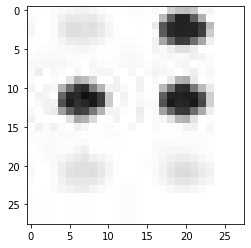

In [101]:
from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
names = le.fit_transform(name)
images = image/255

plt.imshow(image[0])

In [102]:
from sklearn.model_selection import train_test_split

X = images;
y = names;
rs = 123

def dataSplit(y,X,train_size, rs = 123):
    X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = train_size, random_state=rs,shuffle=True)
    return (X_train,X_test,y_train,y_test)

In [103]:
from keras.models import Sequential
from keras.layers import Conv2D, Dense, Dropout, LayerNormalization, BatchNormalization, Flatten, MaxPooling2D
import math

def normalizeModel(model, batch=False):
    if(batch):
        return model.add(BatchNormalization())
    else:
        return model.add(LayerNormalization())

def buildModel(activation,optimizer,normalize=False,batch=False):   
    model = Sequential()

    model.add(Conv2D(128, kernel_size = 3, activation=activation, padding='same',input_shape=(28,28,3)))
    model.add(Conv2D(128, kernel_size = 3, activation=activation, padding='same'))
    model.add(Dropout(.75))
    if(normalize):
        normalizeModel(model,batch)
    model.add(MaxPooling2D(2))
    model.add(Conv2D(128,  kernel_size = 3,activation=activation, padding='same'))
    model.add(Dropout(.50))
    if(normalize):
        normalizeModel(model,batch)
    model.add(MaxPooling2D(2))
    model.add(Conv2D(128,  kernel_size = 3,activation=activation, padding='same'))
    model.add(Dropout(.25))
    if(normalize):
        normalizeModel(model,batch)
    model.add(Flatten())
    model.add(Dense(1000, activation=activation))
    model.add(Dense(500, activation=activation))
    model.add(Dense(250, activation=activation))
    model.add(Dense(125, activation = activation))
    model.add(Dense(26, activation='softmax'))
    model.compile(optimizer=optimizer, loss='SparseCategoricalCrossentropy', metrics=["sparse_categorical_accuracy"])
    return model


In [104]:

X = images;
y = names;


def fitModel(X,y,modelType,name):
  distributions = []
  for k in range(10):
    train_data = .25
    incrementT = .05
    epochs = 20
    incrementE = 20
    for i in range(14):
        (X_train,X_test,y_train,y_test) = dataSplit(y,X,train_data)
        firstModel = modelType.fit(X_train,y_train, validation_split=.33, epochs=10,verbose=0,shuffle=True)
  
        plt.plot(firstModel.history['loss'])
        plt.plot(firstModel.history['val_loss'])
        plt.title('{} {} epochs, {} split'.format(name,epochs,train_data))
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.show()

        plt.plot(firstModel.history['val_sparse_categorical_accuracy'])
        plt.plot(firstModel.history['sparse_categorical_accuracy'])
        plt.title('{} {} epochs, {} split'.format(name,epochs,train_data))
        plt.xlabel('Epochs')
        plt.ylabel('Accuracy')
        plt.show()
        print("Generation {}: \nTest Data:{}, \nEpochs:{}, \nTrain/Test Split:{}".format(k+1,model.evaluate(X_test,y_test),epochs,train_data))

        train_data += incrementT
        epochs += incrementE
        distributions.append(model.evaluate(X_test,y_test))
      
(X,X_Test_Final,y,y_Test_Final) = dataSplit(y,X,.80)

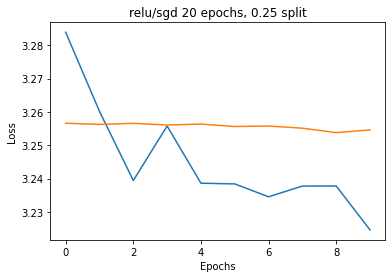

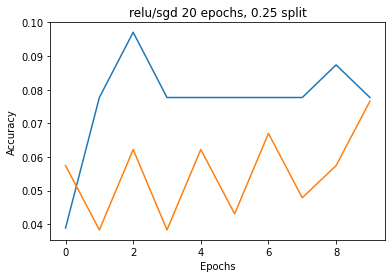

30/30 [==============================] - 0s 4ms/step - loss: 3.2614 - sparse_categorical_accuracy: 0.0299
Generation 1: 
Test Data:[3.261427164077759, 0.029914529994130135], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 3.2614 - sparse_categorical_accuracy: 0.0299


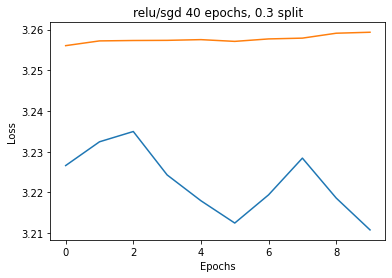

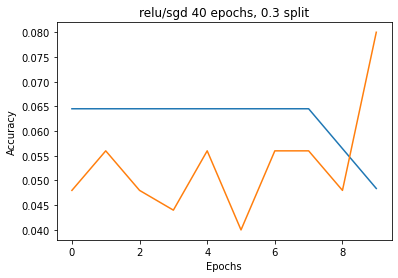

28/28 [==============================] - 0s 4ms/step - loss: 3.2641 - sparse_categorical_accuracy: 0.0320
Generation 1: 
Test Data:[3.2640743255615234, 0.032036613672971725], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 3.2641 - sparse_categorical_accuracy: 0.0320


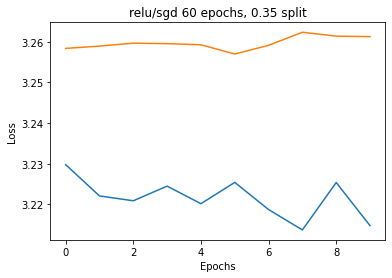

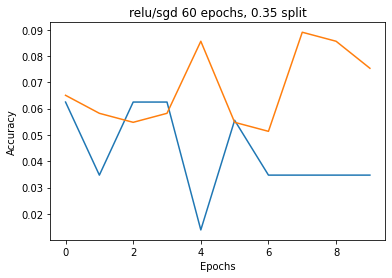

26/26 [==============================] - 0s 4ms/step - loss: 3.2630 - sparse_categorical_accuracy: 0.0419
Generation 1: 
Test Data:[3.2630019187927246, 0.041871920228004456], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 3.2630 - sparse_categorical_accuracy: 0.0419


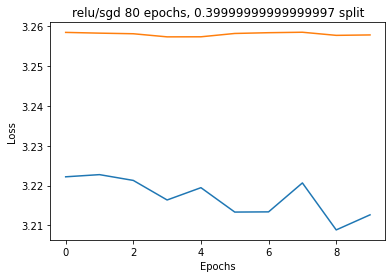

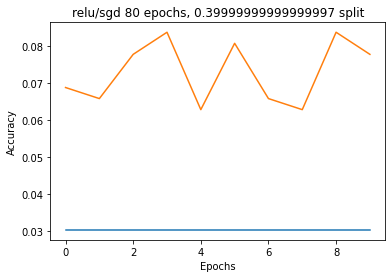

24/24 [==============================] - 0s 4ms/step - loss: 3.2641 - sparse_categorical_accuracy: 0.0414
Generation 1: 
Test Data:[3.264108657836914, 0.04138851910829544], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 3.2641 - sparse_categorical_accuracy: 0.0414


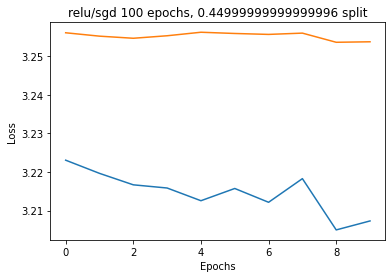

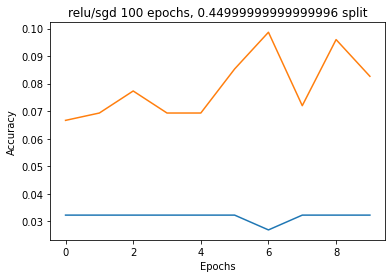

22/22 [==============================] - 0s 4ms/step - loss: 3.2638 - sparse_categorical_accuracy: 0.0422
Generation 1: 
Test Data:[3.263762950897217, 0.04221251979470253], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 3.2638 - sparse_categorical_accuracy: 0.0422


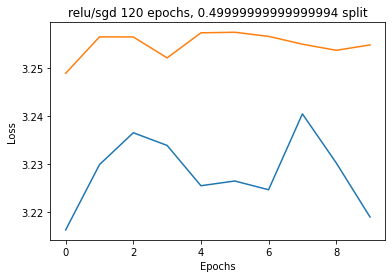

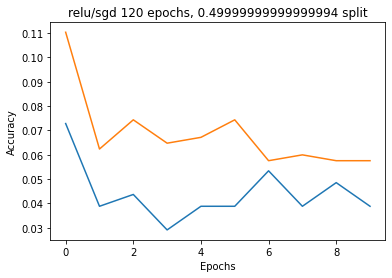

20/20 [==============================] - 0s 4ms/step - loss: 3.2613 - sparse_categorical_accuracy: 0.0416
Generation 1: 
Test Data:[3.2613117694854736, 0.041600000113248825], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 3.2613 - sparse_categorical_accuracy: 0.0416


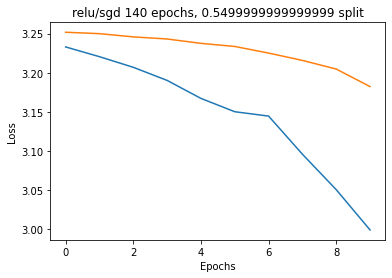

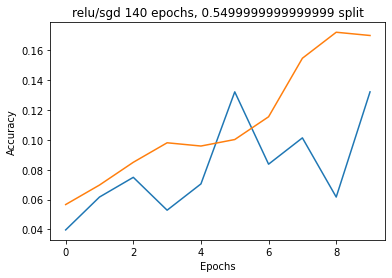

18/18 [==============================] - 0s 4ms/step - loss: 3.1982 - sparse_categorical_accuracy: 0.1139
Generation 1: 
Test Data:[3.198237180709839, 0.1138790026307106], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 3.1982 - sparse_categorical_accuracy: 0.1139


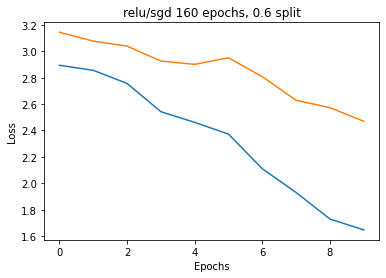

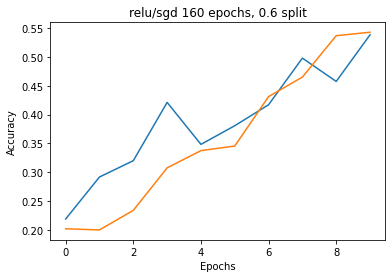

16/16 [==============================] - 0s 4ms/step - loss: 2.5309 - sparse_categorical_accuracy: 0.5220
Generation 1: 
Test Data:[2.5309066772460938, 0.5220000147819519], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 2.5309 - sparse_categorical_accuracy: 0.5220


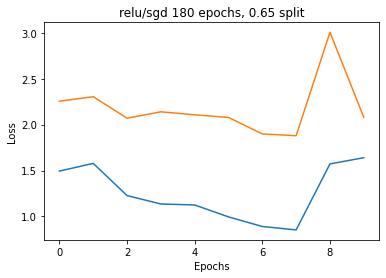

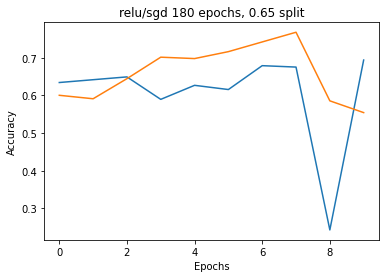

14/14 [==============================] - 0s 4ms/step - loss: 2.1605 - sparse_categorical_accuracy: 0.6568
Generation 1: 
Test Data:[2.1605141162872314, 0.6567505598068237], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 2.1605 - sparse_categorical_accuracy: 0.6568


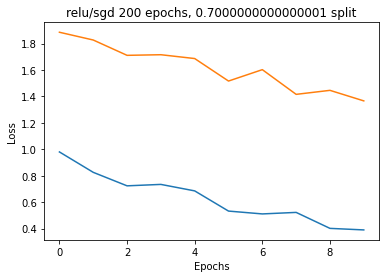

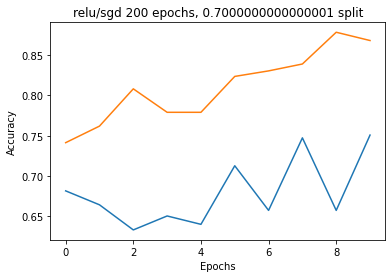

12/12 [==============================] - 0s 4ms/step - loss: 1.4391 - sparse_categorical_accuracy: 0.7520
Generation 1: 
Test Data:[1.4390677213668823, 0.7519999742507935], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 1.4391 - sparse_categorical_accuracy: 0.7520


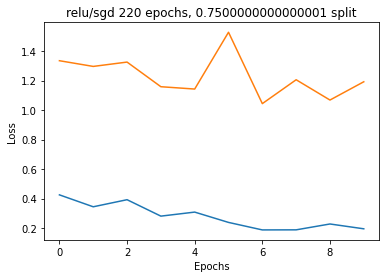

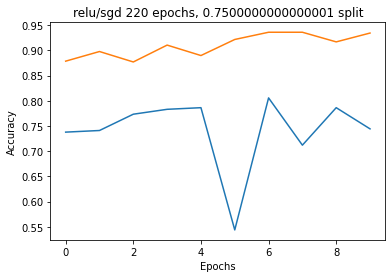

10/10 [==============================] - 0s 4ms/step - loss: 1.3266 - sparse_categorical_accuracy: 0.7244
Generation 1: 
Test Data:[1.326578974723816, 0.7243589758872986], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 1.3266 - sparse_categorical_accuracy: 0.7244


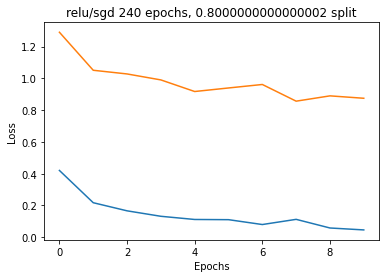

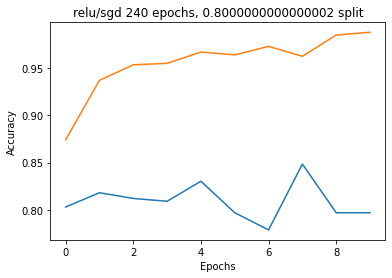

8/8 [==============================] - 0s 5ms/step - loss: 1.0029 - sparse_categorical_accuracy: 0.7720
Generation 1: 
Test Data:[1.002897024154663, 0.7720000147819519], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 1.0029 - sparse_categorical_accuracy: 0.7720


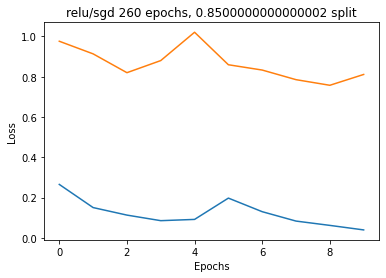

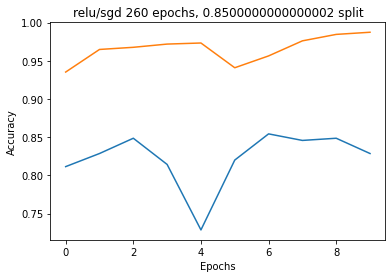

6/6 [==============================] - 0s 4ms/step - loss: 0.9101 - sparse_categorical_accuracy: 0.8085
Generation 1: 
Test Data:[0.9101203680038452, 0.8085106611251831], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.9101 - sparse_categorical_accuracy: 0.8085


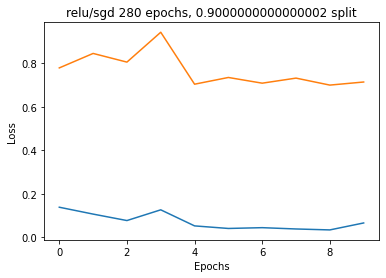

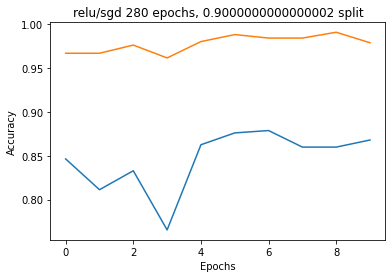

4/4 [==============================] - 0s 5ms/step - loss: 0.8597 - sparse_categorical_accuracy: 0.8320
Generation 1: 
Test Data:[0.8597177863121033, 0.8320000171661377], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.8597 - sparse_categorical_accuracy: 0.8320


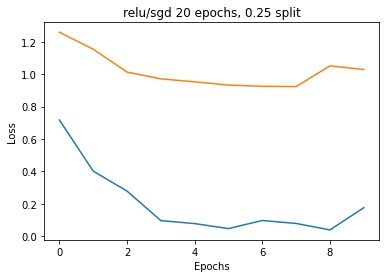

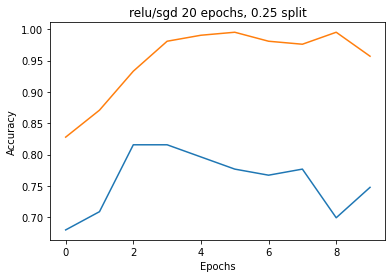

30/30 [==============================] - 0s 4ms/step - loss: 0.7583 - sparse_categorical_accuracy: 0.8675
Generation 2: 
Test Data:[0.7582868337631226, 0.867521345615387], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.7583 - sparse_categorical_accuracy: 0.8675


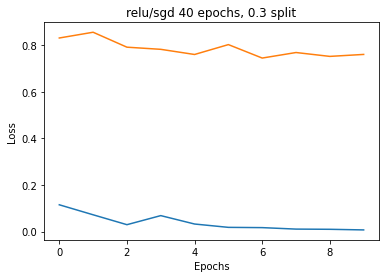

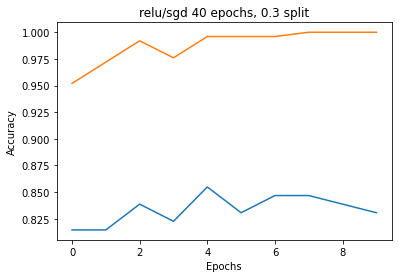

28/28 [==============================] - 0s 4ms/step - loss: 0.5818 - sparse_categorical_accuracy: 0.9050
Generation 2: 
Test Data:[0.5818049311637878, 0.9050343036651611], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.5818 - sparse_categorical_accuracy: 0.9050


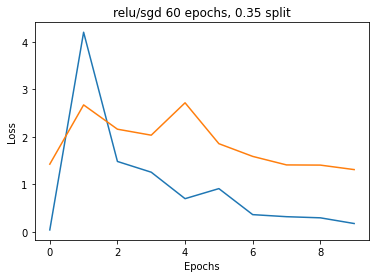

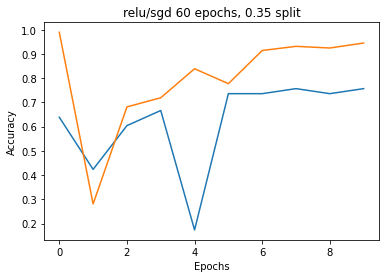

26/26 [==============================] - 0s 4ms/step - loss: 1.2541 - sparse_categorical_accuracy: 0.8362
Generation 2: 
Test Data:[1.2540779113769531, 0.8362069129943848], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 1.2541 - sparse_categorical_accuracy: 0.8362


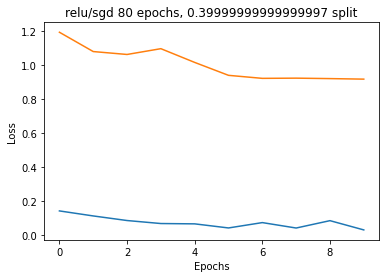

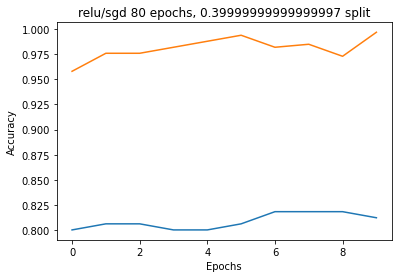

24/24 [==============================] - 0s 4ms/step - loss: 0.9050 - sparse_categorical_accuracy: 0.8491
Generation 2: 
Test Data:[0.9050401449203491, 0.8491321802139282], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.9050 - sparse_categorical_accuracy: 0.8491


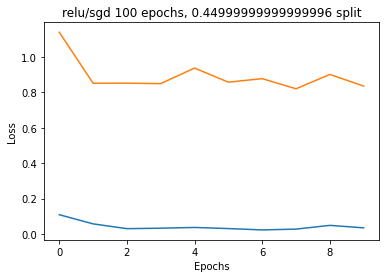

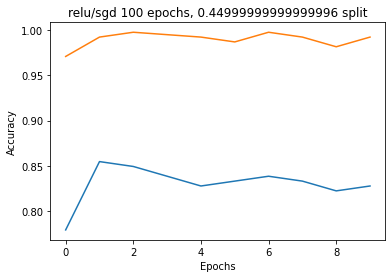

22/22 [==============================] - 0s 4ms/step - loss: 0.8056 - sparse_categorical_accuracy: 0.8588
Generation 2: 
Test Data:[0.8055958151817322, 0.8588064312934875], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.8056 - sparse_categorical_accuracy: 0.8588


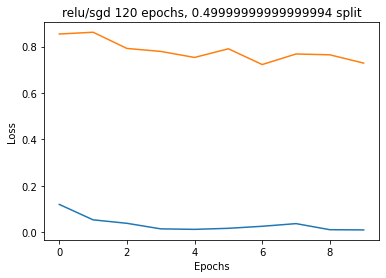

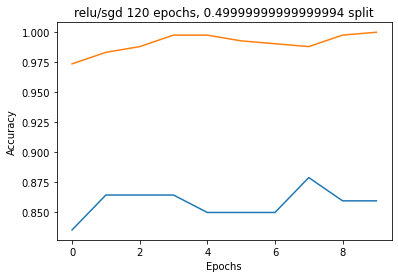

20/20 [==============================] - 0s 4ms/step - loss: 0.7232 - sparse_categorical_accuracy: 0.8704
Generation 2: 
Test Data:[0.7231616973876953, 0.8704000115394592], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.7232 - sparse_categorical_accuracy: 0.8704


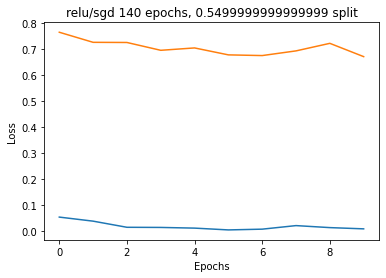

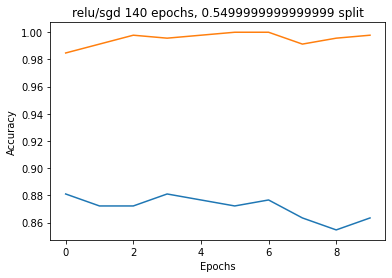

18/18 [==============================] - 0s 4ms/step - loss: 0.6852 - sparse_categorical_accuracy: 0.8612
Generation 2: 
Test Data:[0.685155987739563, 0.8612099885940552], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.6852 - sparse_categorical_accuracy: 0.8612


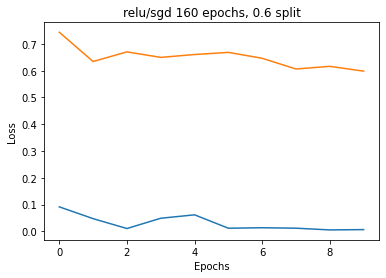

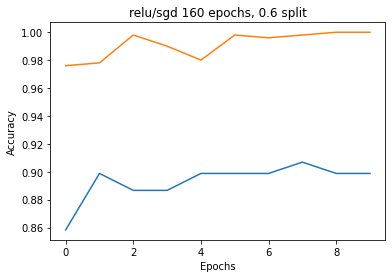

16/16 [==============================] - 0s 4ms/step - loss: 0.6380 - sparse_categorical_accuracy: 0.8880
Generation 2: 
Test Data:[0.6380441784858704, 0.8880000114440918], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.6380 - sparse_categorical_accuracy: 0.8880


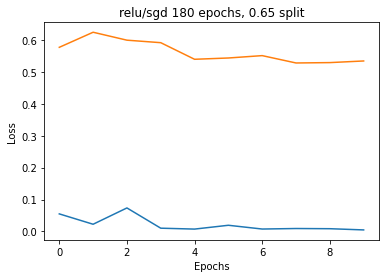

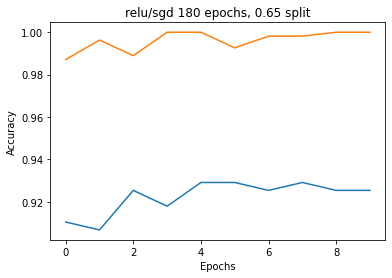

14/14 [==============================] - 0s 4ms/step - loss: 0.6180 - sparse_categorical_accuracy: 0.9085
Generation 2: 
Test Data:[0.6179860830307007, 0.9084668159484863], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.6180 - sparse_categorical_accuracy: 0.9085


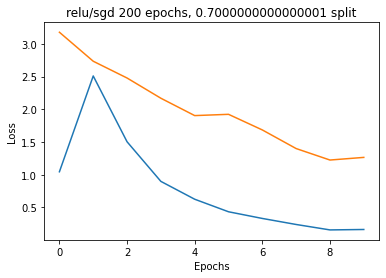

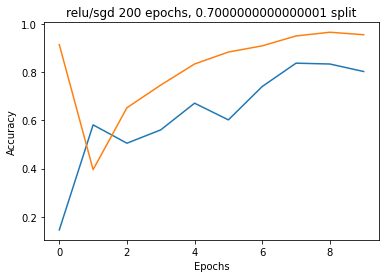

12/12 [==============================] - 0s 4ms/step - loss: 1.2755 - sparse_categorical_accuracy: 0.8187
Generation 2: 
Test Data:[1.2755333185195923, 0.8186666369438171], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 1.2755 - sparse_categorical_accuracy: 0.8187


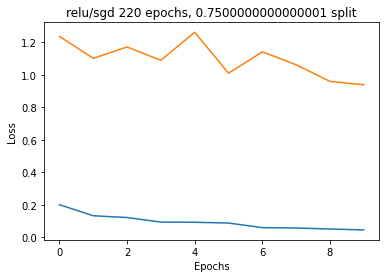

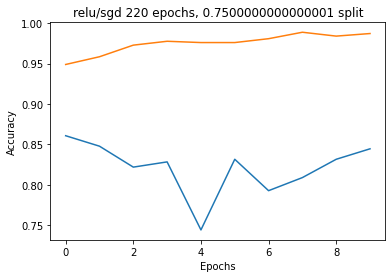

10/10 [==============================] - 0s 4ms/step - loss: 0.9638 - sparse_categorical_accuracy: 0.8301
Generation 2: 
Test Data:[0.9638375639915466, 0.8301281929016113], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.9638 - sparse_categorical_accuracy: 0.8301


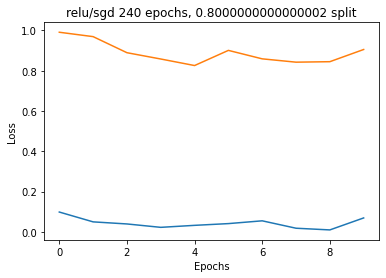

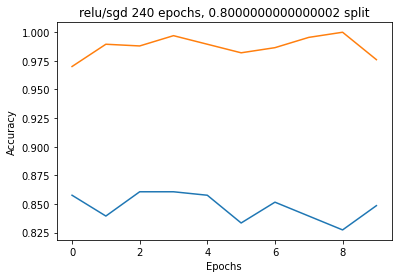

8/8 [==============================] - 0s 4ms/step - loss: 1.0120 - sparse_categorical_accuracy: 0.8240
Generation 2: 
Test Data:[1.0119673013687134, 0.8240000009536743], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 1.0120 - sparse_categorical_accuracy: 0.8240


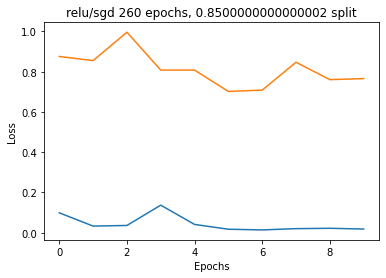

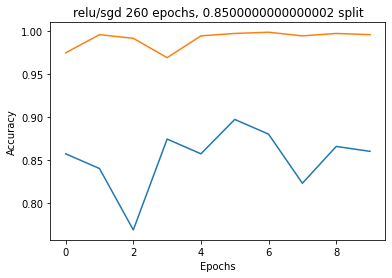

6/6 [==============================] - 0s 5ms/step - loss: 0.8999 - sparse_categorical_accuracy: 0.8085
Generation 2: 
Test Data:[0.899940550327301, 0.8085106611251831], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 5ms/step - loss: 0.8999 - sparse_categorical_accuracy: 0.8085


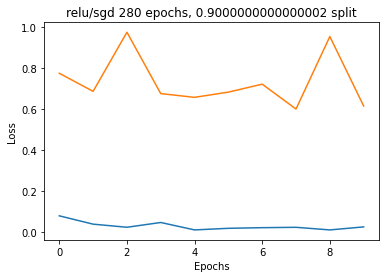

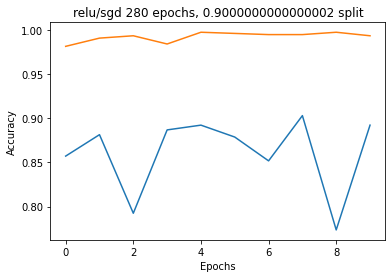

4/4 [==============================] - 0s 7ms/step - loss: 0.7954 - sparse_categorical_accuracy: 0.8240
Generation 2: 
Test Data:[0.7954012155532837, 0.8240000009536743], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.7954 - sparse_categorical_accuracy: 0.8240


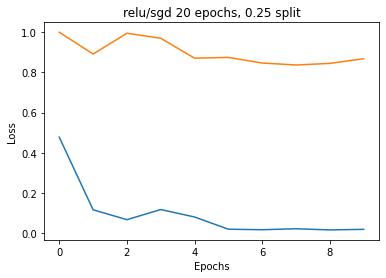

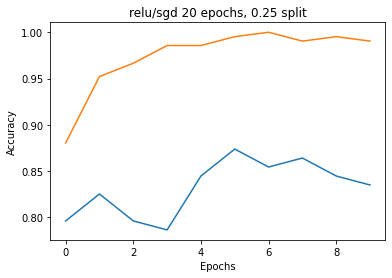

30/30 [==============================] - 0s 4ms/step - loss: 0.6027 - sparse_categorical_accuracy: 0.9402
Generation 3: 
Test Data:[0.6026769876480103, 0.94017094373703], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.6027 - sparse_categorical_accuracy: 0.9402


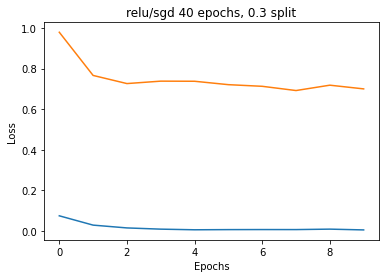

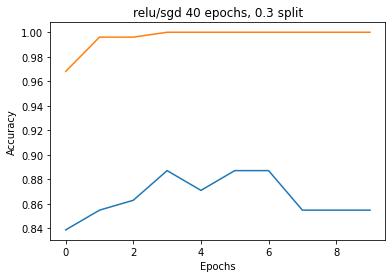

28/28 [==============================] - 0s 4ms/step - loss: 0.5122 - sparse_categorical_accuracy: 0.9474
Generation 3: 
Test Data:[0.512161374092102, 0.9473684430122375], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.5122 - sparse_categorical_accuracy: 0.9474


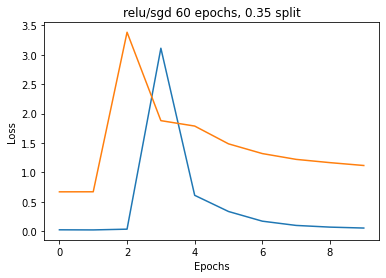

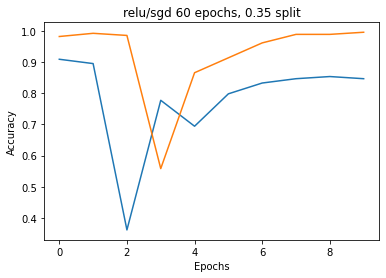

26/26 [==============================] - 0s 4ms/step - loss: 1.0630 - sparse_categorical_accuracy: 0.8867
Generation 3: 
Test Data:[1.0630141496658325, 0.8866994976997375], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 5ms/step - loss: 1.0630 - sparse_categorical_accuracy: 0.8867


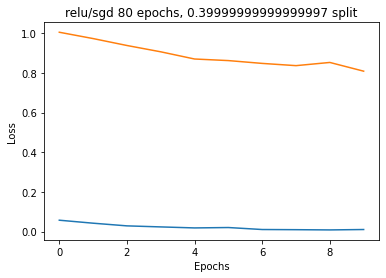

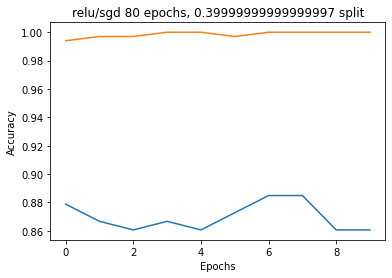

24/24 [==============================] - 0s 4ms/step - loss: 0.7661 - sparse_categorical_accuracy: 0.8879
Generation 3: 
Test Data:[0.7660738229751587, 0.8878504633903503], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.7661 - sparse_categorical_accuracy: 0.8879


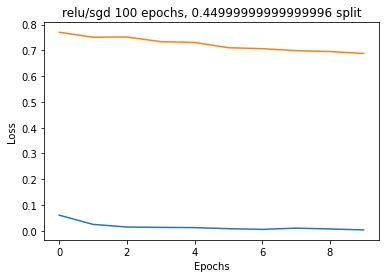

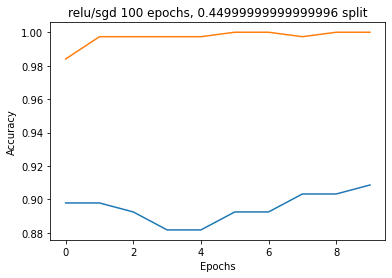

22/22 [==============================] - 0s 4ms/step - loss: 0.6526 - sparse_categorical_accuracy: 0.9185
Generation 3: 
Test Data:[0.652618408203125, 0.9184861779212952], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.6526 - sparse_categorical_accuracy: 0.9185


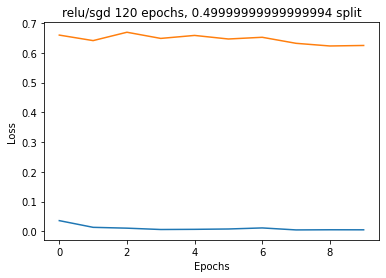

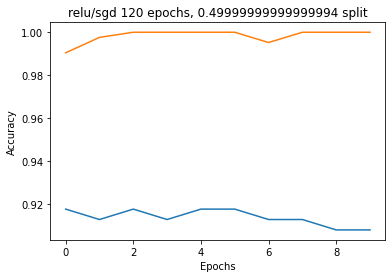

20/20 [==============================] - 0s 4ms/step - loss: 0.6112 - sparse_categorical_accuracy: 0.9088
Generation 3: 
Test Data:[0.6111891865730286, 0.9088000059127808], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.6112 - sparse_categorical_accuracy: 0.9088


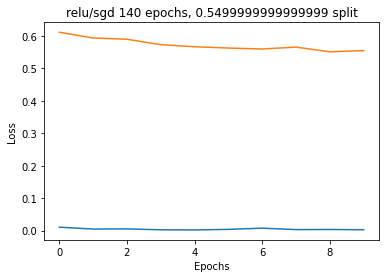

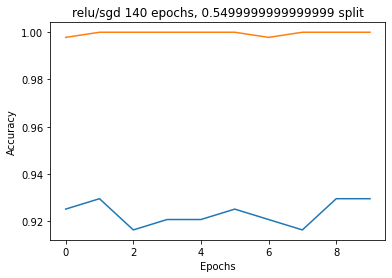

18/18 [==============================] - 0s 4ms/step - loss: 0.5594 - sparse_categorical_accuracy: 0.9199
Generation 3: 
Test Data:[0.5594131350517273, 0.9199288487434387], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.5594 - sparse_categorical_accuracy: 0.9199


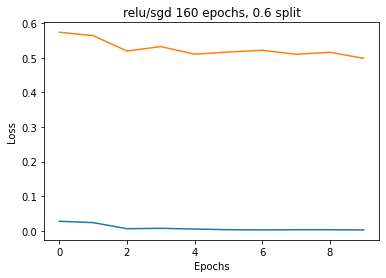

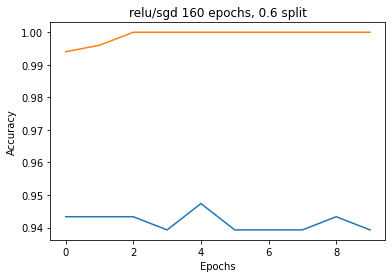

16/16 [==============================] - 0s 4ms/step - loss: 0.5320 - sparse_categorical_accuracy: 0.9120
Generation 3: 
Test Data:[0.5319918990135193, 0.9120000004768372], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.5320 - sparse_categorical_accuracy: 0.9120


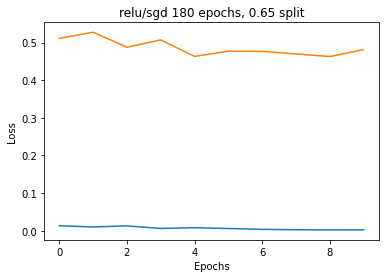

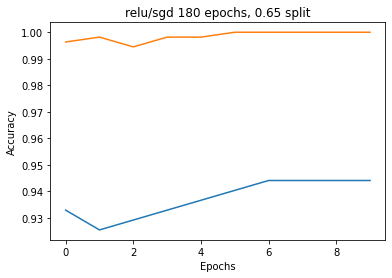

14/14 [==============================] - 0s 4ms/step - loss: 0.5495 - sparse_categorical_accuracy: 0.9085
Generation 3: 
Test Data:[0.5495198965072632, 0.9084668159484863], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.5495 - sparse_categorical_accuracy: 0.9085


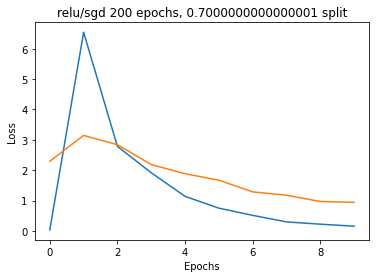

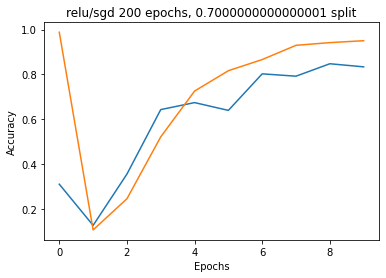

12/12 [==============================] - 0s 4ms/step - loss: 1.0089 - sparse_categorical_accuracy: 0.8213
Generation 3: 
Test Data:[1.0089037418365479, 0.8213333487510681], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 1.0089 - sparse_categorical_accuracy: 0.8213


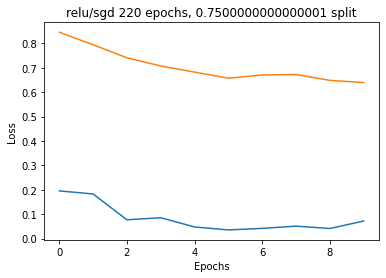

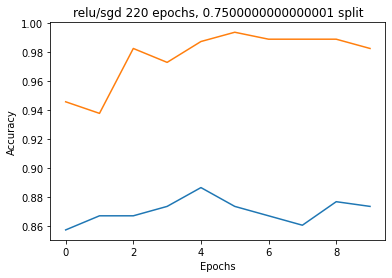

10/10 [==============================] - 0s 4ms/step - loss: 0.6983 - sparse_categorical_accuracy: 0.8526
Generation 3: 
Test Data:[0.6983229517936707, 0.8525640964508057], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.6983 - sparse_categorical_accuracy: 0.8526


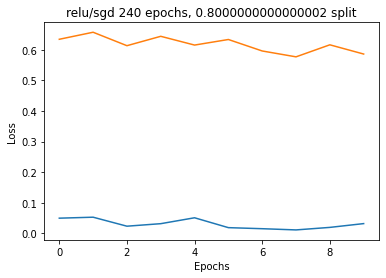

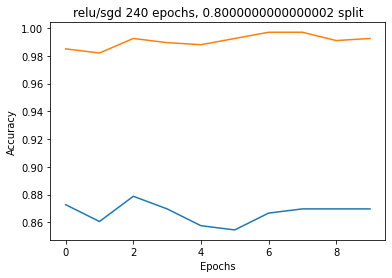

8/8 [==============================] - 0s 5ms/step - loss: 0.6809 - sparse_categorical_accuracy: 0.8480
Generation 3: 
Test Data:[0.6808846592903137, 0.8479999899864197], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.6809 - sparse_categorical_accuracy: 0.8480


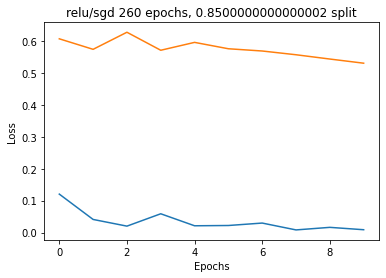

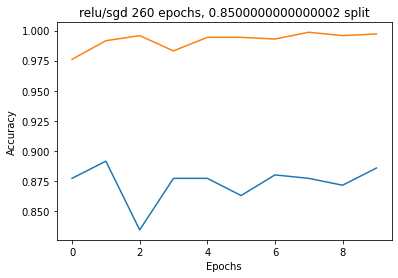

6/6 [==============================] - 0s 5ms/step - loss: 0.6764 - sparse_categorical_accuracy: 0.8457
Generation 3: 
Test Data:[0.676435649394989, 0.8457446694374084], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 6ms/step - loss: 0.6764 - sparse_categorical_accuracy: 0.8457


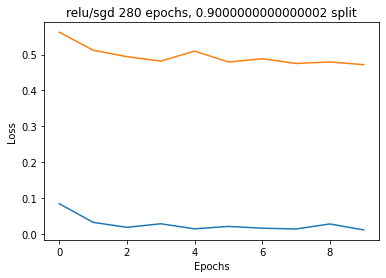

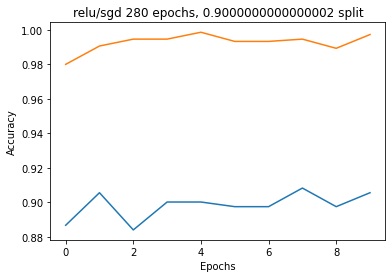

4/4 [==============================] - 0s 7ms/step - loss: 0.6530 - sparse_categorical_accuracy: 0.8160
Generation 3: 
Test Data:[0.6530300378799438, 0.8159999847412109], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.6530 - sparse_categorical_accuracy: 0.8160


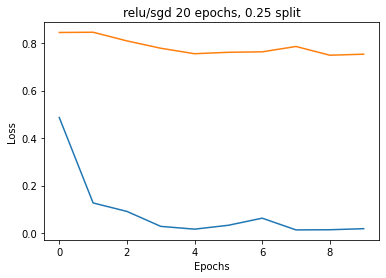

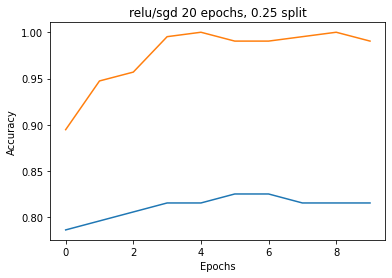

30/30 [==============================] - 0s 4ms/step - loss: 0.3666 - sparse_categorical_accuracy: 0.9669
Generation 4: 
Test Data:[0.36664092540740967, 0.9668803215026855], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.3666 - sparse_categorical_accuracy: 0.9669


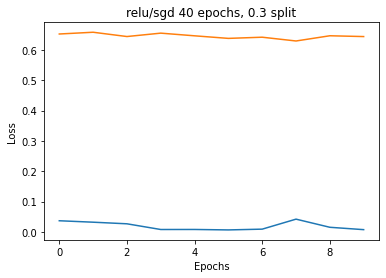

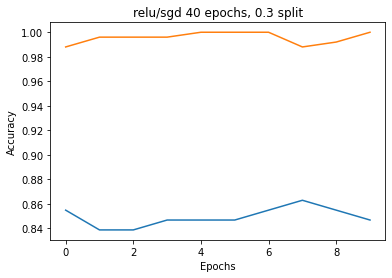

28/28 [==============================] - 0s 4ms/step - loss: 0.3587 - sparse_categorical_accuracy: 0.9600
Generation 4: 
Test Data:[0.35867658257484436, 0.9599542617797852], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.3587 - sparse_categorical_accuracy: 0.9600


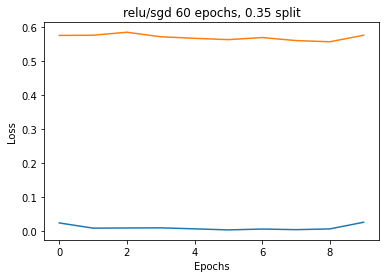

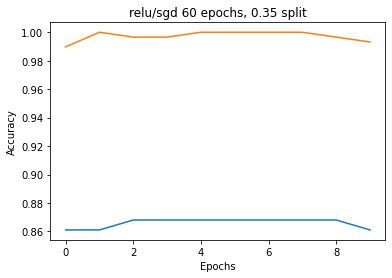

26/26 [==============================] - 0s 4ms/step - loss: 0.3389 - sparse_categorical_accuracy: 0.9606
Generation 4: 
Test Data:[0.3388735353946686, 0.9605911374092102], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.3389 - sparse_categorical_accuracy: 0.9606


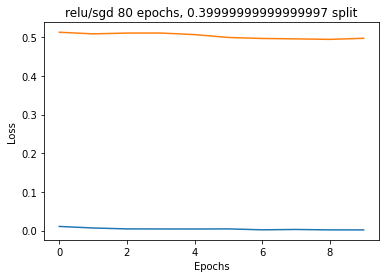

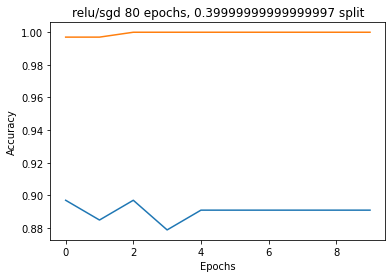

24/24 [==============================] - 0s 4ms/step - loss: 0.3226 - sparse_categorical_accuracy: 0.9573
Generation 4: 
Test Data:[0.3225938081741333, 0.9572763442993164], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.3226 - sparse_categorical_accuracy: 0.9573


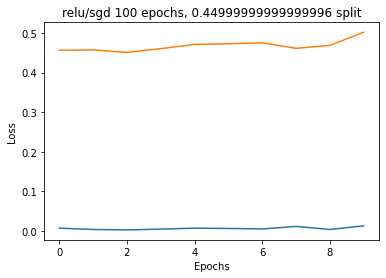

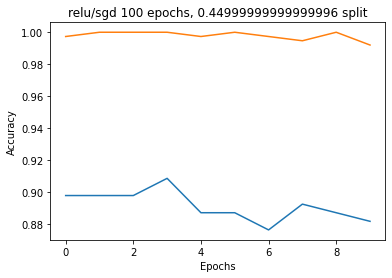

22/22 [==============================] - 0s 4ms/step - loss: 0.3472 - sparse_categorical_accuracy: 0.9403
Generation 4: 
Test Data:[0.3472207486629486, 0.9403202533721924], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.3472 - sparse_categorical_accuracy: 0.9403


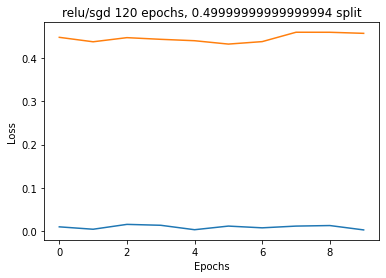

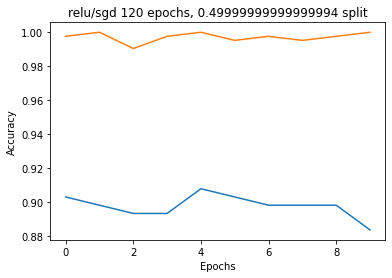

20/20 [==============================] - 0s 4ms/step - loss: 0.3311 - sparse_categorical_accuracy: 0.9536
Generation 4: 
Test Data:[0.331116646528244, 0.9535999894142151], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.3311 - sparse_categorical_accuracy: 0.9536


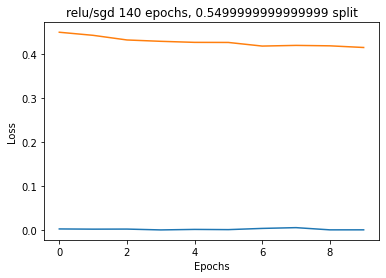

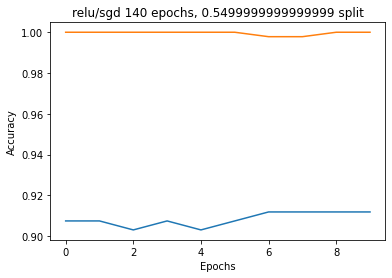

18/18 [==============================] - 0s 4ms/step - loss: 0.3167 - sparse_categorical_accuracy: 0.9502
Generation 4: 
Test Data:[0.3166913688182831, 0.9501779079437256], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 5ms/step - loss: 0.3167 - sparse_categorical_accuracy: 0.9502


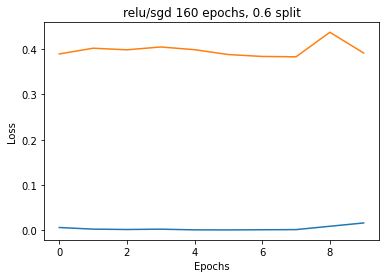

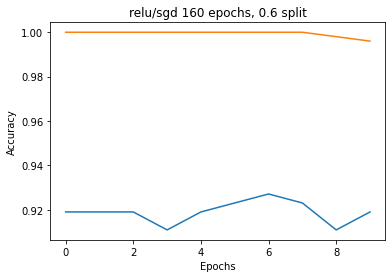

16/16 [==============================] - 0s 5ms/step - loss: 0.3198 - sparse_categorical_accuracy: 0.9420
Generation 4: 
Test Data:[0.3197915852069855, 0.9419999718666077], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.3198 - sparse_categorical_accuracy: 0.9420


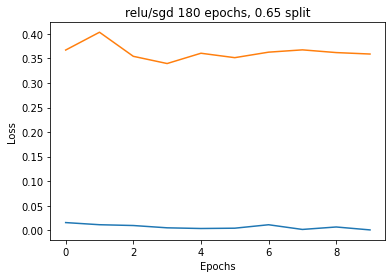

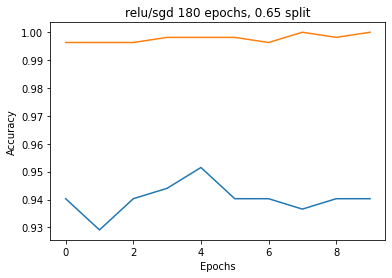

14/14 [==============================] - 0s 4ms/step - loss: 0.3253 - sparse_categorical_accuracy: 0.9405
Generation 4: 
Test Data:[0.325283944606781, 0.9405034184455872], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.3253 - sparse_categorical_accuracy: 0.9405


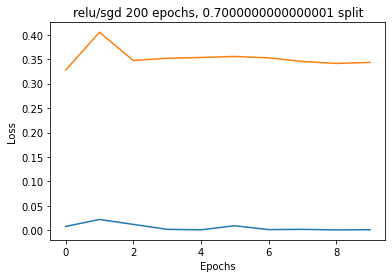

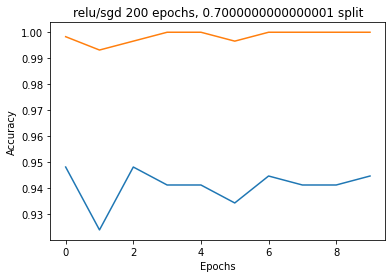

12/12 [==============================] - 0s 5ms/step - loss: 0.3229 - sparse_categorical_accuracy: 0.9387
Generation 4: 
Test Data:[0.3229227066040039, 0.9386666417121887], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.3229 - sparse_categorical_accuracy: 0.9387


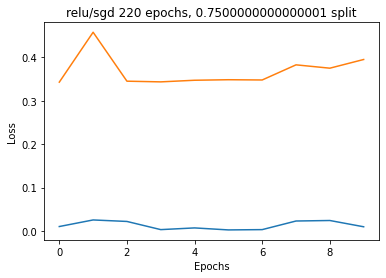

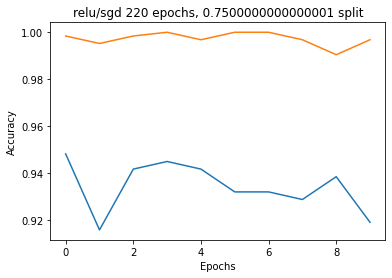

10/10 [==============================] - 0s 4ms/step - loss: 0.4013 - sparse_categorical_accuracy: 0.9263
Generation 4: 
Test Data:[0.4013082981109619, 0.9262820482254028], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.4013 - sparse_categorical_accuracy: 0.9263


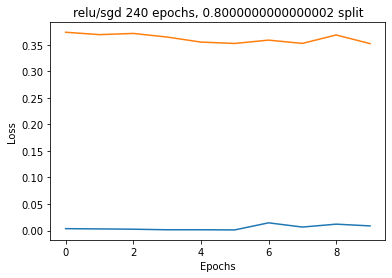

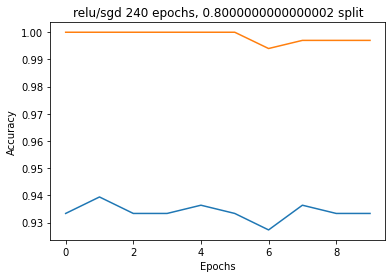

8/8 [==============================] - 0s 4ms/step - loss: 0.4194 - sparse_categorical_accuracy: 0.9000
Generation 4: 
Test Data:[0.4193740785121918, 0.8999999761581421], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.4194 - sparse_categorical_accuracy: 0.9000


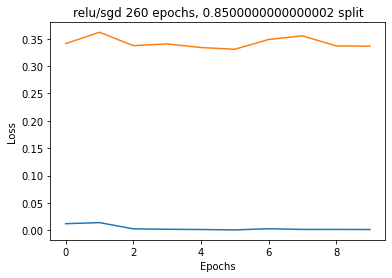

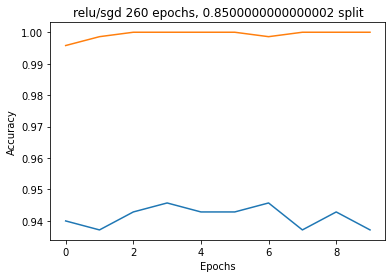

6/6 [==============================] - 0s 5ms/step - loss: 0.4658 - sparse_categorical_accuracy: 0.8989
Generation 4: 
Test Data:[0.4658495783805847, 0.8989361524581909], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.4658 - sparse_categorical_accuracy: 0.8989


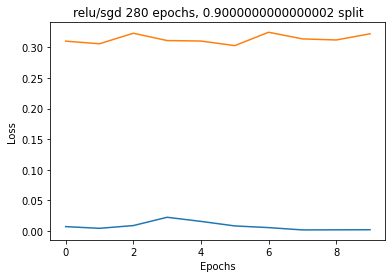

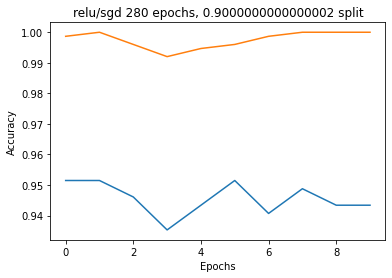

4/4 [==============================] - 0s 5ms/step - loss: 0.5349 - sparse_categorical_accuracy: 0.8640
Generation 4: 
Test Data:[0.5348783135414124, 0.8640000224113464], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.5349 - sparse_categorical_accuracy: 0.8640


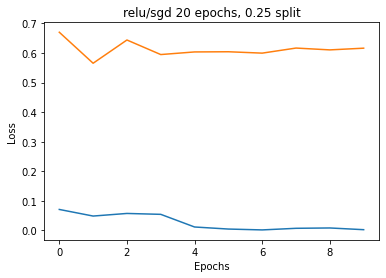

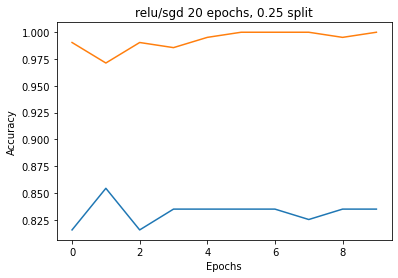

30/30 [==============================] - 0s 4ms/step - loss: 0.2364 - sparse_categorical_accuracy: 0.9733
Generation 5: 
Test Data:[0.23642434179782867, 0.9732906222343445], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.2364 - sparse_categorical_accuracy: 0.9733


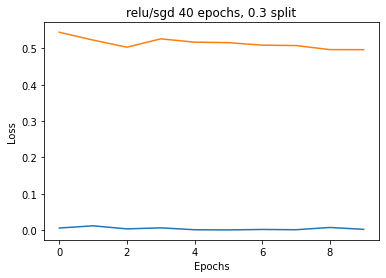

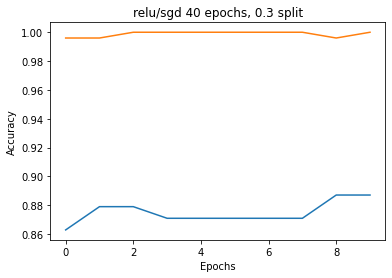

28/28 [==============================] - 0s 4ms/step - loss: 0.2074 - sparse_categorical_accuracy: 0.9783
Generation 5: 
Test Data:[0.20740057528018951, 0.97826087474823], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.2074 - sparse_categorical_accuracy: 0.9783


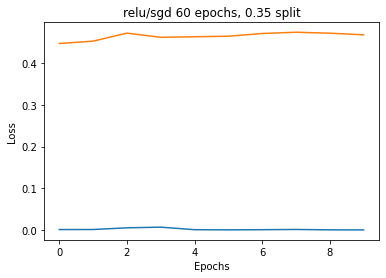

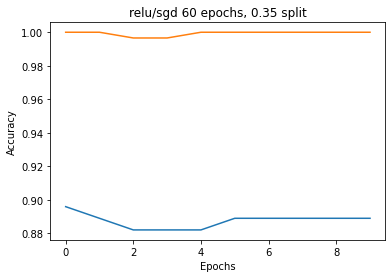

26/26 [==============================] - 0s 4ms/step - loss: 0.2194 - sparse_categorical_accuracy: 0.9778
Generation 5: 
Test Data:[0.21939273178577423, 0.9778324961662292], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.2194 - sparse_categorical_accuracy: 0.9778


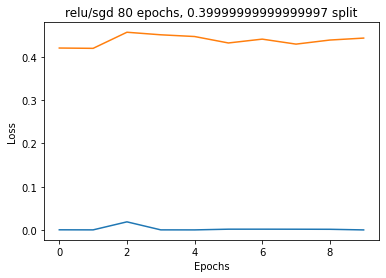

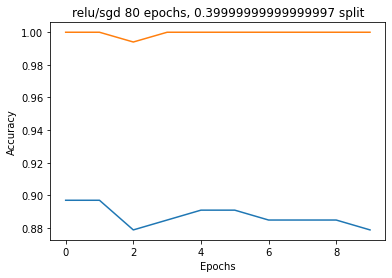

24/24 [==============================] - 0s 4ms/step - loss: 0.2167 - sparse_categorical_accuracy: 0.9773
Generation 5: 
Test Data:[0.21665465831756592, 0.9773030877113342], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.2167 - sparse_categorical_accuracy: 0.9773


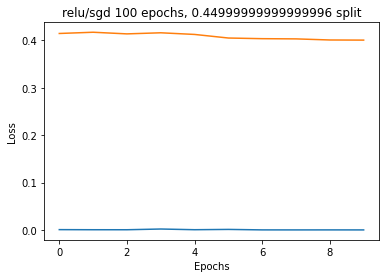

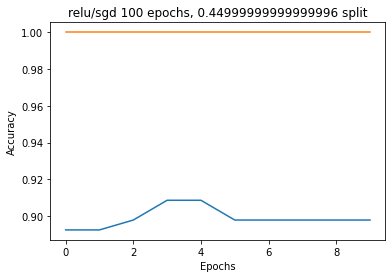

22/22 [==============================] - 0s 4ms/step - loss: 0.2236 - sparse_categorical_accuracy: 0.9738
Generation 5: 
Test Data:[0.22362227737903595, 0.9737991094589233], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.2236 - sparse_categorical_accuracy: 0.9738


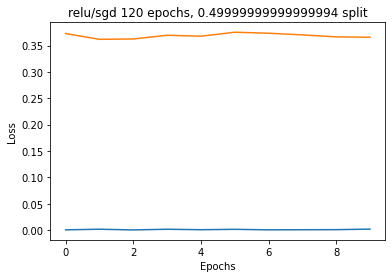

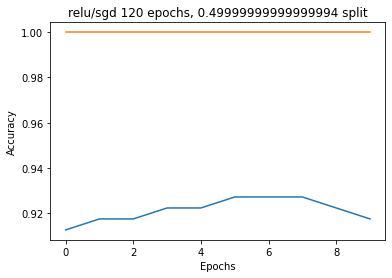

20/20 [==============================] - 0s 4ms/step - loss: 0.2220 - sparse_categorical_accuracy: 0.9760
Generation 5: 
Test Data:[0.22197557985782623, 0.9760000109672546], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.2220 - sparse_categorical_accuracy: 0.9760


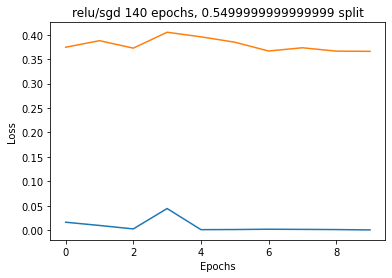

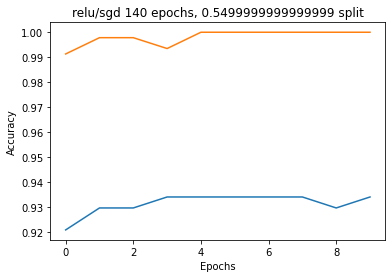

18/18 [==============================] - 0s 4ms/step - loss: 0.2475 - sparse_categorical_accuracy: 0.9662
Generation 5: 
Test Data:[0.2474849373102188, 0.9661921858787537], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.2475 - sparse_categorical_accuracy: 0.9662


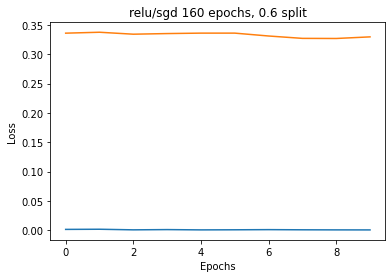

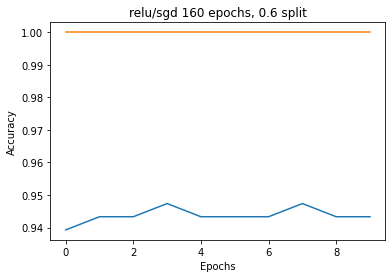

16/16 [==============================] - 0s 4ms/step - loss: 0.2411 - sparse_categorical_accuracy: 0.9660
Generation 5: 
Test Data:[0.2411445677280426, 0.9660000205039978], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.2411 - sparse_categorical_accuracy: 0.9660


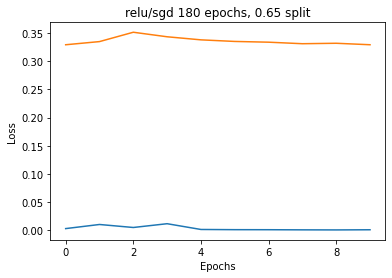

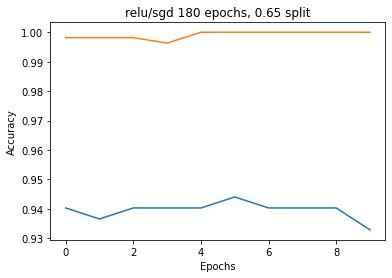

14/14 [==============================] - 0s 4ms/step - loss: 0.2725 - sparse_categorical_accuracy: 0.9611
Generation 5: 
Test Data:[0.27253055572509766, 0.9610983729362488], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.2725 - sparse_categorical_accuracy: 0.9611


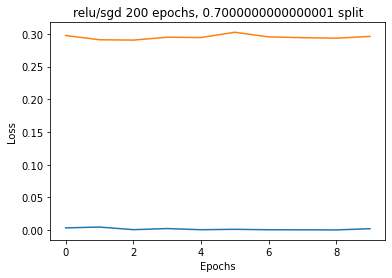

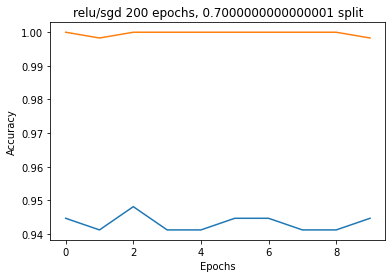

12/12 [==============================] - 0s 4ms/step - loss: 0.2674 - sparse_categorical_accuracy: 0.9627
Generation 5: 
Test Data:[0.26736563444137573, 0.9626666903495789], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.2674 - sparse_categorical_accuracy: 0.9627


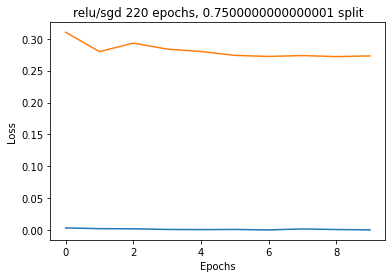

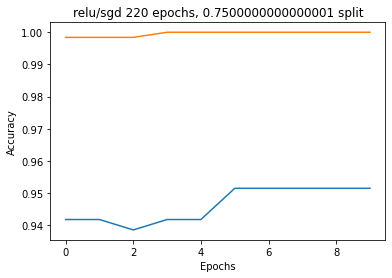

10/10 [==============================] - 0s 4ms/step - loss: 0.2786 - sparse_categorical_accuracy: 0.9423
Generation 5: 
Test Data:[0.27859586477279663, 0.942307710647583], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 5ms/step - loss: 0.2786 - sparse_categorical_accuracy: 0.9423


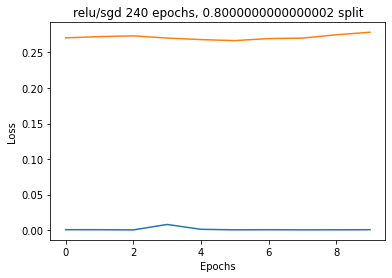

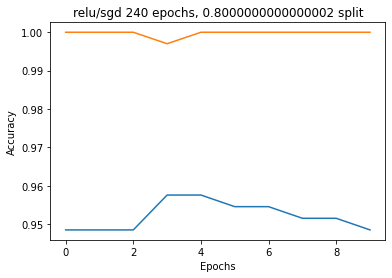

8/8 [==============================] - 0s 4ms/step - loss: 0.3389 - sparse_categorical_accuracy: 0.9240
Generation 5: 
Test Data:[0.338897168636322, 0.9240000247955322], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.3389 - sparse_categorical_accuracy: 0.9240


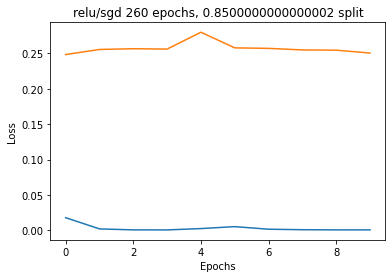

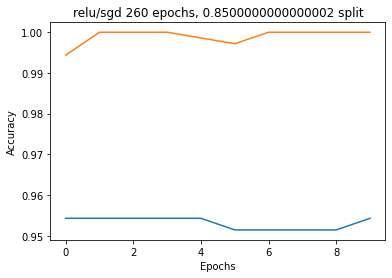

6/6 [==============================] - 0s 5ms/step - loss: 0.3743 - sparse_categorical_accuracy: 0.9202
Generation 5: 
Test Data:[0.3743078410625458, 0.9202127456665039], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.3743 - sparse_categorical_accuracy: 0.9202


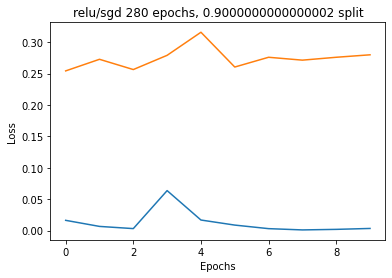

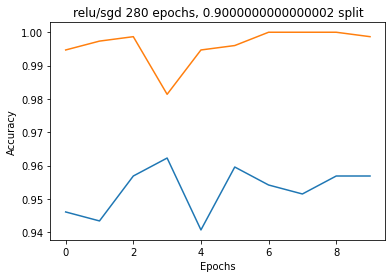

4/4 [==============================] - 0s 5ms/step - loss: 0.5284 - sparse_categorical_accuracy: 0.8640
Generation 5: 
Test Data:[0.5283960103988647, 0.8640000224113464], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.5284 - sparse_categorical_accuracy: 0.8640


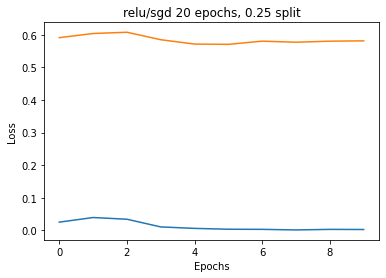

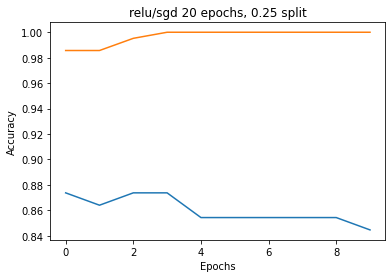

30/30 [==============================] - 0s 4ms/step - loss: 0.2016 - sparse_categorical_accuracy: 0.9776
Generation 6: 
Test Data:[0.20164766907691956, 0.9775640964508057], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.2016 - sparse_categorical_accuracy: 0.9776


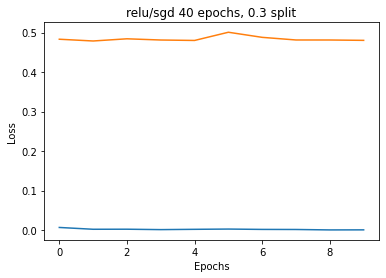

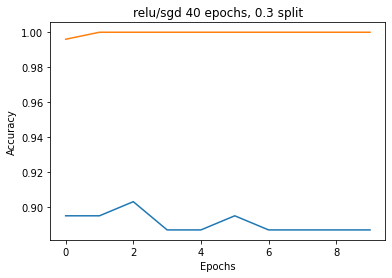

28/28 [==============================] - 0s 4ms/step - loss: 0.1995 - sparse_categorical_accuracy: 0.9771
Generation 6: 
Test Data:[0.19947092235088348, 0.9771167039871216], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.1995 - sparse_categorical_accuracy: 0.9771


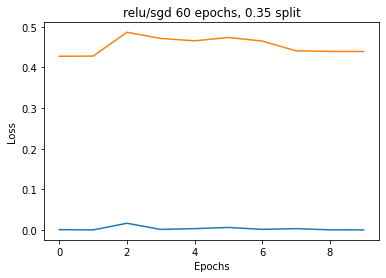

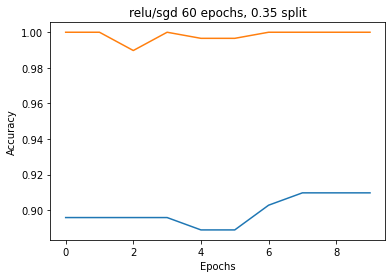

26/26 [==============================] - 0s 4ms/step - loss: 0.2064 - sparse_categorical_accuracy: 0.9729
Generation 6: 
Test Data:[0.20639224350452423, 0.9729064106941223], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.2064 - sparse_categorical_accuracy: 0.9729


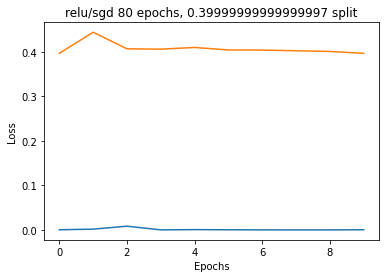

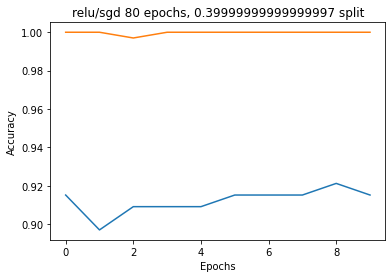

24/24 [==============================] - 0s 4ms/step - loss: 0.2185 - sparse_categorical_accuracy: 0.9693
Generation 6: 
Test Data:[0.21854674816131592, 0.969292402267456], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.2185 - sparse_categorical_accuracy: 0.9693


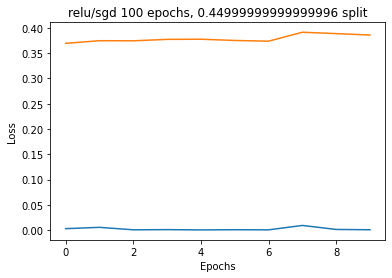

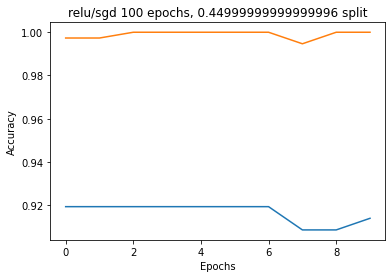

22/22 [==============================] - 0s 4ms/step - loss: 0.2311 - sparse_categorical_accuracy: 0.9680
Generation 6: 
Test Data:[0.23108816146850586, 0.9679766893386841], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.2311 - sparse_categorical_accuracy: 0.9680


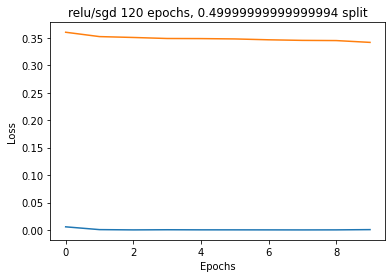

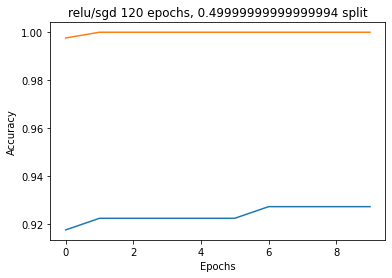

20/20 [==============================] - 0s 4ms/step - loss: 0.2178 - sparse_categorical_accuracy: 0.9680
Generation 6: 
Test Data:[0.21780961751937866, 0.9679999947547913], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.2178 - sparse_categorical_accuracy: 0.9680


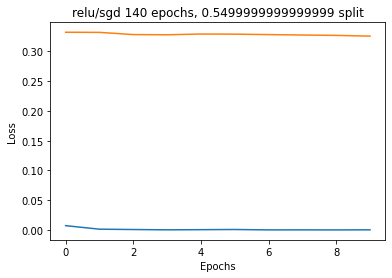

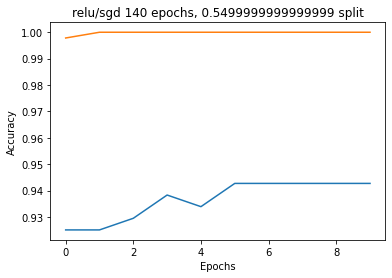

18/18 [==============================] - 0s 4ms/step - loss: 0.2232 - sparse_categorical_accuracy: 0.9644
Generation 6: 
Test Data:[0.22324229776859283, 0.9644128084182739], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.2232 - sparse_categorical_accuracy: 0.9644


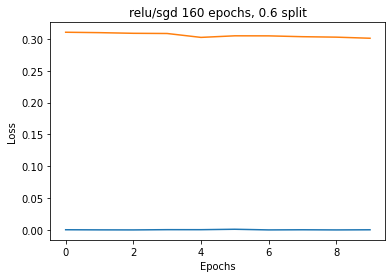

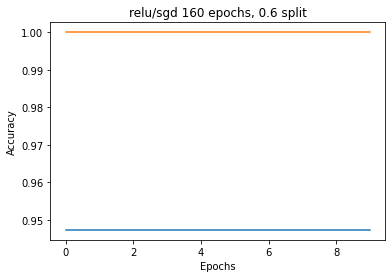

16/16 [==============================] - 0s 4ms/step - loss: 0.2237 - sparse_categorical_accuracy: 0.9620
Generation 6: 
Test Data:[0.22367987036705017, 0.9620000123977661], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 5ms/step - loss: 0.2237 - sparse_categorical_accuracy: 0.9620


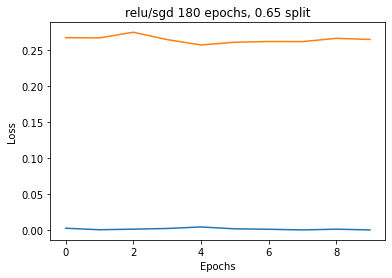

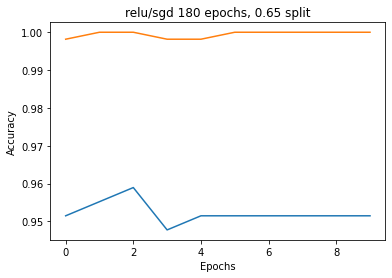

14/14 [==============================] - 0s 4ms/step - loss: 0.2152 - sparse_categorical_accuracy: 0.9657
Generation 6: 
Test Data:[0.21516652405261993, 0.9656750559806824], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.2152 - sparse_categorical_accuracy: 0.9657


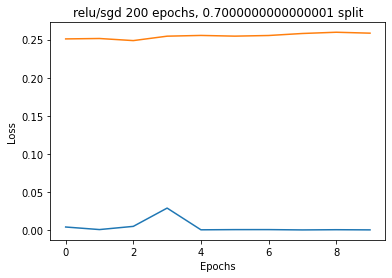

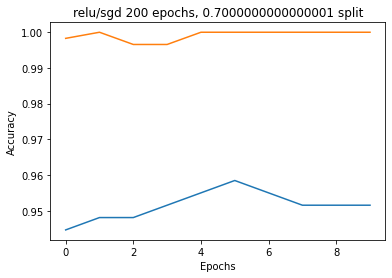

12/12 [==============================] - 0s 4ms/step - loss: 0.2324 - sparse_categorical_accuracy: 0.9547
Generation 6: 
Test Data:[0.2323598861694336, 0.9546666741371155], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.2324 - sparse_categorical_accuracy: 0.9547


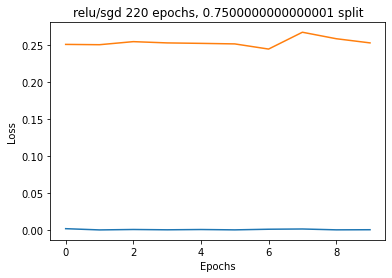

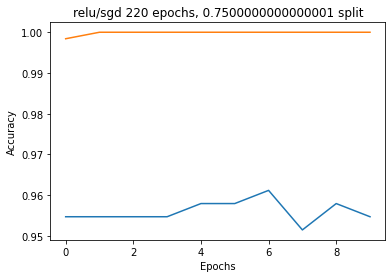

10/10 [==============================] - 0s 5ms/step - loss: 0.2591 - sparse_categorical_accuracy: 0.9455
Generation 6: 
Test Data:[0.25908300280570984, 0.9455128312110901], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 5ms/step - loss: 0.2591 - sparse_categorical_accuracy: 0.9455


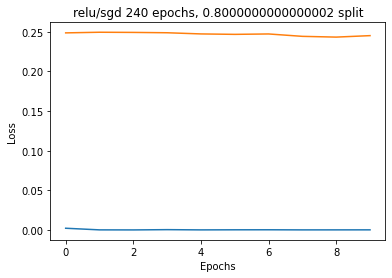

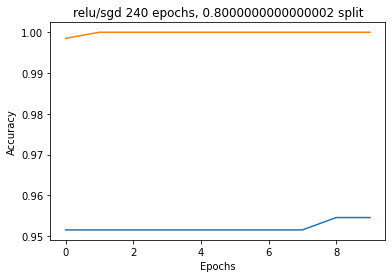

8/8 [==============================] - 0s 5ms/step - loss: 0.3007 - sparse_categorical_accuracy: 0.9360
Generation 6: 
Test Data:[0.3006525933742523, 0.9359999895095825], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 5ms/step - loss: 0.3007 - sparse_categorical_accuracy: 0.9360


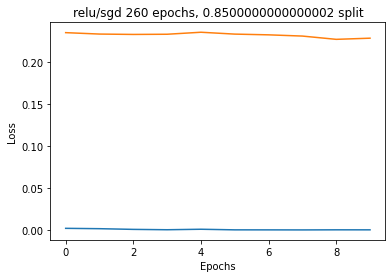

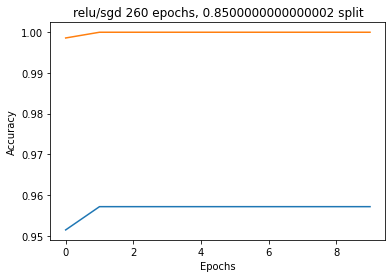

6/6 [==============================] - 0s 5ms/step - loss: 0.3472 - sparse_categorical_accuracy: 0.9096
Generation 6: 
Test Data:[0.3471585810184479, 0.9095744490623474], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 5ms/step - loss: 0.3472 - sparse_categorical_accuracy: 0.9096


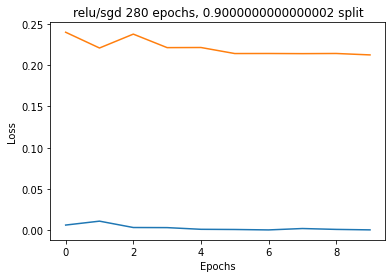

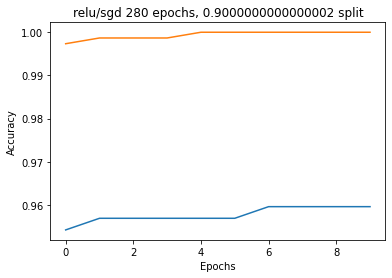

4/4 [==============================] - 0s 5ms/step - loss: 0.4292 - sparse_categorical_accuracy: 0.8800
Generation 6: 
Test Data:[0.42921000719070435, 0.8799999952316284], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.4292 - sparse_categorical_accuracy: 0.8800


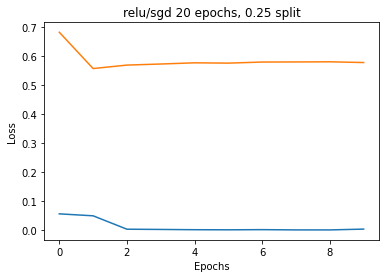

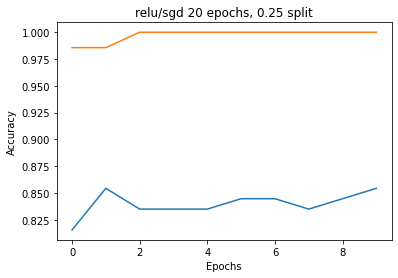

30/30 [==============================] - 0s 4ms/step - loss: 0.1954 - sparse_categorical_accuracy: 0.9744
Generation 7: 
Test Data:[0.19543015956878662, 0.9743589758872986], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.1954 - sparse_categorical_accuracy: 0.9744


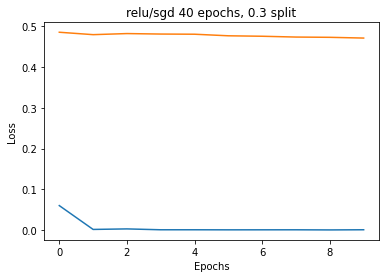

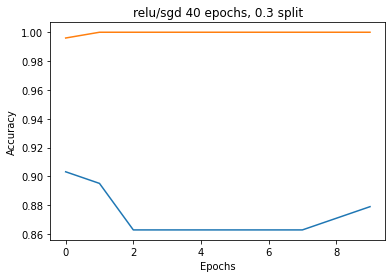

28/28 [==============================] - 0s 4ms/step - loss: 0.1755 - sparse_categorical_accuracy: 0.9771
Generation 7: 
Test Data:[0.17546021938323975, 0.9771167039871216], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.1755 - sparse_categorical_accuracy: 0.9771


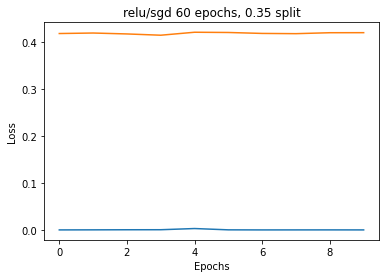

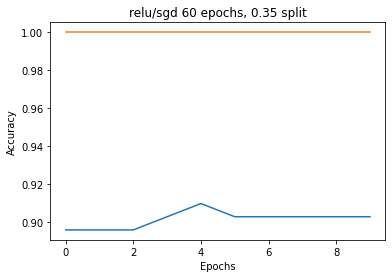

26/26 [==============================] - 0s 4ms/step - loss: 0.1774 - sparse_categorical_accuracy: 0.9766
Generation 7: 
Test Data:[0.17740201950073242, 0.9766010046005249], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 5ms/step - loss: 0.1774 - sparse_categorical_accuracy: 0.9766


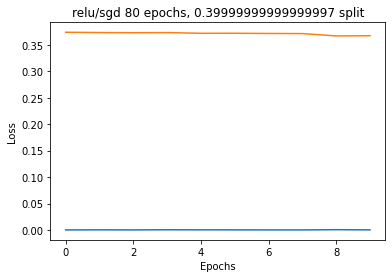

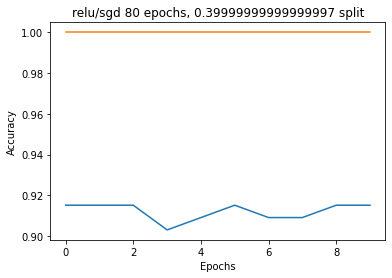

24/24 [==============================] - 0s 4ms/step - loss: 0.1798 - sparse_categorical_accuracy: 0.9746
Generation 7: 
Test Data:[0.1798456311225891, 0.9746328592300415], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.1798 - sparse_categorical_accuracy: 0.9746


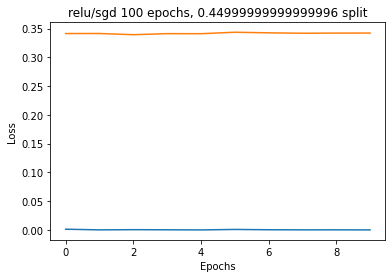

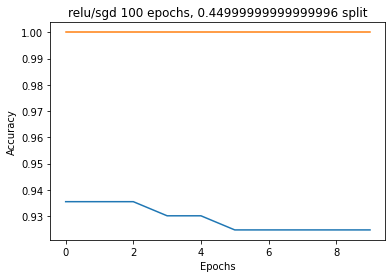

22/22 [==============================] - 0s 5ms/step - loss: 0.1855 - sparse_categorical_accuracy: 0.9723
Generation 7: 
Test Data:[0.18551447987556458, 0.9723435044288635], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.1855 - sparse_categorical_accuracy: 0.9723


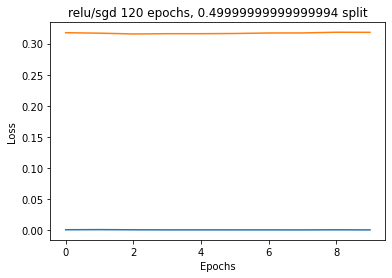

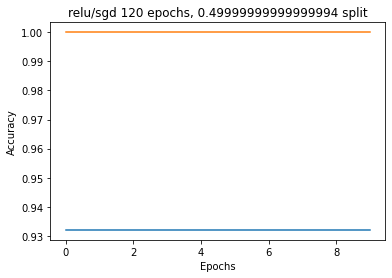

20/20 [==============================] - 0s 4ms/step - loss: 0.1964 - sparse_categorical_accuracy: 0.9696
Generation 7: 
Test Data:[0.19642622768878937, 0.9696000218391418], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.1964 - sparse_categorical_accuracy: 0.9696


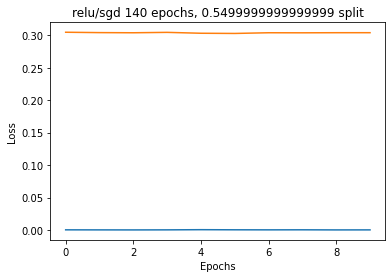

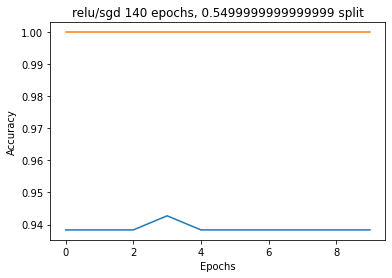

18/18 [==============================] - 0s 4ms/step - loss: 0.2051 - sparse_categorical_accuracy: 0.9644
Generation 7: 
Test Data:[0.205116868019104, 0.9644128084182739], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.2051 - sparse_categorical_accuracy: 0.9644


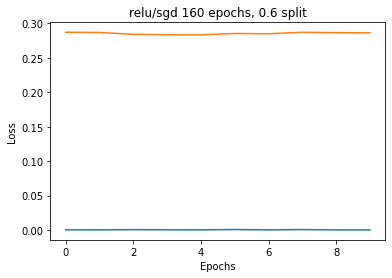

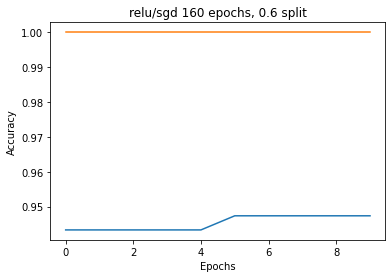

16/16 [==============================] - 0s 4ms/step - loss: 0.2148 - sparse_categorical_accuracy: 0.9600
Generation 7: 
Test Data:[0.21477657556533813, 0.9599999785423279], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.2148 - sparse_categorical_accuracy: 0.9600


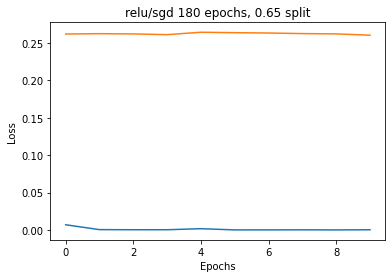

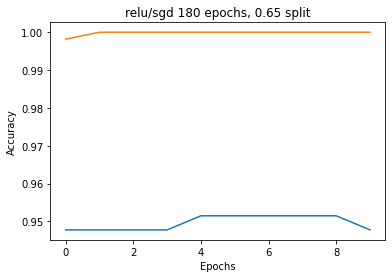

14/14 [==============================] - 0s 5ms/step - loss: 0.2107 - sparse_categorical_accuracy: 0.9611
Generation 7: 
Test Data:[0.21069370210170746, 0.9610983729362488], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.2107 - sparse_categorical_accuracy: 0.9611


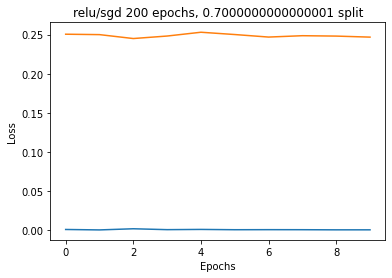

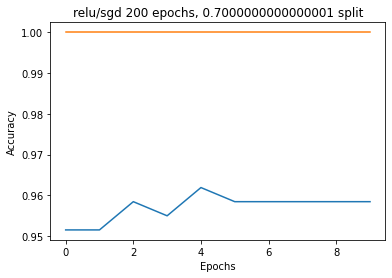

12/12 [==============================] - 0s 4ms/step - loss: 0.2303 - sparse_categorical_accuracy: 0.9493
Generation 7: 
Test Data:[0.23027050495147705, 0.9493333101272583], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.2303 - sparse_categorical_accuracy: 0.9493


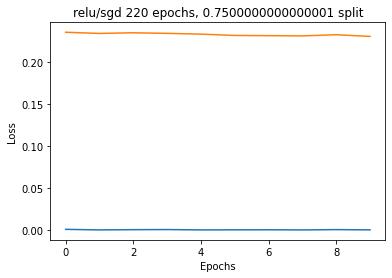

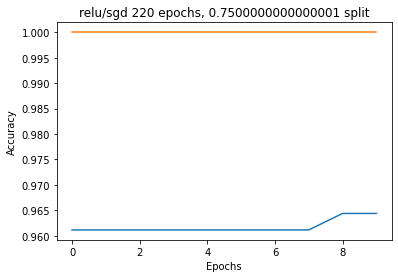

10/10 [==============================] - 0s 4ms/step - loss: 0.2518 - sparse_categorical_accuracy: 0.9391
Generation 7: 
Test Data:[0.25179651379585266, 0.9391025900840759], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 5ms/step - loss: 0.2518 - sparse_categorical_accuracy: 0.9391


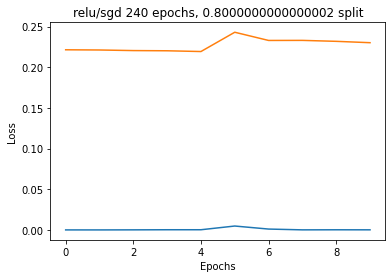

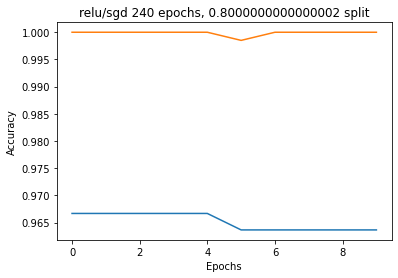

8/8 [==============================] - 0s 5ms/step - loss: 0.2954 - sparse_categorical_accuracy: 0.9280
Generation 7: 
Test Data:[0.29538291692733765, 0.9279999732971191], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2954 - sparse_categorical_accuracy: 0.9280


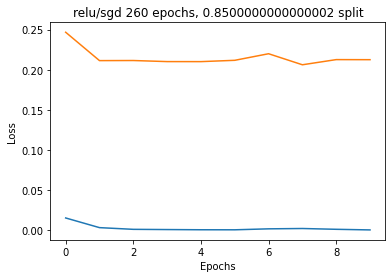

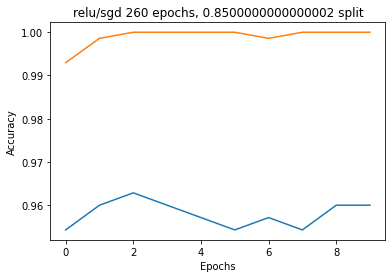

6/6 [==============================] - 0s 4ms/step - loss: 0.3382 - sparse_categorical_accuracy: 0.9096
Generation 7: 
Test Data:[0.33820727467536926, 0.9095744490623474], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.3382 - sparse_categorical_accuracy: 0.9096


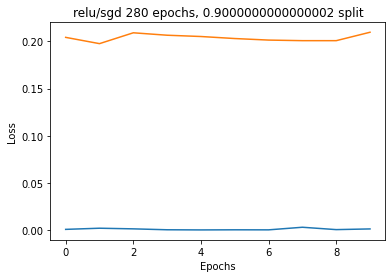

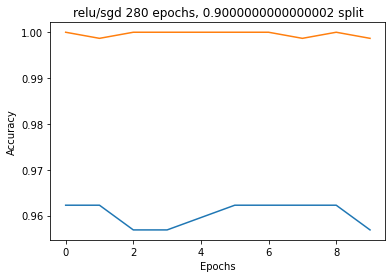

4/4 [==============================] - 0s 6ms/step - loss: 0.4423 - sparse_categorical_accuracy: 0.8800
Generation 7: 
Test Data:[0.4422704577445984, 0.8799999952316284], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 4ms/step - loss: 0.4423 - sparse_categorical_accuracy: 0.8800


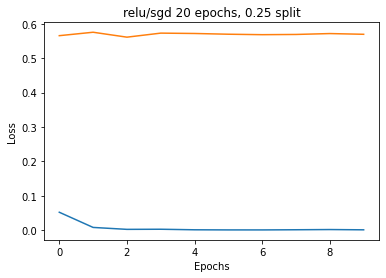

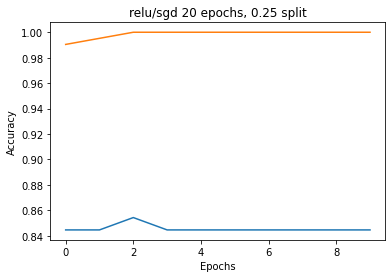

30/30 [==============================] - 0s 4ms/step - loss: 0.1579 - sparse_categorical_accuracy: 0.9776
Generation 8: 
Test Data:[0.15785476565361023, 0.9775640964508057], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.1579 - sparse_categorical_accuracy: 0.9776


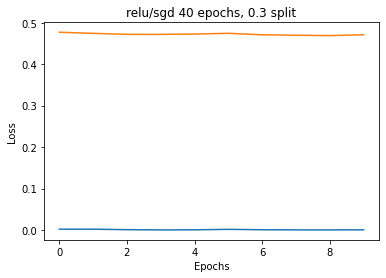

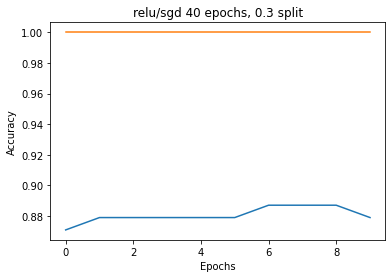

28/28 [==============================] - 0s 5ms/step - loss: 0.1510 - sparse_categorical_accuracy: 0.9771
Generation 8: 
Test Data:[0.1510348618030548, 0.9771167039871216], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.1510 - sparse_categorical_accuracy: 0.9771


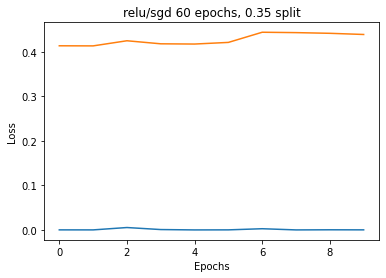

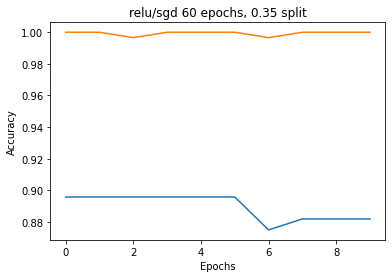

26/26 [==============================] - 0s 4ms/step - loss: 0.1727 - sparse_categorical_accuracy: 0.9729
Generation 8: 
Test Data:[0.17267441749572754, 0.9729064106941223], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.1727 - sparse_categorical_accuracy: 0.9729


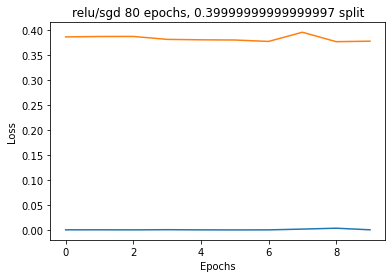

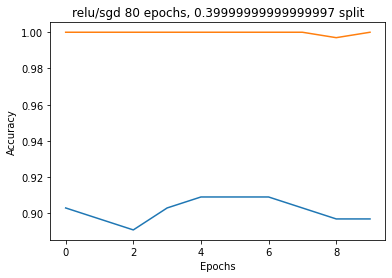

24/24 [==============================] - 0s 4ms/step - loss: 0.1760 - sparse_categorical_accuracy: 0.9706
Generation 8: 
Test Data:[0.17596806585788727, 0.97062748670578], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.1760 - sparse_categorical_accuracy: 0.9706


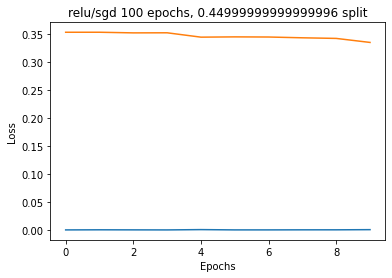

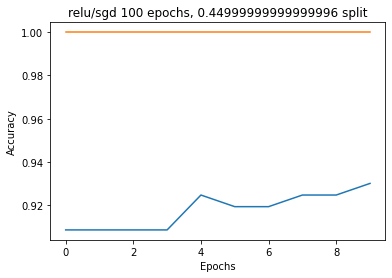

22/22 [==============================] - 0s 4ms/step - loss: 0.1699 - sparse_categorical_accuracy: 0.9709
Generation 8: 
Test Data:[0.16994886100292206, 0.9708878993988037], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.1699 - sparse_categorical_accuracy: 0.9709


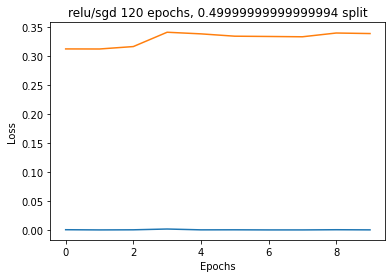

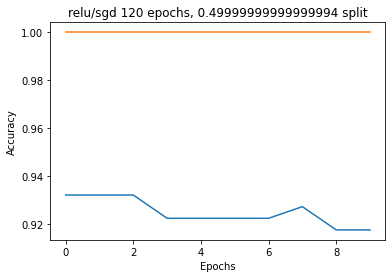

20/20 [==============================] - 0s 4ms/step - loss: 0.1937 - sparse_categorical_accuracy: 0.9680
Generation 8: 
Test Data:[0.19368714094161987, 0.9679999947547913], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.1937 - sparse_categorical_accuracy: 0.9680


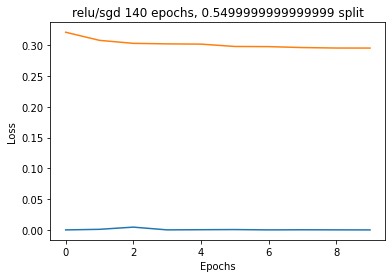

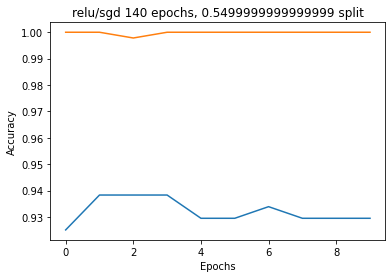

18/18 [==============================] - 0s 5ms/step - loss: 0.1796 - sparse_categorical_accuracy: 0.9698
Generation 8: 
Test Data:[0.1796153485774994, 0.9697508811950684], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 5ms/step - loss: 0.1796 - sparse_categorical_accuracy: 0.9698


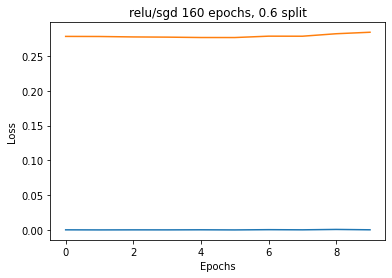

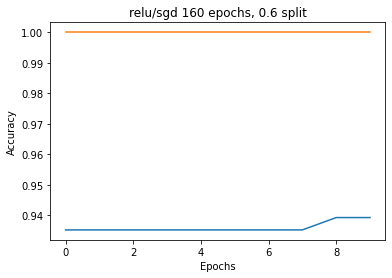

16/16 [==============================] - 0s 4ms/step - loss: 0.1986 - sparse_categorical_accuracy: 0.9600
Generation 8: 
Test Data:[0.1985713392496109, 0.9599999785423279], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.1986 - sparse_categorical_accuracy: 0.9600


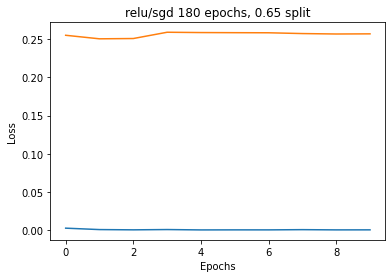

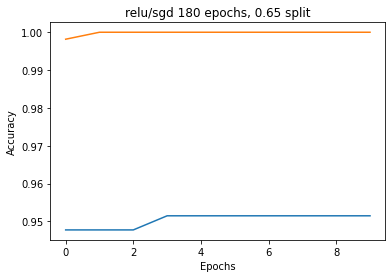

14/14 [==============================] - 0s 4ms/step - loss: 0.1933 - sparse_categorical_accuracy: 0.9588
Generation 8: 
Test Data:[0.19333991408348083, 0.9588100910186768], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 5ms/step - loss: 0.1933 - sparse_categorical_accuracy: 0.9588


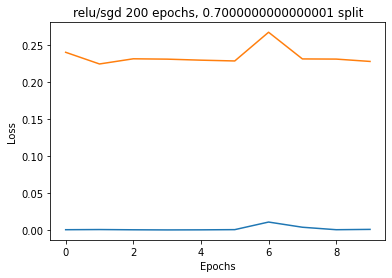

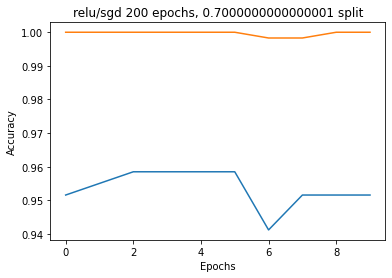

12/12 [==============================] - 0s 4ms/step - loss: 0.1871 - sparse_categorical_accuracy: 0.9627
Generation 8: 
Test Data:[0.18714965879917145, 0.9626666903495789], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.1871 - sparse_categorical_accuracy: 0.9627


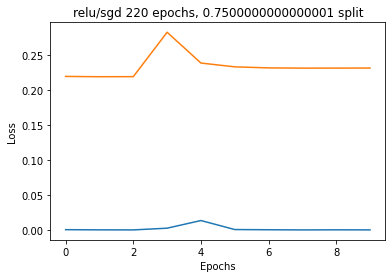

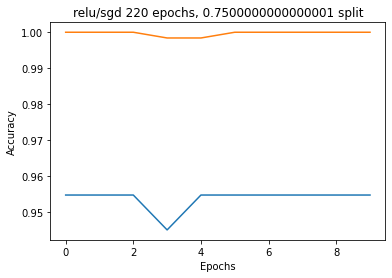

10/10 [==============================] - 0s 4ms/step - loss: 0.2237 - sparse_categorical_accuracy: 0.9519
Generation 8: 
Test Data:[0.2236577570438385, 0.9519230723381042], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.2237 - sparse_categorical_accuracy: 0.9519


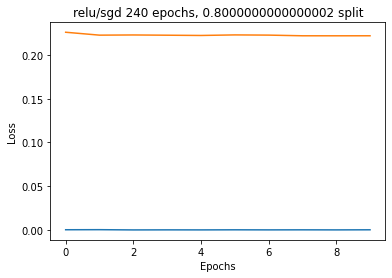

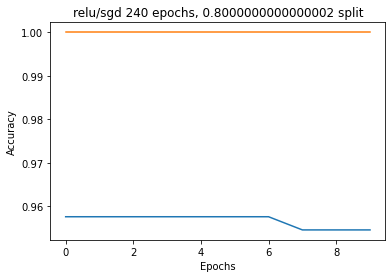

8/8 [==============================] - 0s 5ms/step - loss: 0.2606 - sparse_categorical_accuracy: 0.9320
Generation 8: 
Test Data:[0.260648638010025, 0.9319999814033508], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2606 - sparse_categorical_accuracy: 0.9320


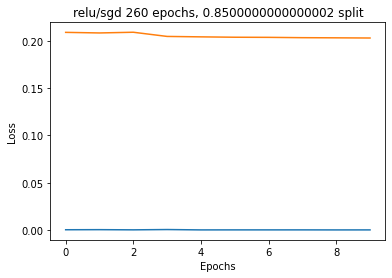

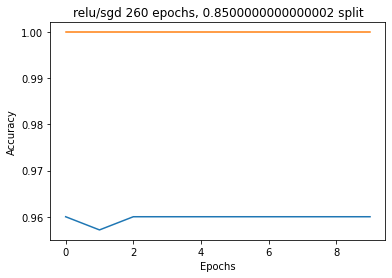

6/6 [==============================] - 0s 4ms/step - loss: 0.3047 - sparse_categorical_accuracy: 0.9255
Generation 8: 
Test Data:[0.30467304587364197, 0.9255319237709045], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.3047 - sparse_categorical_accuracy: 0.9255


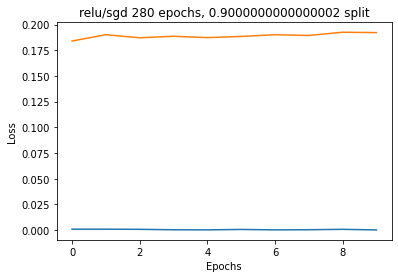

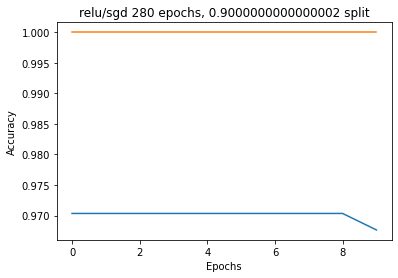

4/4 [==============================] - 0s 5ms/step - loss: 0.3926 - sparse_categorical_accuracy: 0.8800
Generation 8: 
Test Data:[0.3926199972629547, 0.8799999952316284], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.3926 - sparse_categorical_accuracy: 0.8800


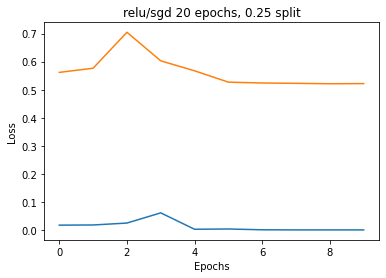

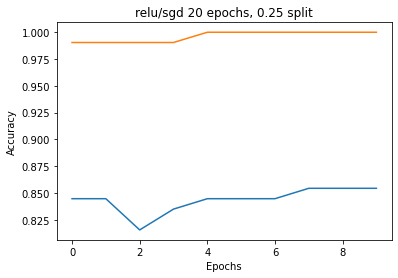

30/30 [==============================] - 0s 4ms/step - loss: 0.1434 - sparse_categorical_accuracy: 0.9818
Generation 9: 
Test Data:[0.14336389303207397, 0.9818376302719116], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.1434 - sparse_categorical_accuracy: 0.9818


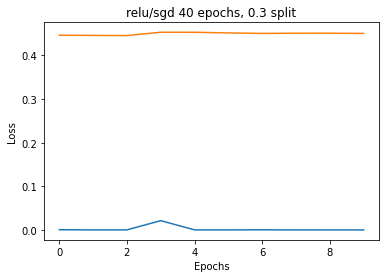

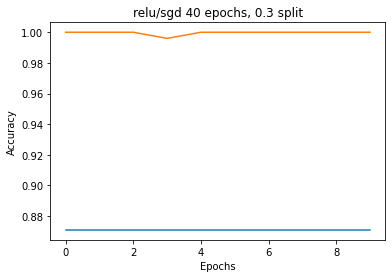

28/28 [==============================] - 0s 4ms/step - loss: 0.1456 - sparse_categorical_accuracy: 0.9794
Generation 9: 
Test Data:[0.14564116299152374, 0.9794050455093384], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.1456 - sparse_categorical_accuracy: 0.9794


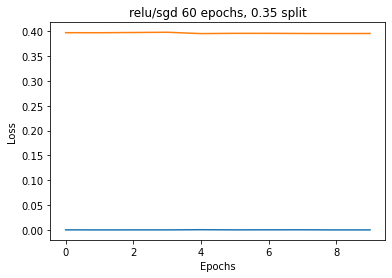

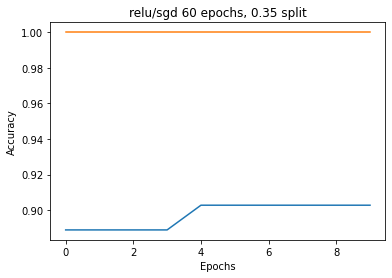

26/26 [==============================] - 0s 5ms/step - loss: 0.1496 - sparse_categorical_accuracy: 0.9778
Generation 9: 
Test Data:[0.14956006407737732, 0.9778324961662292], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 5ms/step - loss: 0.1496 - sparse_categorical_accuracy: 0.9778


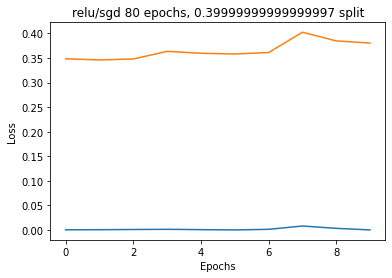

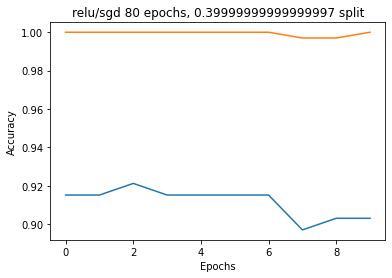

24/24 [==============================] - 0s 4ms/step - loss: 0.1746 - sparse_categorical_accuracy: 0.9706
Generation 9: 
Test Data:[0.17464542388916016, 0.97062748670578], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.1746 - sparse_categorical_accuracy: 0.9706


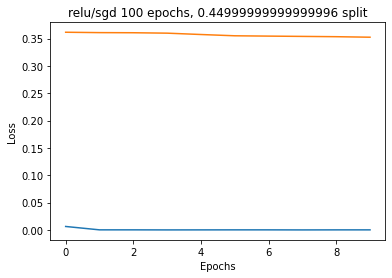

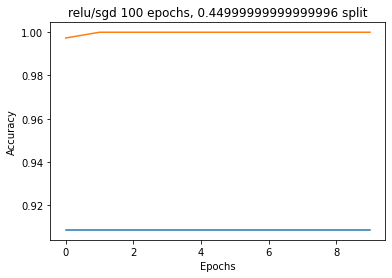

22/22 [==============================] - 0s 4ms/step - loss: 0.1788 - sparse_categorical_accuracy: 0.9694
Generation 9: 
Test Data:[0.17876361310482025, 0.9694322943687439], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.1788 - sparse_categorical_accuracy: 0.9694


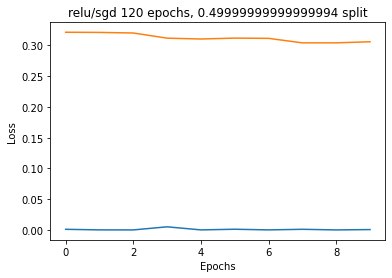

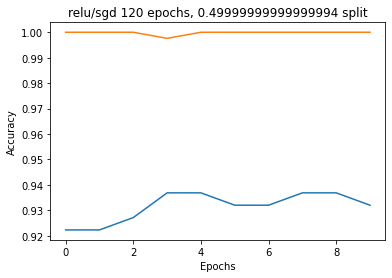

20/20 [==============================] - 0s 4ms/step - loss: 0.1750 - sparse_categorical_accuracy: 0.9712
Generation 9: 
Test Data:[0.17496195435523987, 0.9711999893188477], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.1750 - sparse_categorical_accuracy: 0.9712


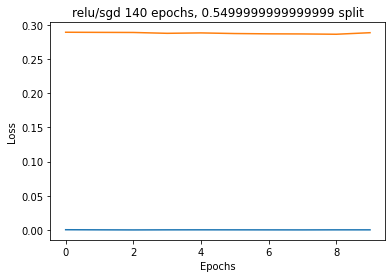

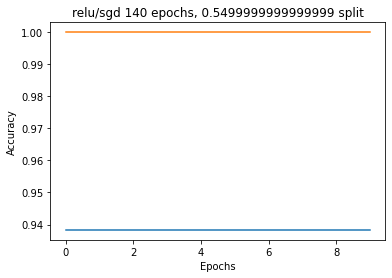

18/18 [==============================] - 0s 5ms/step - loss: 0.1835 - sparse_categorical_accuracy: 0.9680
Generation 9: 
Test Data:[0.1835007518529892, 0.9679715037345886], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.1835 - sparse_categorical_accuracy: 0.9680


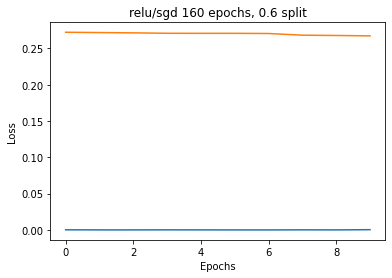

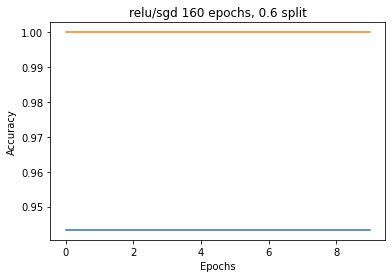

16/16 [==============================] - 0s 4ms/step - loss: 0.1899 - sparse_categorical_accuracy: 0.9680
Generation 9: 
Test Data:[0.1899206042289734, 0.9679999947547913], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.1899 - sparse_categorical_accuracy: 0.9680


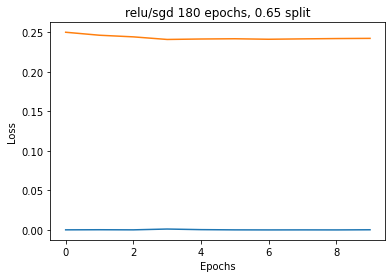

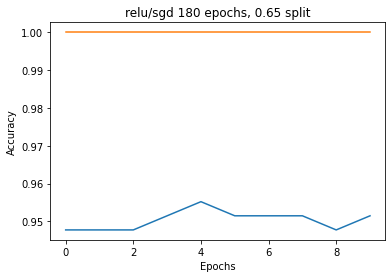

14/14 [==============================] - 0s 4ms/step - loss: 0.1904 - sparse_categorical_accuracy: 0.9634
Generation 9: 
Test Data:[0.19043442606925964, 0.9633867144584656], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 5ms/step - loss: 0.1904 - sparse_categorical_accuracy: 0.9634


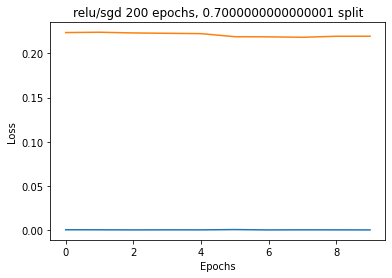

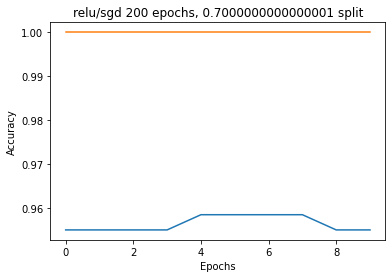

12/12 [==============================] - 0s 4ms/step - loss: 0.1999 - sparse_categorical_accuracy: 0.9520
Generation 9: 
Test Data:[0.19994224607944489, 0.9520000219345093], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.1999 - sparse_categorical_accuracy: 0.9520


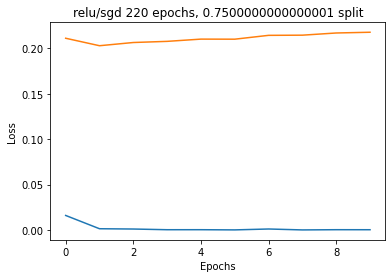

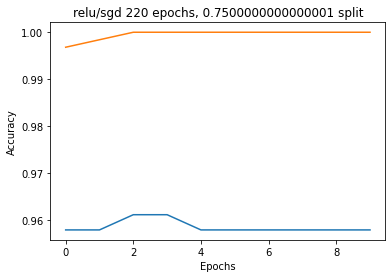

10/10 [==============================] - 0s 4ms/step - loss: 0.2319 - sparse_categorical_accuracy: 0.9391
Generation 9: 
Test Data:[0.2319149672985077, 0.9391025900840759], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 5ms/step - loss: 0.2319 - sparse_categorical_accuracy: 0.9391


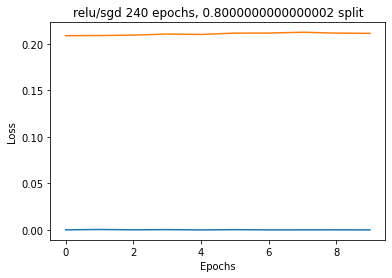

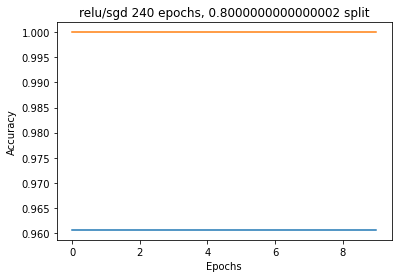

8/8 [==============================] - 0s 4ms/step - loss: 0.2721 - sparse_categorical_accuracy: 0.9400
Generation 9: 
Test Data:[0.27208369970321655, 0.9399999976158142], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2721 - sparse_categorical_accuracy: 0.9400


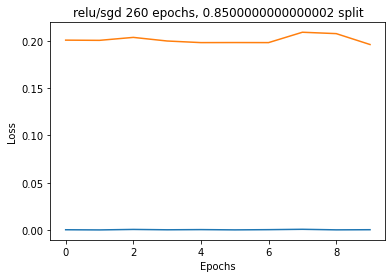

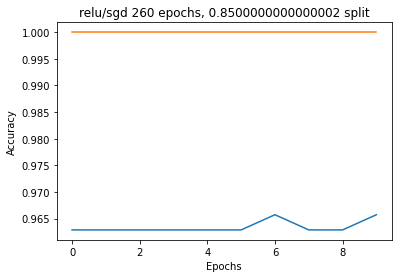

6/6 [==============================] - 0s 6ms/step - loss: 0.3263 - sparse_categorical_accuracy: 0.9202
Generation 9: 
Test Data:[0.32629379630088806, 0.9202127456665039], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.3263 - sparse_categorical_accuracy: 0.9202


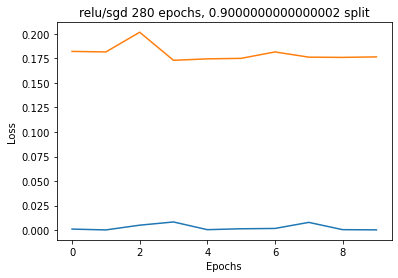

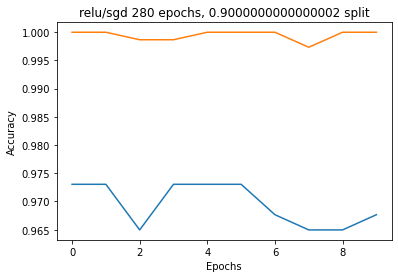

4/4 [==============================] - 0s 6ms/step - loss: 0.4013 - sparse_categorical_accuracy: 0.8800
Generation 9: 
Test Data:[0.40129226446151733, 0.8799999952316284], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.4013 - sparse_categorical_accuracy: 0.8800


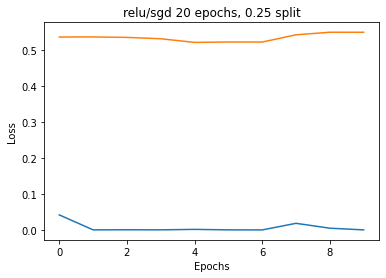

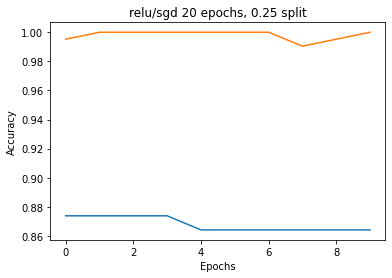

30/30 [==============================] - 0s 4ms/step - loss: 0.1522 - sparse_categorical_accuracy: 0.9776
Generation 10: 
Test Data:[0.15220274031162262, 0.9775640964508057], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.1522 - sparse_categorical_accuracy: 0.9776


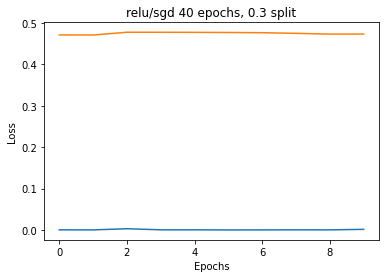

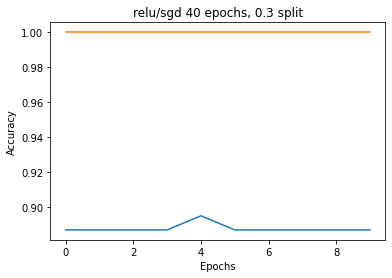

28/28 [==============================] - 0s 4ms/step - loss: 0.1612 - sparse_categorical_accuracy: 0.9748
Generation 10: 
Test Data:[0.16119077801704407, 0.9748283624649048], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.1612 - sparse_categorical_accuracy: 0.9748


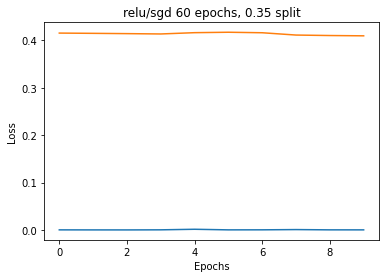

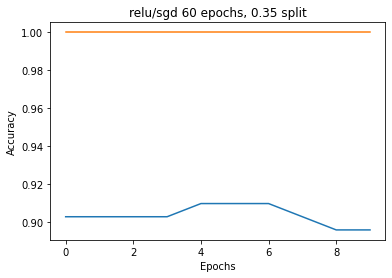

26/26 [==============================] - 0s 4ms/step - loss: 0.1603 - sparse_categorical_accuracy: 0.9754
Generation 10: 
Test Data:[0.1602788120508194, 0.9753694534301758], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.1603 - sparse_categorical_accuracy: 0.9754


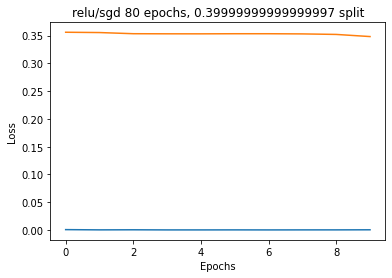

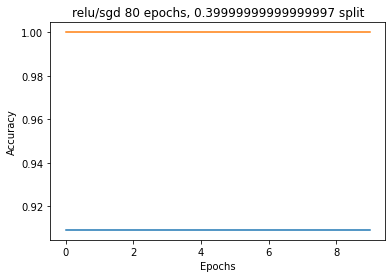

24/24 [==============================] - 0s 4ms/step - loss: 0.1564 - sparse_categorical_accuracy: 0.9720
Generation 10: 
Test Data:[0.15635022521018982, 0.9719626307487488], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.1564 - sparse_categorical_accuracy: 0.9720


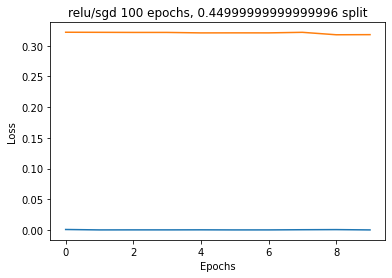

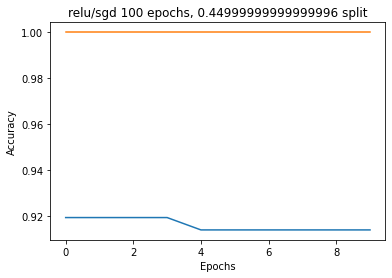

22/22 [==============================] - 0s 4ms/step - loss: 0.1602 - sparse_categorical_accuracy: 0.9723
Generation 10: 
Test Data:[0.16019609570503235, 0.9723435044288635], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.1602 - sparse_categorical_accuracy: 0.9723


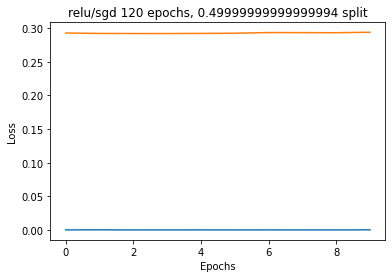

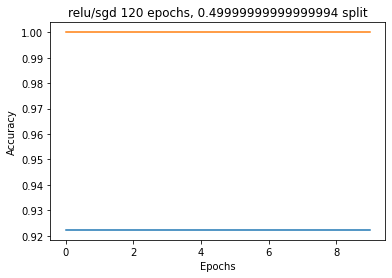

20/20 [==============================] - 0s 4ms/step - loss: 0.1709 - sparse_categorical_accuracy: 0.9696
Generation 10: 
Test Data:[0.17087838053703308, 0.9696000218391418], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.1709 - sparse_categorical_accuracy: 0.9696


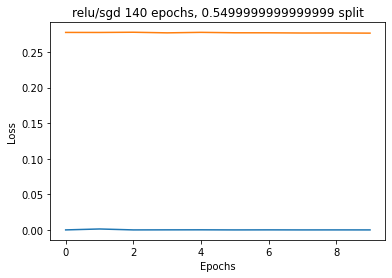

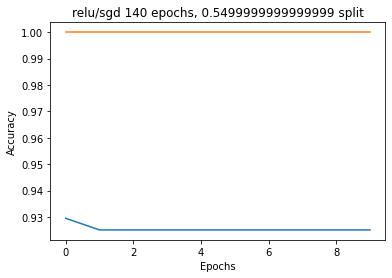

18/18 [==============================] - 0s 4ms/step - loss: 0.1772 - sparse_categorical_accuracy: 0.9662
Generation 10: 
Test Data:[0.1772116869688034, 0.9661921858787537], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 5ms/step - loss: 0.1772 - sparse_categorical_accuracy: 0.9662


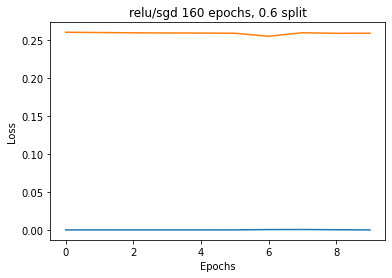

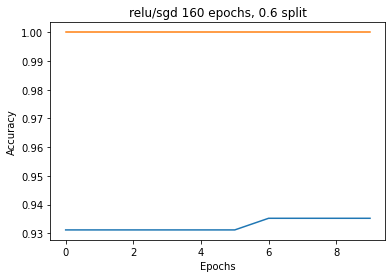

16/16 [==============================] - 0s 4ms/step - loss: 0.1845 - sparse_categorical_accuracy: 0.9620
Generation 10: 
Test Data:[0.18449892103672028, 0.9620000123977661], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.1845 - sparse_categorical_accuracy: 0.9620


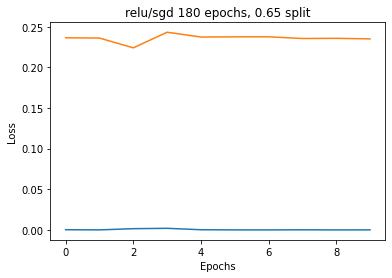

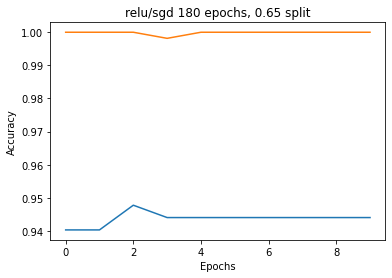

14/14 [==============================] - 0s 5ms/step - loss: 0.1865 - sparse_categorical_accuracy: 0.9588
Generation 10: 
Test Data:[0.18647634983062744, 0.9588100910186768], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 5ms/step - loss: 0.1865 - sparse_categorical_accuracy: 0.9588


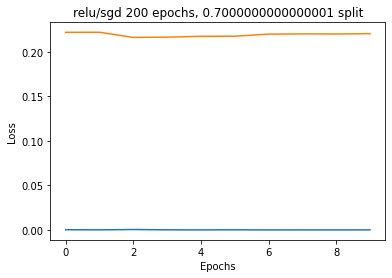

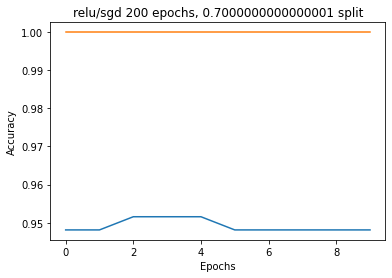

12/12 [==============================] - 0s 4ms/step - loss: 0.2024 - sparse_categorical_accuracy: 0.9520
Generation 10: 
Test Data:[0.20241457223892212, 0.9520000219345093], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.2024 - sparse_categorical_accuracy: 0.9520


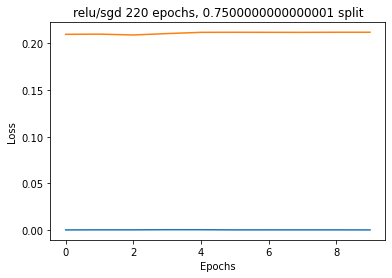

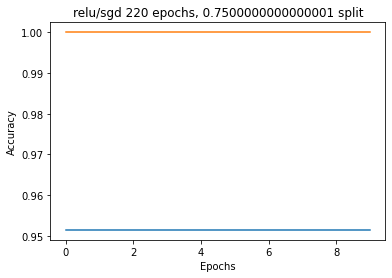

10/10 [==============================] - 0s 4ms/step - loss: 0.2309 - sparse_categorical_accuracy: 0.9391
Generation 10: 
Test Data:[0.23092658817768097, 0.9391025900840759], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.2309 - sparse_categorical_accuracy: 0.9391


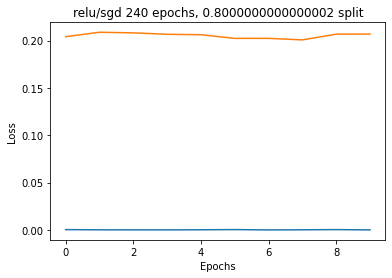

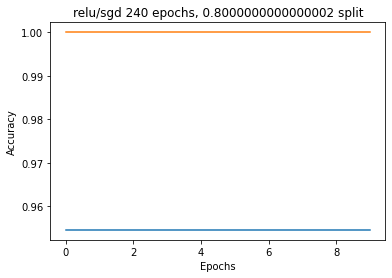

8/8 [==============================] - 0s 4ms/step - loss: 0.2826 - sparse_categorical_accuracy: 0.9200
Generation 10: 
Test Data:[0.28261855244636536, 0.9200000166893005], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2826 - sparse_categorical_accuracy: 0.9200


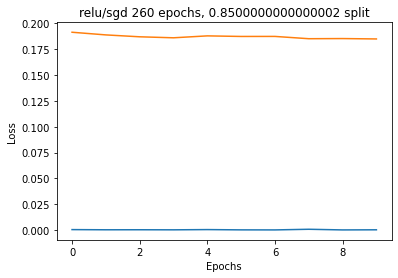

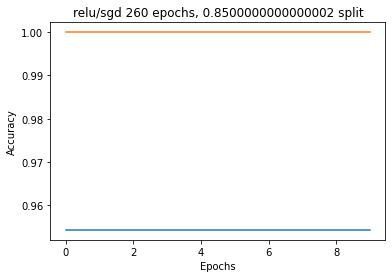

6/6 [==============================] - 0s 5ms/step - loss: 0.3198 - sparse_categorical_accuracy: 0.9096
Generation 10: 
Test Data:[0.3197566270828247, 0.9095744490623474], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.3198 - sparse_categorical_accuracy: 0.9096


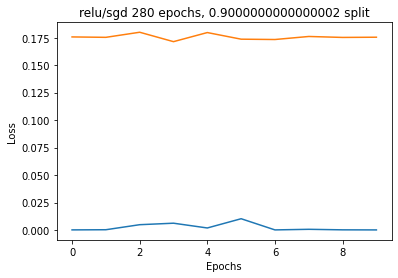

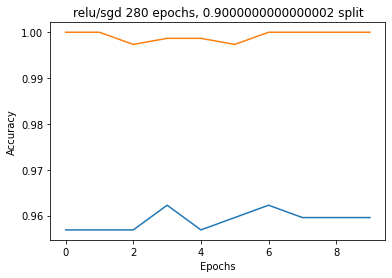

4/4 [==============================] - 0s 6ms/step - loss: 0.4134 - sparse_categorical_accuracy: 0.8800
Generation 10: 
Test Data:[0.4133768081665039, 0.8799999952316284], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.4134 - sparse_categorical_accuracy: 0.8800


In [105]:
model = buildModel('relu','SGD', normalize=False)
fitModel(X,y,model,'relu/sgd')

In [106]:
X = images;
y = names;
model.evaluate(X_Test_Final,y_Test_Final)
model.evaluate(X,y)

49/49 [==============================] - 0s 4ms/step - loss: 0.1945 - sparse_categorical_accuracy: 0.9577


[0.19452941417694092, 0.9576923251152039]

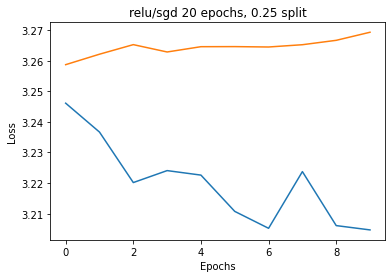

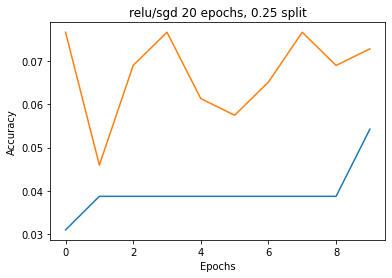

37/37 [==============================] - 0s 4ms/step - loss: 3.2652 - sparse_categorical_accuracy: 0.0342
Generation 1: 
Test Data:[3.2652039527893066, 0.03418803587555885], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 3.2652 - sparse_categorical_accuracy: 0.0342


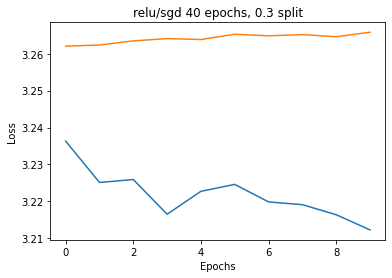

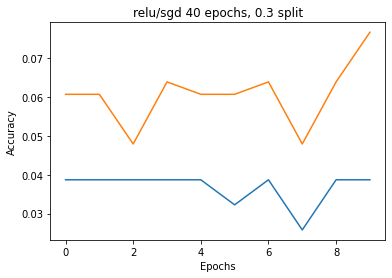

35/35 [==============================] - 0s 4ms/step - loss: 3.2644 - sparse_categorical_accuracy: 0.0330
Generation 1: 
Test Data:[3.2644102573394775, 0.032967034727334976], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 3.2644 - sparse_categorical_accuracy: 0.0330


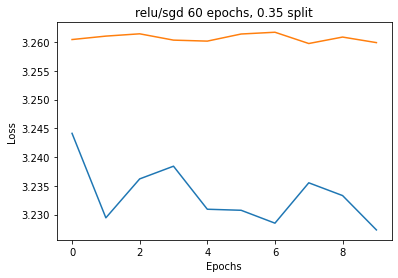

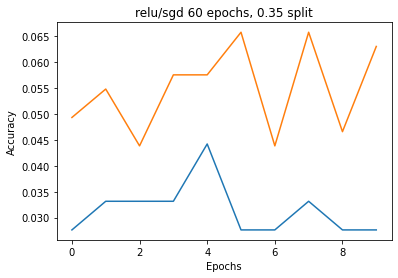

32/32 [==============================] - 0s 4ms/step - loss: 3.2637 - sparse_categorical_accuracy: 0.0345
Generation 1: 
Test Data:[3.2637243270874023, 0.03451676666736603], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 3.2637 - sparse_categorical_accuracy: 0.0345


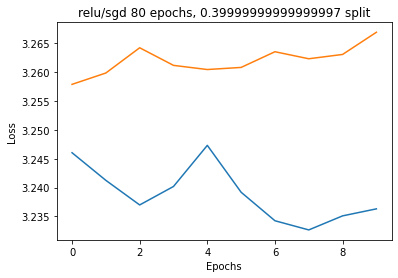

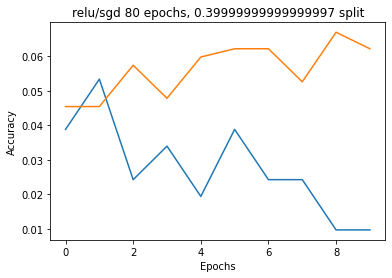

30/30 [==============================] - 0s 4ms/step - loss: 3.2638 - sparse_categorical_accuracy: 0.0363
Generation 1: 
Test Data:[3.2637767791748047, 0.03632478788495064], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 3.2638 - sparse_categorical_accuracy: 0.0363


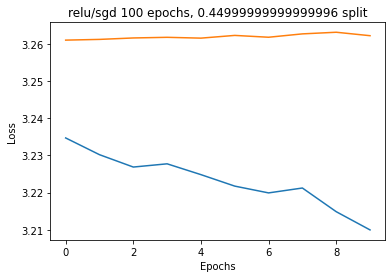

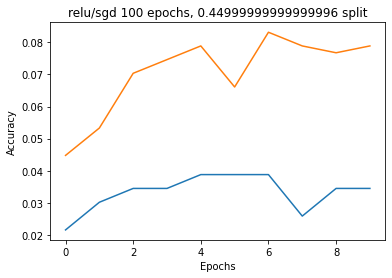

27/27 [==============================] - 0s 4ms/step - loss: 3.2637 - sparse_categorical_accuracy: 0.0268
Generation 1: 
Test Data:[3.263704299926758, 0.02677532099187374], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 3.2637 - sparse_categorical_accuracy: 0.0268


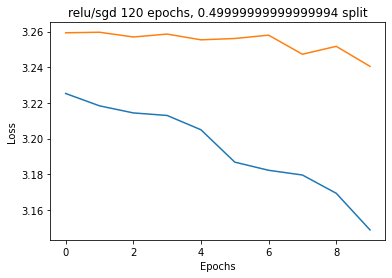

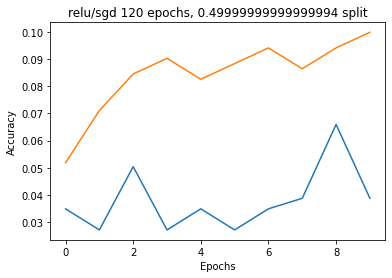

25/25 [==============================] - 0s 4ms/step - loss: 3.2458 - sparse_categorical_accuracy: 0.0359
Generation 1: 
Test Data:[3.2457964420318604, 0.03585147112607956], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 3.2458 - sparse_categorical_accuracy: 0.0359


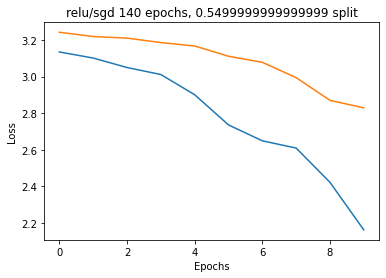

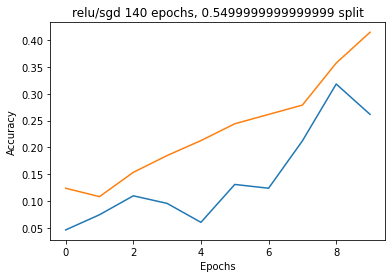

22/22 [==============================] - 0s 4ms/step - loss: 2.8345 - sparse_categorical_accuracy: 0.2390
Generation 1: 
Test Data:[2.8344924449920654, 0.23897582292556763], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 2.8345 - sparse_categorical_accuracy: 0.2390


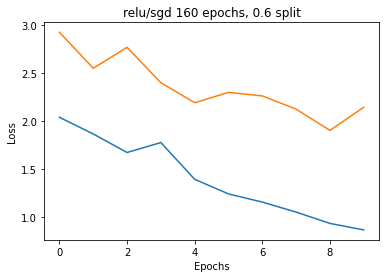

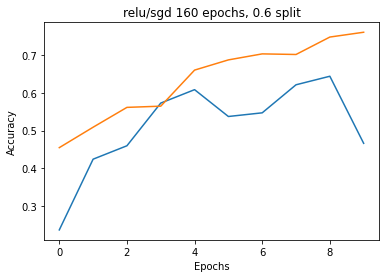

20/20 [==============================] - 0s 4ms/step - loss: 2.1538 - sparse_categorical_accuracy: 0.4792
Generation 1: 
Test Data:[2.153841257095337, 0.4791666567325592], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 2.1538 - sparse_categorical_accuracy: 0.4792


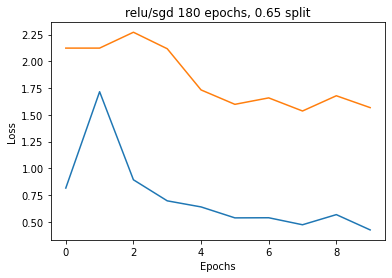

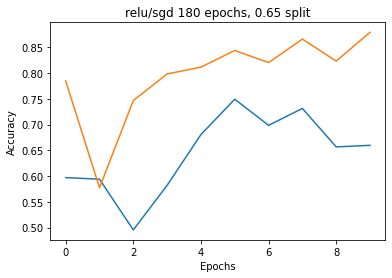

18/18 [==============================] - 0s 4ms/step - loss: 1.6255 - sparse_categorical_accuracy: 0.6300
Generation 1: 
Test Data:[1.6255238056182861, 0.6300366520881653], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 1.6255 - sparse_categorical_accuracy: 0.6300


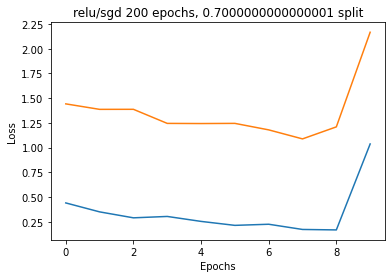

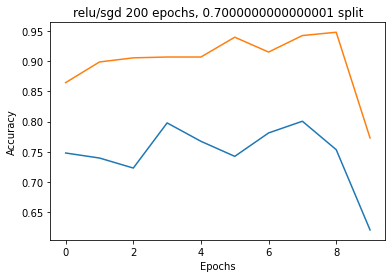

15/15 [==============================] - 0s 4ms/step - loss: 2.1798 - sparse_categorical_accuracy: 0.6667
Generation 1: 
Test Data:[2.1798417568206787, 0.6666666865348816], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 2.1798 - sparse_categorical_accuracy: 0.6667


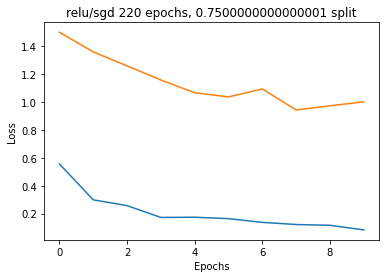

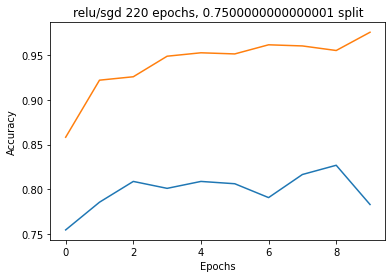

13/13 [==============================] - 0s 4ms/step - loss: 1.0437 - sparse_categorical_accuracy: 0.7667
Generation 1: 
Test Data:[1.0436986684799194, 0.7666666507720947], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 1.0437 - sparse_categorical_accuracy: 0.7667


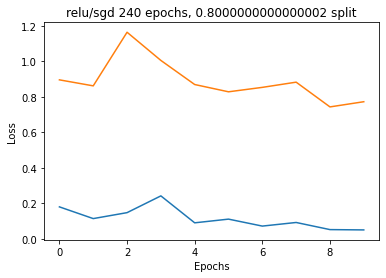

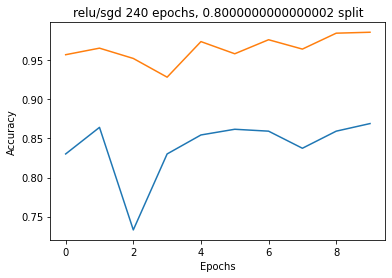

10/10 [==============================] - 0s 4ms/step - loss: 0.8382 - sparse_categorical_accuracy: 0.8462
Generation 1: 
Test Data:[0.838220477104187, 0.8461538553237915], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.8382 - sparse_categorical_accuracy: 0.8462


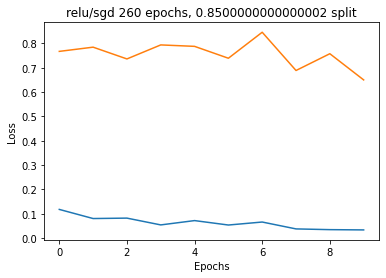

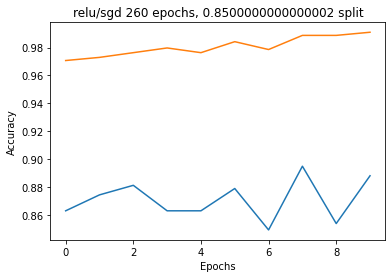

8/8 [==============================] - 0s 4ms/step - loss: 0.7453 - sparse_categorical_accuracy: 0.8504
Generation 1: 
Test Data:[0.7453091740608215, 0.8504273295402527], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.7453 - sparse_categorical_accuracy: 0.8504


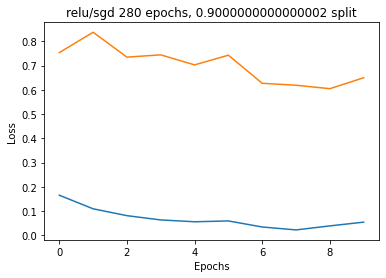

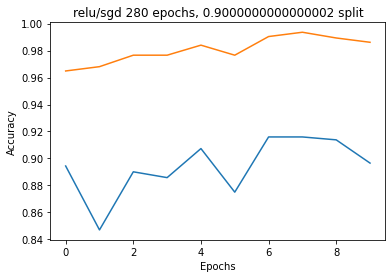

5/5 [==============================] - 0s 5ms/step - loss: 0.6930 - sparse_categorical_accuracy: 0.8590
Generation 1: 
Test Data:[0.6929569840431213, 0.8589743375778198], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.6930 - sparse_categorical_accuracy: 0.8590


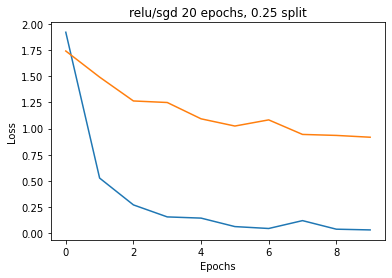

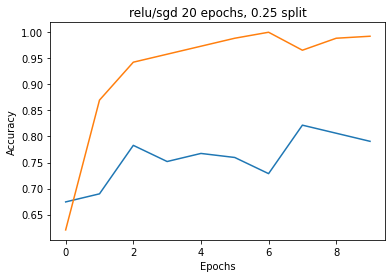

37/37 [==============================] - 0s 4ms/step - loss: 0.7062 - sparse_categorical_accuracy: 0.9017
Generation 2: 
Test Data:[0.7061545848846436, 0.9017093777656555], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.7062 - sparse_categorical_accuracy: 0.9017


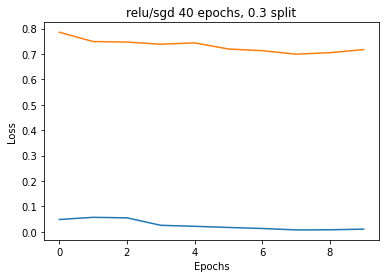

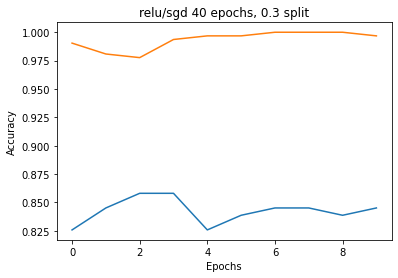

35/35 [==============================] - 0s 4ms/step - loss: 0.5439 - sparse_categorical_accuracy: 0.9185
Generation 2: 
Test Data:[0.5439184308052063, 0.918498158454895], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.5439 - sparse_categorical_accuracy: 0.9185


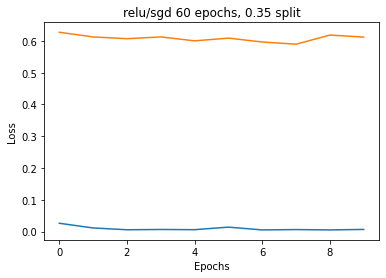

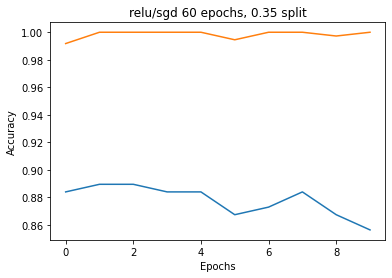

32/32 [==============================] - 0s 4ms/step - loss: 0.4714 - sparse_categorical_accuracy: 0.9231
Generation 2: 
Test Data:[0.4714079201221466, 0.9230769276618958], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.4714 - sparse_categorical_accuracy: 0.9231


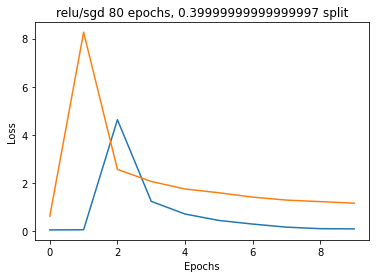

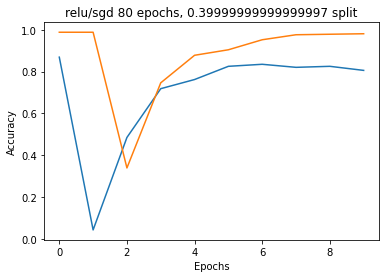

30/30 [==============================] - 0s 4ms/step - loss: 1.1149 - sparse_categorical_accuracy: 0.8248
Generation 2: 
Test Data:[1.1149206161499023, 0.8247863054275513], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 1.1149 - sparse_categorical_accuracy: 0.8248


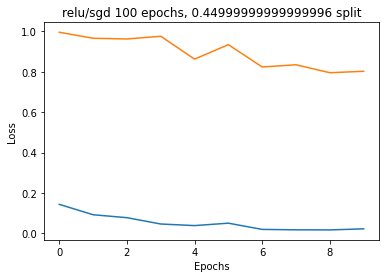

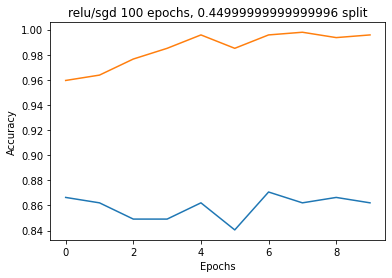

27/27 [==============================] - 0s 4ms/step - loss: 0.8139 - sparse_categorical_accuracy: 0.8452
Generation 2: 
Test Data:[0.8138725161552429, 0.8451688289642334], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.8139 - sparse_categorical_accuracy: 0.8452


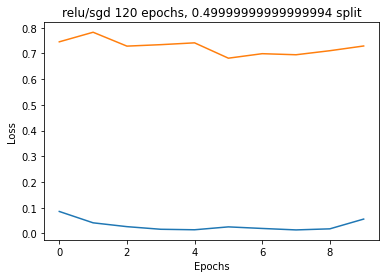

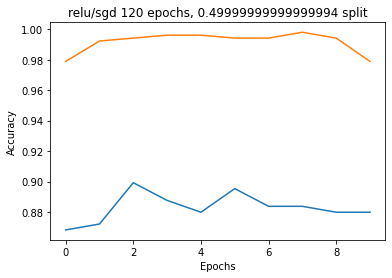

25/25 [==============================] - 0s 4ms/step - loss: 0.7523 - sparse_categorical_accuracy: 0.8720
Generation 2: 
Test Data:[0.7522693276405334, 0.8719590306282043], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 5ms/step - loss: 0.7523 - sparse_categorical_accuracy: 0.8720


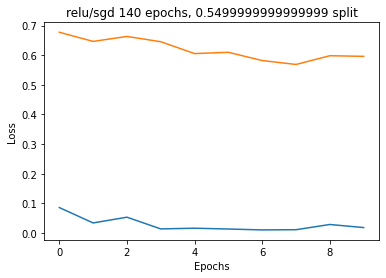

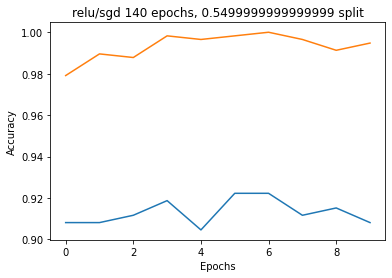

22/22 [==============================] - 0s 4ms/step - loss: 0.6408 - sparse_categorical_accuracy: 0.8777
Generation 2: 
Test Data:[0.6407572031021118, 0.8776671290397644], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.6408 - sparse_categorical_accuracy: 0.8777


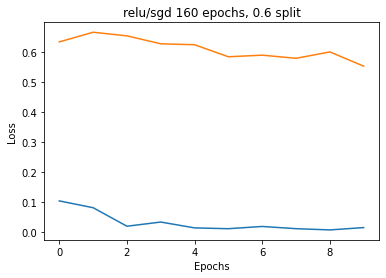

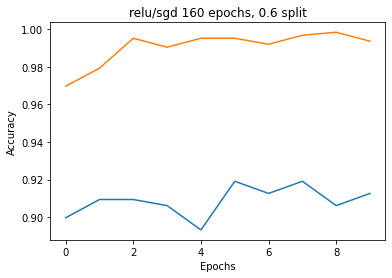

20/20 [==============================] - 0s 4ms/step - loss: 0.5670 - sparse_categorical_accuracy: 0.8846
Generation 2: 
Test Data:[0.5669690370559692, 0.8846153616905212], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.5670 - sparse_categorical_accuracy: 0.8846


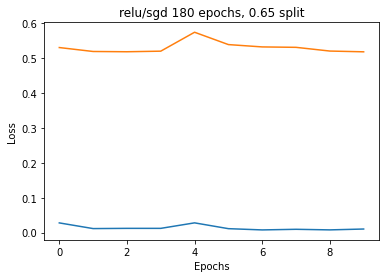

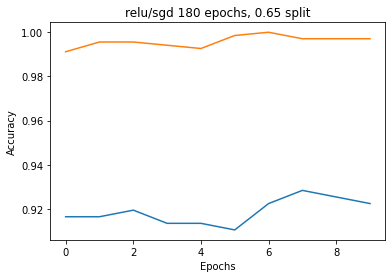

18/18 [==============================] - 0s 4ms/step - loss: 0.5626 - sparse_categorical_accuracy: 0.8773
Generation 2: 
Test Data:[0.5625550150871277, 0.877289354801178], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.5626 - sparse_categorical_accuracy: 0.8773


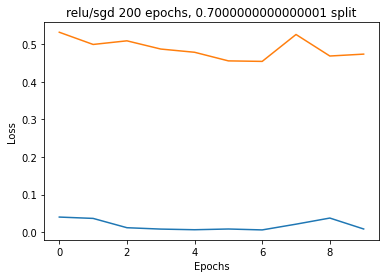

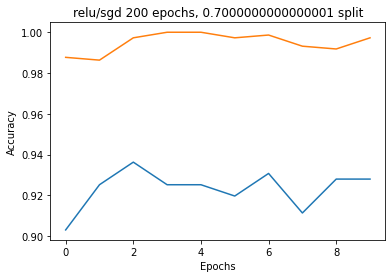

15/15 [==============================] - 0s 5ms/step - loss: 0.5374 - sparse_categorical_accuracy: 0.8868
Generation 2: 
Test Data:[0.5374264121055603, 0.8867521286010742], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 5ms/step - loss: 0.5374 - sparse_categorical_accuracy: 0.8868


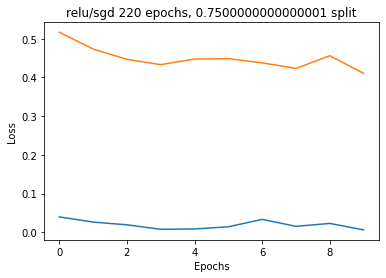

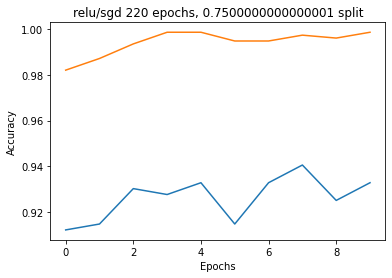

13/13 [==============================] - 0s 4ms/step - loss: 0.5001 - sparse_categorical_accuracy: 0.8974
Generation 2: 
Test Data:[0.5001325607299805, 0.8974359035491943], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.5001 - sparse_categorical_accuracy: 0.8974


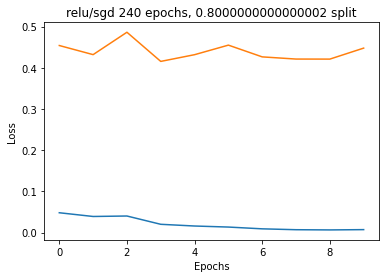

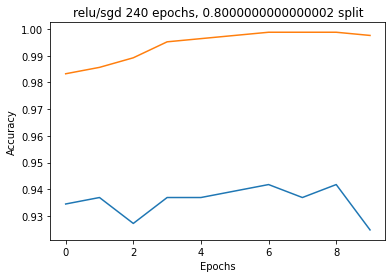

10/10 [==============================] - 0s 4ms/step - loss: 0.5518 - sparse_categorical_accuracy: 0.8782
Generation 2: 
Test Data:[0.5518268346786499, 0.8782051205635071], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.5518 - sparse_categorical_accuracy: 0.8782


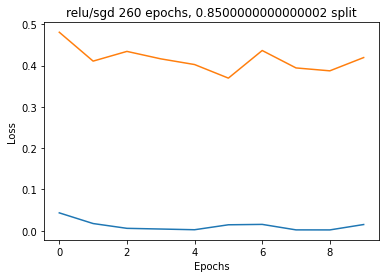

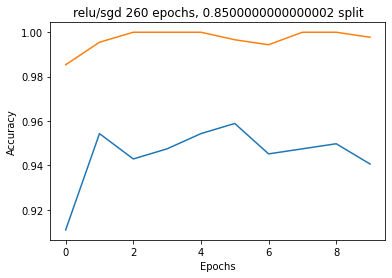

8/8 [==============================] - 0s 4ms/step - loss: 0.5479 - sparse_categorical_accuracy: 0.8675
Generation 2: 
Test Data:[0.5479151010513306, 0.867521345615387], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.5479 - sparse_categorical_accuracy: 0.8675


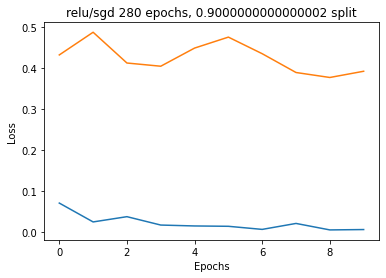

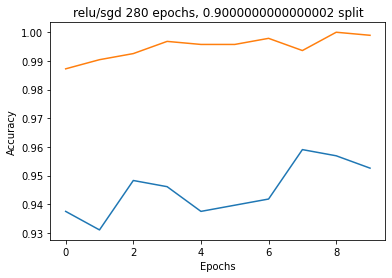

5/5 [==============================] - 0s 4ms/step - loss: 0.5037 - sparse_categorical_accuracy: 0.8910
Generation 2: 
Test Data:[0.5036889910697937, 0.8910256624221802], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.5037 - sparse_categorical_accuracy: 0.8910


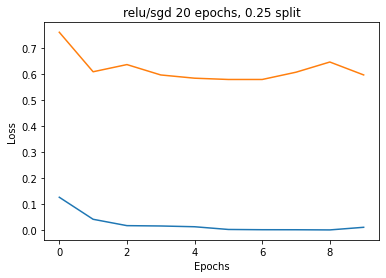

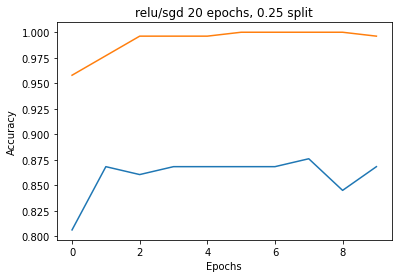

37/37 [==============================] - 0s 4ms/step - loss: 0.3109 - sparse_categorical_accuracy: 0.9701
Generation 3: 
Test Data:[0.310884565114975, 0.9700854420661926], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.3109 - sparse_categorical_accuracy: 0.9701


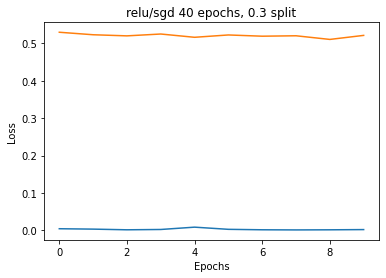

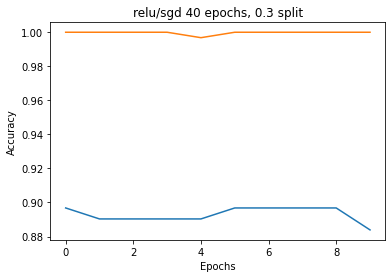

35/35 [==============================] - 0s 4ms/step - loss: 0.3024 - sparse_categorical_accuracy: 0.9670
Generation 3: 
Test Data:[0.30237120389938354, 0.9670329689979553], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.3024 - sparse_categorical_accuracy: 0.9670


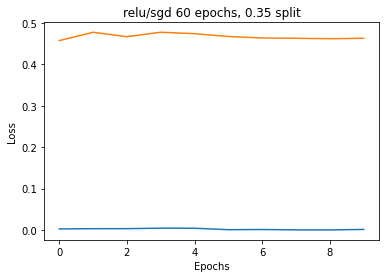

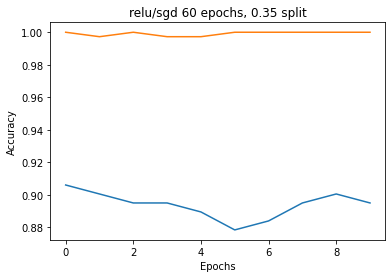

32/32 [==============================] - 0s 4ms/step - loss: 0.2876 - sparse_categorical_accuracy: 0.9684
Generation 3: 
Test Data:[0.2876195013523102, 0.9684418439865112], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.2876 - sparse_categorical_accuracy: 0.9684


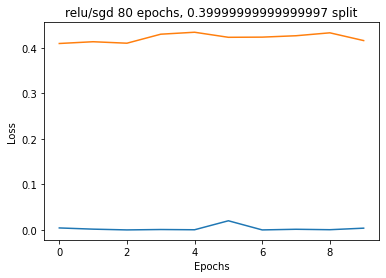

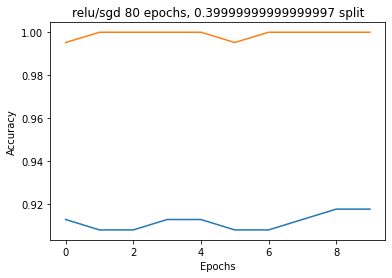

30/30 [==============================] - 0s 4ms/step - loss: 0.2901 - sparse_categorical_accuracy: 0.9669
Generation 3: 
Test Data:[0.29012566804885864, 0.9668803215026855], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.2901 - sparse_categorical_accuracy: 0.9669


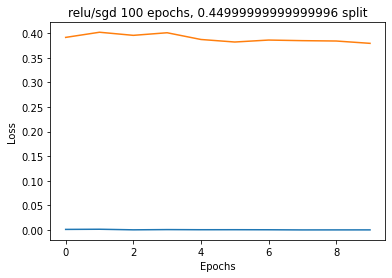

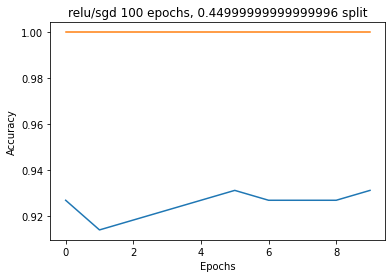

27/27 [==============================] - 0s 4ms/step - loss: 0.2884 - sparse_categorical_accuracy: 0.9639
Generation 3: 
Test Data:[0.2884376049041748, 0.9639115333557129], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.2884 - sparse_categorical_accuracy: 0.9639


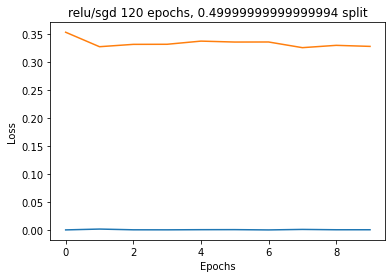

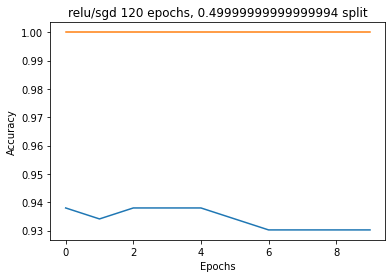

25/25 [==============================] - 0s 4ms/step - loss: 0.2576 - sparse_categorical_accuracy: 0.9603
Generation 3: 
Test Data:[0.2575661838054657, 0.9603073000907898], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.2576 - sparse_categorical_accuracy: 0.9603


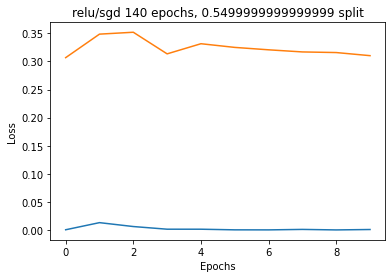

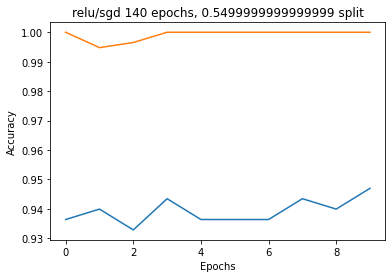

22/22 [==============================] - 0s 4ms/step - loss: 0.2696 - sparse_categorical_accuracy: 0.9559
Generation 3: 
Test Data:[0.2695985436439514, 0.9559032917022705], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.2696 - sparse_categorical_accuracy: 0.9559


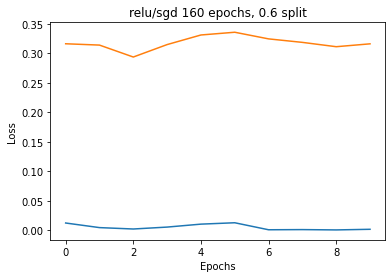

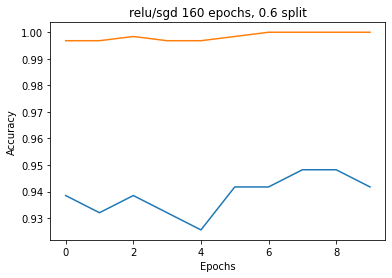

20/20 [==============================] - 0s 4ms/step - loss: 0.2655 - sparse_categorical_accuracy: 0.9583
Generation 3: 
Test Data:[0.265547513961792, 0.9583333134651184], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.2655 - sparse_categorical_accuracy: 0.9583


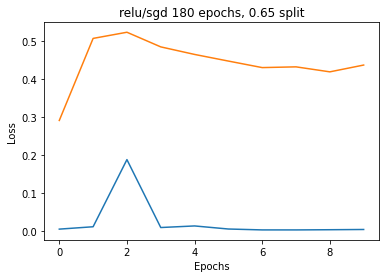

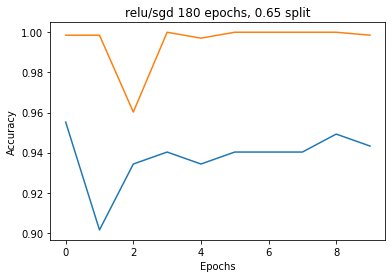

18/18 [==============================] - 0s 4ms/step - loss: 0.4191 - sparse_categorical_accuracy: 0.9487
Generation 3: 
Test Data:[0.4191282391548157, 0.9487179517745972], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.4191 - sparse_categorical_accuracy: 0.9487


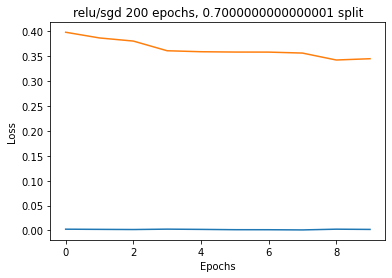

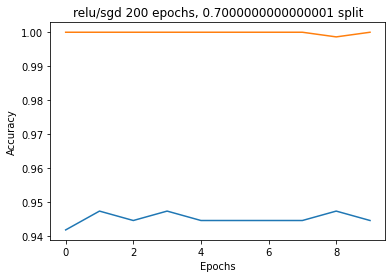

15/15 [==============================] - 0s 4ms/step - loss: 0.3485 - sparse_categorical_accuracy: 0.9509
Generation 3: 
Test Data:[0.34846121072769165, 0.9508547186851501], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.3485 - sparse_categorical_accuracy: 0.9509


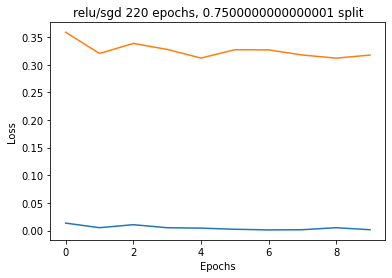

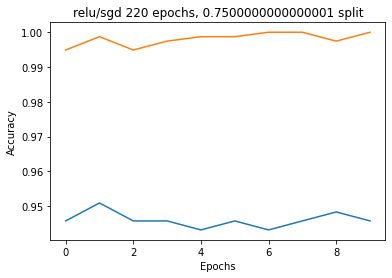

13/13 [==============================] - 0s 4ms/step - loss: 0.3458 - sparse_categorical_accuracy: 0.9436
Generation 3: 
Test Data:[0.3457900285720825, 0.9435897469520569], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.3458 - sparse_categorical_accuracy: 0.9436


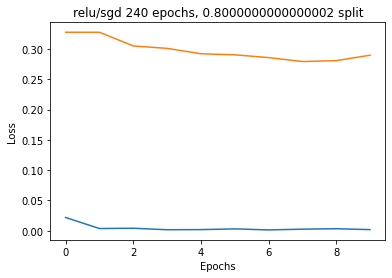

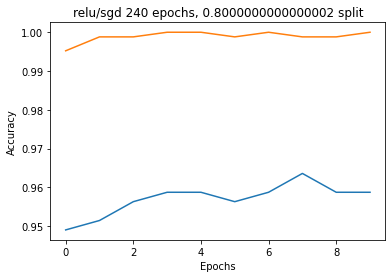

10/10 [==============================] - 0s 5ms/step - loss: 0.3482 - sparse_categorical_accuracy: 0.9391
Generation 3: 
Test Data:[0.34818339347839355, 0.9391025900840759], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.3482 - sparse_categorical_accuracy: 0.9391


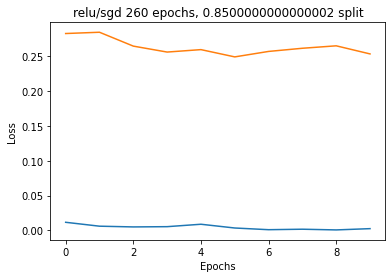

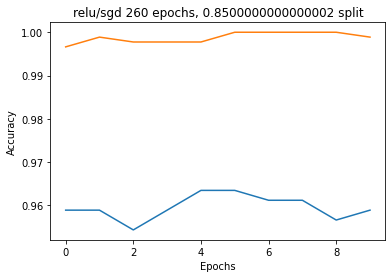

8/8 [==============================] - 0s 4ms/step - loss: 0.3791 - sparse_categorical_accuracy: 0.9060
Generation 3: 
Test Data:[0.37912043929100037, 0.9059829115867615], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.3791 - sparse_categorical_accuracy: 0.9060


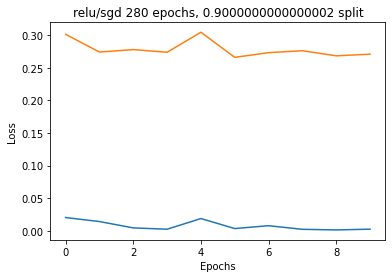

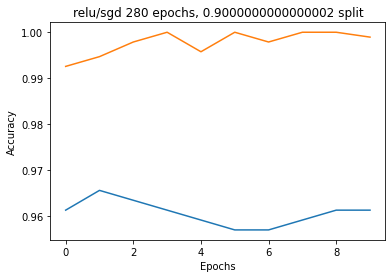

5/5 [==============================] - 0s 5ms/step - loss: 0.4059 - sparse_categorical_accuracy: 0.9038
Generation 3: 
Test Data:[0.4059491753578186, 0.9038461446762085], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 5ms/step - loss: 0.4059 - sparse_categorical_accuracy: 0.9038


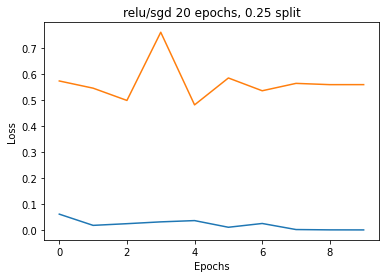

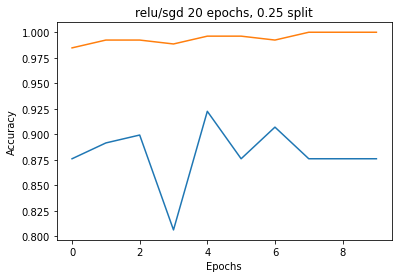

37/37 [==============================] - 0s 4ms/step - loss: 0.2416 - sparse_categorical_accuracy: 0.9709
Generation 4: 
Test Data:[0.24163992702960968, 0.9709401726722717], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.2416 - sparse_categorical_accuracy: 0.9709


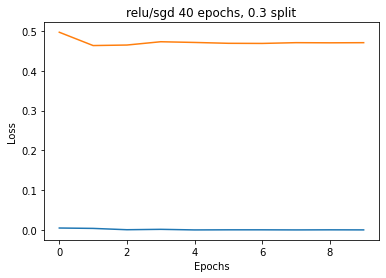

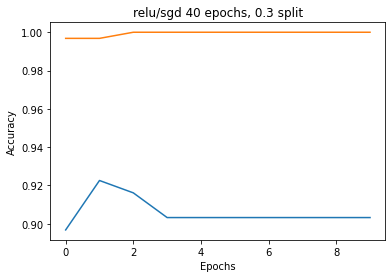

35/35 [==============================] - 0s 4ms/step - loss: 0.2309 - sparse_categorical_accuracy: 0.9725
Generation 4: 
Test Data:[0.23093676567077637, 0.9725274443626404], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.2309 - sparse_categorical_accuracy: 0.9725


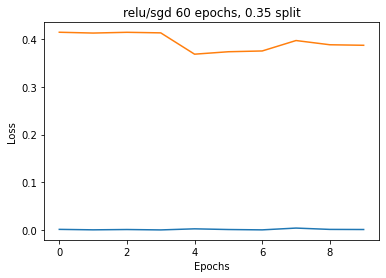

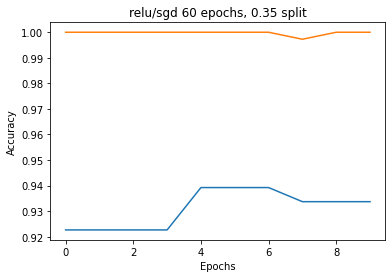

32/32 [==============================] - 0s 4ms/step - loss: 0.2175 - sparse_categorical_accuracy: 0.9763
Generation 4: 
Test Data:[0.21754489839076996, 0.976331353187561], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.2175 - sparse_categorical_accuracy: 0.9763


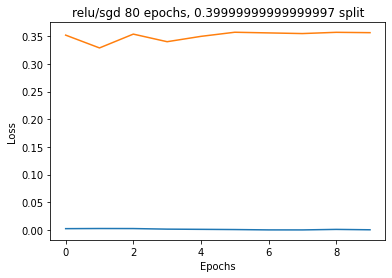

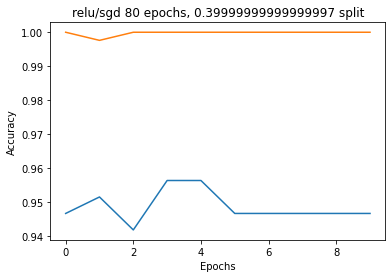

30/30 [==============================] - 0s 4ms/step - loss: 0.2214 - sparse_categorical_accuracy: 0.9722
Generation 4: 
Test Data:[0.22144749760627747, 0.9722222089767456], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.2214 - sparse_categorical_accuracy: 0.9722


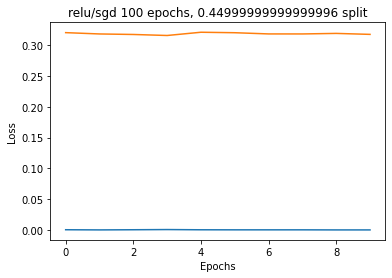

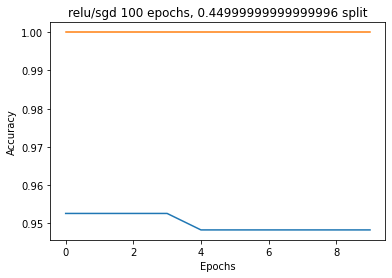

27/27 [==============================] - 0s 4ms/step - loss: 0.2149 - sparse_categorical_accuracy: 0.9721
Generation 4: 
Test Data:[0.21489880979061127, 0.9720605611801147], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.2149 - sparse_categorical_accuracy: 0.9721


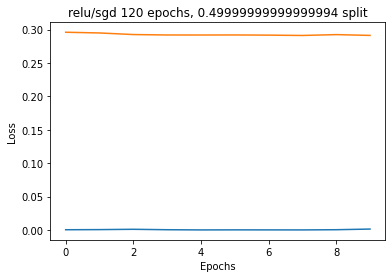

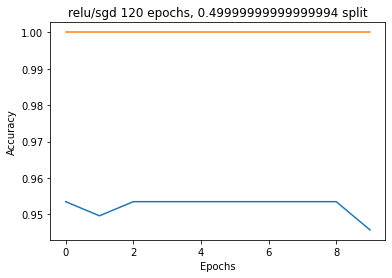

25/25 [==============================] - 0s 4ms/step - loss: 0.2101 - sparse_categorical_accuracy: 0.9731
Generation 4: 
Test Data:[0.21008653938770294, 0.9731113910675049], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.2101 - sparse_categorical_accuracy: 0.9731


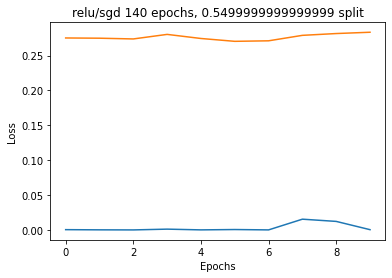

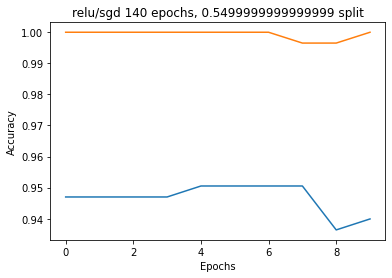

22/22 [==============================] - 0s 4ms/step - loss: 0.2296 - sparse_categorical_accuracy: 0.9644
Generation 4: 
Test Data:[0.22958284616470337, 0.9644381403923035], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.2296 - sparse_categorical_accuracy: 0.9644


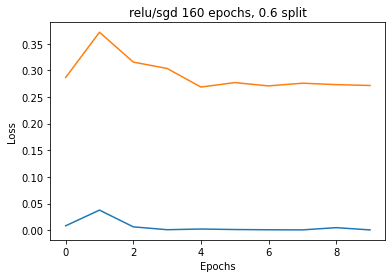

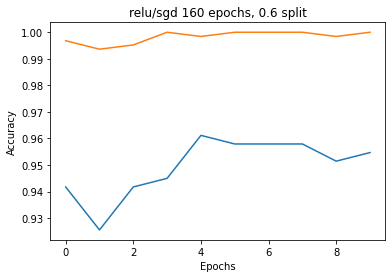

20/20 [==============================] - 0s 4ms/step - loss: 0.2259 - sparse_categorical_accuracy: 0.9696
Generation 4: 
Test Data:[0.22585494816303253, 0.9695512652397156], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.2259 - sparse_categorical_accuracy: 0.9696


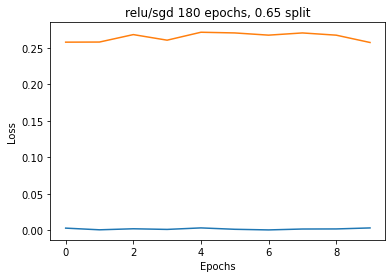

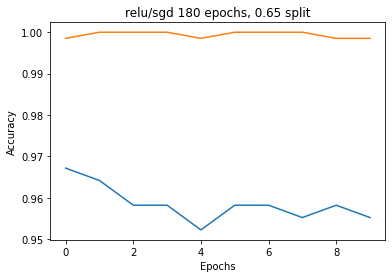

18/18 [==============================] - 0s 4ms/step - loss: 0.2336 - sparse_categorical_accuracy: 0.9615
Generation 4: 
Test Data:[0.23355652391910553, 0.9615384340286255], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.2336 - sparse_categorical_accuracy: 0.9615


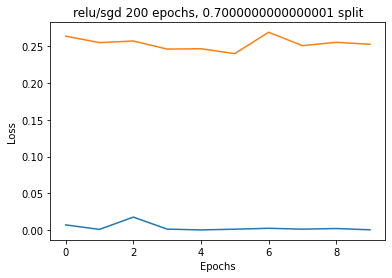

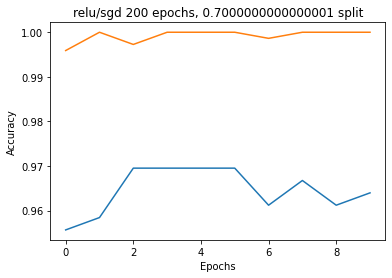

15/15 [==============================] - 0s 4ms/step - loss: 0.2494 - sparse_categorical_accuracy: 0.9658
Generation 4: 
Test Data:[0.24943433701992035, 0.9658119678497314], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.2494 - sparse_categorical_accuracy: 0.9658


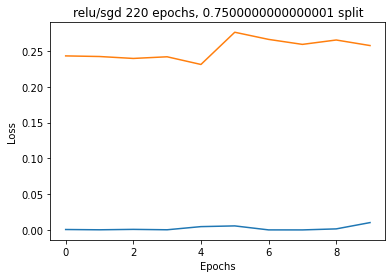

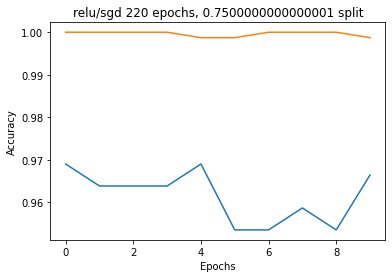

13/13 [==============================] - 0s 4ms/step - loss: 0.2931 - sparse_categorical_accuracy: 0.9564
Generation 4: 
Test Data:[0.29309308528900146, 0.9564102292060852], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.2931 - sparse_categorical_accuracy: 0.9564


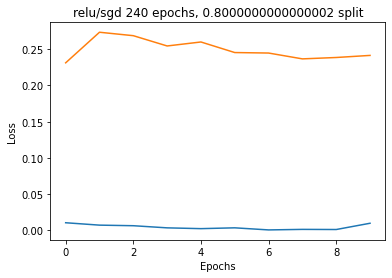

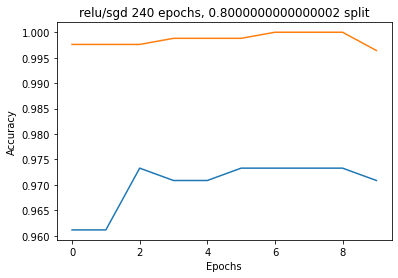

10/10 [==============================] - 0s 4ms/step - loss: 0.3075 - sparse_categorical_accuracy: 0.9487
Generation 4: 
Test Data:[0.3075254559516907, 0.9487179517745972], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.3075 - sparse_categorical_accuracy: 0.9487


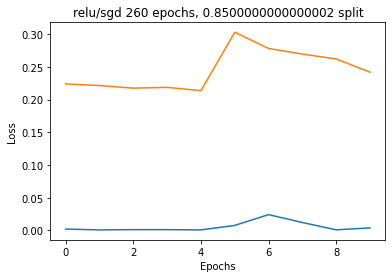

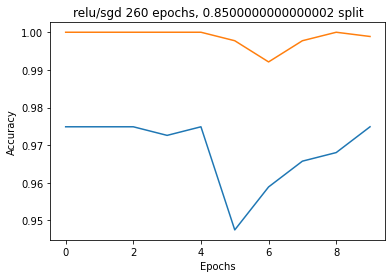

8/8 [==============================] - 0s 4ms/step - loss: 0.3485 - sparse_categorical_accuracy: 0.9444
Generation 4: 
Test Data:[0.3485177755355835, 0.9444444179534912], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.3485 - sparse_categorical_accuracy: 0.9444


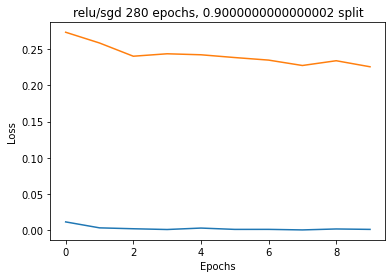

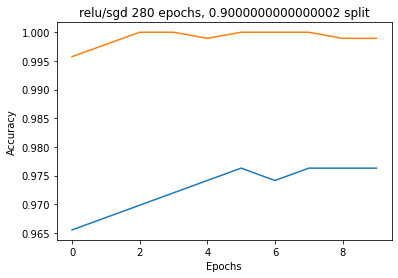

5/5 [==============================] - 0s 5ms/step - loss: 0.3682 - sparse_categorical_accuracy: 0.9295
Generation 4: 
Test Data:[0.36817437410354614, 0.9294871687889099], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.3682 - sparse_categorical_accuracy: 0.9295


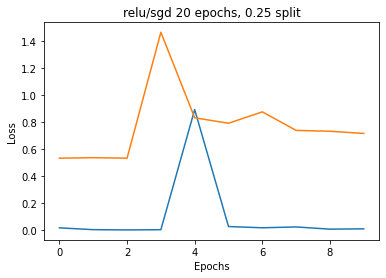

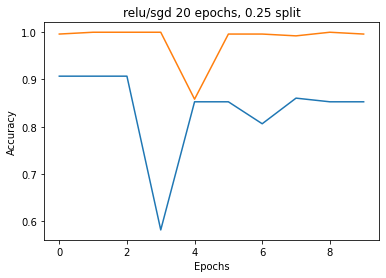

37/37 [==============================] - 0s 4ms/step - loss: 0.4363 - sparse_categorical_accuracy: 0.9564
Generation 5: 
Test Data:[0.43628939986228943, 0.9564102292060852], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.4363 - sparse_categorical_accuracy: 0.9564


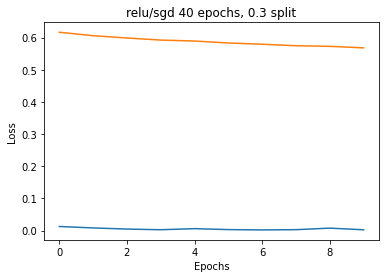

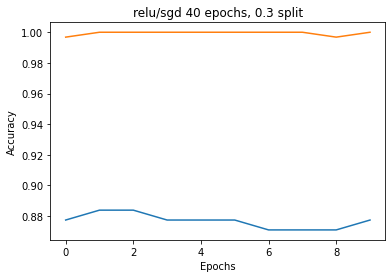

35/35 [==============================] - 0s 4ms/step - loss: 0.3685 - sparse_categorical_accuracy: 0.9689
Generation 5: 
Test Data:[0.3685489594936371, 0.9688644409179688], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.3685 - sparse_categorical_accuracy: 0.9689


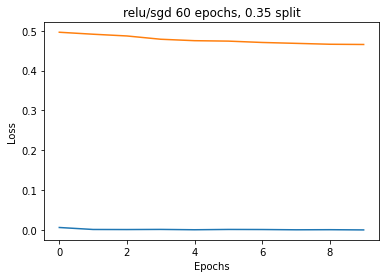

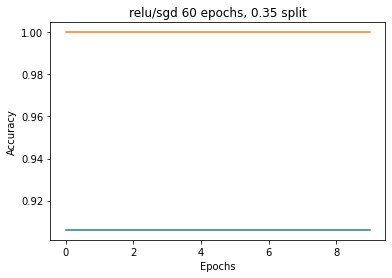

32/32 [==============================] - 0s 4ms/step - loss: 0.3239 - sparse_categorical_accuracy: 0.9684
Generation 5: 
Test Data:[0.32393789291381836, 0.9684418439865112], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.3239 - sparse_categorical_accuracy: 0.9684


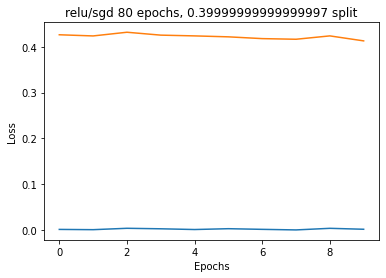

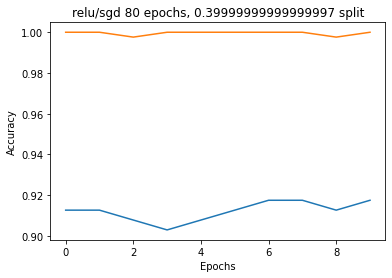

30/30 [==============================] - 0s 4ms/step - loss: 0.3168 - sparse_categorical_accuracy: 0.9669
Generation 5: 
Test Data:[0.3168273866176605, 0.9668803215026855], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.3168 - sparse_categorical_accuracy: 0.9669


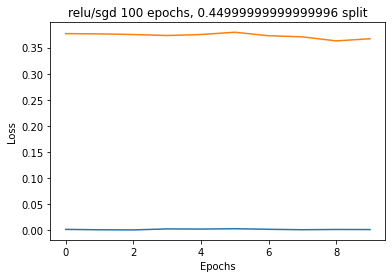

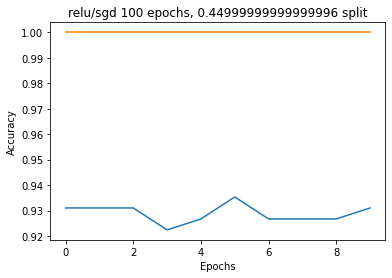

27/27 [==============================] - 0s 4ms/step - loss: 0.3020 - sparse_categorical_accuracy: 0.9697
Generation 5: 
Test Data:[0.30196771025657654, 0.9697322249412537], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.3020 - sparse_categorical_accuracy: 0.9697


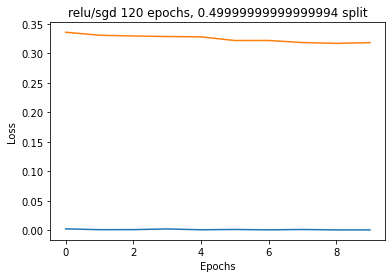

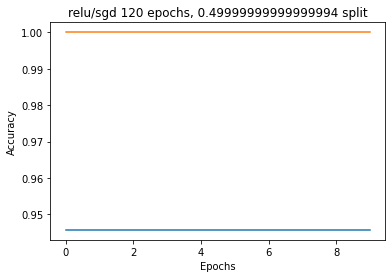

25/25 [==============================] - 0s 4ms/step - loss: 0.2686 - sparse_categorical_accuracy: 0.9706
Generation 5: 
Test Data:[0.2686319649219513, 0.9705505967140198], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.2686 - sparse_categorical_accuracy: 0.9706


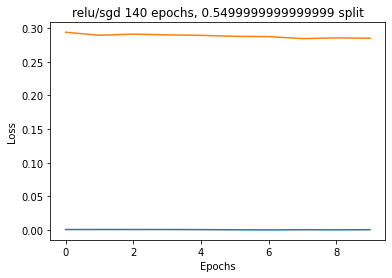

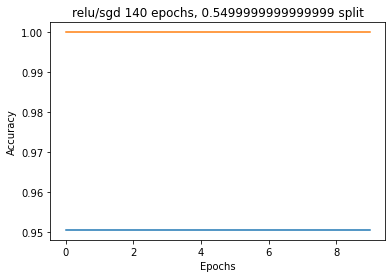

22/22 [==============================] - 0s 4ms/step - loss: 0.2628 - sparse_categorical_accuracy: 0.9701
Generation 5: 
Test Data:[0.2628023326396942, 0.9701279997825623], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.2628 - sparse_categorical_accuracy: 0.9701


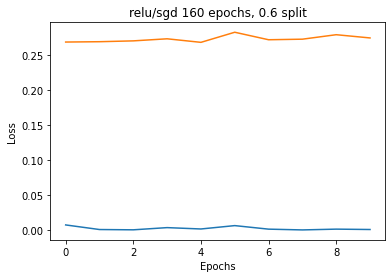

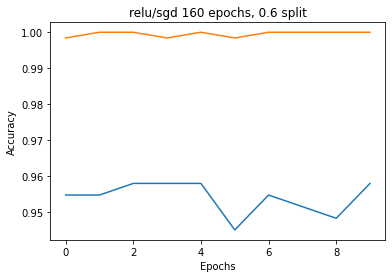

20/20 [==============================] - 0s 4ms/step - loss: 0.2559 - sparse_categorical_accuracy: 0.9647
Generation 5: 
Test Data:[0.2559041976928711, 0.9647436141967773], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 5ms/step - loss: 0.2559 - sparse_categorical_accuracy: 0.9647


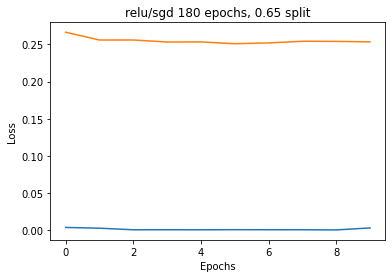

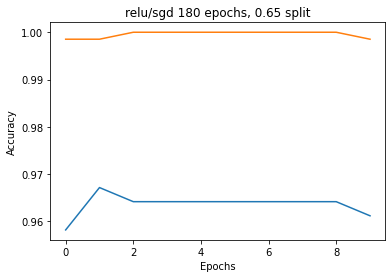

18/18 [==============================] - 0s 4ms/step - loss: 0.2619 - sparse_categorical_accuracy: 0.9615
Generation 5: 
Test Data:[0.2618654668331146, 0.9615384340286255], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.2619 - sparse_categorical_accuracy: 0.9615


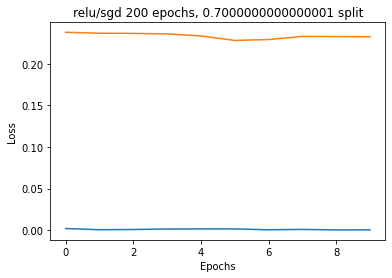

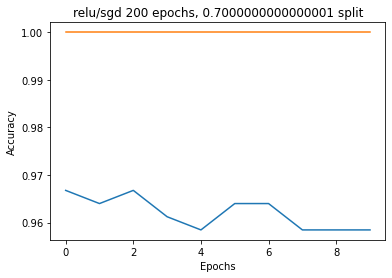

15/15 [==============================] - 0s 4ms/step - loss: 0.2605 - sparse_categorical_accuracy: 0.9551
Generation 5: 
Test Data:[0.26052647829055786, 0.9551281929016113], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.2605 - sparse_categorical_accuracy: 0.9551


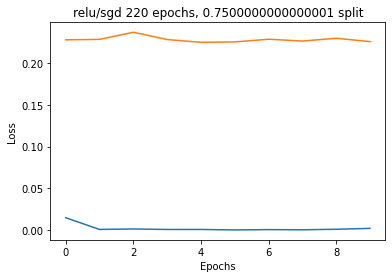

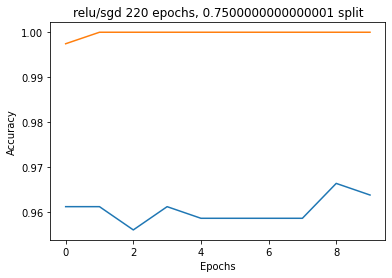

13/13 [==============================] - 0s 4ms/step - loss: 0.2754 - sparse_categorical_accuracy: 0.9538
Generation 5: 
Test Data:[0.27541258931159973, 0.9538461565971375], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.2754 - sparse_categorical_accuracy: 0.9538


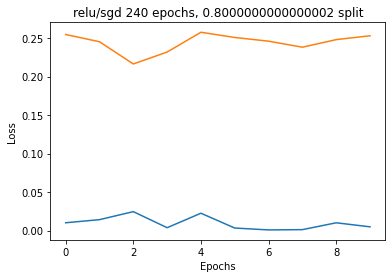

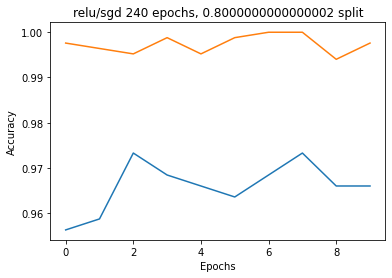

10/10 [==============================] - 0s 4ms/step - loss: 0.3450 - sparse_categorical_accuracy: 0.9455
Generation 5: 
Test Data:[0.34500211477279663, 0.9455128312110901], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.3450 - sparse_categorical_accuracy: 0.9455


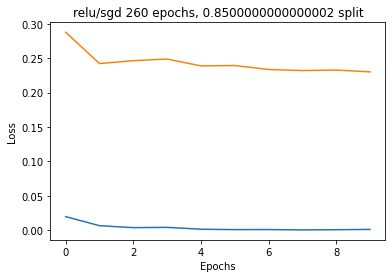

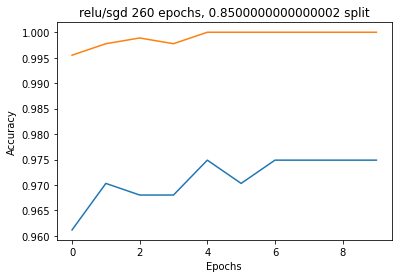

8/8 [==============================] - 0s 5ms/step - loss: 0.3703 - sparse_categorical_accuracy: 0.9274
Generation 5: 
Test Data:[0.3702506124973297, 0.9273504018783569], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.3703 - sparse_categorical_accuracy: 0.9274


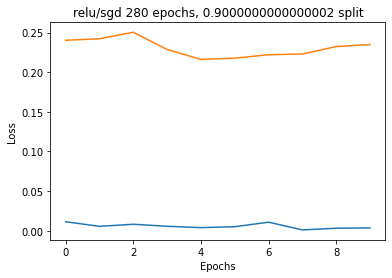

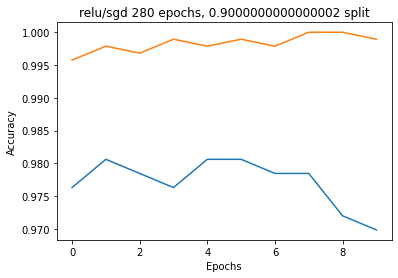

5/5 [==============================] - 0s 6ms/step - loss: 0.4160 - sparse_categorical_accuracy: 0.8910
Generation 5: 
Test Data:[0.4160214364528656, 0.8910256624221802], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 5ms/step - loss: 0.4160 - sparse_categorical_accuracy: 0.8910


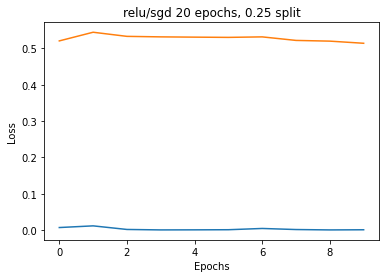

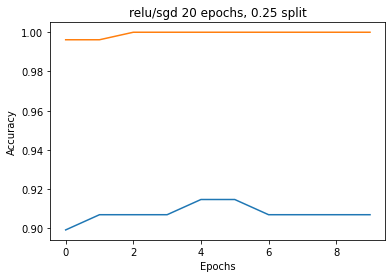

37/37 [==============================] - 0s 4ms/step - loss: 0.1950 - sparse_categorical_accuracy: 0.9812
Generation 6: 
Test Data:[0.19500339031219482, 0.9811965823173523], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.1950 - sparse_categorical_accuracy: 0.9812


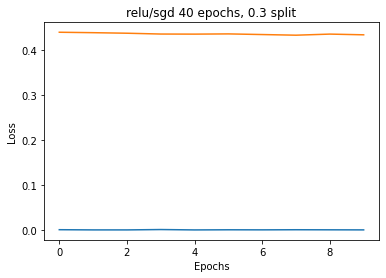

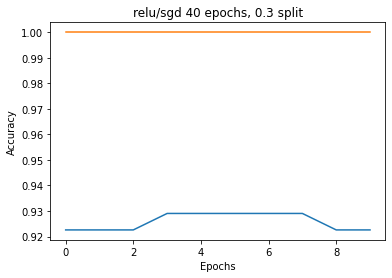

35/35 [==============================] - 0s 4ms/step - loss: 0.1880 - sparse_categorical_accuracy: 0.9817
Generation 6: 
Test Data:[0.1879585236310959, 0.9816849827766418], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.1880 - sparse_categorical_accuracy: 0.9817


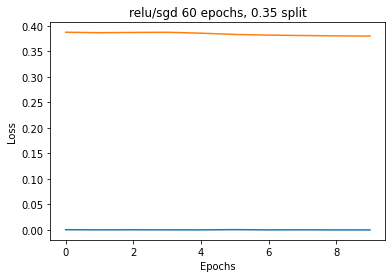

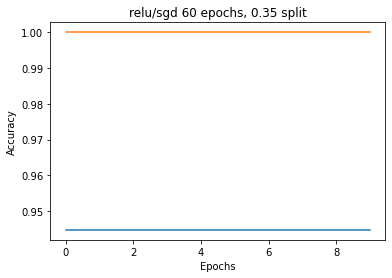

32/32 [==============================] - 0s 4ms/step - loss: 0.1851 - sparse_categorical_accuracy: 0.9783
Generation 6: 
Test Data:[0.18506531417369843, 0.9783037304878235], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1851 - sparse_categorical_accuracy: 0.9783


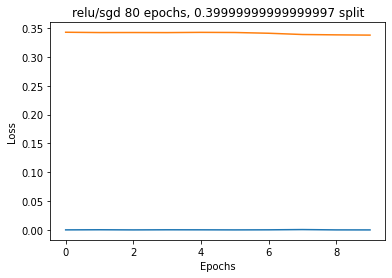

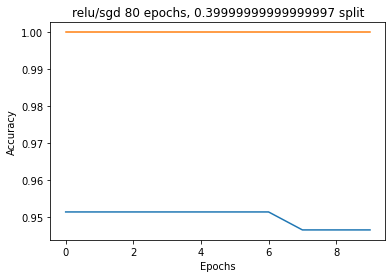

30/30 [==============================] - 0s 4ms/step - loss: 0.1913 - sparse_categorical_accuracy: 0.9776
Generation 6: 
Test Data:[0.19127613306045532, 0.9775640964508057], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.1913 - sparse_categorical_accuracy: 0.9776


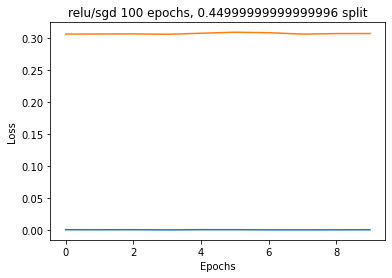

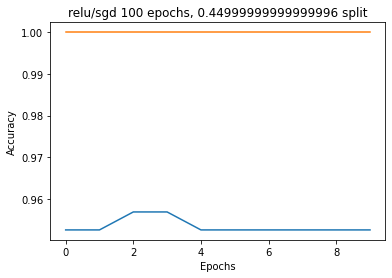

27/27 [==============================] - 0s 4ms/step - loss: 0.1941 - sparse_categorical_accuracy: 0.9756
Generation 6: 
Test Data:[0.19406341016292572, 0.9755529761314392], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 5ms/step - loss: 0.1941 - sparse_categorical_accuracy: 0.9756


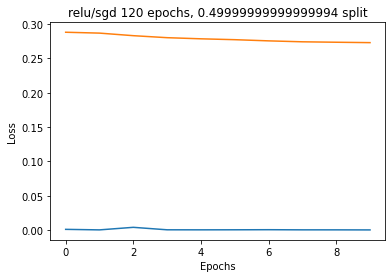

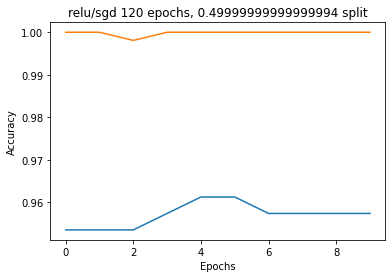

25/25 [==============================] - 0s 4ms/step - loss: 0.1859 - sparse_categorical_accuracy: 0.9744
Generation 6: 
Test Data:[0.18587367236614227, 0.9743918180465698], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.1859 - sparse_categorical_accuracy: 0.9744


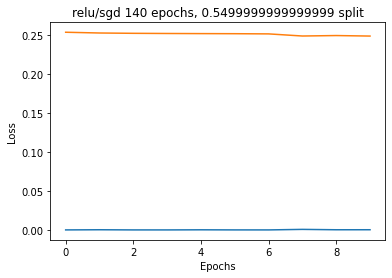

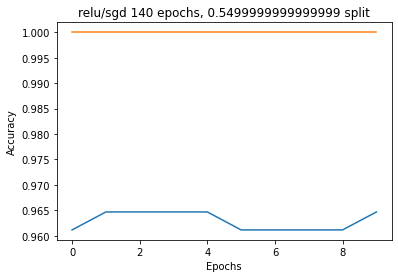

22/22 [==============================] - 0s 4ms/step - loss: 0.1877 - sparse_categorical_accuracy: 0.9701
Generation 6: 
Test Data:[0.1877002716064453, 0.9701279997825623], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.1877 - sparse_categorical_accuracy: 0.9701


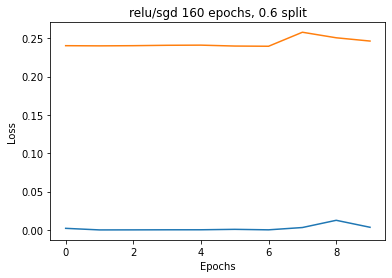

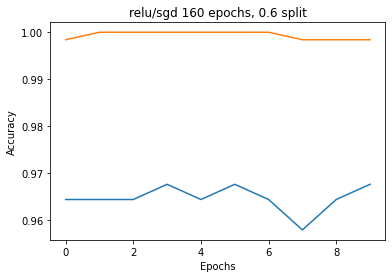

20/20 [==============================] - 0s 4ms/step - loss: 0.2043 - sparse_categorical_accuracy: 0.9712
Generation 6: 
Test Data:[0.20427735149860382, 0.9711538553237915], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.2043 - sparse_categorical_accuracy: 0.9712


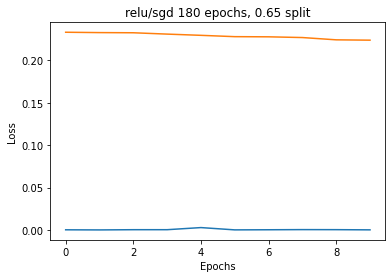

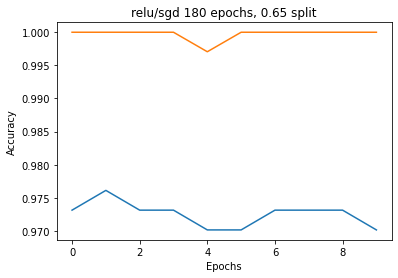

18/18 [==============================] - 0s 4ms/step - loss: 0.2083 - sparse_categorical_accuracy: 0.9689
Generation 6: 
Test Data:[0.2082507610321045, 0.9688644409179688], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.2083 - sparse_categorical_accuracy: 0.9689


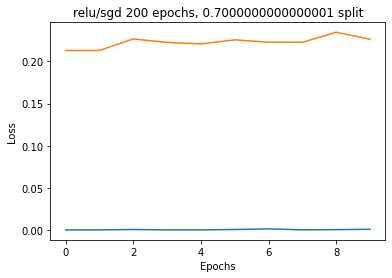

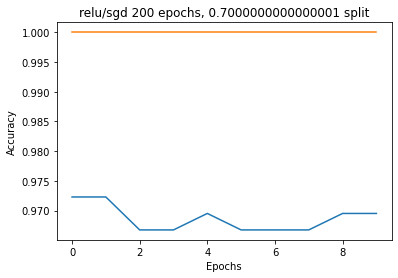

15/15 [==============================] - 0s 5ms/step - loss: 0.2333 - sparse_categorical_accuracy: 0.9679
Generation 6: 
Test Data:[0.23325519263744354, 0.9679487347602844], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.2333 - sparse_categorical_accuracy: 0.9679


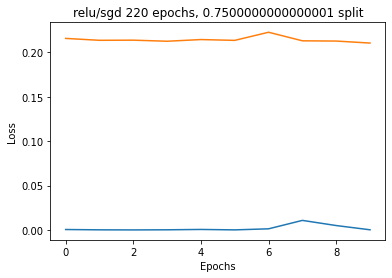

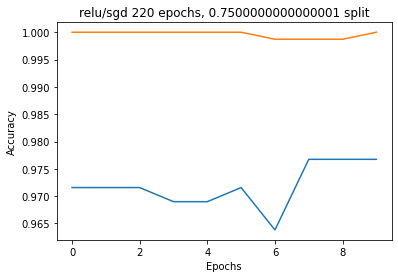

13/13 [==============================] - 0s 4ms/step - loss: 0.2444 - sparse_categorical_accuracy: 0.9590
Generation 6: 
Test Data:[0.24439869821071625, 0.9589743614196777], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.2444 - sparse_categorical_accuracy: 0.9590


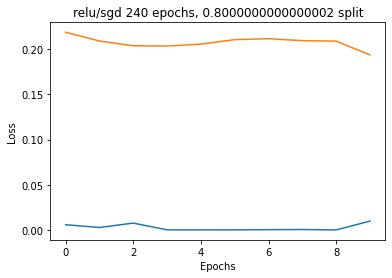

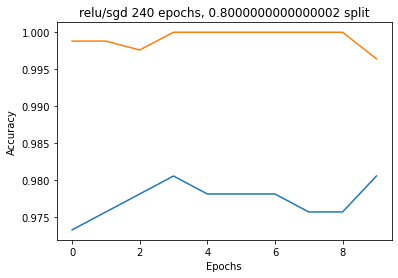

10/10 [==============================] - 0s 4ms/step - loss: 0.2637 - sparse_categorical_accuracy: 0.9519
Generation 6: 
Test Data:[0.263700932264328, 0.9519230723381042], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.2637 - sparse_categorical_accuracy: 0.9519


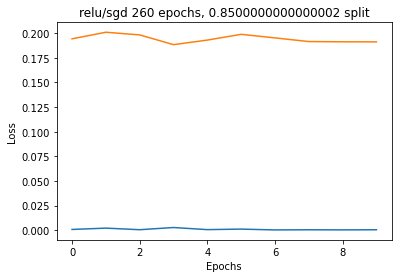

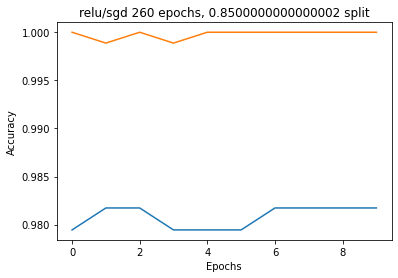

8/8 [==============================] - 0s 5ms/step - loss: 0.3124 - sparse_categorical_accuracy: 0.9359
Generation 6: 
Test Data:[0.31235772371292114, 0.9358974099159241], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 5ms/step - loss: 0.3124 - sparse_categorical_accuracy: 0.9359


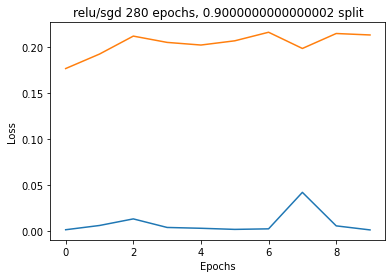

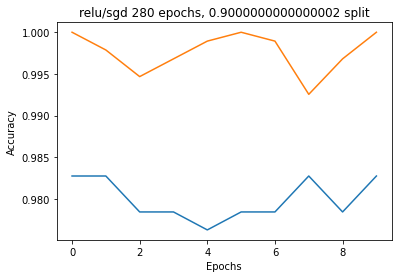

5/5 [==============================] - 0s 5ms/step - loss: 0.3945 - sparse_categorical_accuracy: 0.9038
Generation 6: 
Test Data:[0.3945029377937317, 0.9038461446762085], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.3945 - sparse_categorical_accuracy: 0.9038


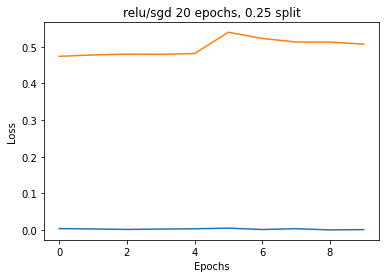

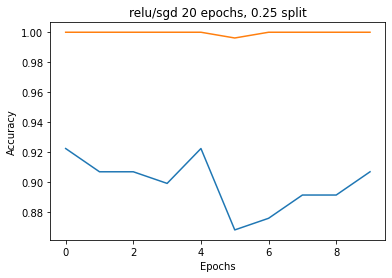

37/37 [==============================] - 0s 4ms/step - loss: 0.1984 - sparse_categorical_accuracy: 0.9829
Generation 7: 
Test Data:[0.19841188192367554, 0.9829059839248657], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.1984 - sparse_categorical_accuracy: 0.9829


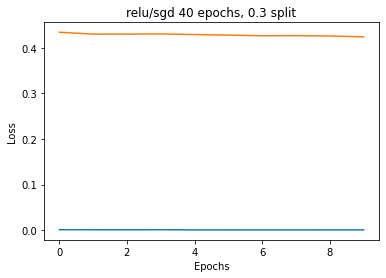

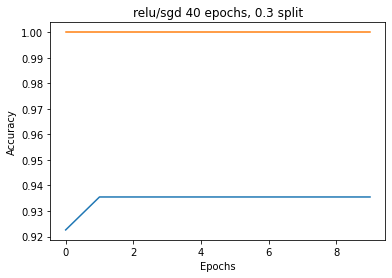

35/35 [==============================] - 0s 4ms/step - loss: 0.1871 - sparse_categorical_accuracy: 0.9835
Generation 7: 
Test Data:[0.18708716332912445, 0.9835164546966553], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.1871 - sparse_categorical_accuracy: 0.9835


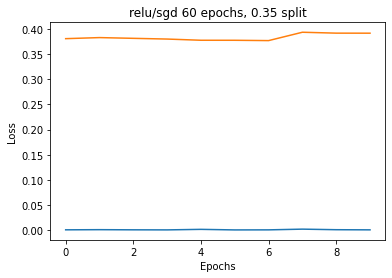

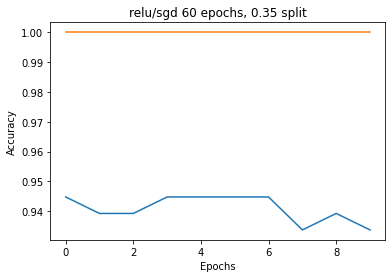

32/32 [==============================] - 0s 4ms/step - loss: 0.1985 - sparse_categorical_accuracy: 0.9783
Generation 7: 
Test Data:[0.1984914392232895, 0.9783037304878235], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1985 - sparse_categorical_accuracy: 0.9783


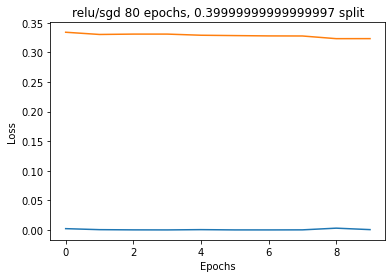

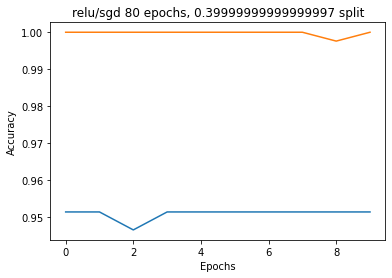

30/30 [==============================] - 0s 5ms/step - loss: 0.1827 - sparse_categorical_accuracy: 0.9786
Generation 7: 
Test Data:[0.18266691267490387, 0.9786324501037598], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.1827 - sparse_categorical_accuracy: 0.9786


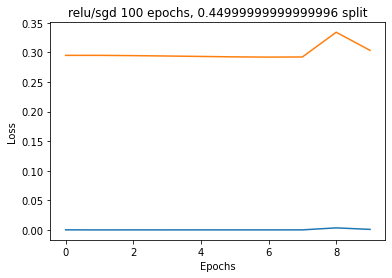

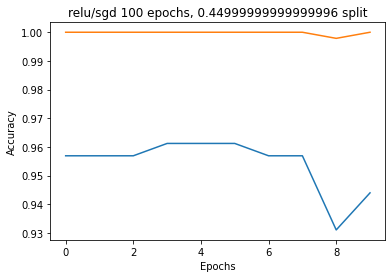

27/27 [==============================] - 0s 4ms/step - loss: 0.1901 - sparse_categorical_accuracy: 0.9779
Generation 7: 
Test Data:[0.1901147961616516, 0.9778812527656555], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.1901 - sparse_categorical_accuracy: 0.9779


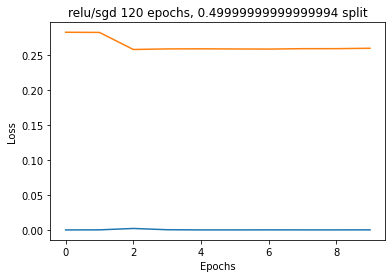

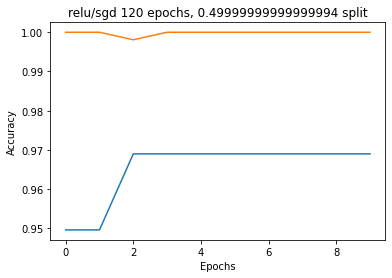

25/25 [==============================] - 0s 5ms/step - loss: 0.1744 - sparse_categorical_accuracy: 0.9782
Generation 7: 
Test Data:[0.17435061931610107, 0.9782330393791199], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.1744 - sparse_categorical_accuracy: 0.9782


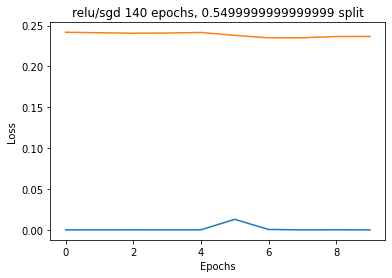

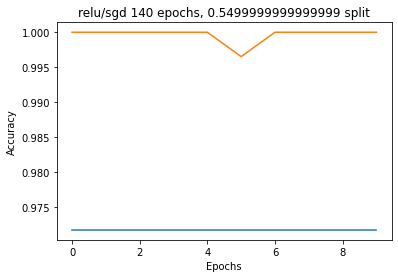

22/22 [==============================] - 0s 4ms/step - loss: 0.1754 - sparse_categorical_accuracy: 0.9758
Generation 7: 
Test Data:[0.175414577126503, 0.9758179187774658], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 5ms/step - loss: 0.1754 - sparse_categorical_accuracy: 0.9758


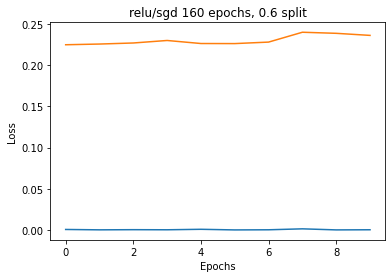

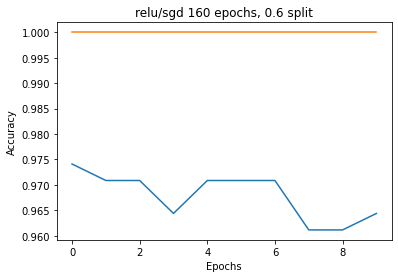

20/20 [==============================] - 0s 4ms/step - loss: 0.1876 - sparse_categorical_accuracy: 0.9728
Generation 7: 
Test Data:[0.18756243586540222, 0.9727563858032227], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.1876 - sparse_categorical_accuracy: 0.9728


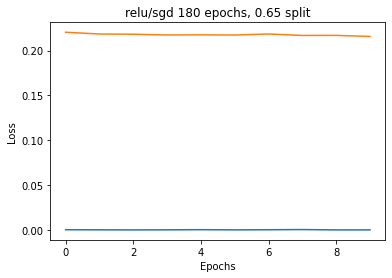

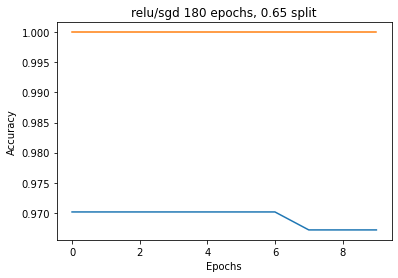

18/18 [==============================] - 0s 4ms/step - loss: 0.1951 - sparse_categorical_accuracy: 0.9707
Generation 7: 
Test Data:[0.1951037049293518, 0.970695972442627], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.1951 - sparse_categorical_accuracy: 0.9707


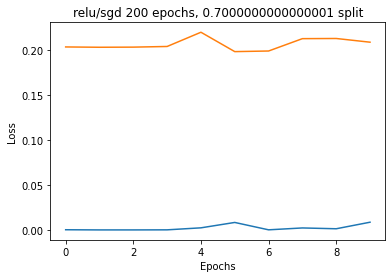

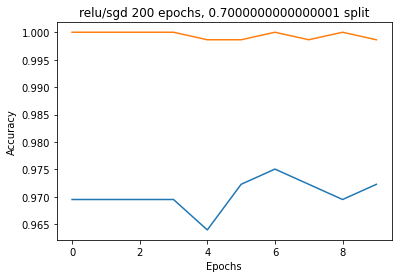

15/15 [==============================] - 0s 4ms/step - loss: 0.2165 - sparse_categorical_accuracy: 0.9658
Generation 7: 
Test Data:[0.21651342511177063, 0.9658119678497314], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.2165 - sparse_categorical_accuracy: 0.9658


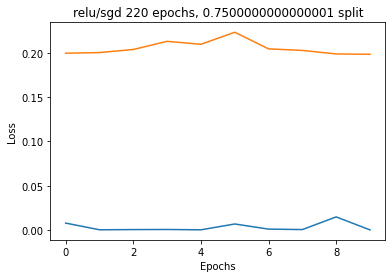

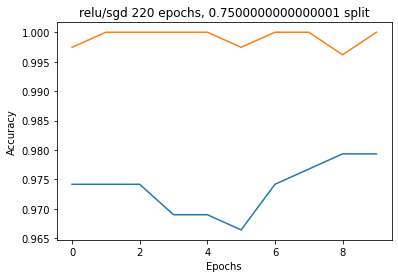

13/13 [==============================] - 0s 4ms/step - loss: 0.2404 - sparse_categorical_accuracy: 0.9590
Generation 7: 
Test Data:[0.240376278758049, 0.9589743614196777], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.2404 - sparse_categorical_accuracy: 0.9590


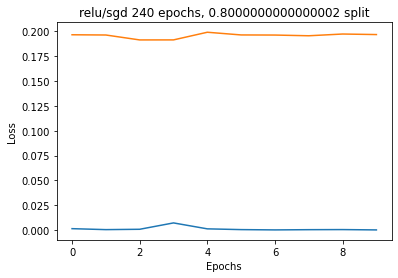

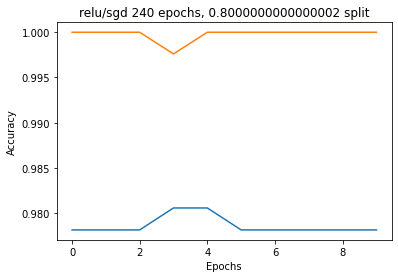

10/10 [==============================] - 0s 4ms/step - loss: 0.2707 - sparse_categorical_accuracy: 0.9487
Generation 7: 
Test Data:[0.2707173526287079, 0.9487179517745972], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.2707 - sparse_categorical_accuracy: 0.9487


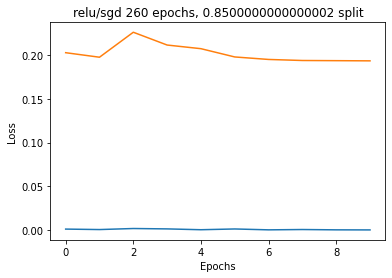

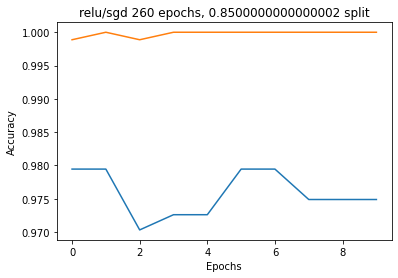

8/8 [==============================] - 0s 4ms/step - loss: 0.3179 - sparse_categorical_accuracy: 0.9231
Generation 7: 
Test Data:[0.31788018345832825, 0.9230769276618958], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.3179 - sparse_categorical_accuracy: 0.9231


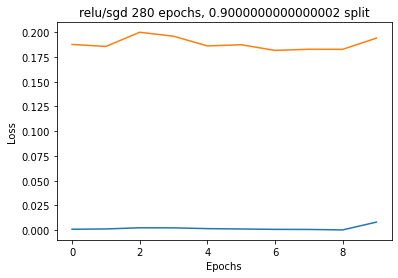

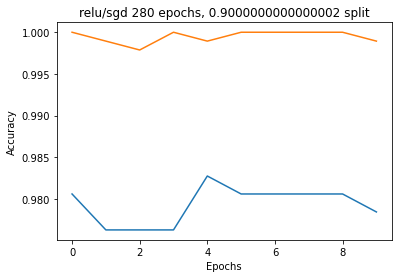

5/5 [==============================] - 0s 4ms/step - loss: 0.3817 - sparse_categorical_accuracy: 0.9167
Generation 7: 
Test Data:[0.38171687722206116, 0.9166666865348816], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 5ms/step - loss: 0.3817 - sparse_categorical_accuracy: 0.9167


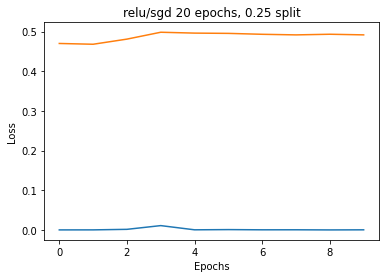

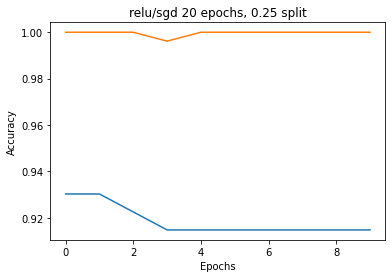

37/37 [==============================] - 0s 4ms/step - loss: 0.1608 - sparse_categorical_accuracy: 0.9829
Generation 8: 
Test Data:[0.16078008711338043, 0.9829059839248657], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.1608 - sparse_categorical_accuracy: 0.9829


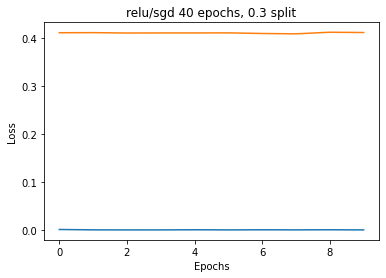

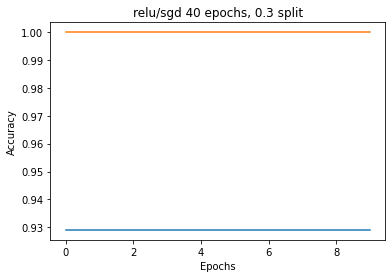

35/35 [==============================] - 0s 4ms/step - loss: 0.1541 - sparse_categorical_accuracy: 0.9835
Generation 8: 
Test Data:[0.15409459173679352, 0.9835164546966553], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.1541 - sparse_categorical_accuracy: 0.9835


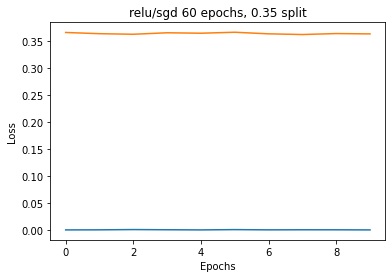

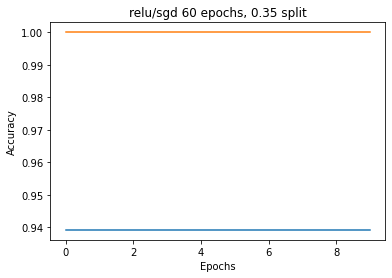

32/32 [==============================] - 0s 4ms/step - loss: 0.1549 - sparse_categorical_accuracy: 0.9813
Generation 8: 
Test Data:[0.15488219261169434, 0.9812623262405396], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1549 - sparse_categorical_accuracy: 0.9813


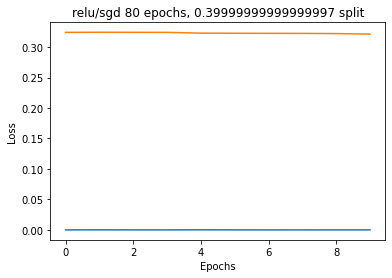

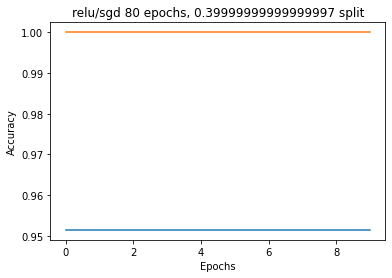

30/30 [==============================] - 0s 4ms/step - loss: 0.1577 - sparse_categorical_accuracy: 0.9797
Generation 8: 
Test Data:[0.15765415132045746, 0.9797008633613586], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.1577 - sparse_categorical_accuracy: 0.9797


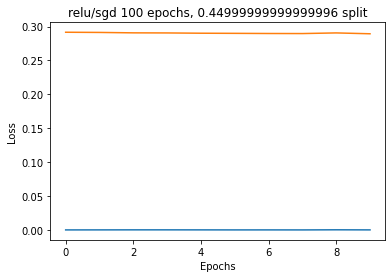

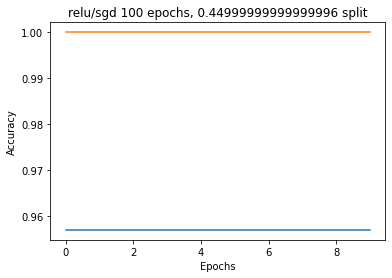

27/27 [==============================] - 0s 4ms/step - loss: 0.1607 - sparse_categorical_accuracy: 0.9779
Generation 8: 
Test Data:[0.16073471307754517, 0.9778812527656555], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.1607 - sparse_categorical_accuracy: 0.9779


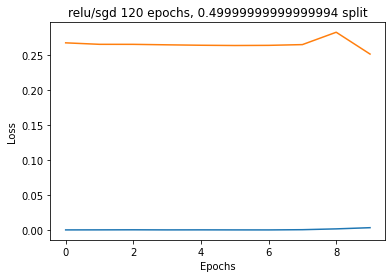

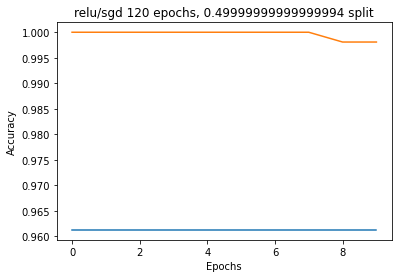

25/25 [==============================] - 0s 4ms/step - loss: 0.1495 - sparse_categorical_accuracy: 0.9782
Generation 8: 
Test Data:[0.14946630597114563, 0.9782330393791199], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.1495 - sparse_categorical_accuracy: 0.9782


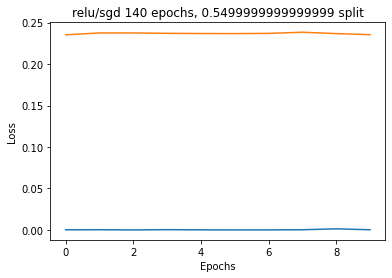

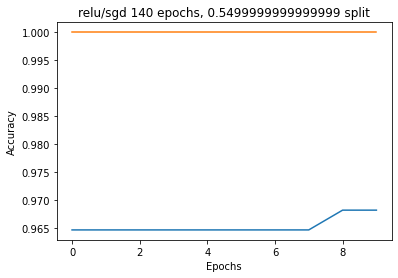

22/22 [==============================] - 0s 4ms/step - loss: 0.1652 - sparse_categorical_accuracy: 0.9758
Generation 8: 
Test Data:[0.1652434915304184, 0.9758179187774658], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.1652 - sparse_categorical_accuracy: 0.9758


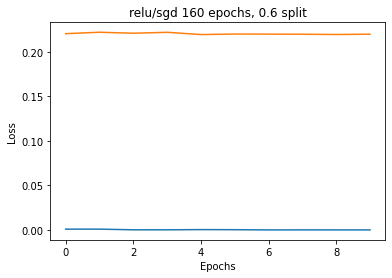

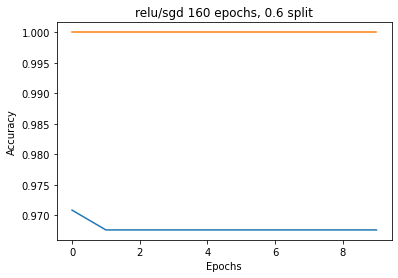

20/20 [==============================] - 0s 4ms/step - loss: 0.1622 - sparse_categorical_accuracy: 0.9744
Generation 8: 
Test Data:[0.16216608881950378, 0.9743589758872986], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.1622 - sparse_categorical_accuracy: 0.9744


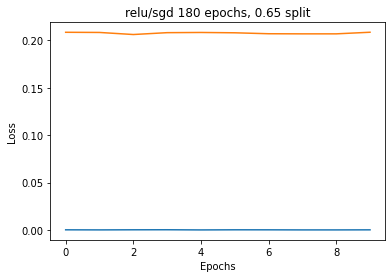

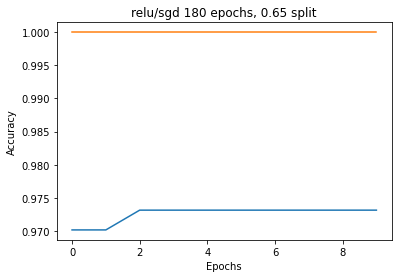

18/18 [==============================] - 0s 4ms/step - loss: 0.1757 - sparse_categorical_accuracy: 0.9744
Generation 8: 
Test Data:[0.1756718009710312, 0.9743589758872986], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.1757 - sparse_categorical_accuracy: 0.9744


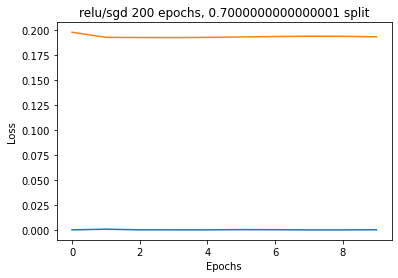

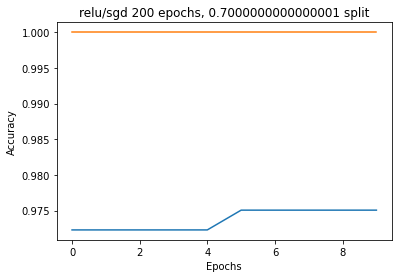

15/15 [==============================] - 0s 5ms/step - loss: 0.1838 - sparse_categorical_accuracy: 0.9679
Generation 8: 
Test Data:[0.18376676738262177, 0.9679487347602844], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.1838 - sparse_categorical_accuracy: 0.9679


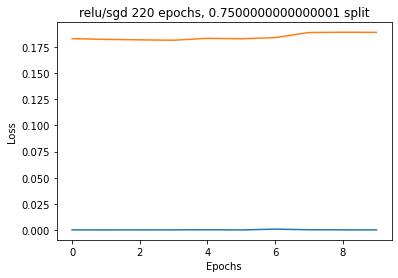

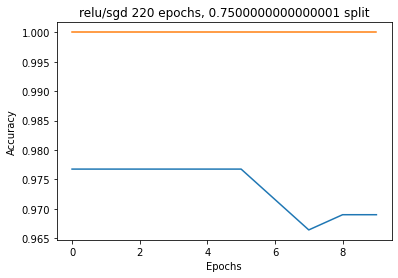

13/13 [==============================] - 0s 4ms/step - loss: 0.2076 - sparse_categorical_accuracy: 0.9641
Generation 8: 
Test Data:[0.2076045572757721, 0.964102566242218], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.2076 - sparse_categorical_accuracy: 0.9641


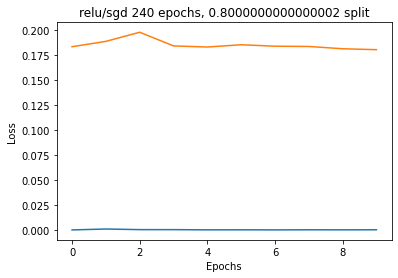

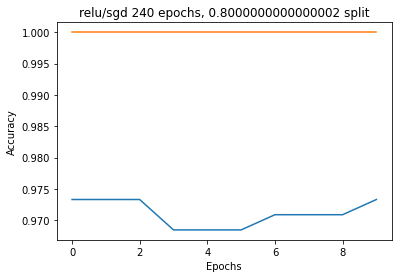

10/10 [==============================] - 0s 4ms/step - loss: 0.2436 - sparse_categorical_accuracy: 0.9519
Generation 8: 
Test Data:[0.24359093606472015, 0.9519230723381042], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.2436 - sparse_categorical_accuracy: 0.9519


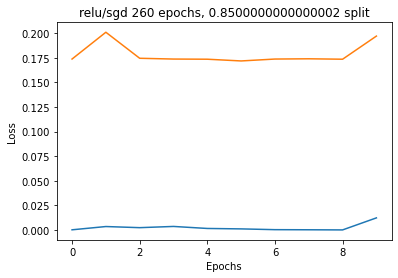

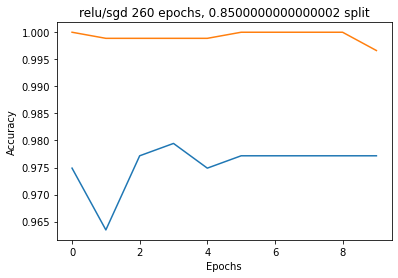

8/8 [==============================] - 0s 5ms/step - loss: 0.3133 - sparse_categorical_accuracy: 0.9444
Generation 8: 
Test Data:[0.31326359510421753, 0.9444444179534912], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.3133 - sparse_categorical_accuracy: 0.9444


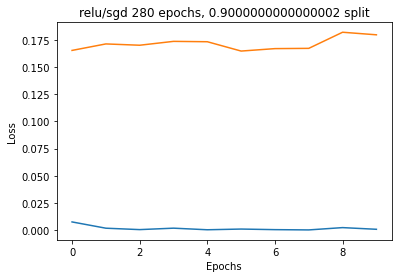

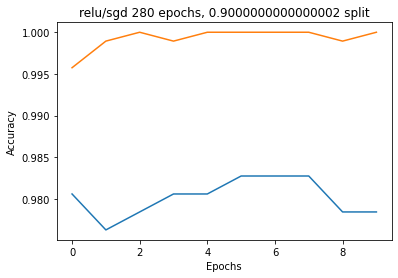

5/5 [==============================] - 0s 5ms/step - loss: 0.3701 - sparse_categorical_accuracy: 0.9103
Generation 8: 
Test Data:[0.37014448642730713, 0.9102563858032227], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.3701 - sparse_categorical_accuracy: 0.9103


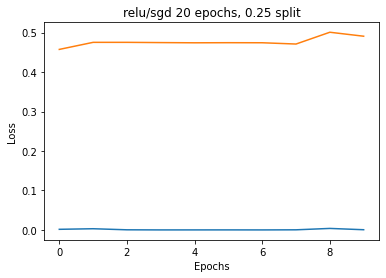

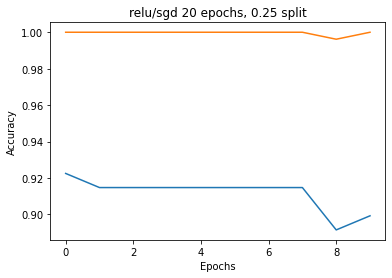

37/37 [==============================] - 0s 4ms/step - loss: 0.1560 - sparse_categorical_accuracy: 0.9803
Generation 9: 
Test Data:[0.1560119390487671, 0.9803418517112732], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.1560 - sparse_categorical_accuracy: 0.9803


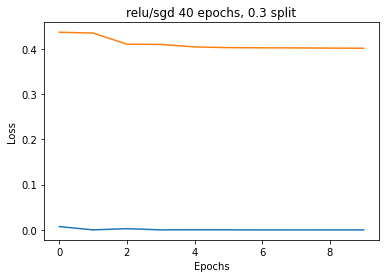

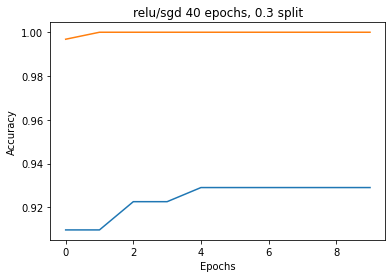

35/35 [==============================] - 0s 4ms/step - loss: 0.1473 - sparse_categorical_accuracy: 0.9826
Generation 9: 
Test Data:[0.14727769792079926, 0.982600748538971], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.1473 - sparse_categorical_accuracy: 0.9826


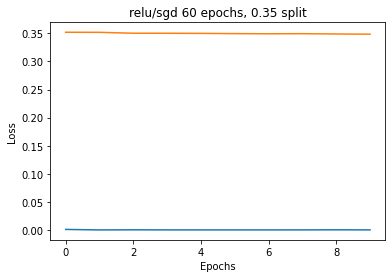

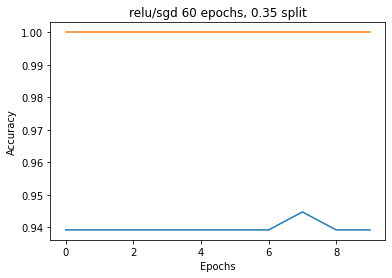

32/32 [==============================] - 0s 4ms/step - loss: 0.1473 - sparse_categorical_accuracy: 0.9822
Generation 9: 
Test Data:[0.1472732126712799, 0.9822485446929932], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1473 - sparse_categorical_accuracy: 0.9822


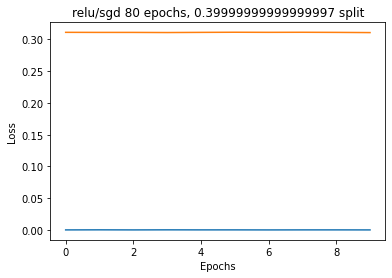

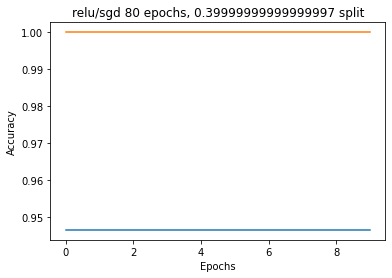

30/30 [==============================] - 0s 4ms/step - loss: 0.1529 - sparse_categorical_accuracy: 0.9808
Generation 9: 
Test Data:[0.15292073786258698, 0.9807692170143127], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.1529 - sparse_categorical_accuracy: 0.9808


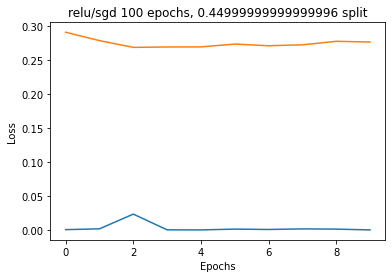

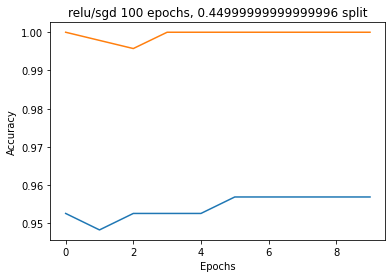

27/27 [==============================] - 0s 4ms/step - loss: 0.1548 - sparse_categorical_accuracy: 0.9779
Generation 9: 
Test Data:[0.1548081934452057, 0.9778812527656555], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.1548 - sparse_categorical_accuracy: 0.9779


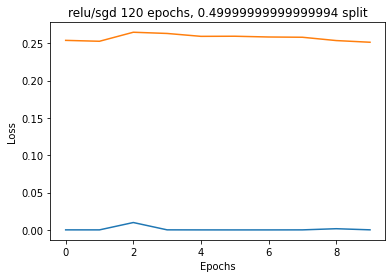

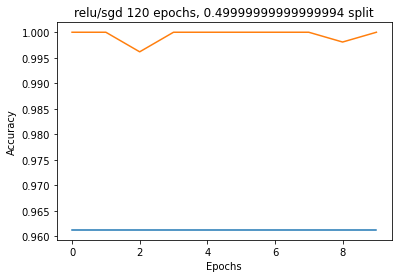

25/25 [==============================] - 0s 4ms/step - loss: 0.1540 - sparse_categorical_accuracy: 0.9808
Generation 9: 
Test Data:[0.15397284924983978, 0.980793833732605], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.1540 - sparse_categorical_accuracy: 0.9808


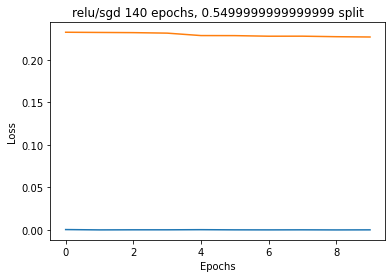

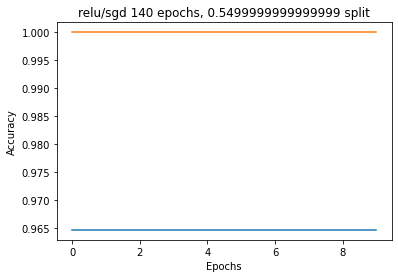

22/22 [==============================] - 0s 4ms/step - loss: 0.1552 - sparse_categorical_accuracy: 0.9787
Generation 9: 
Test Data:[0.15515948832035065, 0.9786628484725952], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.1552 - sparse_categorical_accuracy: 0.9787


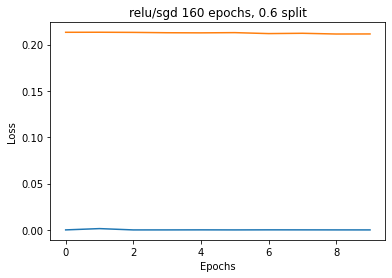

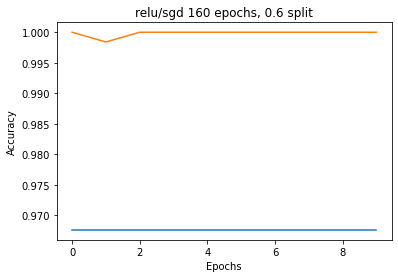

20/20 [==============================] - 0s 4ms/step - loss: 0.1577 - sparse_categorical_accuracy: 0.9760
Generation 9: 
Test Data:[0.15765054523944855, 0.9759615659713745], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.1577 - sparse_categorical_accuracy: 0.9760


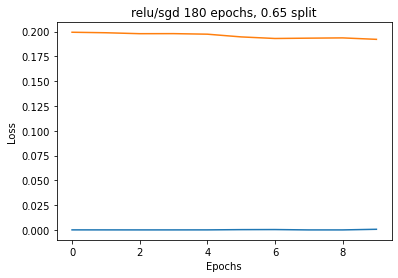

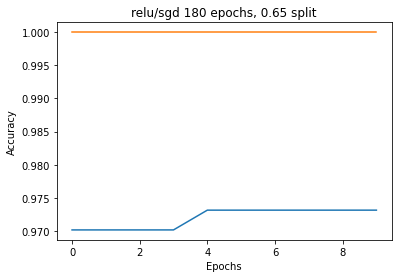

18/18 [==============================] - 0s 4ms/step - loss: 0.1686 - sparse_categorical_accuracy: 0.9744
Generation 9: 
Test Data:[0.16860054433345795, 0.9743589758872986], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.1686 - sparse_categorical_accuracy: 0.9744


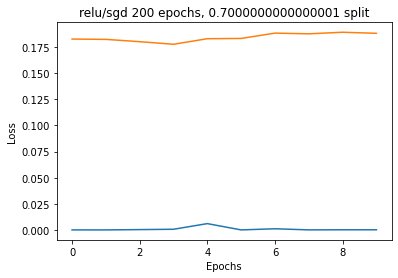

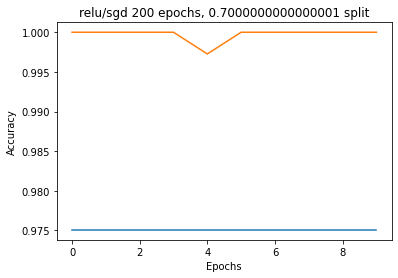

15/15 [==============================] - 0s 5ms/step - loss: 0.1874 - sparse_categorical_accuracy: 0.9744
Generation 9: 
Test Data:[0.1874413788318634, 0.9743589758872986], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 5ms/step - loss: 0.1874 - sparse_categorical_accuracy: 0.9744


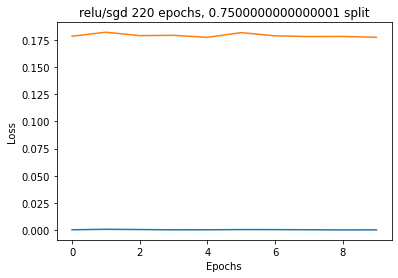

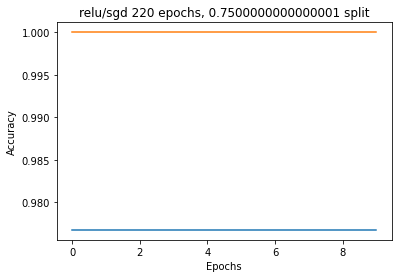

13/13 [==============================] - 0s 4ms/step - loss: 0.2019 - sparse_categorical_accuracy: 0.9641
Generation 9: 
Test Data:[0.20194701850414276, 0.964102566242218], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.2019 - sparse_categorical_accuracy: 0.9641


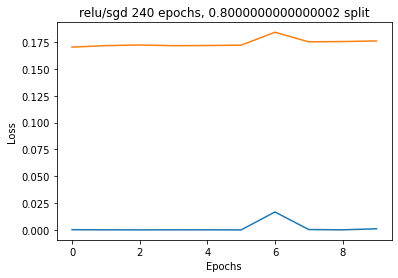

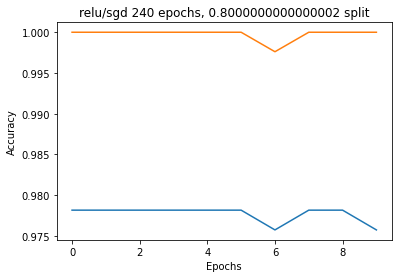

10/10 [==============================] - 0s 4ms/step - loss: 0.2323 - sparse_categorical_accuracy: 0.9551
Generation 9: 
Test Data:[0.23232802748680115, 0.9551281929016113], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.2323 - sparse_categorical_accuracy: 0.9551


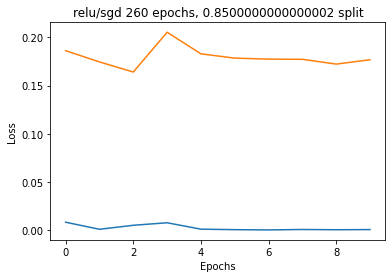

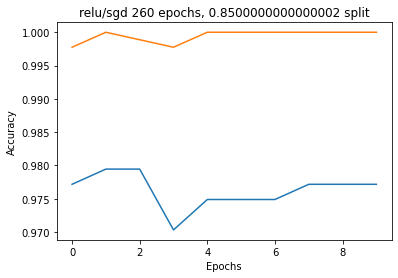

8/8 [==============================] - 0s 4ms/step - loss: 0.2915 - sparse_categorical_accuracy: 0.9359
Generation 9: 
Test Data:[0.2914952337741852, 0.9358974099159241], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2915 - sparse_categorical_accuracy: 0.9359


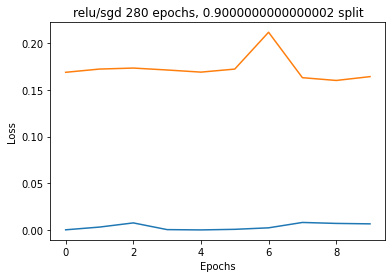

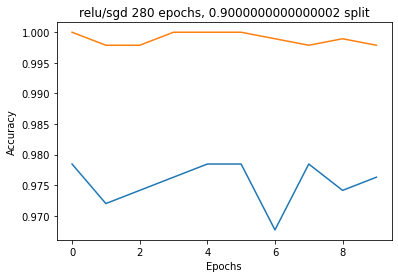

5/5 [==============================] - 0s 5ms/step - loss: 0.3568 - sparse_categorical_accuracy: 0.9167
Generation 9: 
Test Data:[0.3568066358566284, 0.9166666865348816], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 5ms/step - loss: 0.3568 - sparse_categorical_accuracy: 0.9167


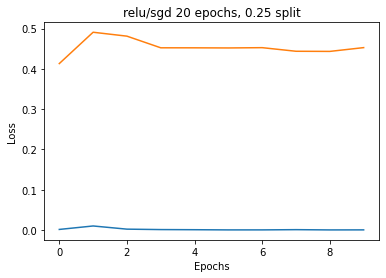

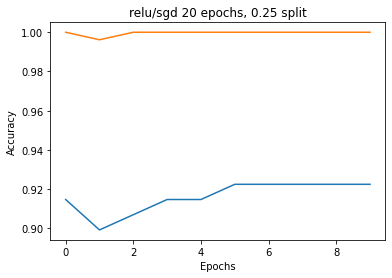

37/37 [==============================] - 0s 4ms/step - loss: 0.1506 - sparse_categorical_accuracy: 0.9795
Generation 10: 
Test Data:[0.15056659281253815, 0.9794871807098389], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.1506 - sparse_categorical_accuracy: 0.9795


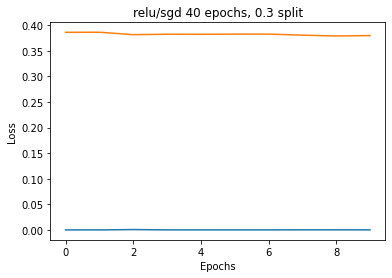

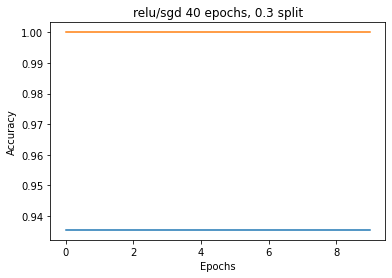

35/35 [==============================] - 0s 4ms/step - loss: 0.1473 - sparse_categorical_accuracy: 0.9808
Generation 10: 
Test Data:[0.14734619855880737, 0.9807692170143127], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 5ms/step - loss: 0.1473 - sparse_categorical_accuracy: 0.9808


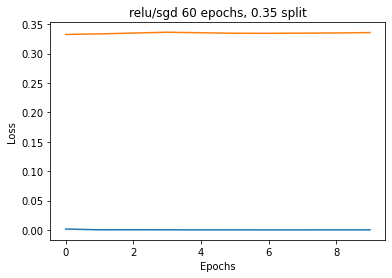

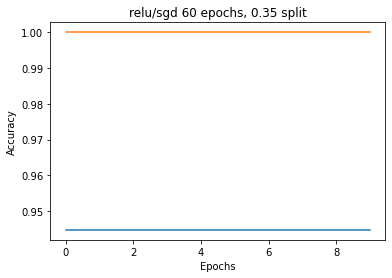

32/32 [==============================] - 0s 4ms/step - loss: 0.1484 - sparse_categorical_accuracy: 0.9822
Generation 10: 
Test Data:[0.1484306901693344, 0.9822485446929932], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1484 - sparse_categorical_accuracy: 0.9822


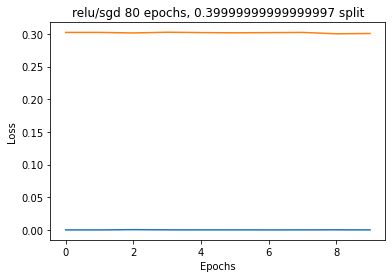

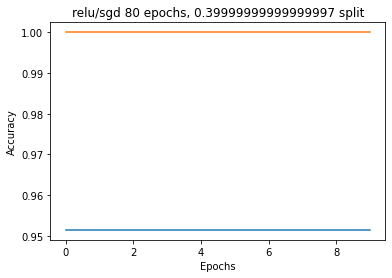

30/30 [==============================] - 0s 4ms/step - loss: 0.1551 - sparse_categorical_accuracy: 0.9797
Generation 10: 
Test Data:[0.1551368236541748, 0.9797008633613586], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.1551 - sparse_categorical_accuracy: 0.9797


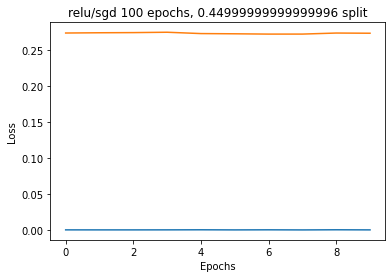

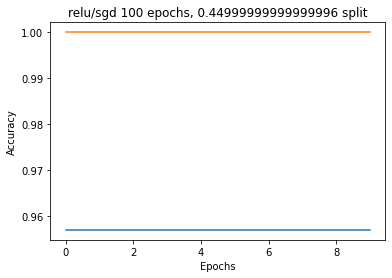

27/27 [==============================] - 0s 4ms/step - loss: 0.1605 - sparse_categorical_accuracy: 0.9779
Generation 10: 
Test Data:[0.16048488020896912, 0.9778812527656555], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.1605 - sparse_categorical_accuracy: 0.9779


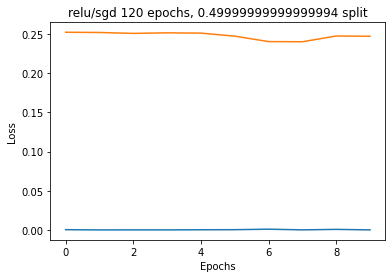

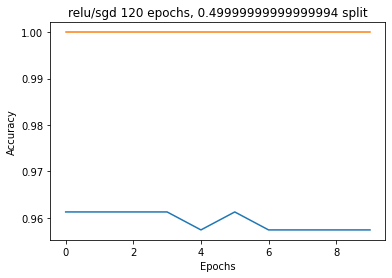

25/25 [==============================] - 0s 4ms/step - loss: 0.1594 - sparse_categorical_accuracy: 0.9795
Generation 10: 
Test Data:[0.1593932807445526, 0.9795134663581848], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.1594 - sparse_categorical_accuracy: 0.9795


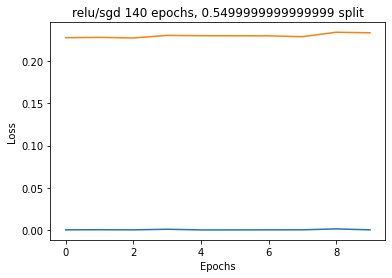

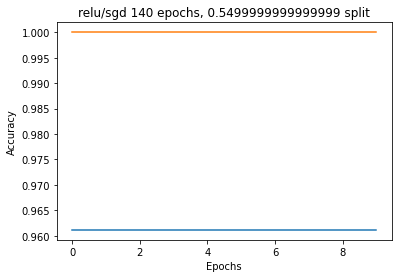

22/22 [==============================] - 0s 4ms/step - loss: 0.1597 - sparse_categorical_accuracy: 0.9787
Generation 10: 
Test Data:[0.15967793762683868, 0.9786628484725952], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.1597 - sparse_categorical_accuracy: 0.9787


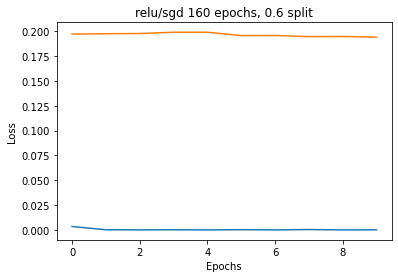

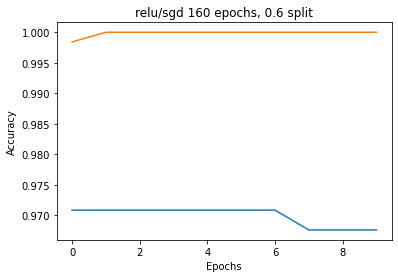

20/20 [==============================] - 0s 5ms/step - loss: 0.1446 - sparse_categorical_accuracy: 0.9792
Generation 10: 
Test Data:[0.1446371078491211, 0.9791666865348816], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.1446 - sparse_categorical_accuracy: 0.9792


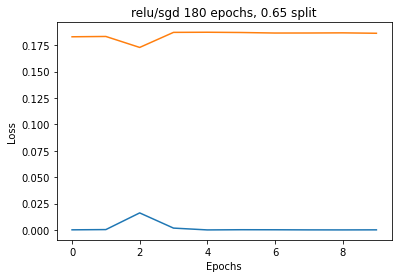

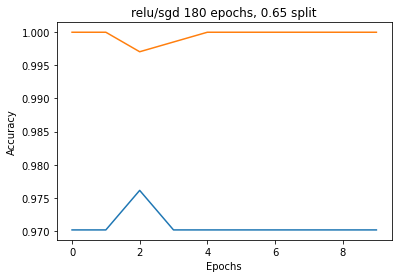

18/18 [==============================] - 0s 4ms/step - loss: 0.1632 - sparse_categorical_accuracy: 0.9780
Generation 10: 
Test Data:[0.16321754455566406, 0.9780219793319702], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.1632 - sparse_categorical_accuracy: 0.9780


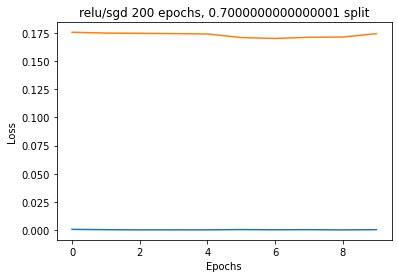

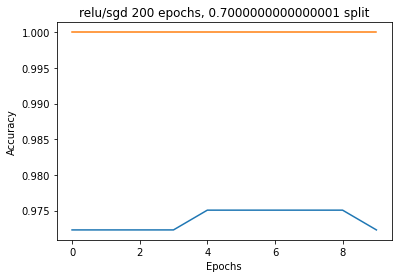

15/15 [==============================] - 0s 4ms/step - loss: 0.1715 - sparse_categorical_accuracy: 0.9679
Generation 10: 
Test Data:[0.17154699563980103, 0.9679487347602844], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.1715 - sparse_categorical_accuracy: 0.9679


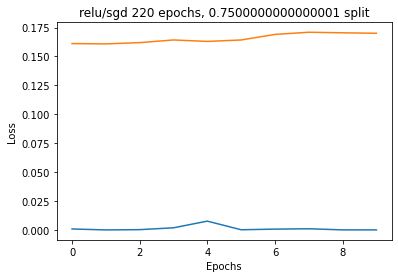

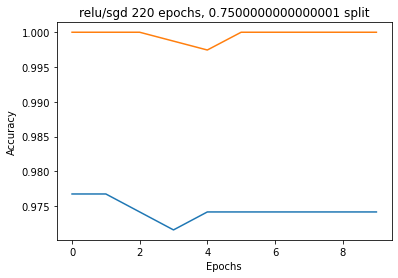

13/13 [==============================] - 0s 5ms/step - loss: 0.2003 - sparse_categorical_accuracy: 0.9590
Generation 10: 
Test Data:[0.20029036700725555, 0.9589743614196777], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 5ms/step - loss: 0.2003 - sparse_categorical_accuracy: 0.9590


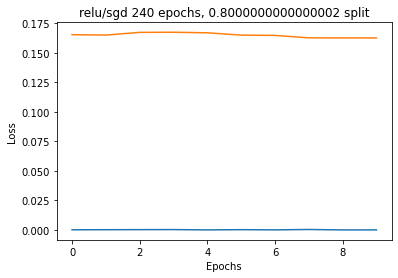

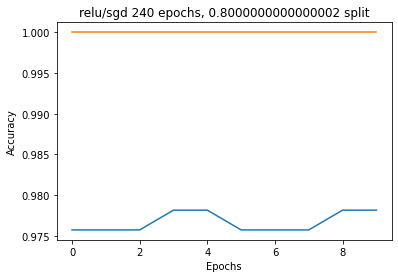

10/10 [==============================] - 0s 4ms/step - loss: 0.2239 - sparse_categorical_accuracy: 0.9487
Generation 10: 
Test Data:[0.22386375069618225, 0.9487179517745972], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.2239 - sparse_categorical_accuracy: 0.9487


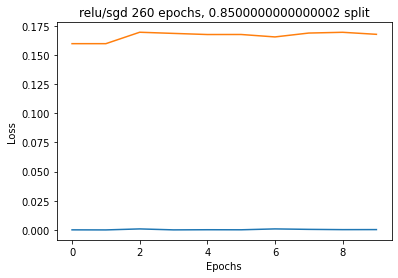

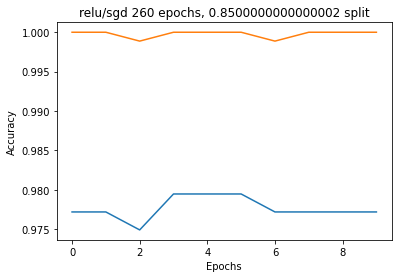

8/8 [==============================] - 0s 4ms/step - loss: 0.2710 - sparse_categorical_accuracy: 0.9316
Generation 10: 
Test Data:[0.2710183262825012, 0.9316239356994629], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2710 - sparse_categorical_accuracy: 0.9316


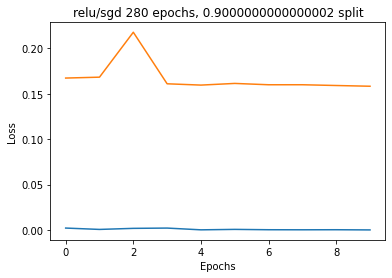

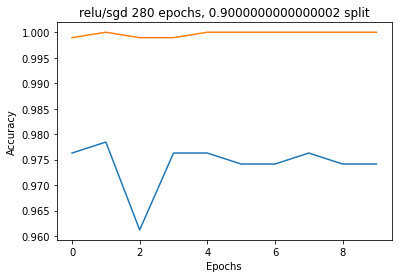

5/5 [==============================] - 0s 4ms/step - loss: 0.3306 - sparse_categorical_accuracy: 0.9103
Generation 10: 
Test Data:[0.33055803179740906, 0.9102563858032227], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 5ms/step - loss: 0.3306 - sparse_categorical_accuracy: 0.9103


In [107]:
model = buildModel('relu','SGD', normalize=False)
fitModel(X,y,model,'relu/sgd')

In [108]:
model.evaluate(X_Test_Final,y_Test_Final)
model.evaluate(X,y)

49/49 [==============================] - 0s 4ms/step - loss: 0.1215 - sparse_categorical_accuracy: 0.9821


[0.1215118020772934, 0.9820512533187866]

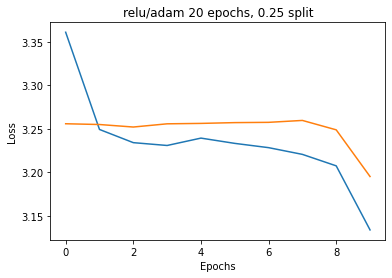

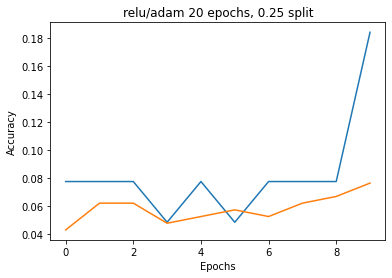

30/30 [==============================] - 0s 4ms/step - loss: 3.2182 - sparse_categorical_accuracy: 0.1122
Generation 1: 
Test Data:[3.2182133197784424, 0.11217948794364929], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 3.2182 - sparse_categorical_accuracy: 0.1122


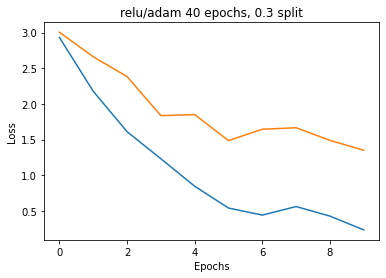

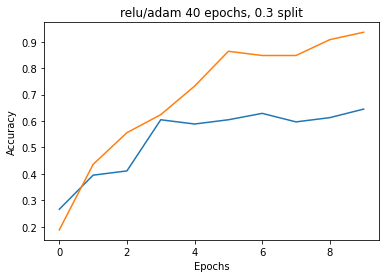

28/28 [==============================] - 0s 4ms/step - loss: 1.3981 - sparse_categorical_accuracy: 0.6602
Generation 1: 
Test Data:[1.398144006729126, 0.6601830720901489], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 1.3981 - sparse_categorical_accuracy: 0.6602


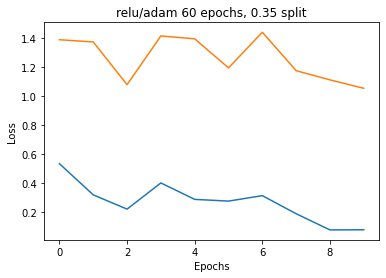

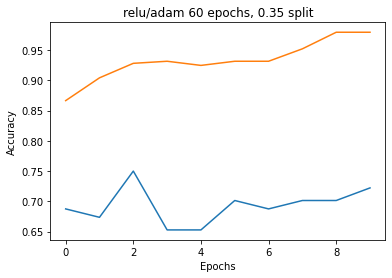

26/26 [==============================] - 0s 4ms/step - loss: 1.1391 - sparse_categorical_accuracy: 0.7118
Generation 1: 
Test Data:[1.1391023397445679, 0.7118226885795593], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 1.1391 - sparse_categorical_accuracy: 0.7118


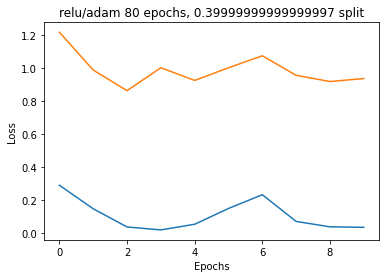

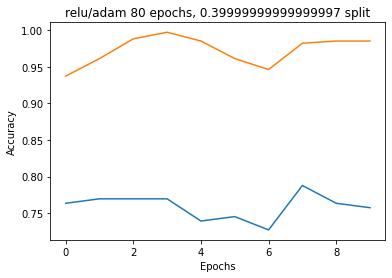

24/24 [==============================] - 0s 4ms/step - loss: 0.9788 - sparse_categorical_accuracy: 0.7463
Generation 1: 
Test Data:[0.9787770509719849, 0.7463284134864807], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.9788 - sparse_categorical_accuracy: 0.7463


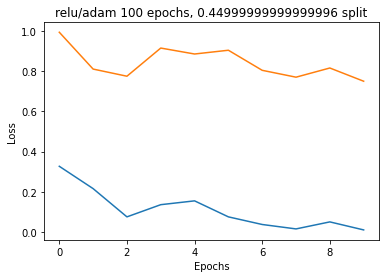

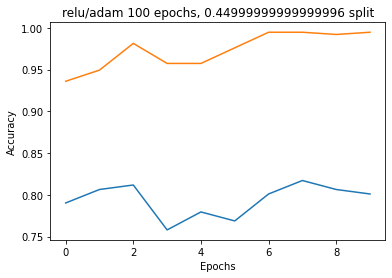

22/22 [==============================] - 0s 4ms/step - loss: 0.8759 - sparse_categorical_accuracy: 0.7686
Generation 1: 
Test Data:[0.8758972883224487, 0.7685589790344238], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.8759 - sparse_categorical_accuracy: 0.7686


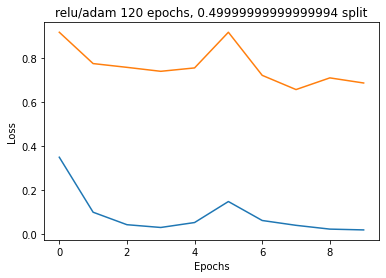

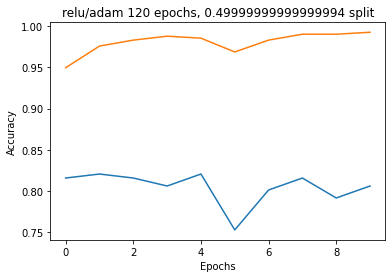

20/20 [==============================] - 0s 4ms/step - loss: 0.8213 - sparse_categorical_accuracy: 0.7792
Generation 1: 
Test Data:[0.8213242888450623, 0.77920001745224], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.8213 - sparse_categorical_accuracy: 0.7792


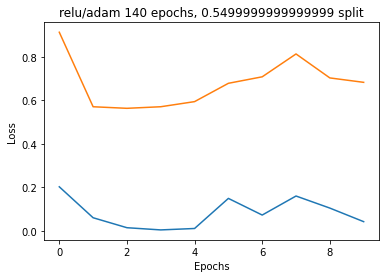

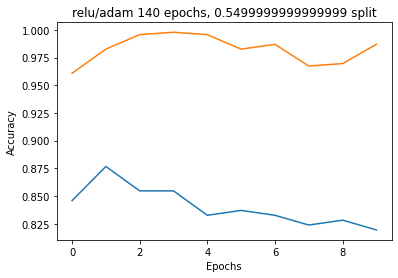

18/18 [==============================] - 0s 4ms/step - loss: 0.9060 - sparse_categorical_accuracy: 0.7420
Generation 1: 
Test Data:[0.90602707862854, 0.7419928908348083], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.9060 - sparse_categorical_accuracy: 0.7420


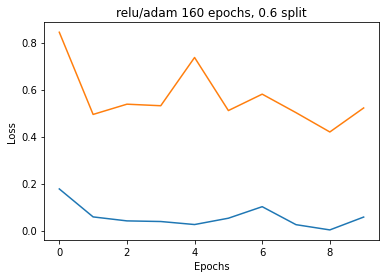

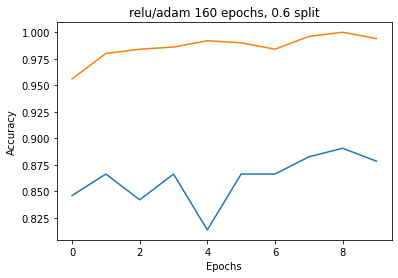

16/16 [==============================] - 0s 4ms/step - loss: 0.6944 - sparse_categorical_accuracy: 0.8300
Generation 1: 
Test Data:[0.6944327354431152, 0.8299999833106995], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.6944 - sparse_categorical_accuracy: 0.8300


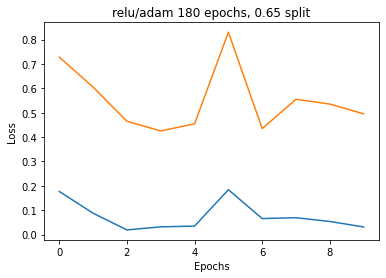

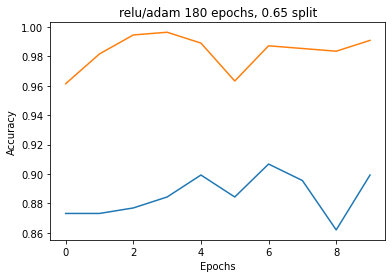

14/14 [==============================] - 0s 4ms/step - loss: 0.7028 - sparse_categorical_accuracy: 0.8124
Generation 1: 
Test Data:[0.7027881741523743, 0.8123570084571838], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.7028 - sparse_categorical_accuracy: 0.8124


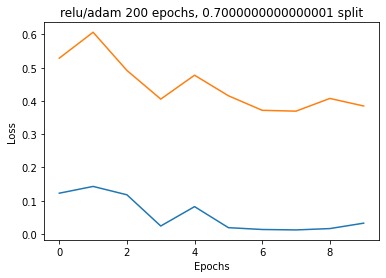

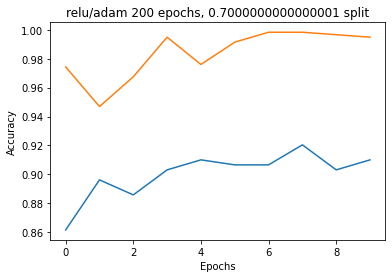

12/12 [==============================] - 0s 4ms/step - loss: 0.5761 - sparse_categorical_accuracy: 0.8587
Generation 1: 
Test Data:[0.5760525465011597, 0.8586666584014893], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.5761 - sparse_categorical_accuracy: 0.8587


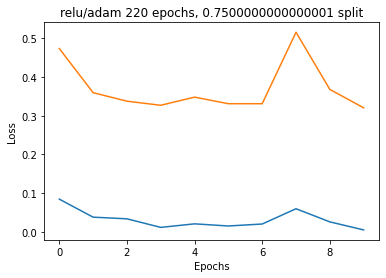

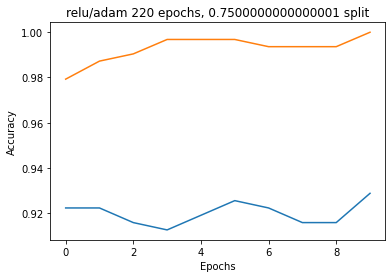

10/10 [==============================] - 0s 4ms/step - loss: 0.5277 - sparse_categorical_accuracy: 0.8750
Generation 1: 
Test Data:[0.527736485004425, 0.875], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.5277 - sparse_categorical_accuracy: 0.8750


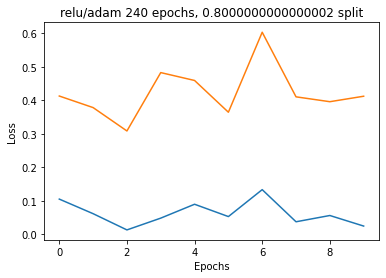

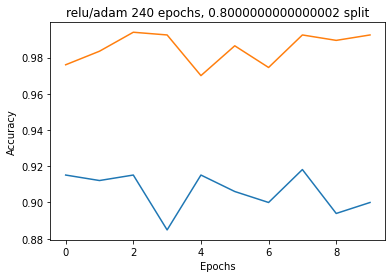

8/8 [==============================] - 0s 4ms/step - loss: 0.5467 - sparse_categorical_accuracy: 0.8360
Generation 1: 
Test Data:[0.5466553568840027, 0.8360000252723694], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.5467 - sparse_categorical_accuracy: 0.8360


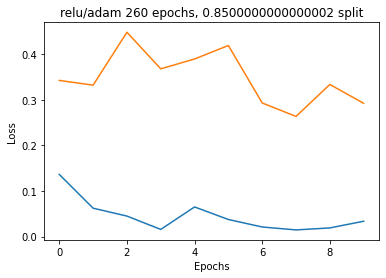

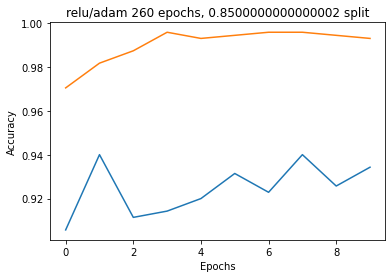

6/6 [==============================] - 0s 4ms/step - loss: 0.4382 - sparse_categorical_accuracy: 0.8670
Generation 1: 
Test Data:[0.43823328614234924, 0.8670212626457214], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 5ms/step - loss: 0.4382 - sparse_categorical_accuracy: 0.8670


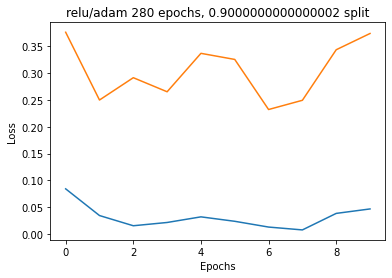

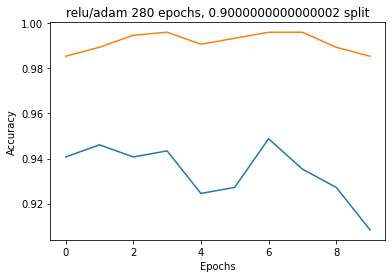

4/4 [==============================] - 0s 5ms/step - loss: 0.5458 - sparse_categorical_accuracy: 0.8080
Generation 1: 
Test Data:[0.545775294303894, 0.8080000281333923], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.5458 - sparse_categorical_accuracy: 0.8080


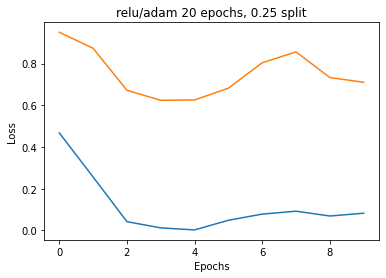

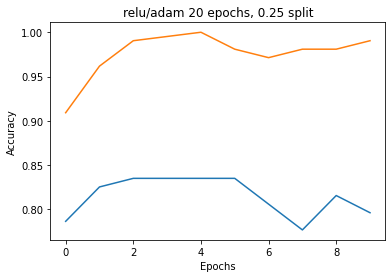

30/30 [==============================] - 0s 4ms/step - loss: 0.3028 - sparse_categorical_accuracy: 0.9252
Generation 2: 
Test Data:[0.30279165506362915, 0.9252136945724487], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.3028 - sparse_categorical_accuracy: 0.9252


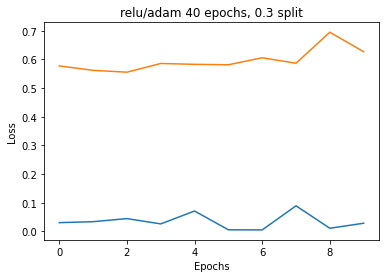

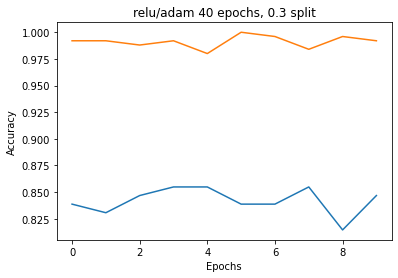

28/28 [==============================] - 0s 4ms/step - loss: 0.3808 - sparse_categorical_accuracy: 0.9073
Generation 2: 
Test Data:[0.380753755569458, 0.9073226451873779], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.3808 - sparse_categorical_accuracy: 0.9073


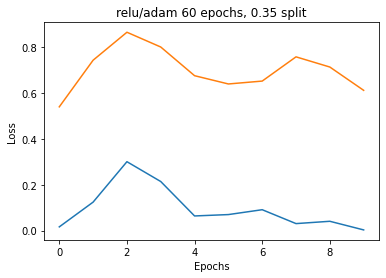

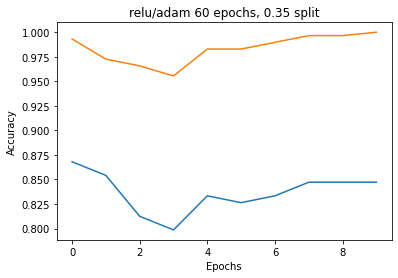

26/26 [==============================] - 0s 4ms/step - loss: 0.4927 - sparse_categorical_accuracy: 0.8867
Generation 2: 
Test Data:[0.4926838278770447, 0.8866994976997375], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.4927 - sparse_categorical_accuracy: 0.8867


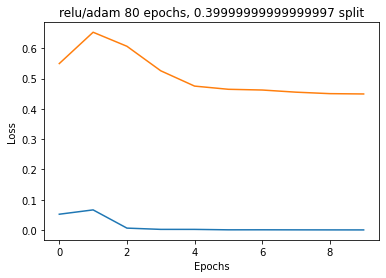

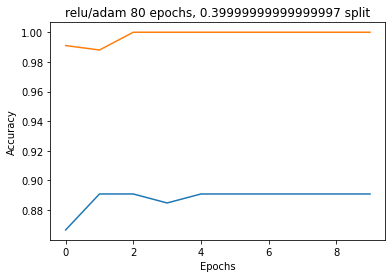

24/24 [==============================] - 0s 4ms/step - loss: 0.3086 - sparse_categorical_accuracy: 0.9186
Generation 2: 
Test Data:[0.30862924456596375, 0.9185580611228943], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.3086 - sparse_categorical_accuracy: 0.9186


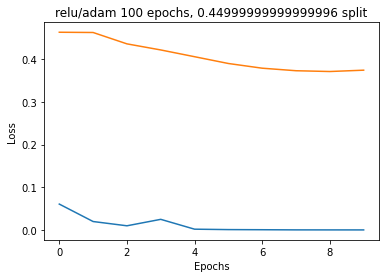

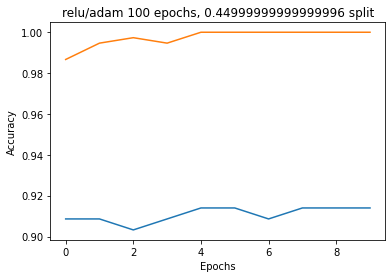

22/22 [==============================] - 0s 4ms/step - loss: 0.2578 - sparse_categorical_accuracy: 0.9301
Generation 2: 
Test Data:[0.2577928304672241, 0.9301310181617737], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.2578 - sparse_categorical_accuracy: 0.9301


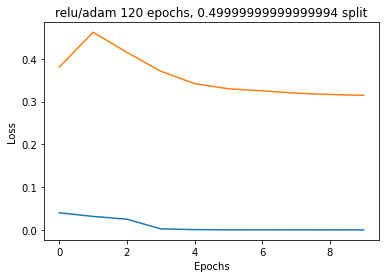

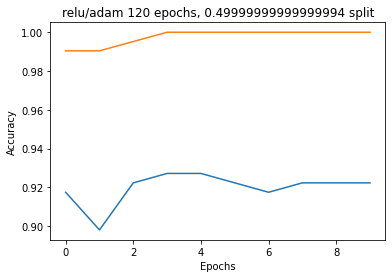

20/20 [==============================] - 0s 4ms/step - loss: 0.2270 - sparse_categorical_accuracy: 0.9424
Generation 2: 
Test Data:[0.22701860964298248, 0.9423999786376953], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.2270 - sparse_categorical_accuracy: 0.9424


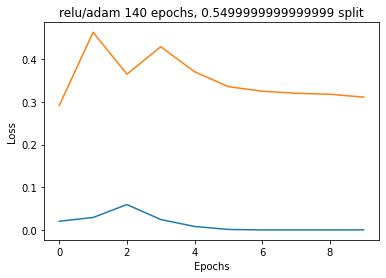

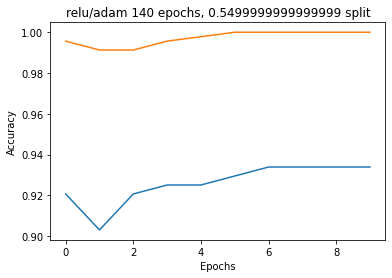

18/18 [==============================] - 0s 4ms/step - loss: 0.2224 - sparse_categorical_accuracy: 0.9502
Generation 2: 
Test Data:[0.2223653346300125, 0.9501779079437256], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.2224 - sparse_categorical_accuracy: 0.9502


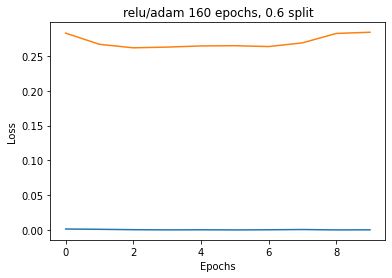

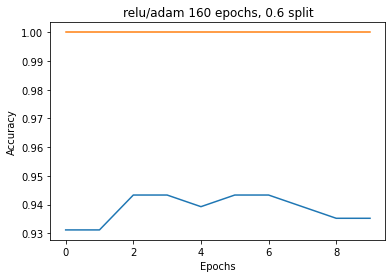

16/16 [==============================] - 0s 4ms/step - loss: 0.2152 - sparse_categorical_accuracy: 0.9340
Generation 2: 
Test Data:[0.2152106612920761, 0.9340000152587891], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.2152 - sparse_categorical_accuracy: 0.9340


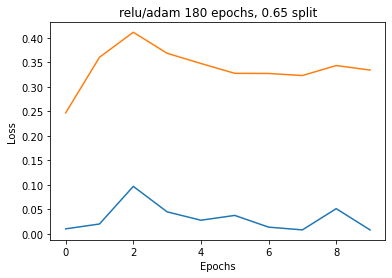

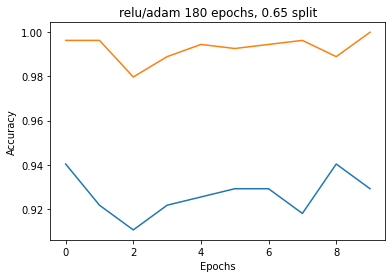

14/14 [==============================] - 0s 4ms/step - loss: 0.3462 - sparse_categorical_accuracy: 0.9314
Generation 2: 
Test Data:[0.3461911678314209, 0.9313501119613647], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.3462 - sparse_categorical_accuracy: 0.9314


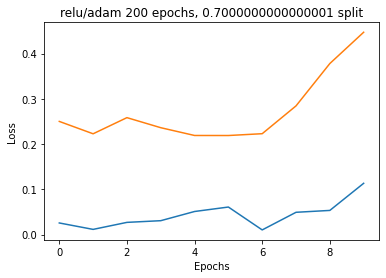

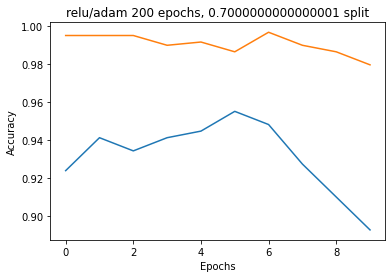

12/12 [==============================] - 0s 4ms/step - loss: 0.4363 - sparse_categorical_accuracy: 0.8853
Generation 2: 
Test Data:[0.4362550377845764, 0.8853333592414856], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.4363 - sparse_categorical_accuracy: 0.8853


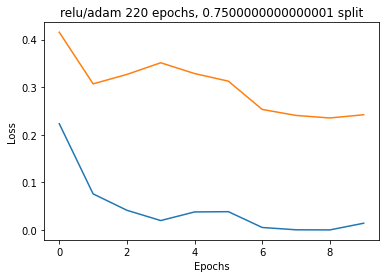

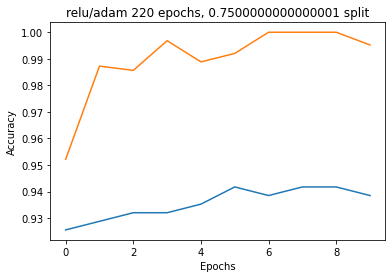

10/10 [==============================] - 0s 4ms/step - loss: 0.2528 - sparse_categorical_accuracy: 0.9295
Generation 2: 
Test Data:[0.25278955698013306, 0.9294871687889099], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.2528 - sparse_categorical_accuracy: 0.9295


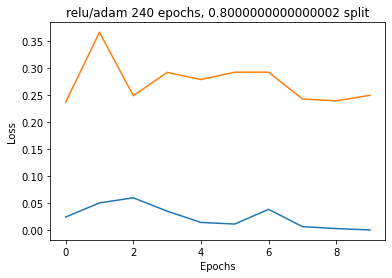

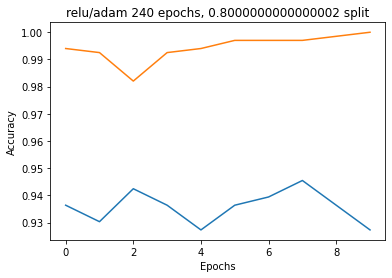

8/8 [==============================] - 0s 4ms/step - loss: 0.4057 - sparse_categorical_accuracy: 0.9000
Generation 2: 
Test Data:[0.40566959977149963, 0.8999999761581421], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.4057 - sparse_categorical_accuracy: 0.9000


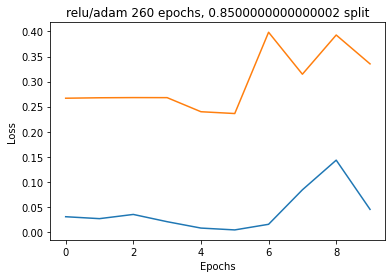

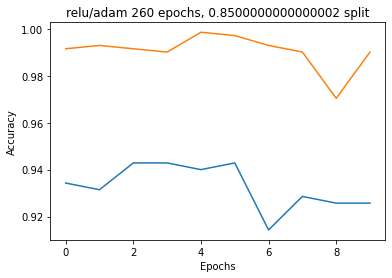

6/6 [==============================] - 0s 5ms/step - loss: 0.5823 - sparse_categorical_accuracy: 0.8830
Generation 2: 
Test Data:[0.5823207497596741, 0.8829787373542786], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.5823 - sparse_categorical_accuracy: 0.8830


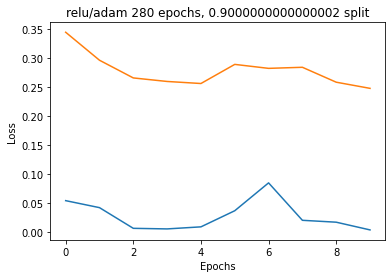

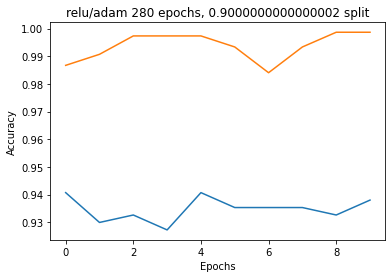

4/4 [==============================] - 0s 6ms/step - loss: 0.4424 - sparse_categorical_accuracy: 0.8640
Generation 2: 
Test Data:[0.4423675835132599, 0.8640000224113464], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.4424 - sparse_categorical_accuracy: 0.8640


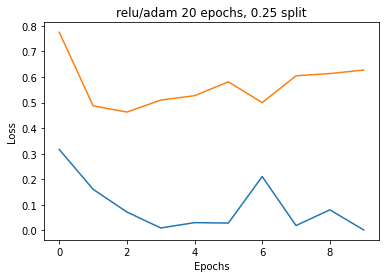

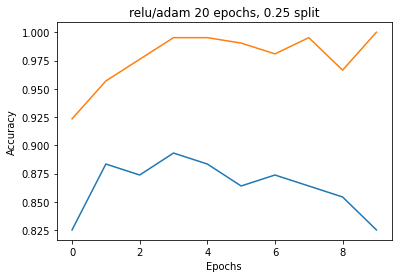

30/30 [==============================] - 0s 4ms/step - loss: 0.2066 - sparse_categorical_accuracy: 0.9487
Generation 3: 
Test Data:[0.20660850405693054, 0.9487179517745972], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.2066 - sparse_categorical_accuracy: 0.9487


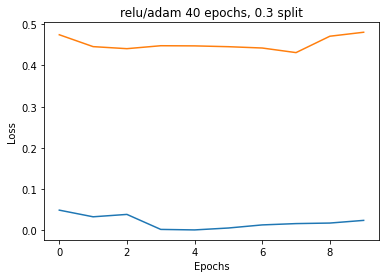

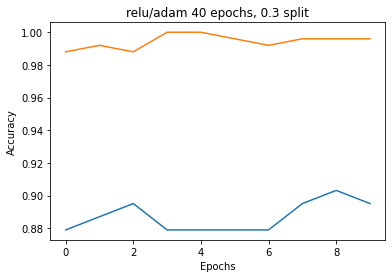

28/28 [==============================] - 0s 4ms/step - loss: 0.1838 - sparse_categorical_accuracy: 0.9565
Generation 3: 
Test Data:[0.1838379055261612, 0.95652174949646], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.1838 - sparse_categorical_accuracy: 0.9565


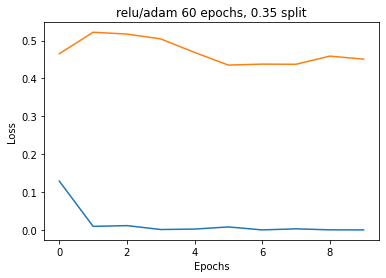

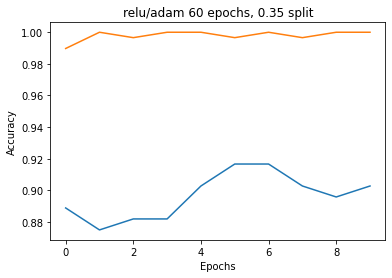

26/26 [==============================] - 0s 4ms/step - loss: 0.1716 - sparse_categorical_accuracy: 0.9667
Generation 3: 
Test Data:[0.17158305644989014, 0.9667487740516663], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.1716 - sparse_categorical_accuracy: 0.9667


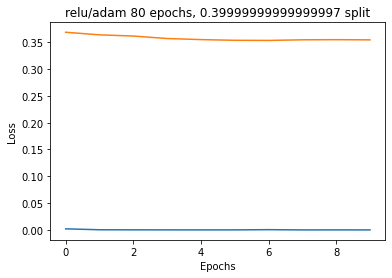

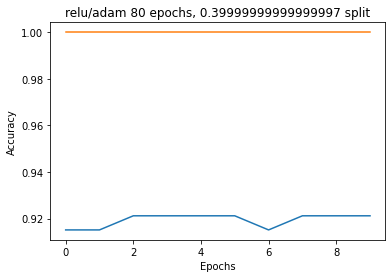

24/24 [==============================] - 0s 4ms/step - loss: 0.1339 - sparse_categorical_accuracy: 0.9733
Generation 3: 
Test Data:[0.13390879333019257, 0.9732977151870728], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.1339 - sparse_categorical_accuracy: 0.9733


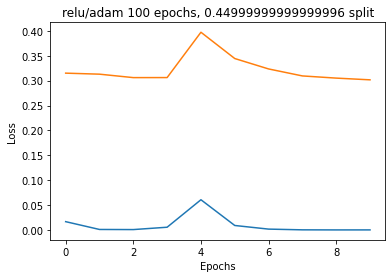

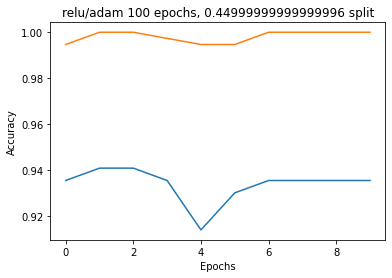

22/22 [==============================] - 0s 4ms/step - loss: 0.1663 - sparse_categorical_accuracy: 0.9680
Generation 3: 
Test Data:[0.16626672446727753, 0.9679766893386841], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.1663 - sparse_categorical_accuracy: 0.9680


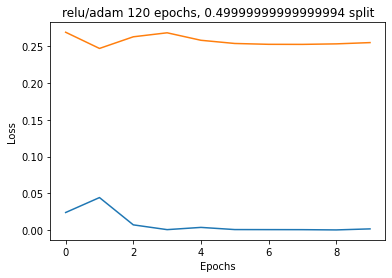

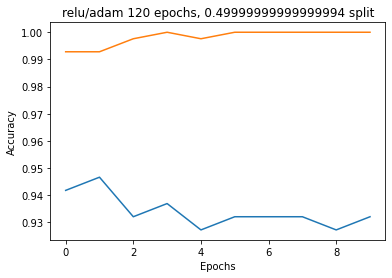

20/20 [==============================] - 0s 4ms/step - loss: 0.1201 - sparse_categorical_accuracy: 0.9728
Generation 3: 
Test Data:[0.12007556110620499, 0.9728000164031982], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.1201 - sparse_categorical_accuracy: 0.9728


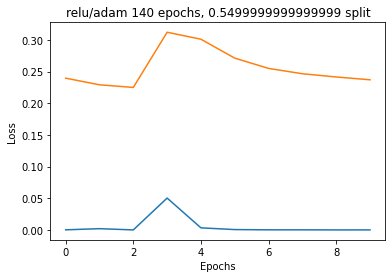

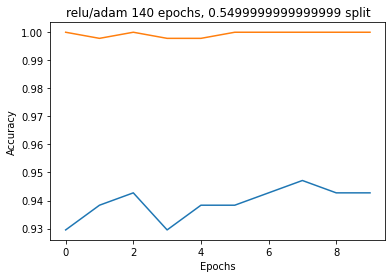

18/18 [==============================] - 0s 4ms/step - loss: 0.1544 - sparse_categorical_accuracy: 0.9733
Generation 3: 
Test Data:[0.15437698364257812, 0.9733096361160278], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.1544 - sparse_categorical_accuracy: 0.9733


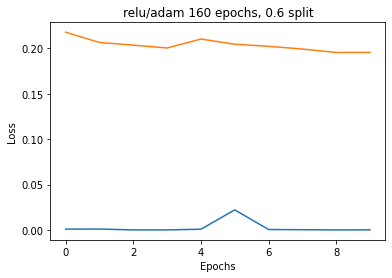

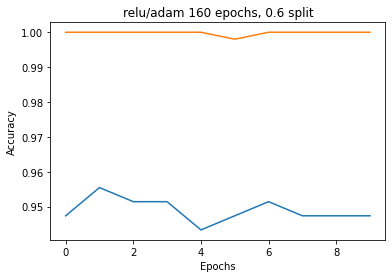

16/16 [==============================] - 0s 4ms/step - loss: 0.1158 - sparse_categorical_accuracy: 0.9760
Generation 3: 
Test Data:[0.11582234501838684, 0.9760000109672546], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.1158 - sparse_categorical_accuracy: 0.9760


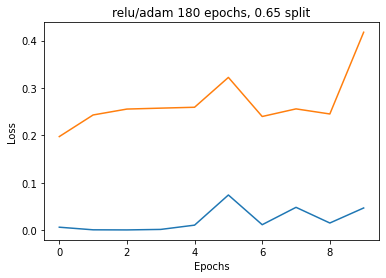

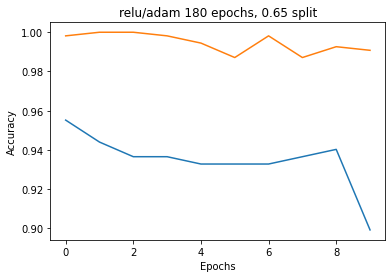

14/14 [==============================] - 0s 4ms/step - loss: 0.5373 - sparse_categorical_accuracy: 0.8719
Generation 3: 
Test Data:[0.5373226404190063, 0.8718535304069519], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.5373 - sparse_categorical_accuracy: 0.8719


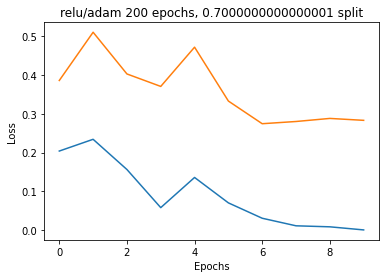

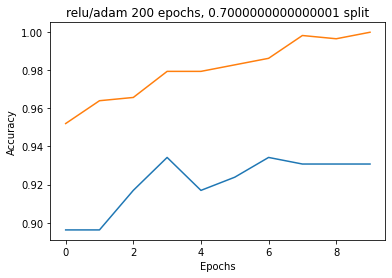

12/12 [==============================] - 0s 4ms/step - loss: 0.3267 - sparse_categorical_accuracy: 0.9093
Generation 3: 
Test Data:[0.3266856372356415, 0.909333348274231], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.3267 - sparse_categorical_accuracy: 0.9093


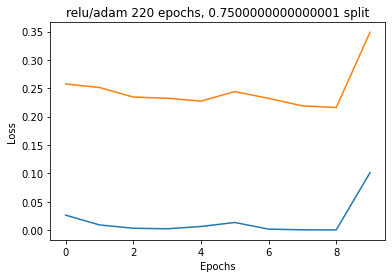

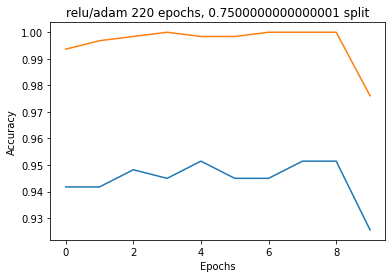

10/10 [==============================] - 0s 4ms/step - loss: 0.3640 - sparse_categorical_accuracy: 0.9038
Generation 3: 
Test Data:[0.3640137314796448, 0.9038461446762085], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.3640 - sparse_categorical_accuracy: 0.9038


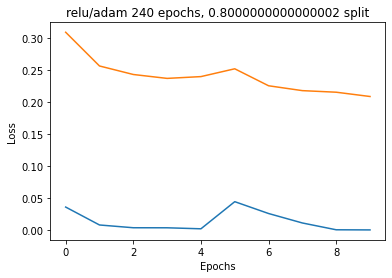

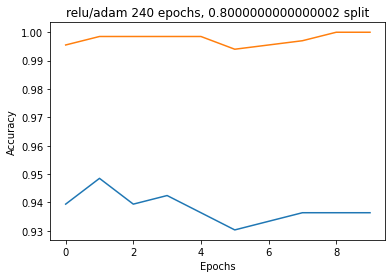

8/8 [==============================] - 0s 4ms/step - loss: 0.2885 - sparse_categorical_accuracy: 0.9320
Generation 3: 
Test Data:[0.28854793310165405, 0.9319999814033508], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2885 - sparse_categorical_accuracy: 0.9320


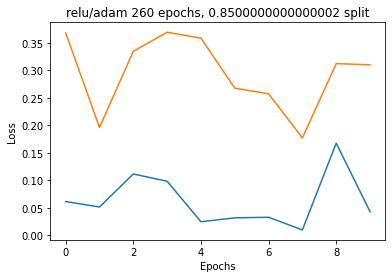

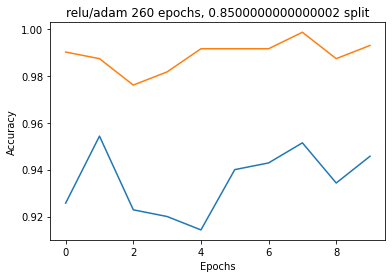

6/6 [==============================] - 0s 5ms/step - loss: 0.4319 - sparse_categorical_accuracy: 0.8883
Generation 3: 
Test Data:[0.4319173991680145, 0.8882978558540344], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.4319 - sparse_categorical_accuracy: 0.8883


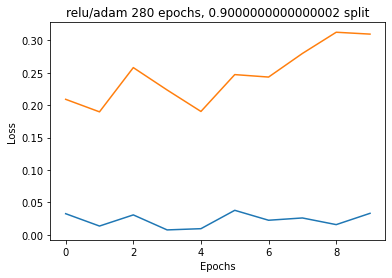

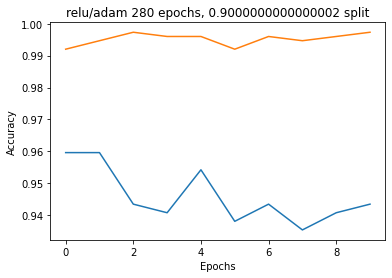

4/4 [==============================] - 0s 5ms/step - loss: 0.4615 - sparse_categorical_accuracy: 0.8880
Generation 3: 
Test Data:[0.46154436469078064, 0.8880000114440918], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.4615 - sparse_categorical_accuracy: 0.8880


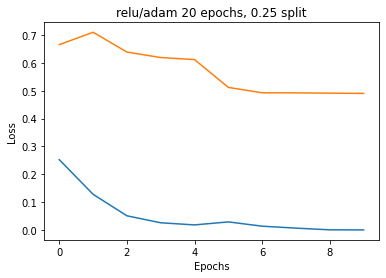

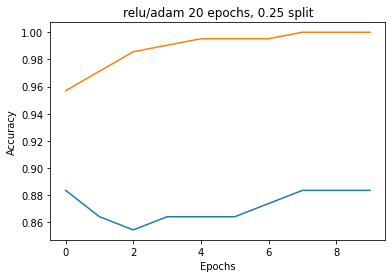

30/30 [==============================] - 0s 4ms/step - loss: 0.1131 - sparse_categorical_accuracy: 0.9744
Generation 4: 
Test Data:[0.11310010403394699, 0.9743589758872986], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.1131 - sparse_categorical_accuracy: 0.9744


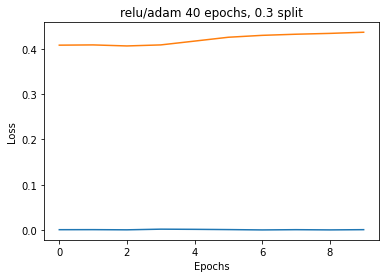

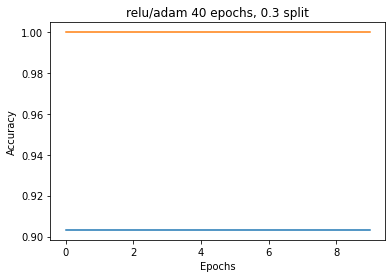

28/28 [==============================] - 0s 4ms/step - loss: 0.1053 - sparse_categorical_accuracy: 0.9703
Generation 4: 
Test Data:[0.10532458871603012, 0.970251739025116], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.1053 - sparse_categorical_accuracy: 0.9703


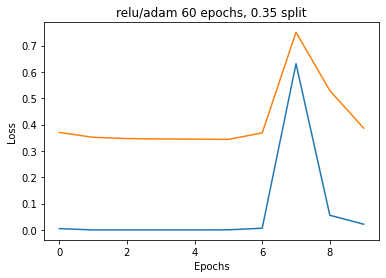

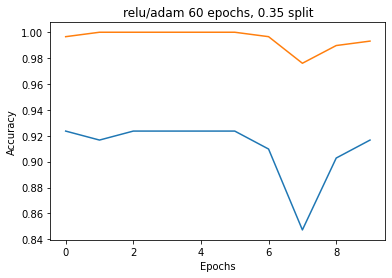

26/26 [==============================] - 0s 4ms/step - loss: 0.1979 - sparse_categorical_accuracy: 0.9631
Generation 4: 
Test Data:[0.19788525998592377, 0.9630541801452637], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.1979 - sparse_categorical_accuracy: 0.9631


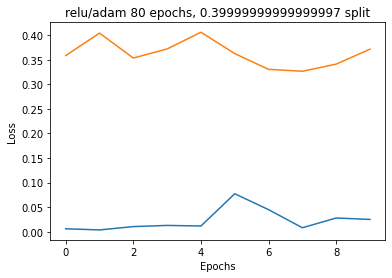

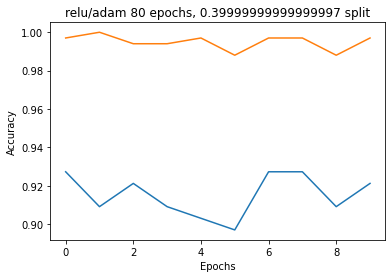

24/24 [==============================] - 0s 4ms/step - loss: 0.2448 - sparse_categorical_accuracy: 0.9306
Generation 4: 
Test Data:[0.24475520849227905, 0.9305741190910339], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 5ms/step - loss: 0.2448 - sparse_categorical_accuracy: 0.9306


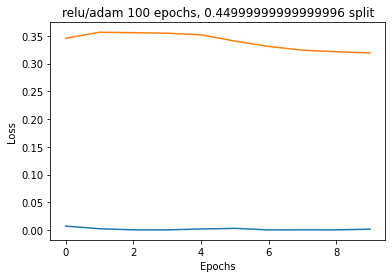

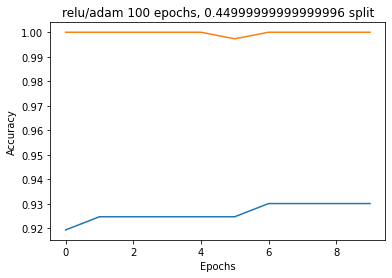

22/22 [==============================] - 0s 4ms/step - loss: 0.1545 - sparse_categorical_accuracy: 0.9563
Generation 4: 
Test Data:[0.15452000498771667, 0.9563318490982056], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.1545 - sparse_categorical_accuracy: 0.9563


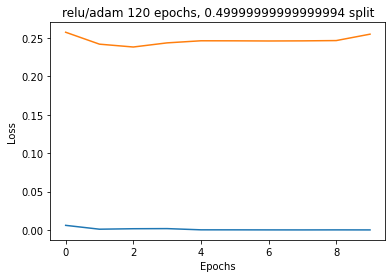

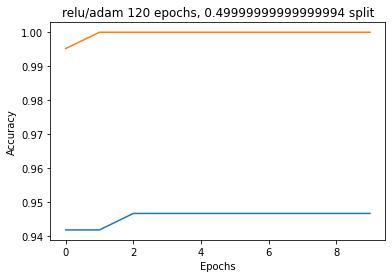

20/20 [==============================] - 0s 4ms/step - loss: 0.1398 - sparse_categorical_accuracy: 0.9600
Generation 4: 
Test Data:[0.1397589147090912, 0.9599999785423279], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.1398 - sparse_categorical_accuracy: 0.9600


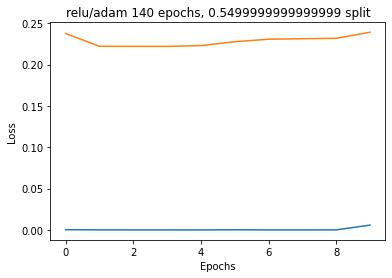

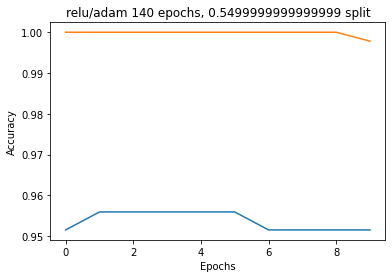

18/18 [==============================] - 0s 4ms/step - loss: 0.1195 - sparse_categorical_accuracy: 0.9644
Generation 4: 
Test Data:[0.11953273415565491, 0.9644128084182739], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.1195 - sparse_categorical_accuracy: 0.9644


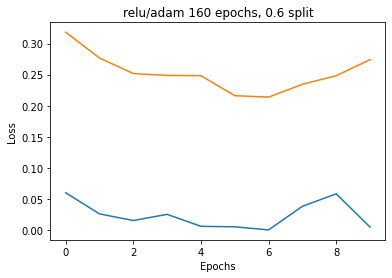

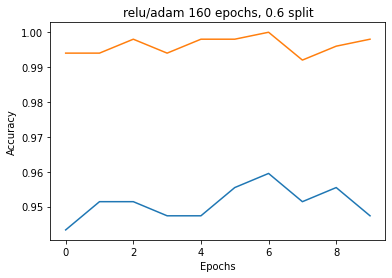

16/16 [==============================] - 0s 4ms/step - loss: 0.2201 - sparse_categorical_accuracy: 0.9460
Generation 4: 
Test Data:[0.2201036959886551, 0.9459999799728394], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.2201 - sparse_categorical_accuracy: 0.9460


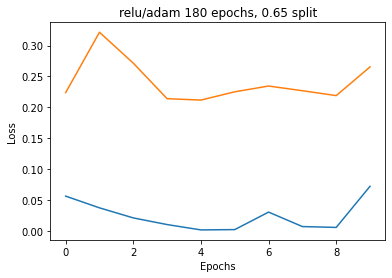

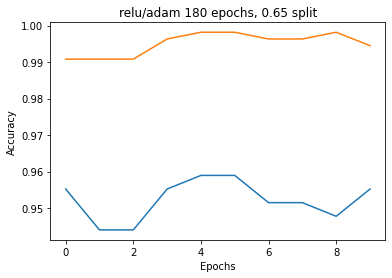

14/14 [==============================] - 0s 4ms/step - loss: 0.3048 - sparse_categorical_accuracy: 0.9314
Generation 4: 
Test Data:[0.30482304096221924, 0.9313501119613647], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.3048 - sparse_categorical_accuracy: 0.9314


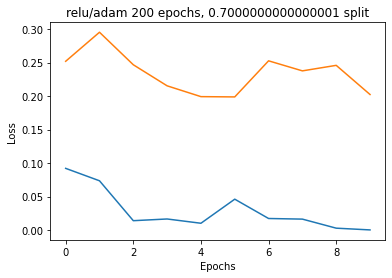

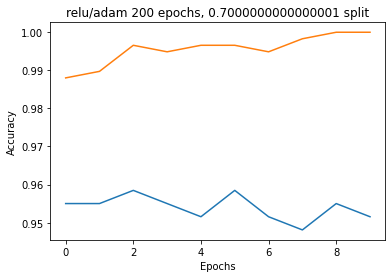

12/12 [==============================] - 0s 4ms/step - loss: 0.2534 - sparse_categorical_accuracy: 0.9307
Generation 4: 
Test Data:[0.25344038009643555, 0.9306666851043701], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.2534 - sparse_categorical_accuracy: 0.9307


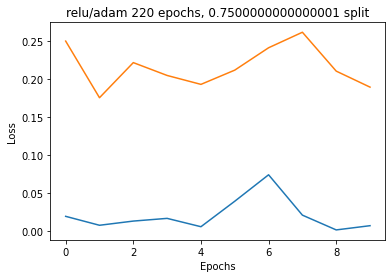

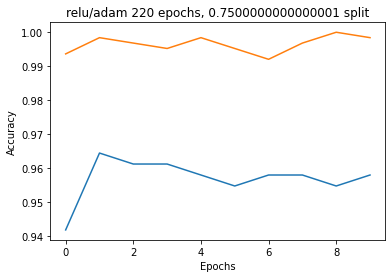

10/10 [==============================] - 0s 4ms/step - loss: 0.2008 - sparse_categorical_accuracy: 0.9487
Generation 4: 
Test Data:[0.20079179108142853, 0.9487179517745972], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.2008 - sparse_categorical_accuracy: 0.9487


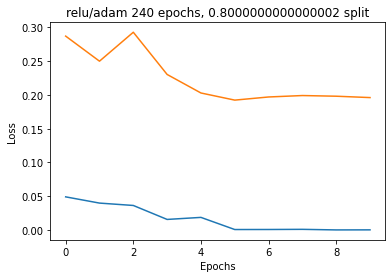

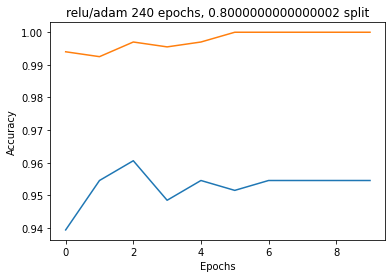

8/8 [==============================] - 0s 5ms/step - loss: 0.2304 - sparse_categorical_accuracy: 0.9280
Generation 4: 
Test Data:[0.23044472932815552, 0.9279999732971191], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2304 - sparse_categorical_accuracy: 0.9280


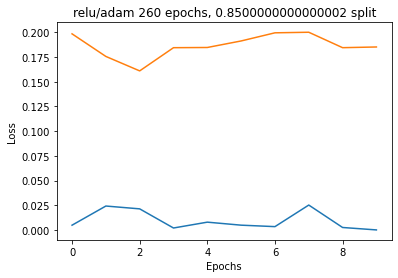

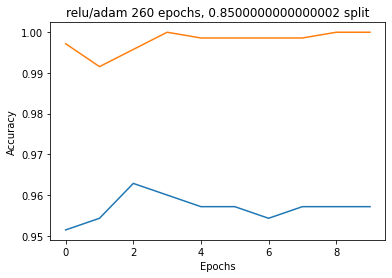

6/6 [==============================] - 0s 5ms/step - loss: 0.2430 - sparse_categorical_accuracy: 0.9149
Generation 4: 
Test Data:[0.243008553981781, 0.914893627166748], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.2430 - sparse_categorical_accuracy: 0.9149


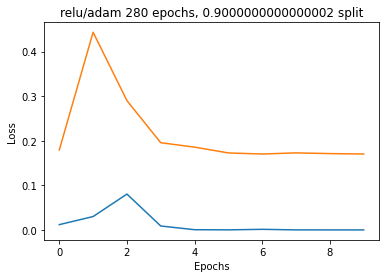

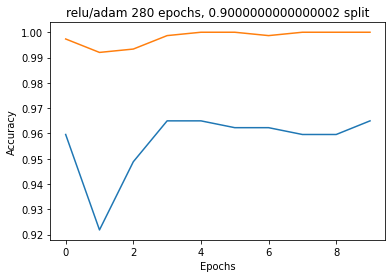

4/4 [==============================] - 0s 5ms/step - loss: 0.3235 - sparse_categorical_accuracy: 0.9040
Generation 4: 
Test Data:[0.323453813791275, 0.9039999842643738], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.3235 - sparse_categorical_accuracy: 0.9040


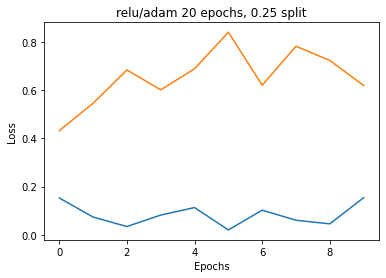

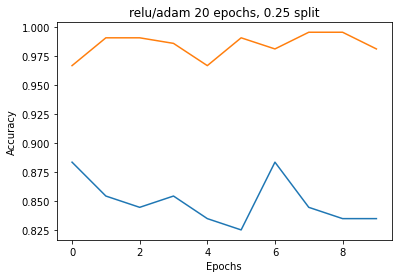

30/30 [==============================] - 0s 4ms/step - loss: 0.2054 - sparse_categorical_accuracy: 0.9530
Generation 5: 
Test Data:[0.20544353127479553, 0.9529914259910583], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.2054 - sparse_categorical_accuracy: 0.9530


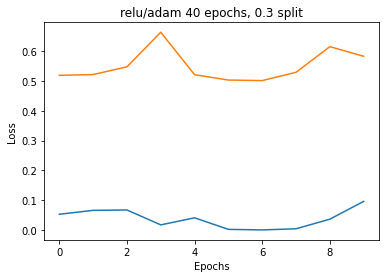

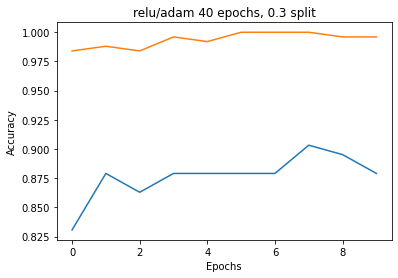

28/28 [==============================] - 0s 4ms/step - loss: 0.1876 - sparse_categorical_accuracy: 0.9577
Generation 5: 
Test Data:[0.18755526840686798, 0.9576659202575684], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.1876 - sparse_categorical_accuracy: 0.9577


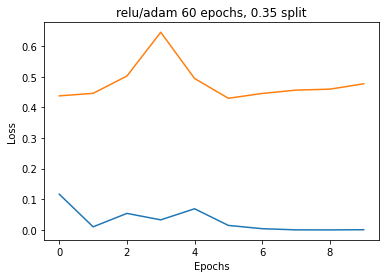

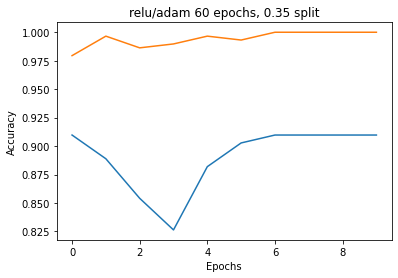

26/26 [==============================] - 0s 4ms/step - loss: 0.1797 - sparse_categorical_accuracy: 0.9581
Generation 5: 
Test Data:[0.1796673685312271, 0.9581280946731567], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.1797 - sparse_categorical_accuracy: 0.9581


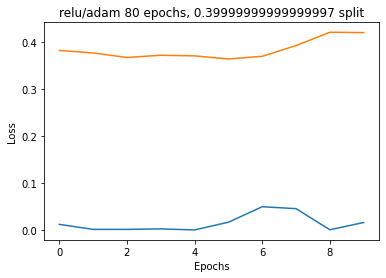

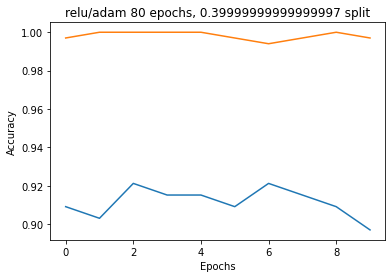

24/24 [==============================] - 0s 4ms/step - loss: 0.2103 - sparse_categorical_accuracy: 0.9519
Generation 5: 
Test Data:[0.2103397250175476, 0.951935887336731], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.2103 - sparse_categorical_accuracy: 0.9519


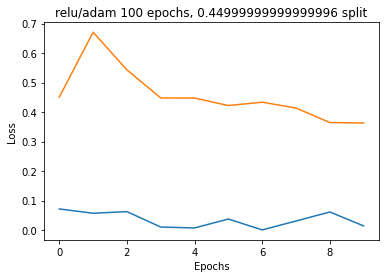

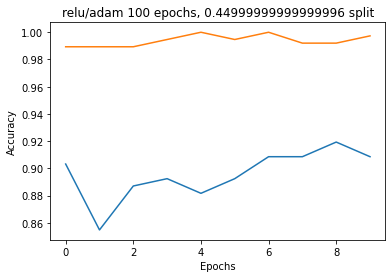

22/22 [==============================] - 0s 4ms/step - loss: 0.2126 - sparse_categorical_accuracy: 0.9549
Generation 5: 
Test Data:[0.2126411497592926, 0.9548762440681458], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.2126 - sparse_categorical_accuracy: 0.9549


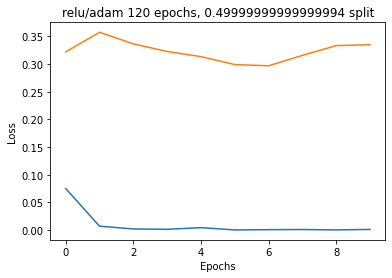

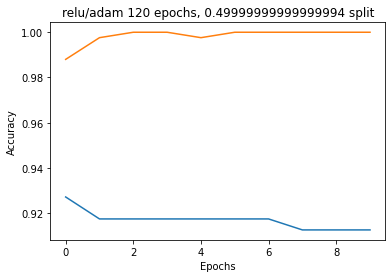

20/20 [==============================] - 0s 4ms/step - loss: 0.1532 - sparse_categorical_accuracy: 0.9648
Generation 5: 
Test Data:[0.1531662791967392, 0.9648000001907349], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.1532 - sparse_categorical_accuracy: 0.9648


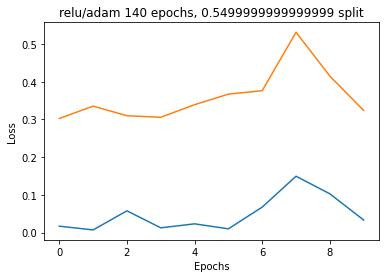

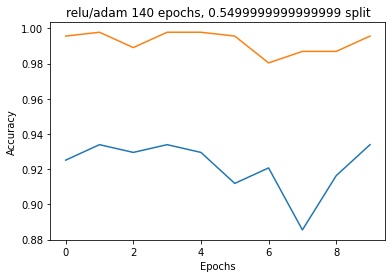

18/18 [==============================] - 0s 4ms/step - loss: 0.2732 - sparse_categorical_accuracy: 0.9324
Generation 5: 
Test Data:[0.27319660782814026, 0.9323843121528625], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.2732 - sparse_categorical_accuracy: 0.9324


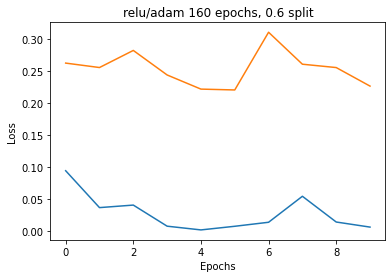

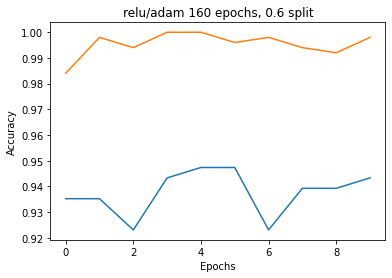

16/16 [==============================] - 0s 4ms/step - loss: 0.1874 - sparse_categorical_accuracy: 0.9500
Generation 5: 
Test Data:[0.1873694211244583, 0.949999988079071], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.1874 - sparse_categorical_accuracy: 0.9500


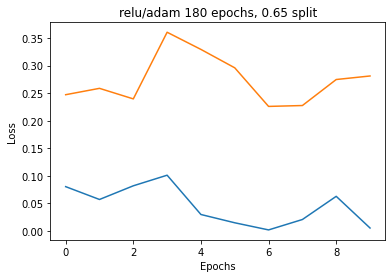

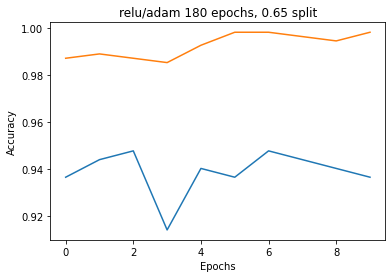

14/14 [==============================] - 0s 4ms/step - loss: 0.2811 - sparse_categorical_accuracy: 0.9314
Generation 5: 
Test Data:[0.2810556888580322, 0.9313501119613647], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.2811 - sparse_categorical_accuracy: 0.9314


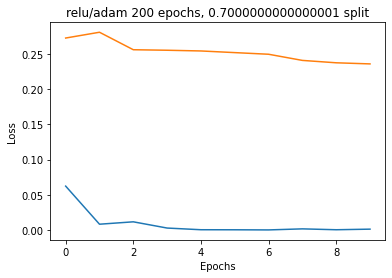

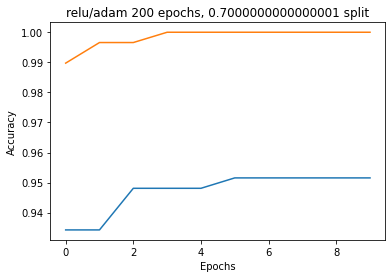

12/12 [==============================] - 0s 4ms/step - loss: 0.2202 - sparse_categorical_accuracy: 0.9360
Generation 5: 
Test Data:[0.22017624974250793, 0.9359999895095825], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.2202 - sparse_categorical_accuracy: 0.9360


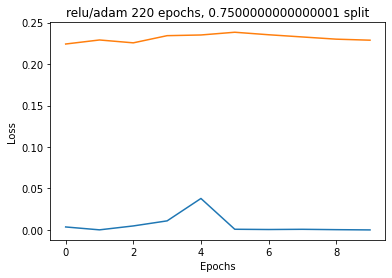

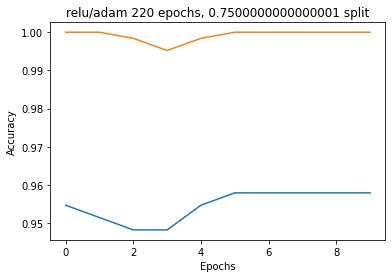

10/10 [==============================] - 0s 4ms/step - loss: 0.2236 - sparse_categorical_accuracy: 0.9551
Generation 5: 
Test Data:[0.2236165702342987, 0.9551281929016113], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.2236 - sparse_categorical_accuracy: 0.9551


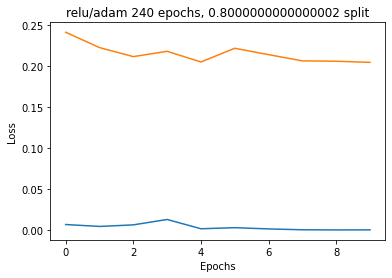

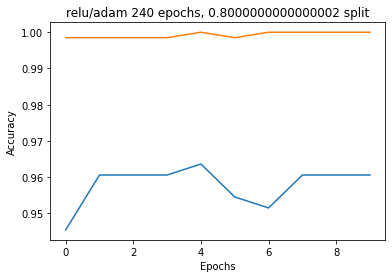

8/8 [==============================] - 0s 4ms/step - loss: 0.2493 - sparse_categorical_accuracy: 0.9520
Generation 5: 
Test Data:[0.24928045272827148, 0.9520000219345093], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 5ms/step - loss: 0.2493 - sparse_categorical_accuracy: 0.9520


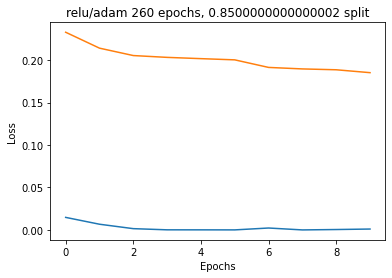

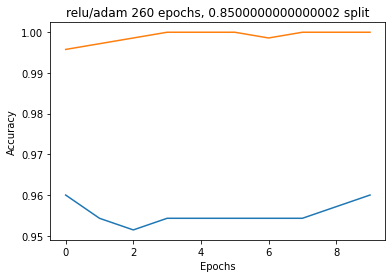

6/6 [==============================] - 0s 4ms/step - loss: 0.2834 - sparse_categorical_accuracy: 0.9309
Generation 5: 
Test Data:[0.28335440158843994, 0.9308510422706604], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 5ms/step - loss: 0.2834 - sparse_categorical_accuracy: 0.9309


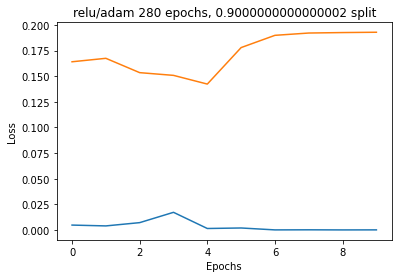

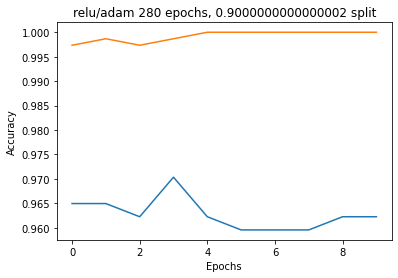

4/4 [==============================] - 0s 5ms/step - loss: 0.4360 - sparse_categorical_accuracy: 0.8960
Generation 5: 
Test Data:[0.4359694719314575, 0.8960000276565552], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.4360 - sparse_categorical_accuracy: 0.8960


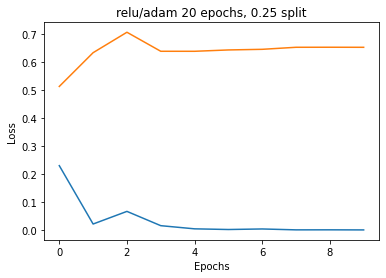

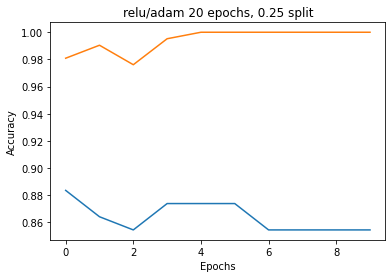

30/30 [==============================] - 0s 4ms/step - loss: 0.1621 - sparse_categorical_accuracy: 0.9658
Generation 6: 
Test Data:[0.16205841302871704, 0.9658119678497314], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.1621 - sparse_categorical_accuracy: 0.9658


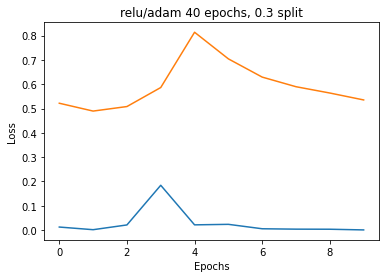

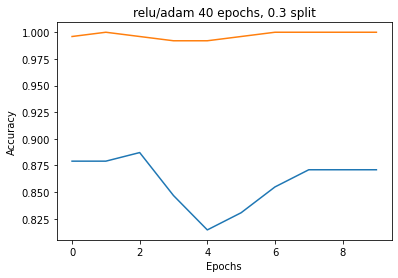

28/28 [==============================] - 0s 4ms/step - loss: 0.1982 - sparse_categorical_accuracy: 0.9622
Generation 6: 
Test Data:[0.19821739196777344, 0.9622425436973572], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 5ms/step - loss: 0.1982 - sparse_categorical_accuracy: 0.9622


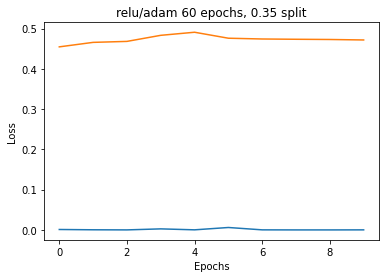

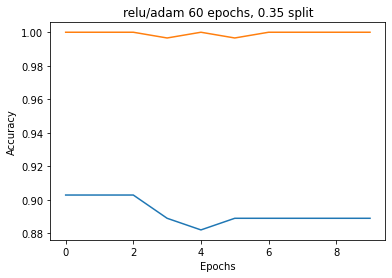

26/26 [==============================] - 0s 4ms/step - loss: 0.1496 - sparse_categorical_accuracy: 0.9655
Generation 6: 
Test Data:[0.14961105585098267, 0.9655172228813171], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.1496 - sparse_categorical_accuracy: 0.9655


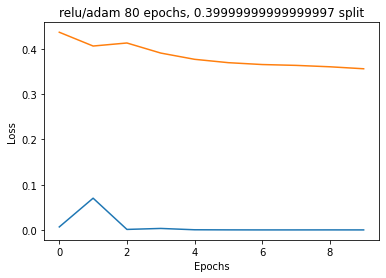

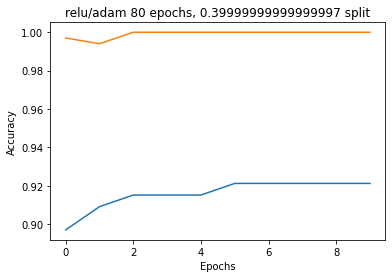

24/24 [==============================] - 0s 4ms/step - loss: 0.1361 - sparse_categorical_accuracy: 0.9653
Generation 6: 
Test Data:[0.13608188927173615, 0.9652870297431946], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.1361 - sparse_categorical_accuracy: 0.9653


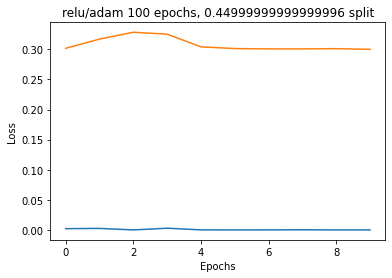

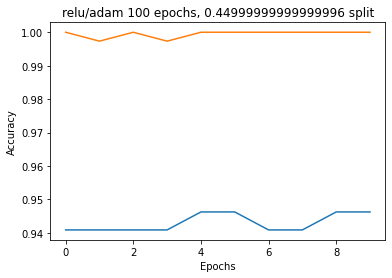

22/22 [==============================] - 0s 4ms/step - loss: 0.1228 - sparse_categorical_accuracy: 0.9665
Generation 6: 
Test Data:[0.12278120964765549, 0.9665210843086243], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.1228 - sparse_categorical_accuracy: 0.9665


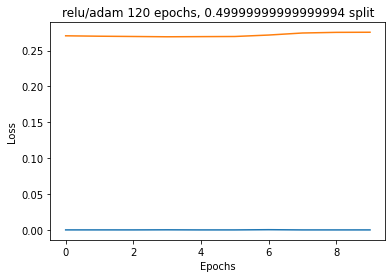

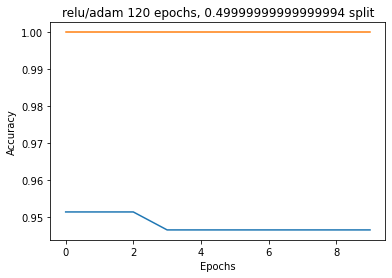

20/20 [==============================] - 0s 4ms/step - loss: 0.1209 - sparse_categorical_accuracy: 0.9632
Generation 6: 
Test Data:[0.12089121341705322, 0.9631999731063843], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.1209 - sparse_categorical_accuracy: 0.9632


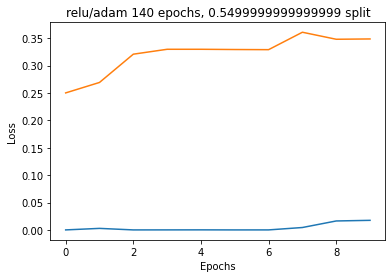

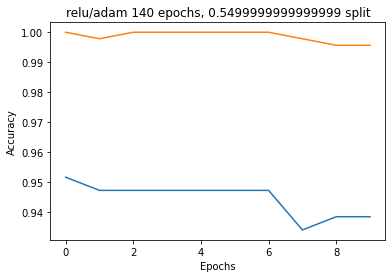

18/18 [==============================] - 0s 4ms/step - loss: 0.2459 - sparse_categorical_accuracy: 0.9484
Generation 6: 
Test Data:[0.2458869367837906, 0.9483985900878906], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.2459 - sparse_categorical_accuracy: 0.9484


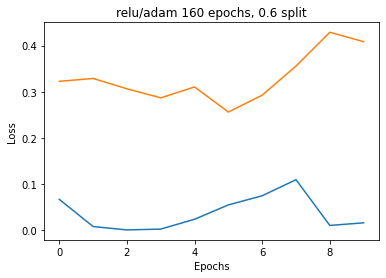

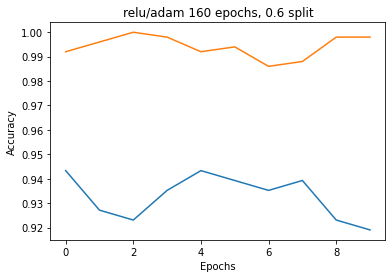

16/16 [==============================] - 0s 4ms/step - loss: 0.1913 - sparse_categorical_accuracy: 0.9460
Generation 6: 
Test Data:[0.19128793478012085, 0.9459999799728394], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.1913 - sparse_categorical_accuracy: 0.9460


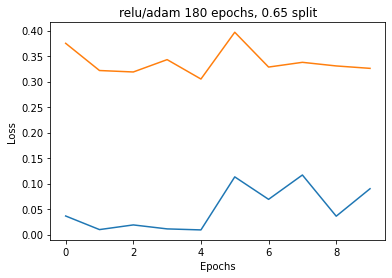

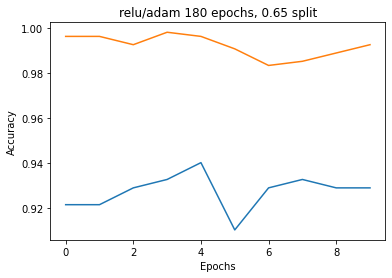

14/14 [==============================] - 0s 4ms/step - loss: 0.3109 - sparse_categorical_accuracy: 0.9291
Generation 6: 
Test Data:[0.31087279319763184, 0.929061770439148], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.3109 - sparse_categorical_accuracy: 0.9291


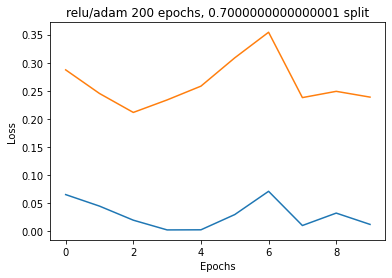

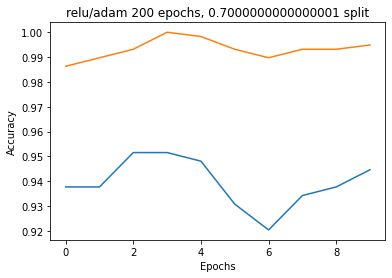

12/12 [==============================] - 0s 4ms/step - loss: 0.2419 - sparse_categorical_accuracy: 0.9360
Generation 6: 
Test Data:[0.24190035462379456, 0.9359999895095825], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.2419 - sparse_categorical_accuracy: 0.9360


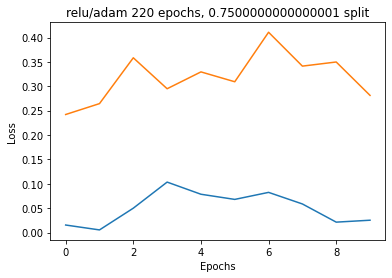

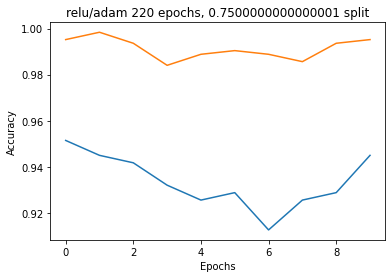

10/10 [==============================] - 0s 5ms/step - loss: 0.3108 - sparse_categorical_accuracy: 0.9231
Generation 6: 
Test Data:[0.31084129214286804, 0.9230769276618958], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.3108 - sparse_categorical_accuracy: 0.9231


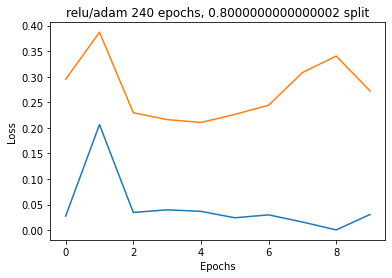

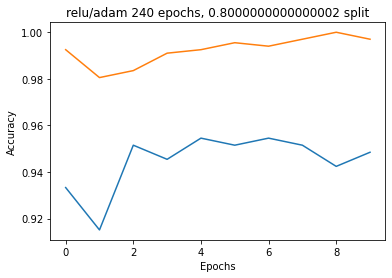

8/8 [==============================] - 0s 5ms/step - loss: 0.2758 - sparse_categorical_accuracy: 0.9200
Generation 6: 
Test Data:[0.2758399546146393, 0.9200000166893005], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2758 - sparse_categorical_accuracy: 0.9200


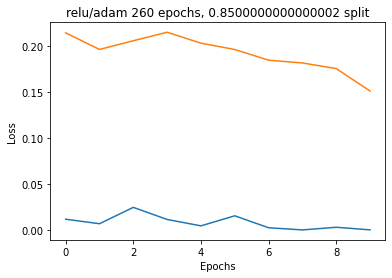

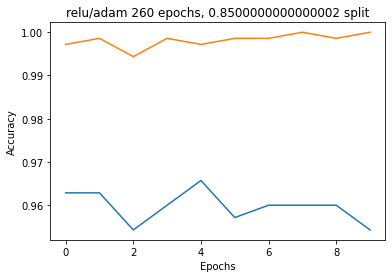

6/6 [==============================] - 0s 4ms/step - loss: 0.3254 - sparse_categorical_accuracy: 0.9255
Generation 6: 
Test Data:[0.32541799545288086, 0.9255319237709045], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 5ms/step - loss: 0.3254 - sparse_categorical_accuracy: 0.9255


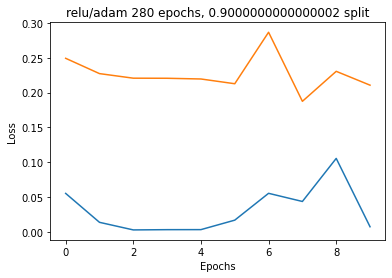

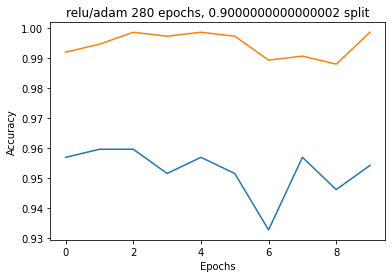

4/4 [==============================] - 0s 5ms/step - loss: 0.5030 - sparse_categorical_accuracy: 0.8960
Generation 6: 
Test Data:[0.5030477643013, 0.8960000276565552], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 4ms/step - loss: 0.5030 - sparse_categorical_accuracy: 0.8960


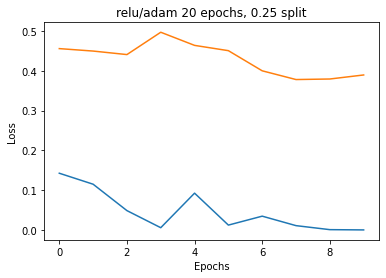

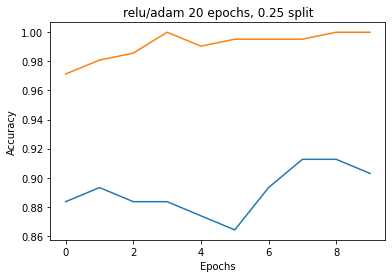

30/30 [==============================] - 0s 5ms/step - loss: 0.0954 - sparse_categorical_accuracy: 0.9776
Generation 7: 
Test Data:[0.09542493522167206, 0.9775640964508057], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.0954 - sparse_categorical_accuracy: 0.9776


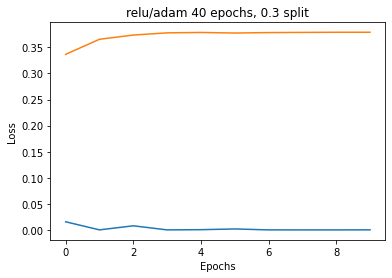

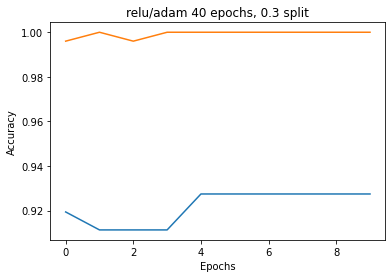

28/28 [==============================] - 0s 5ms/step - loss: 0.0663 - sparse_categorical_accuracy: 0.9805
Generation 7: 
Test Data:[0.06631875038146973, 0.9805492162704468], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.0663 - sparse_categorical_accuracy: 0.9805


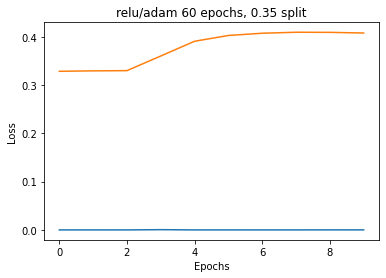

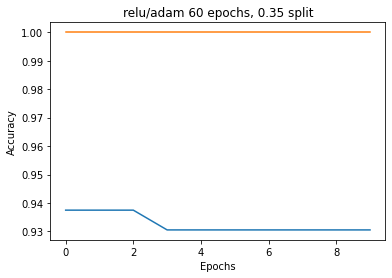

26/26 [==============================] - 0s 4ms/step - loss: 0.0734 - sparse_categorical_accuracy: 0.9791
Generation 7: 
Test Data:[0.073379747569561, 0.9790640473365784], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.0734 - sparse_categorical_accuracy: 0.9791


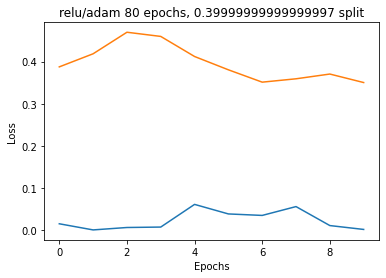

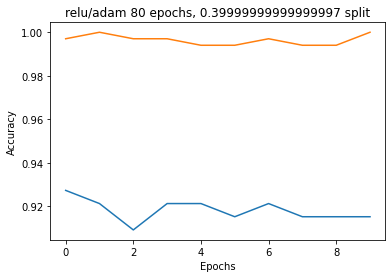

24/24 [==============================] - 0s 4ms/step - loss: 0.0979 - sparse_categorical_accuracy: 0.9773
Generation 7: 
Test Data:[0.0979132354259491, 0.9773030877113342], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.0979 - sparse_categorical_accuracy: 0.9773


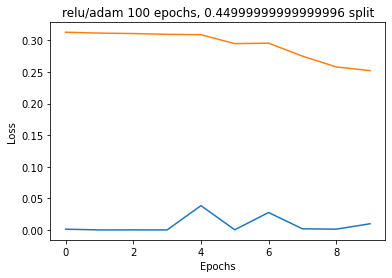

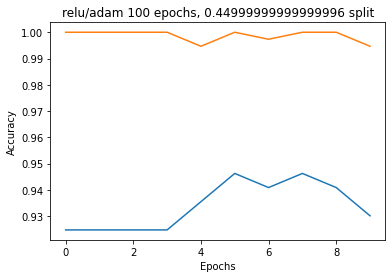

22/22 [==============================] - 0s 4ms/step - loss: 0.0928 - sparse_categorical_accuracy: 0.9694
Generation 7: 
Test Data:[0.09277684986591339, 0.9694322943687439], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.0928 - sparse_categorical_accuracy: 0.9694


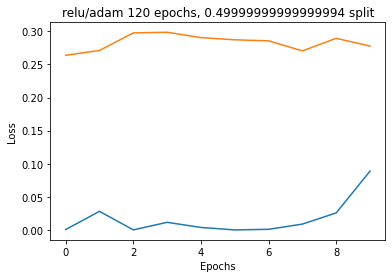

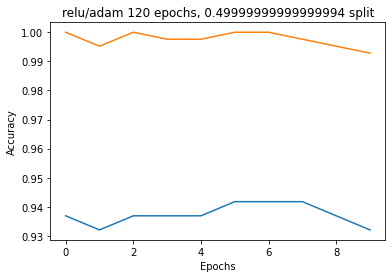

20/20 [==============================] - 0s 4ms/step - loss: 0.1857 - sparse_categorical_accuracy: 0.9680
Generation 7: 
Test Data:[0.1857079118490219, 0.9679999947547913], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 5ms/step - loss: 0.1857 - sparse_categorical_accuracy: 0.9680


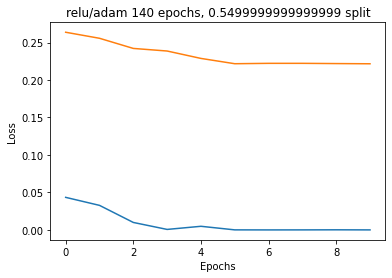

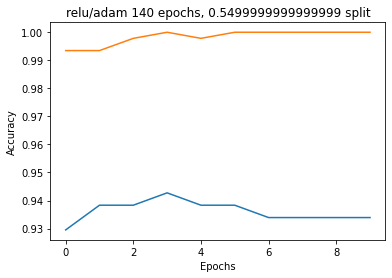

18/18 [==============================] - 0s 4ms/step - loss: 0.1569 - sparse_categorical_accuracy: 0.9751
Generation 7: 
Test Data:[0.1568560004234314, 0.9750889539718628], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.1569 - sparse_categorical_accuracy: 0.9751


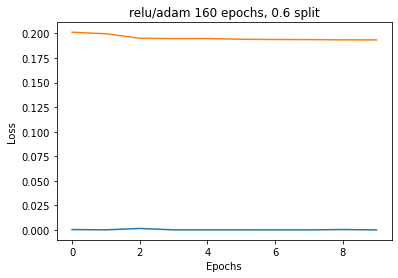

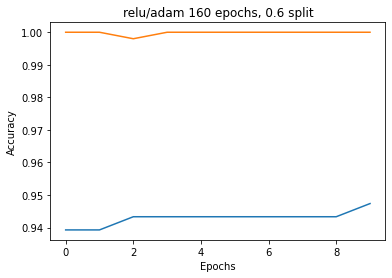

16/16 [==============================] - 0s 4ms/step - loss: 0.1611 - sparse_categorical_accuracy: 0.9700
Generation 7: 
Test Data:[0.16105422377586365, 0.9700000286102295], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 5ms/step - loss: 0.1611 - sparse_categorical_accuracy: 0.9700


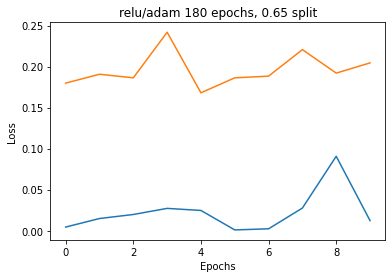

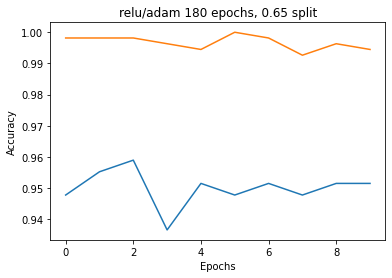

14/14 [==============================] - 0s 4ms/step - loss: 0.1568 - sparse_categorical_accuracy: 0.9680
Generation 7: 
Test Data:[0.15676097571849823, 0.9679633975028992], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.1568 - sparse_categorical_accuracy: 0.9680


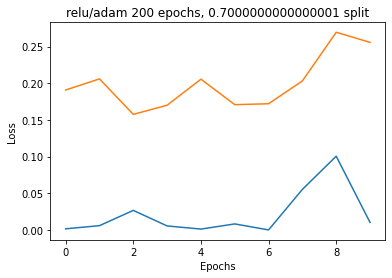

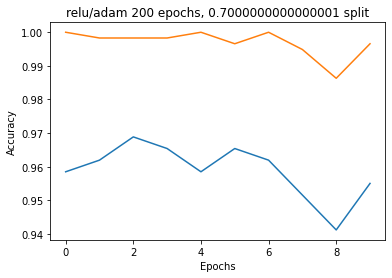

12/12 [==============================] - 0s 4ms/step - loss: 0.2312 - sparse_categorical_accuracy: 0.9440
Generation 7: 
Test Data:[0.23117515444755554, 0.9440000057220459], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 5ms/step - loss: 0.2312 - sparse_categorical_accuracy: 0.9440


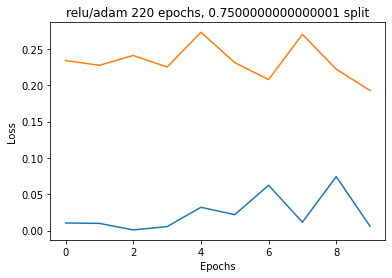

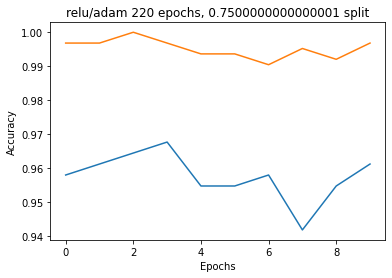

10/10 [==============================] - 0s 4ms/step - loss: 0.2535 - sparse_categorical_accuracy: 0.9487
Generation 7: 
Test Data:[0.253490149974823, 0.9487179517745972], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.2535 - sparse_categorical_accuracy: 0.9487


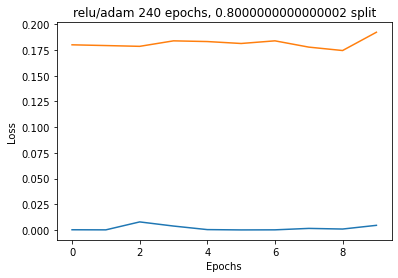

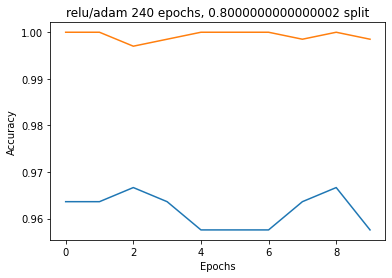

8/8 [==============================] - 0s 4ms/step - loss: 0.2707 - sparse_categorical_accuracy: 0.9480
Generation 7: 
Test Data:[0.2707458436489105, 0.9480000138282776], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2707 - sparse_categorical_accuracy: 0.9480


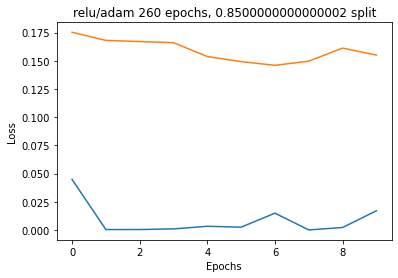

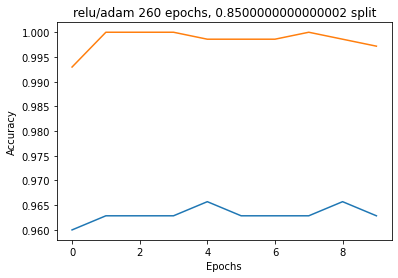

6/6 [==============================] - 0s 5ms/step - loss: 0.3031 - sparse_categorical_accuracy: 0.9255
Generation 7: 
Test Data:[0.30306559801101685, 0.9255319237709045], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.3031 - sparse_categorical_accuracy: 0.9255


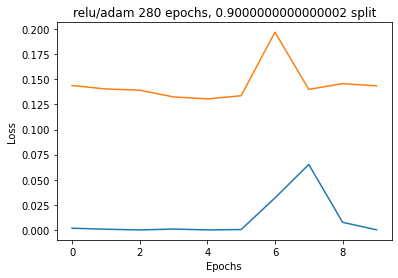

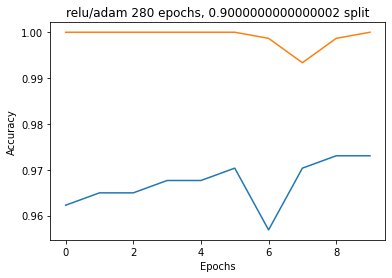

4/4 [==============================] - 0s 6ms/step - loss: 0.3145 - sparse_categorical_accuracy: 0.9280
Generation 7: 
Test Data:[0.3145468533039093, 0.9279999732971191], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.3145 - sparse_categorical_accuracy: 0.9280


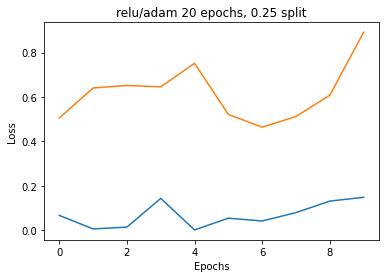

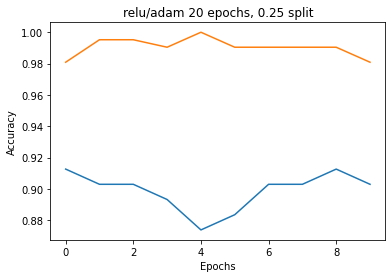

30/30 [==============================] - 0s 5ms/step - loss: 0.2588 - sparse_categorical_accuracy: 0.9712
Generation 8: 
Test Data:[0.25879618525505066, 0.9711538553237915], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.2588 - sparse_categorical_accuracy: 0.9712


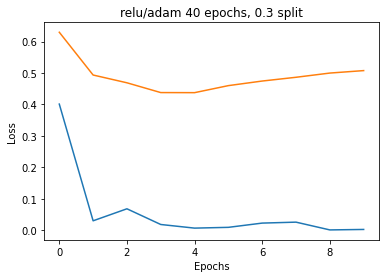

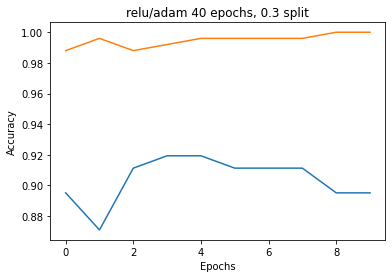

28/28 [==============================] - 0s 4ms/step - loss: 0.1134 - sparse_categorical_accuracy: 0.9771
Generation 8: 
Test Data:[0.11337003856897354, 0.9771167039871216], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.1134 - sparse_categorical_accuracy: 0.9771


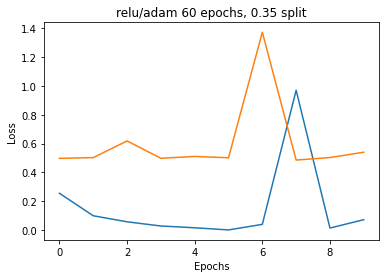

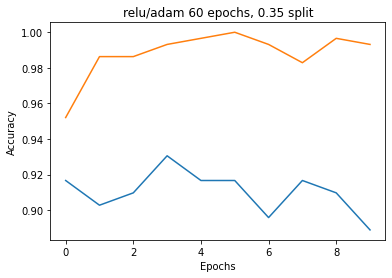

26/26 [==============================] - 0s 4ms/step - loss: 0.1928 - sparse_categorical_accuracy: 0.9594
Generation 8: 
Test Data:[0.1927938163280487, 0.9593595862388611], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.1928 - sparse_categorical_accuracy: 0.9594


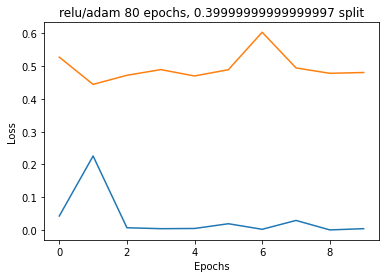

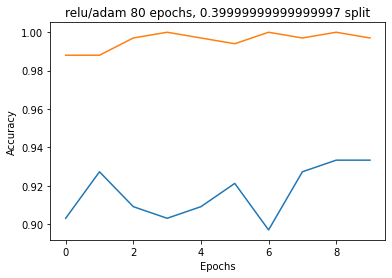

24/24 [==============================] - 0s 4ms/step - loss: 0.1766 - sparse_categorical_accuracy: 0.9680
Generation 8: 
Test Data:[0.1766299605369568, 0.9679572582244873], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 5ms/step - loss: 0.1766 - sparse_categorical_accuracy: 0.9680


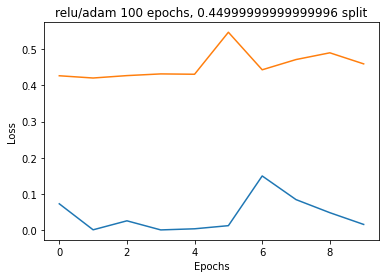

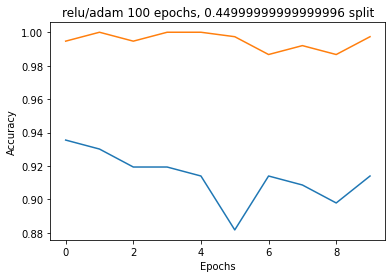

22/22 [==============================] - 0s 4ms/step - loss: 0.2190 - sparse_categorical_accuracy: 0.9592
Generation 8: 
Test Data:[0.21902605891227722, 0.9592430591583252], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 5ms/step - loss: 0.2190 - sparse_categorical_accuracy: 0.9592


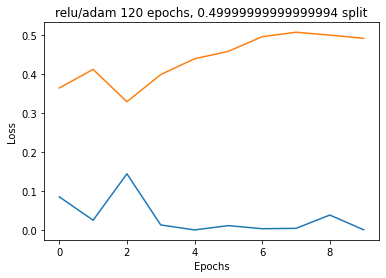

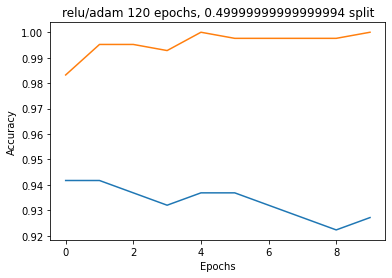

20/20 [==============================] - 0s 4ms/step - loss: 0.1752 - sparse_categorical_accuracy: 0.9632
Generation 8: 
Test Data:[0.175202414393425, 0.9631999731063843], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.1752 - sparse_categorical_accuracy: 0.9632


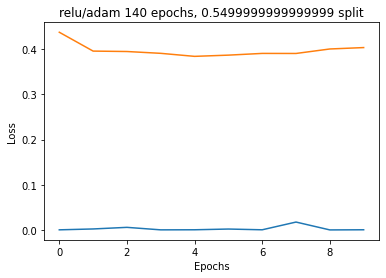

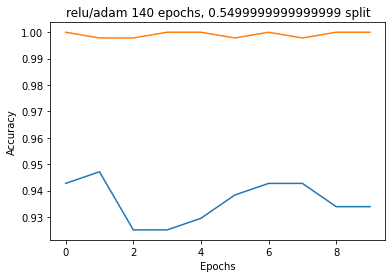

18/18 [==============================] - 0s 4ms/step - loss: 0.1236 - sparse_categorical_accuracy: 0.9680
Generation 8: 
Test Data:[0.12358522415161133, 0.9679715037345886], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 5ms/step - loss: 0.1236 - sparse_categorical_accuracy: 0.9680


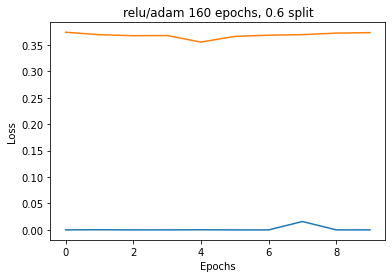

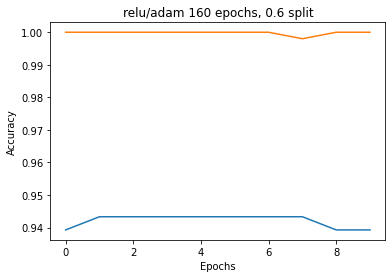

16/16 [==============================] - 0s 5ms/step - loss: 0.1441 - sparse_categorical_accuracy: 0.9640
Generation 8: 
Test Data:[0.1440936177968979, 0.9639999866485596], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.1441 - sparse_categorical_accuracy: 0.9640


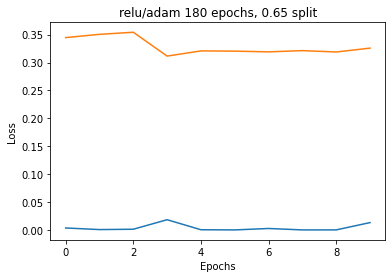

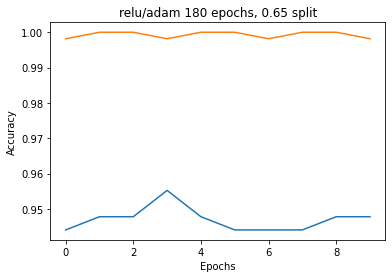

14/14 [==============================] - 0s 4ms/step - loss: 0.2336 - sparse_categorical_accuracy: 0.9588
Generation 8: 
Test Data:[0.23362992703914642, 0.9588100910186768], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.2336 - sparse_categorical_accuracy: 0.9588


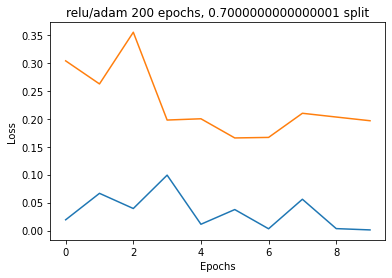

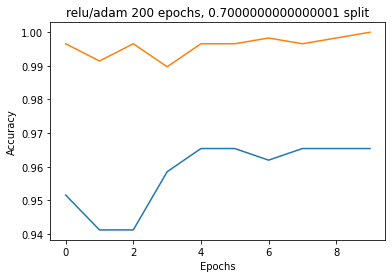

12/12 [==============================] - 0s 4ms/step - loss: 0.2301 - sparse_categorical_accuracy: 0.9573
Generation 8: 
Test Data:[0.2300812005996704, 0.9573333263397217], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.2301 - sparse_categorical_accuracy: 0.9573


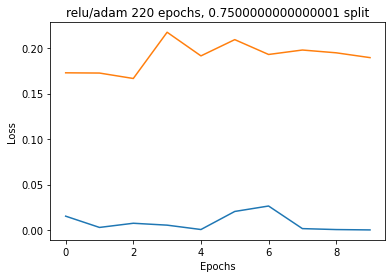

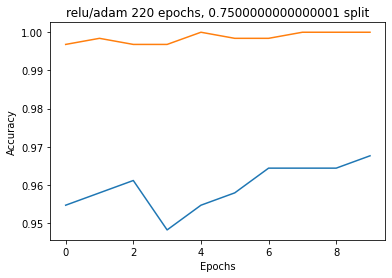

10/10 [==============================] - 0s 4ms/step - loss: 0.2607 - sparse_categorical_accuracy: 0.9455
Generation 8: 
Test Data:[0.2606675326824188, 0.9455128312110901], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.2607 - sparse_categorical_accuracy: 0.9455


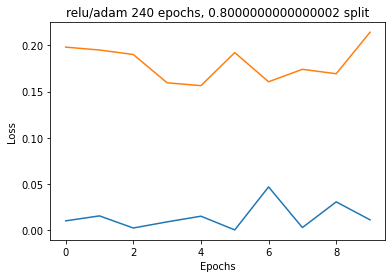

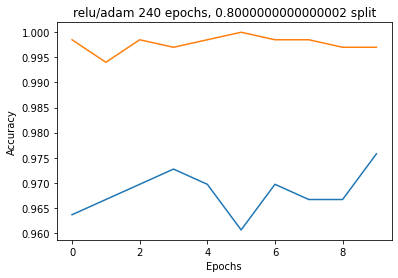

8/8 [==============================] - 0s 4ms/step - loss: 0.3178 - sparse_categorical_accuracy: 0.9400
Generation 8: 
Test Data:[0.3178264796733856, 0.9399999976158142], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.3178 - sparse_categorical_accuracy: 0.9400


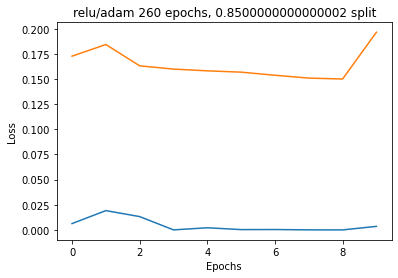

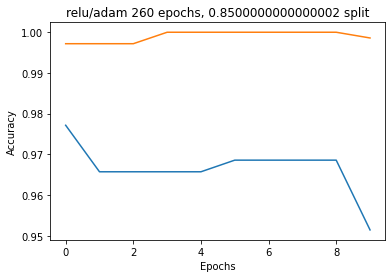

6/6 [==============================] - 0s 4ms/step - loss: 0.3280 - sparse_categorical_accuracy: 0.9043
Generation 8: 
Test Data:[0.32802149653434753, 0.9042553305625916], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.3280 - sparse_categorical_accuracy: 0.9043


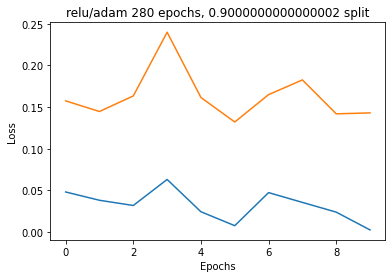

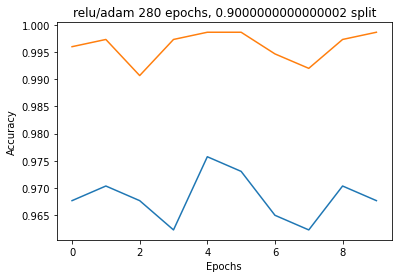

4/4 [==============================] - 0s 6ms/step - loss: 0.4827 - sparse_categorical_accuracy: 0.9280
Generation 8: 
Test Data:[0.48267409205436707, 0.9279999732971191], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.4827 - sparse_categorical_accuracy: 0.9280


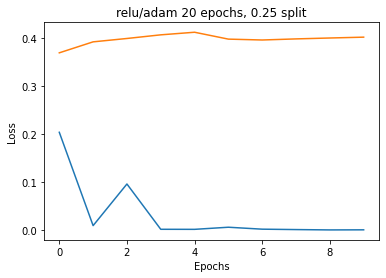

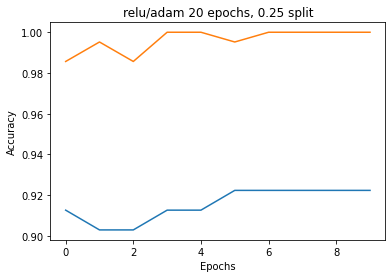

30/30 [==============================] - 0s 4ms/step - loss: 0.0727 - sparse_categorical_accuracy: 0.9818
Generation 9: 
Test Data:[0.07274563610553741, 0.9818376302719116], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.0727 - sparse_categorical_accuracy: 0.9818


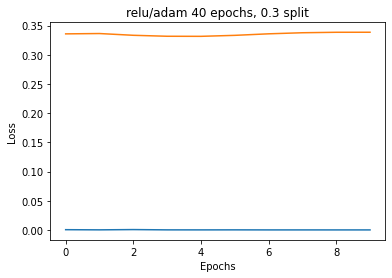

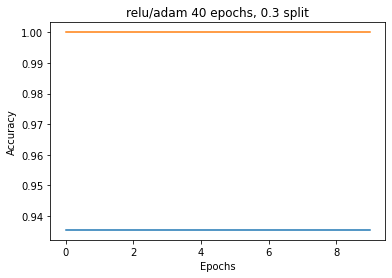

28/28 [==============================] - 0s 4ms/step - loss: 0.0737 - sparse_categorical_accuracy: 0.9817
Generation 9: 
Test Data:[0.07374299317598343, 0.9816933870315552], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.0737 - sparse_categorical_accuracy: 0.9817


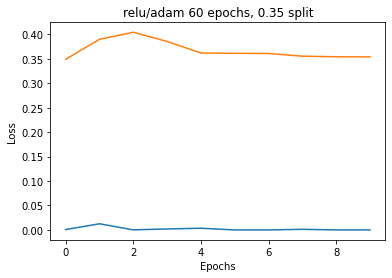

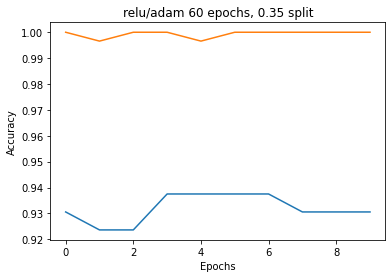

26/26 [==============================] - 0s 4ms/step - loss: 0.0851 - sparse_categorical_accuracy: 0.9791
Generation 9: 
Test Data:[0.0850965827703476, 0.9790640473365784], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 5ms/step - loss: 0.0851 - sparse_categorical_accuracy: 0.9791


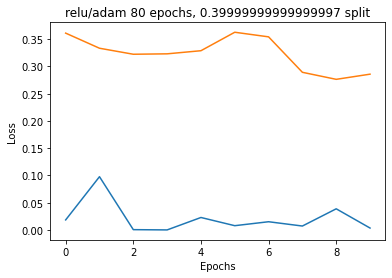

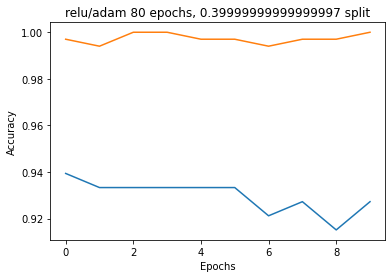

24/24 [==============================] - 0s 4ms/step - loss: 0.1265 - sparse_categorical_accuracy: 0.9720
Generation 9: 
Test Data:[0.12645429372787476, 0.9719626307487488], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.1265 - sparse_categorical_accuracy: 0.9720


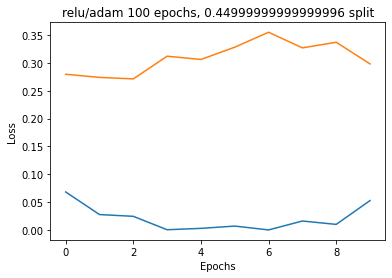

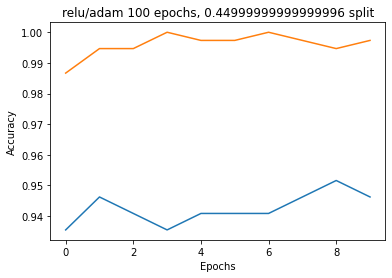

22/22 [==============================] - 0s 4ms/step - loss: 0.1391 - sparse_categorical_accuracy: 0.9723
Generation 9: 
Test Data:[0.13909479975700378, 0.9723435044288635], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.1391 - sparse_categorical_accuracy: 0.9723


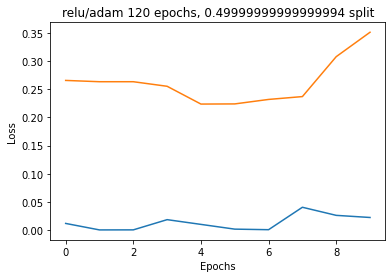

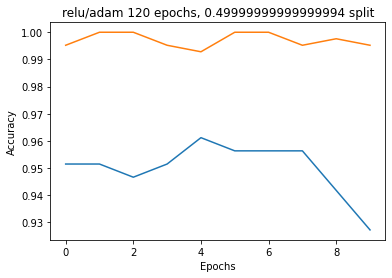

20/20 [==============================] - 0s 5ms/step - loss: 0.2300 - sparse_categorical_accuracy: 0.9648
Generation 9: 
Test Data:[0.22998639941215515, 0.9648000001907349], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.2300 - sparse_categorical_accuracy: 0.9648


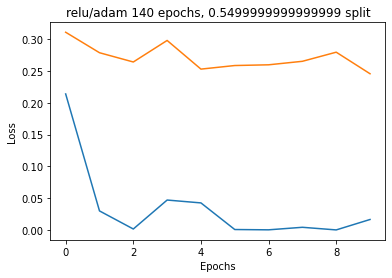

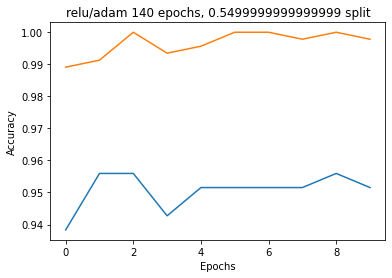

18/18 [==============================] - 0s 4ms/step - loss: 0.1067 - sparse_categorical_accuracy: 0.9715
Generation 9: 
Test Data:[0.10665752738714218, 0.9715302586555481], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.1067 - sparse_categorical_accuracy: 0.9715


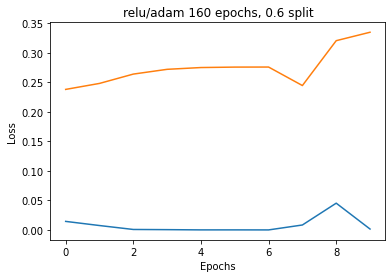

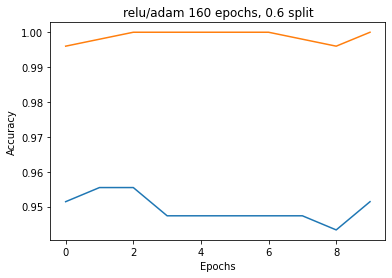

16/16 [==============================] - 0s 4ms/step - loss: 0.1708 - sparse_categorical_accuracy: 0.9660
Generation 9: 
Test Data:[0.1708284467458725, 0.9660000205039978], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.1708 - sparse_categorical_accuracy: 0.9660


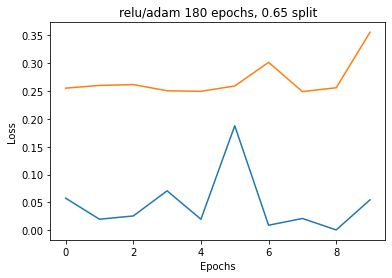

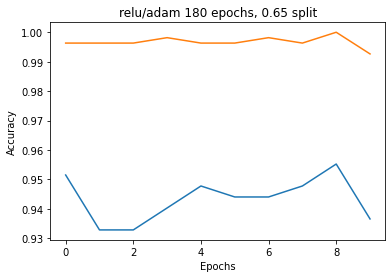

14/14 [==============================] - 0s 4ms/step - loss: 0.3183 - sparse_categorical_accuracy: 0.9359
Generation 9: 
Test Data:[0.3183034062385559, 0.9359267950057983], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 4ms/step - loss: 0.3183 - sparse_categorical_accuracy: 0.9359


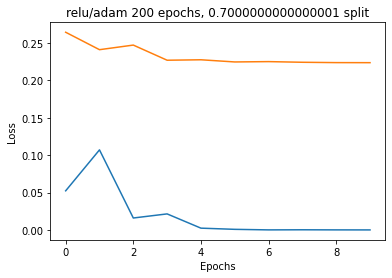

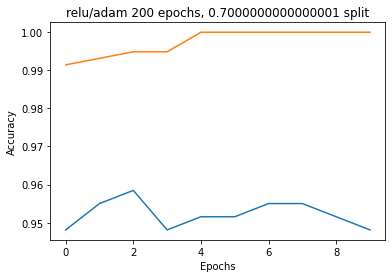

12/12 [==============================] - 0s 4ms/step - loss: 0.1428 - sparse_categorical_accuracy: 0.9653
Generation 9: 
Test Data:[0.14284397661685944, 0.9653333425521851], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.1428 - sparse_categorical_accuracy: 0.9653


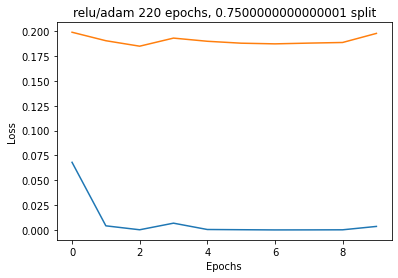

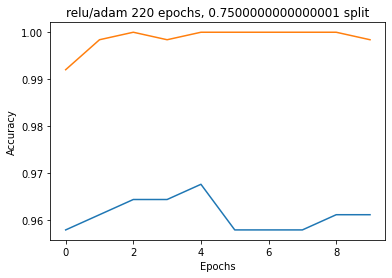

10/10 [==============================] - 0s 4ms/step - loss: 0.1434 - sparse_categorical_accuracy: 0.9679
Generation 9: 
Test Data:[0.14338533580303192, 0.9679487347602844], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.1434 - sparse_categorical_accuracy: 0.9679


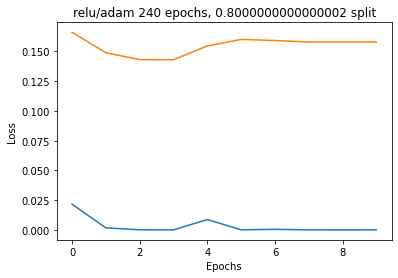

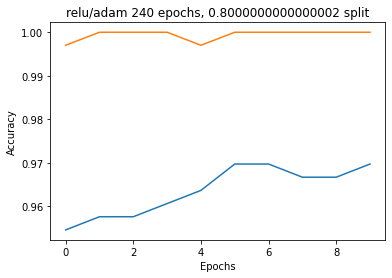

8/8 [==============================] - 0s 4ms/step - loss: 0.2012 - sparse_categorical_accuracy: 0.9640
Generation 9: 
Test Data:[0.201157808303833, 0.9639999866485596], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 5ms/step - loss: 0.2012 - sparse_categorical_accuracy: 0.9640


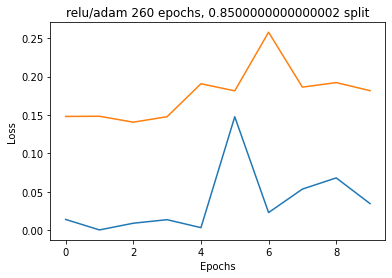

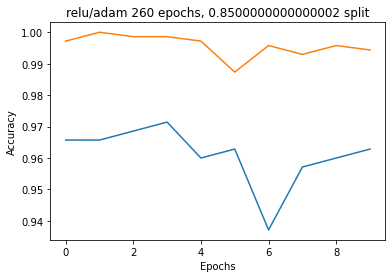

6/6 [==============================] - 0s 5ms/step - loss: 0.1941 - sparse_categorical_accuracy: 0.9521
Generation 9: 
Test Data:[0.1940518170595169, 0.9521276354789734], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 4ms/step - loss: 0.1941 - sparse_categorical_accuracy: 0.9521


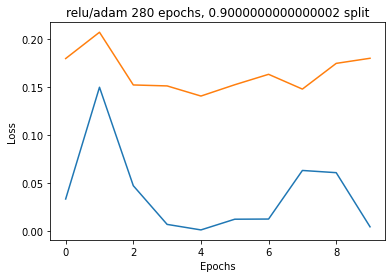

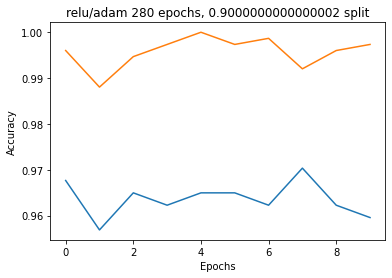

4/4 [==============================] - 0s 6ms/step - loss: 0.3698 - sparse_categorical_accuracy: 0.9120
Generation 9: 
Test Data:[0.36978253722190857, 0.9120000004768372], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.3698 - sparse_categorical_accuracy: 0.9120


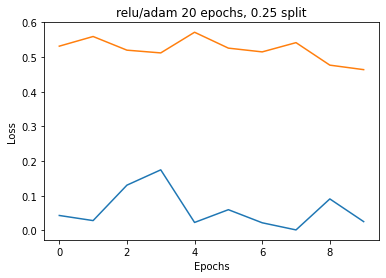

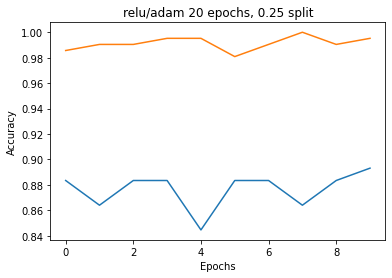

30/30 [==============================] - 0s 4ms/step - loss: 0.1603 - sparse_categorical_accuracy: 0.9615
Generation 10: 
Test Data:[0.16026021540164948, 0.9615384340286255], 
Epochs:20, 
Train/Test Split:0.25
30/30 [==============================] - 0s 4ms/step - loss: 0.1603 - sparse_categorical_accuracy: 0.9615


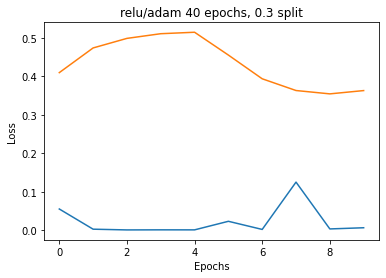

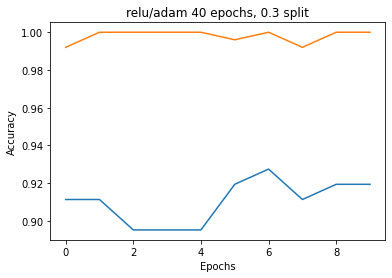

28/28 [==============================] - 0s 4ms/step - loss: 0.1796 - sparse_categorical_accuracy: 0.9657
Generation 10: 
Test Data:[0.17959411442279816, 0.9656750559806824], 
Epochs:40, 
Train/Test Split:0.3
28/28 [==============================] - 0s 4ms/step - loss: 0.1796 - sparse_categorical_accuracy: 0.9657


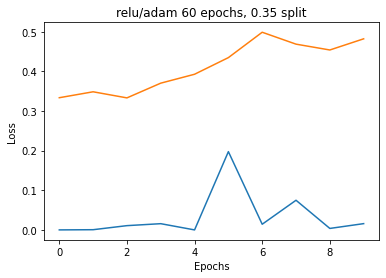

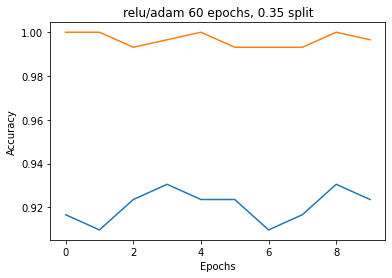

26/26 [==============================] - 0s 4ms/step - loss: 0.2783 - sparse_categorical_accuracy: 0.9594
Generation 10: 
Test Data:[0.2782774567604065, 0.9593595862388611], 
Epochs:60, 
Train/Test Split:0.35
26/26 [==============================] - 0s 4ms/step - loss: 0.2783 - sparse_categorical_accuracy: 0.9594


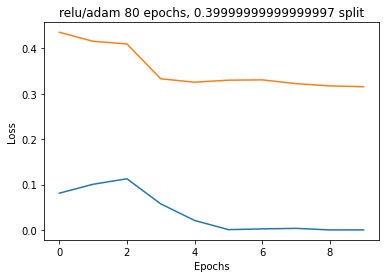

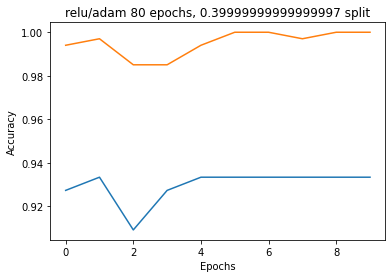

24/24 [==============================] - 0s 4ms/step - loss: 0.1482 - sparse_categorical_accuracy: 0.9666
Generation 10: 
Test Data:[0.14815300703048706, 0.9666221737861633], 
Epochs:80, 
Train/Test Split:0.39999999999999997
24/24 [==============================] - 0s 4ms/step - loss: 0.1482 - sparse_categorical_accuracy: 0.9666


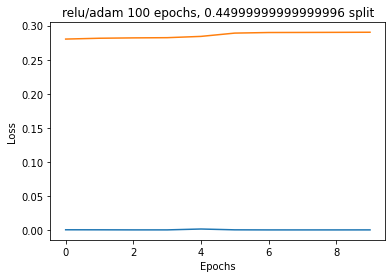

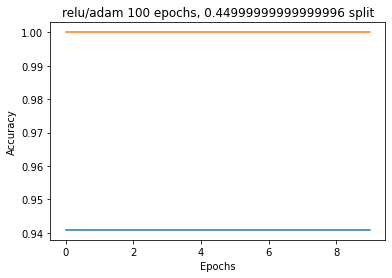

22/22 [==============================] - 0s 4ms/step - loss: 0.1545 - sparse_categorical_accuracy: 0.9607
Generation 10: 
Test Data:[0.15453839302062988, 0.960698664188385], 
Epochs:100, 
Train/Test Split:0.44999999999999996
22/22 [==============================] - 0s 4ms/step - loss: 0.1545 - sparse_categorical_accuracy: 0.9607


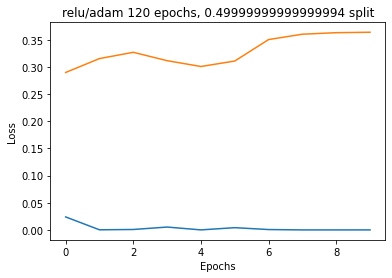

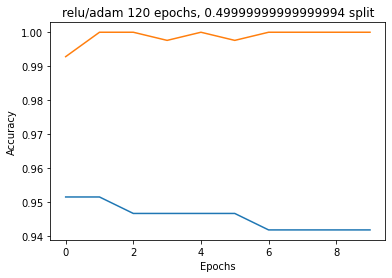

20/20 [==============================] - 0s 4ms/step - loss: 0.1488 - sparse_categorical_accuracy: 0.9616
Generation 10: 
Test Data:[0.1488191932439804, 0.9616000056266785], 
Epochs:120, 
Train/Test Split:0.49999999999999994
20/20 [==============================] - 0s 4ms/step - loss: 0.1488 - sparse_categorical_accuracy: 0.9616


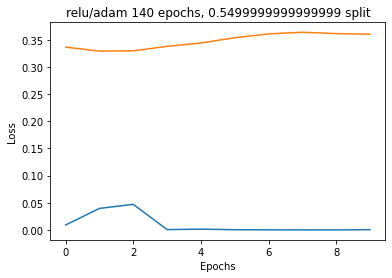

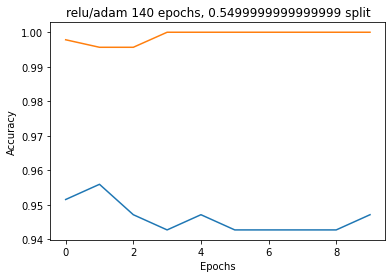

18/18 [==============================] - 0s 4ms/step - loss: 0.1591 - sparse_categorical_accuracy: 0.9662
Generation 10: 
Test Data:[0.15911120176315308, 0.9661921858787537], 
Epochs:140, 
Train/Test Split:0.5499999999999999
18/18 [==============================] - 0s 4ms/step - loss: 0.1591 - sparse_categorical_accuracy: 0.9662


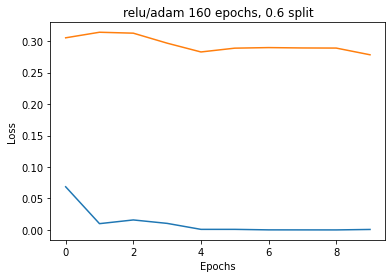

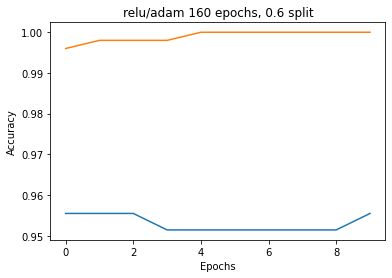

16/16 [==============================] - 0s 4ms/step - loss: 0.1395 - sparse_categorical_accuracy: 0.9720
Generation 10: 
Test Data:[0.13952404260635376, 0.972000002861023], 
Epochs:160, 
Train/Test Split:0.6
16/16 [==============================] - 0s 4ms/step - loss: 0.1395 - sparse_categorical_accuracy: 0.9720


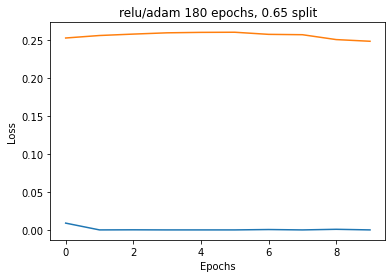

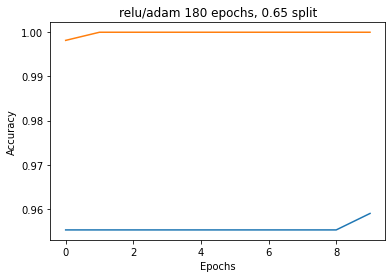

14/14 [==============================] - 0s 5ms/step - loss: 0.1534 - sparse_categorical_accuracy: 0.9725
Generation 10: 
Test Data:[0.15335574746131897, 0.972540020942688], 
Epochs:180, 
Train/Test Split:0.65
14/14 [==============================] - 0s 5ms/step - loss: 0.1534 - sparse_categorical_accuracy: 0.9725


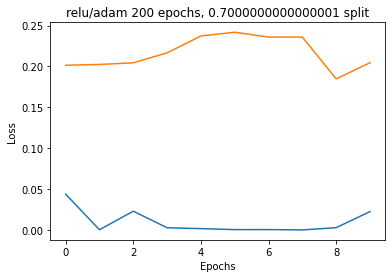

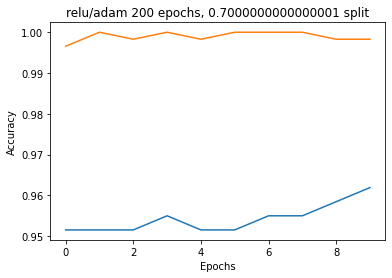

12/12 [==============================] - 0s 5ms/step - loss: 0.1173 - sparse_categorical_accuracy: 0.9733
Generation 10: 
Test Data:[0.11728157848119736, 0.9733333587646484], 
Epochs:200, 
Train/Test Split:0.7000000000000001
12/12 [==============================] - 0s 4ms/step - loss: 0.1173 - sparse_categorical_accuracy: 0.9733


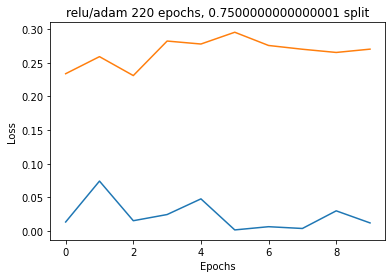

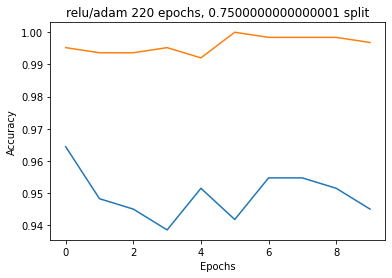

10/10 [==============================] - 0s 5ms/step - loss: 0.2302 - sparse_categorical_accuracy: 0.9519
Generation 10: 
Test Data:[0.23017668724060059, 0.9519230723381042], 
Epochs:220, 
Train/Test Split:0.7500000000000001
10/10 [==============================] - 0s 4ms/step - loss: 0.2302 - sparse_categorical_accuracy: 0.9519


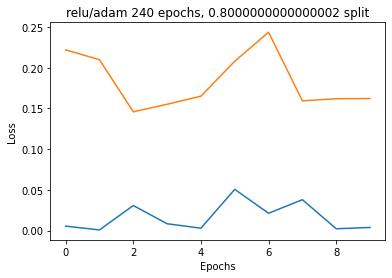

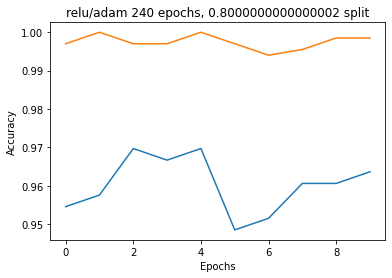

8/8 [==============================] - 0s 5ms/step - loss: 0.2509 - sparse_categorical_accuracy: 0.9600
Generation 10: 
Test Data:[0.2508620321750641, 0.9599999785423279], 
Epochs:240, 
Train/Test Split:0.8000000000000002
8/8 [==============================] - 0s 5ms/step - loss: 0.2509 - sparse_categorical_accuracy: 0.9600


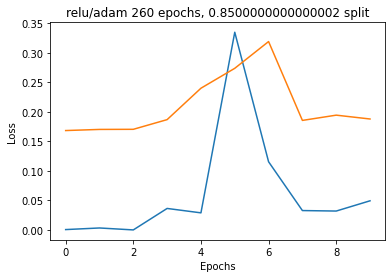

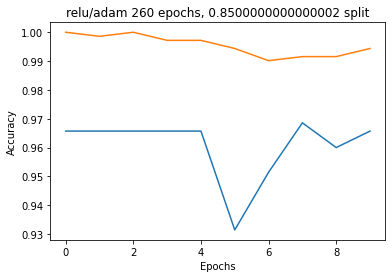

6/6 [==============================] - 0s 6ms/step - loss: 0.3134 - sparse_categorical_accuracy: 0.9309
Generation 10: 
Test Data:[0.3134332299232483, 0.9308510422706604], 
Epochs:260, 
Train/Test Split:0.8500000000000002
6/6 [==============================] - 0s 5ms/step - loss: 0.3134 - sparse_categorical_accuracy: 0.9309


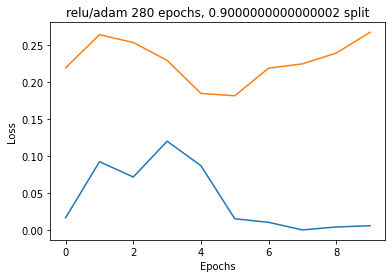

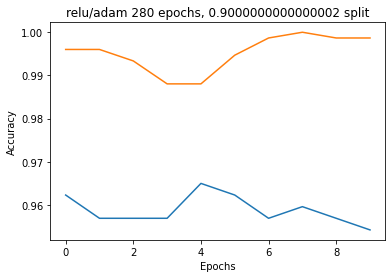

4/4 [==============================] - 0s 5ms/step - loss: 0.3949 - sparse_categorical_accuracy: 0.9280
Generation 10: 
Test Data:[0.39490845799446106, 0.9279999732971191], 
Epochs:280, 
Train/Test Split:0.9000000000000002
4/4 [==============================] - 0s 5ms/step - loss: 0.3949 - sparse_categorical_accuracy: 0.9280


In [109]:
(X,X_Test_Final,y,y_Test_Final) = dataSplit(y,X,.80)
model = buildModel('relu','adam', normalize=False)
fitModel(X,y,model,'relu/adam')

In [110]:
X = images;
y = names;
model.evaluate(X_Test_Final,y_Test_Final)
model.evaluate(X,y)

49/49 [==============================] - 0s 4ms/step - loss: 0.2903 - sparse_categorical_accuracy: 0.9577


[0.29028400778770447, 0.9576923251152039]

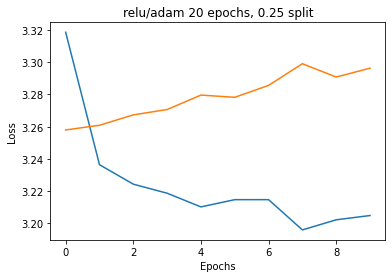

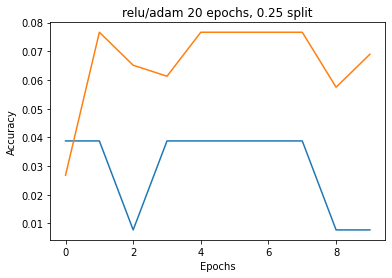

37/37 [==============================] - 0s 4ms/step - loss: 3.2862 - sparse_categorical_accuracy: 0.0350
Generation 1: 
Test Data:[3.2861642837524414, 0.03504273667931557], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 3.2862 - sparse_categorical_accuracy: 0.0350


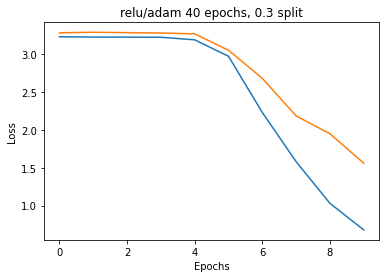

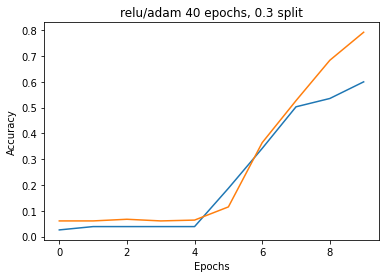

35/35 [==============================] - 0s 4ms/step - loss: 1.5615 - sparse_categorical_accuracy: 0.6181
Generation 1: 
Test Data:[1.5614932775497437, 0.6181318759918213], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 1.5615 - sparse_categorical_accuracy: 0.6181


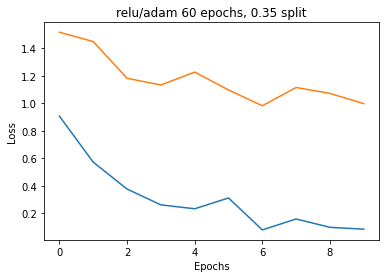

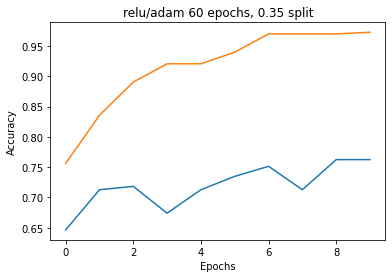

32/32 [==============================] - 0s 4ms/step - loss: 1.1434 - sparse_categorical_accuracy: 0.7189
Generation 1: 
Test Data:[1.143369197845459, 0.7189348936080933], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 1.1434 - sparse_categorical_accuracy: 0.7189


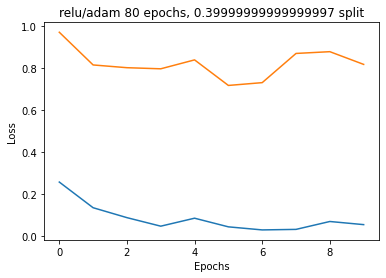

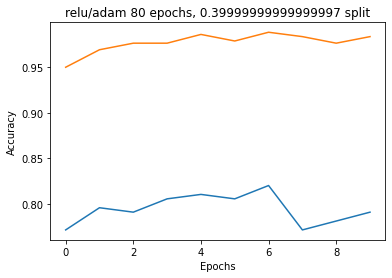

30/30 [==============================] - 0s 4ms/step - loss: 0.9937 - sparse_categorical_accuracy: 0.7500
Generation 1: 
Test Data:[0.9936655163764954, 0.75], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.9937 - sparse_categorical_accuracy: 0.7500


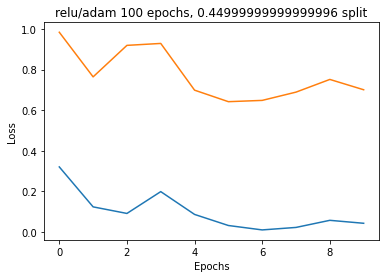

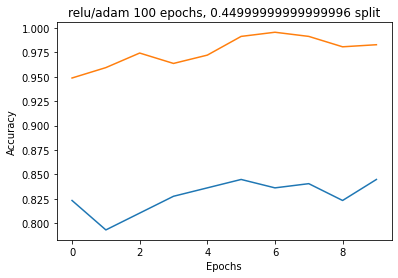

27/27 [==============================] - 0s 4ms/step - loss: 0.9743 - sparse_categorical_accuracy: 0.7614
Generation 1: 
Test Data:[0.9742650389671326, 0.7613503932952881], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.9743 - sparse_categorical_accuracy: 0.7614


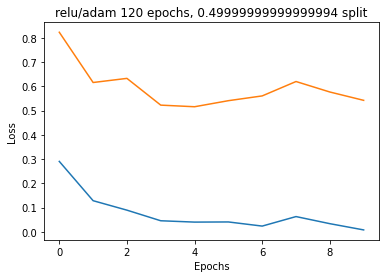

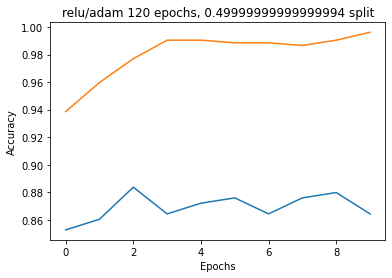

25/25 [==============================] - 0s 4ms/step - loss: 0.7491 - sparse_categorical_accuracy: 0.8079
Generation 1: 
Test Data:[0.7490541338920593, 0.8079385161399841], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.7491 - sparse_categorical_accuracy: 0.8079


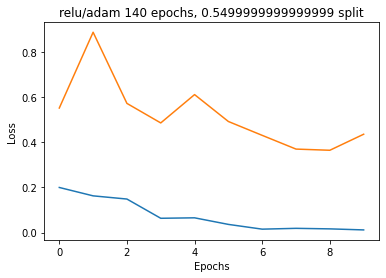

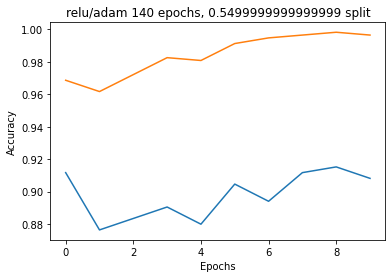

22/22 [==============================] - 0s 4ms/step - loss: 0.7197 - sparse_categorical_accuracy: 0.8236
Generation 1: 
Test Data:[0.7197405099868774, 0.8236131072044373], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.7197 - sparse_categorical_accuracy: 0.8236


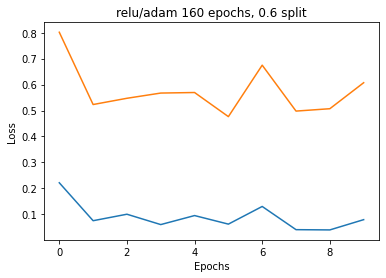

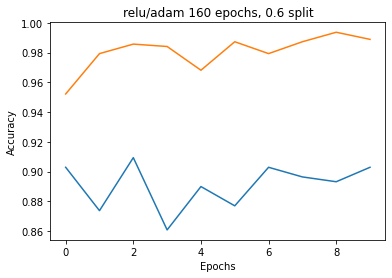

20/20 [==============================] - 0s 4ms/step - loss: 0.7973 - sparse_categorical_accuracy: 0.8510
Generation 1: 
Test Data:[0.7973181009292603, 0.8509615659713745], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.7973 - sparse_categorical_accuracy: 0.8510


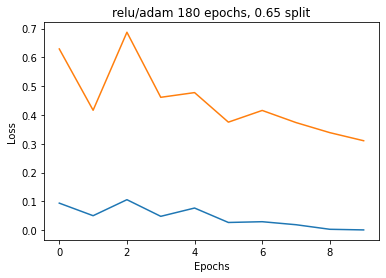

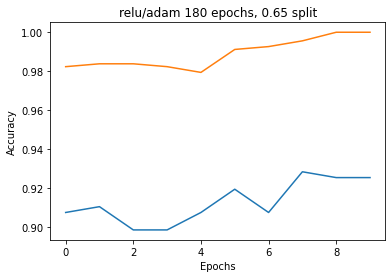

18/18 [==============================] - 0s 4ms/step - loss: 0.4656 - sparse_categorical_accuracy: 0.8645
Generation 1: 
Test Data:[0.46561574935913086, 0.8644688725471497], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.4656 - sparse_categorical_accuracy: 0.8645


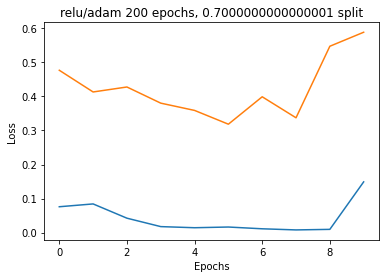

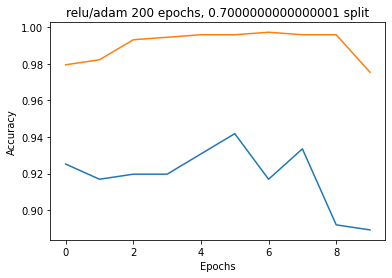

15/15 [==============================] - 0s 4ms/step - loss: 0.7437 - sparse_categorical_accuracy: 0.8184
Generation 1: 
Test Data:[0.7437198758125305, 0.8183760643005371], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.7437 - sparse_categorical_accuracy: 0.8184


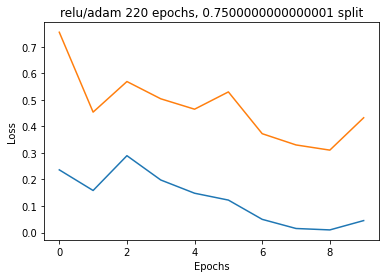

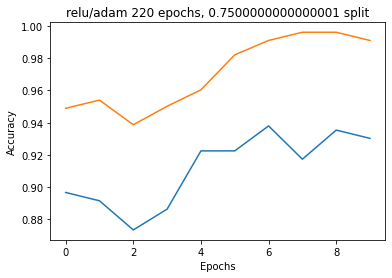

13/13 [==============================] - 0s 4ms/step - loss: 0.5659 - sparse_categorical_accuracy: 0.8821
Generation 1: 
Test Data:[0.5658904910087585, 0.8820512890815735], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.5659 - sparse_categorical_accuracy: 0.8821


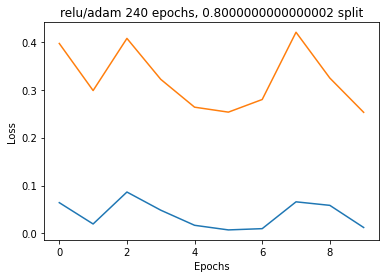

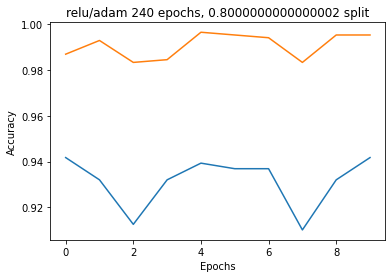

10/10 [==============================] - 0s 4ms/step - loss: 0.4277 - sparse_categorical_accuracy: 0.8686
Generation 1: 
Test Data:[0.4277004897594452, 0.8685897588729858], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.4277 - sparse_categorical_accuracy: 0.8686


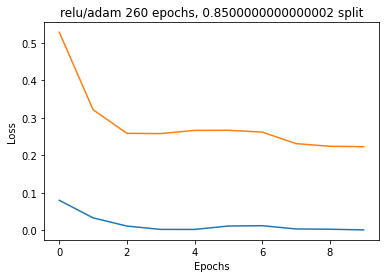

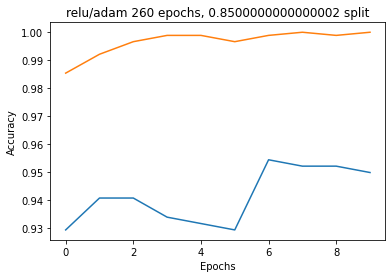

8/8 [==============================] - 0s 4ms/step - loss: 0.3945 - sparse_categorical_accuracy: 0.8932
Generation 1: 
Test Data:[0.3944668173789978, 0.8931623697280884], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.3945 - sparse_categorical_accuracy: 0.8932


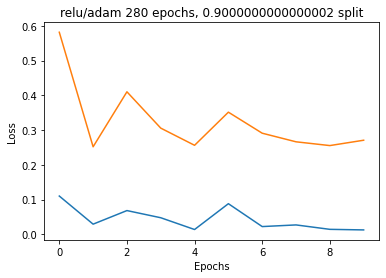

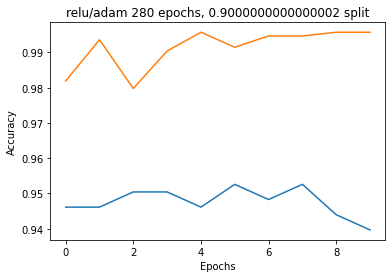

5/5 [==============================] - 0s 5ms/step - loss: 0.3242 - sparse_categorical_accuracy: 0.9167
Generation 1: 
Test Data:[0.32416296005249023, 0.9166666865348816], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.3242 - sparse_categorical_accuracy: 0.9167


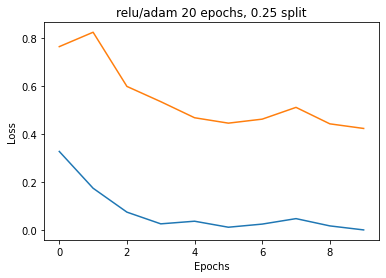

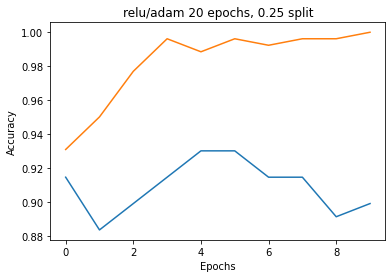

37/37 [==============================] - 0s 4ms/step - loss: 0.1906 - sparse_categorical_accuracy: 0.9624
Generation 2: 
Test Data:[0.19062958657741547, 0.9623931646347046], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.1906 - sparse_categorical_accuracy: 0.9624


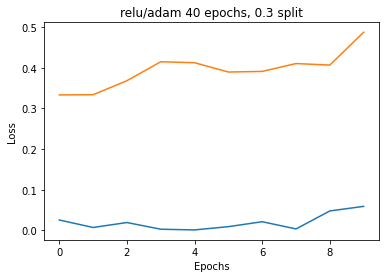

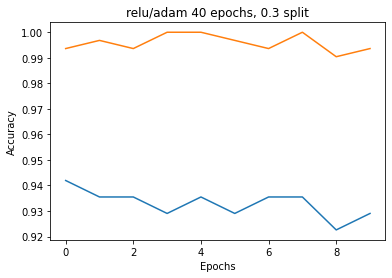

35/35 [==============================] - 0s 4ms/step - loss: 0.3068 - sparse_categorical_accuracy: 0.9670
Generation 2: 
Test Data:[0.30675214529037476, 0.9670329689979553], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.3068 - sparse_categorical_accuracy: 0.9670


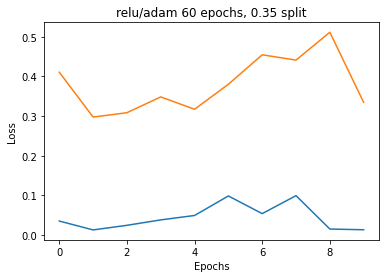

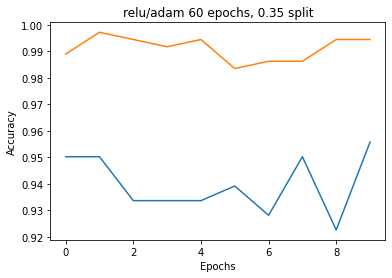

32/32 [==============================] - 0s 4ms/step - loss: 0.2646 - sparse_categorical_accuracy: 0.9507
Generation 2: 
Test Data:[0.2645972967147827, 0.9506903290748596], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.2646 - sparse_categorical_accuracy: 0.9507


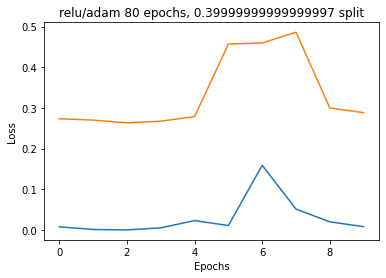

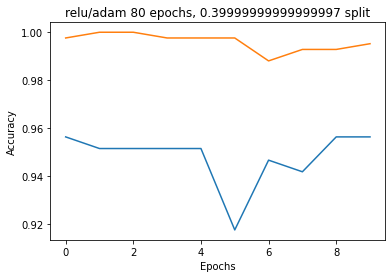

30/30 [==============================] - 0s 4ms/step - loss: 0.2454 - sparse_categorical_accuracy: 0.9423
Generation 2: 
Test Data:[0.24536803364753723, 0.942307710647583], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.2454 - sparse_categorical_accuracy: 0.9423


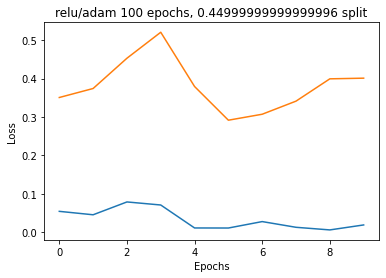

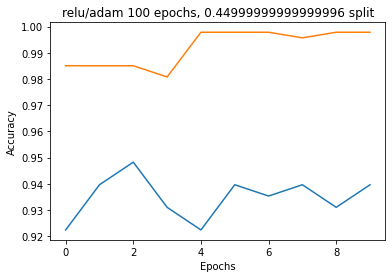

27/27 [==============================] - 0s 4ms/step - loss: 0.3656 - sparse_categorical_accuracy: 0.9371
Generation 2: 
Test Data:[0.3655568063259125, 0.9371362328529358], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.3656 - sparse_categorical_accuracy: 0.9371


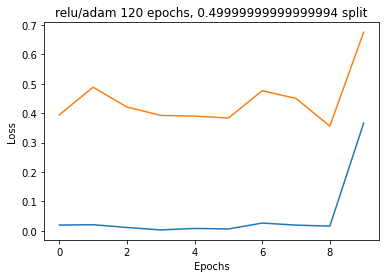

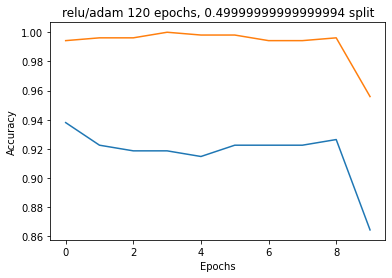

25/25 [==============================] - 0s 4ms/step - loss: 0.7058 - sparse_categorical_accuracy: 0.8617
Generation 2: 
Test Data:[0.7057524919509888, 0.8617157340049744], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.7058 - sparse_categorical_accuracy: 0.8617


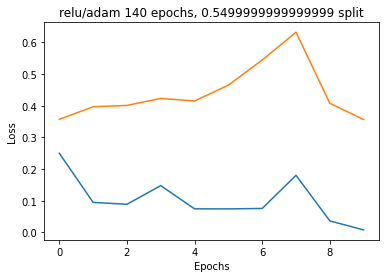

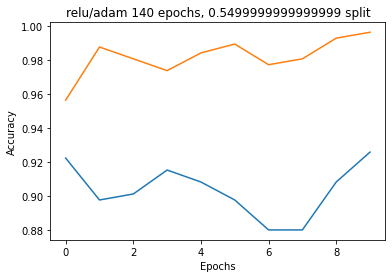

22/22 [==============================] - 0s 4ms/step - loss: 0.3410 - sparse_categorical_accuracy: 0.9246
Generation 2: 
Test Data:[0.34099602699279785, 0.9246088266372681], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.3410 - sparse_categorical_accuracy: 0.9246


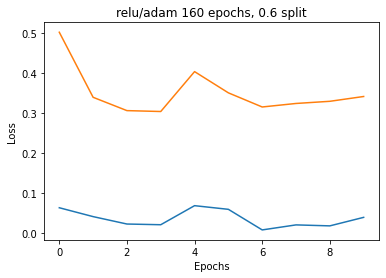

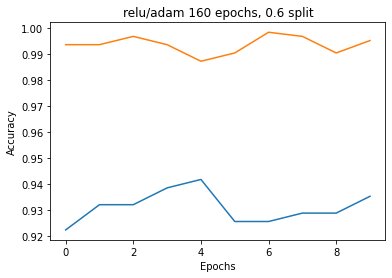

20/20 [==============================] - 0s 4ms/step - loss: 0.3469 - sparse_categorical_accuracy: 0.9327
Generation 2: 
Test Data:[0.3469136655330658, 0.932692289352417], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.3469 - sparse_categorical_accuracy: 0.9327


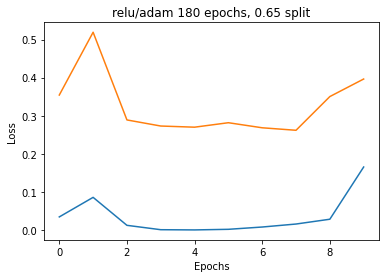

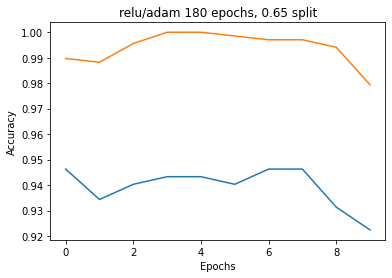

18/18 [==============================] - 0s 4ms/step - loss: 0.4652 - sparse_categorical_accuracy: 0.9286
Generation 2: 
Test Data:[0.46515265107154846, 0.9285714030265808], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.4652 - sparse_categorical_accuracy: 0.9286


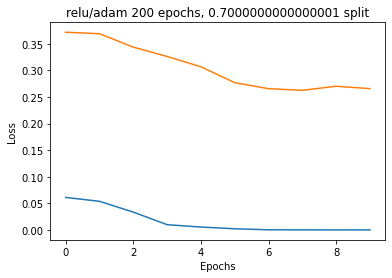

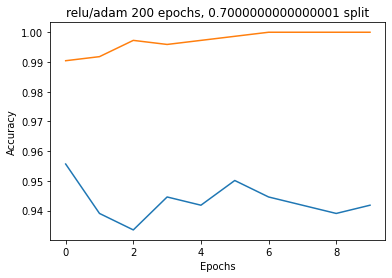

15/15 [==============================] - 0s 4ms/step - loss: 0.2729 - sparse_categorical_accuracy: 0.9359
Generation 2: 
Test Data:[0.2729167938232422, 0.9358974099159241], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.2729 - sparse_categorical_accuracy: 0.9359


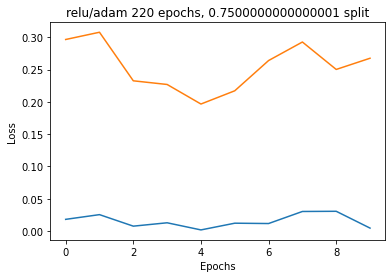

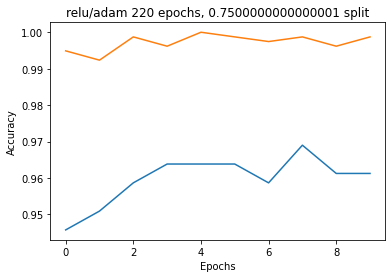

13/13 [==============================] - 0s 4ms/step - loss: 0.3602 - sparse_categorical_accuracy: 0.9410
Generation 2: 
Test Data:[0.36023613810539246, 0.9410256147384644], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.3602 - sparse_categorical_accuracy: 0.9410


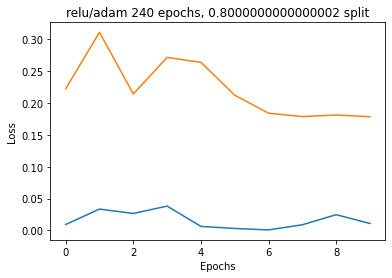

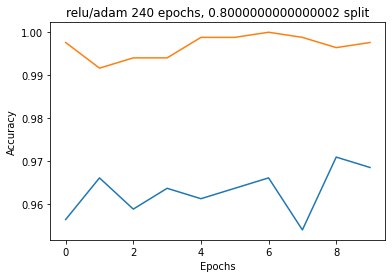

10/10 [==============================] - 0s 5ms/step - loss: 0.2956 - sparse_categorical_accuracy: 0.9423
Generation 2: 
Test Data:[0.29555627703666687, 0.942307710647583], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.2956 - sparse_categorical_accuracy: 0.9423


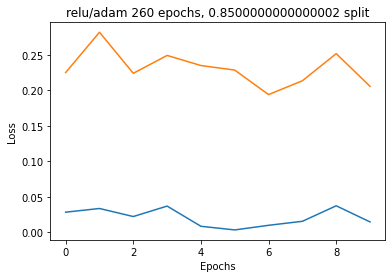

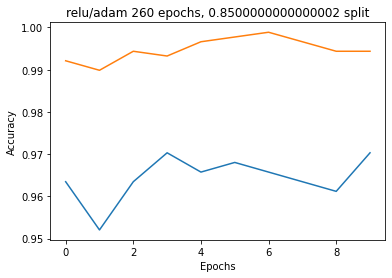

8/8 [==============================] - 0s 4ms/step - loss: 0.3255 - sparse_categorical_accuracy: 0.9359
Generation 2: 
Test Data:[0.3254995048046112, 0.9358974099159241], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.3255 - sparse_categorical_accuracy: 0.9359


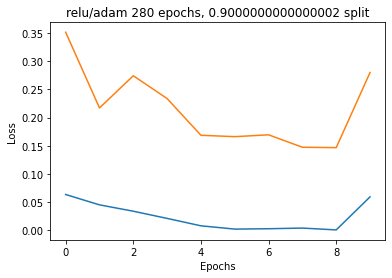

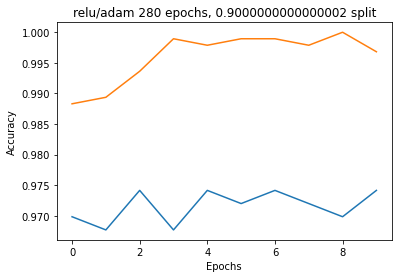

5/5 [==============================] - 0s 5ms/step - loss: 0.4884 - sparse_categorical_accuracy: 0.8910
Generation 2: 
Test Data:[0.4883956015110016, 0.8910256624221802], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.4884 - sparse_categorical_accuracy: 0.8910


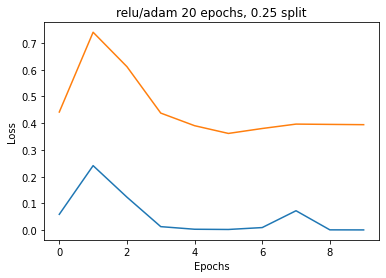

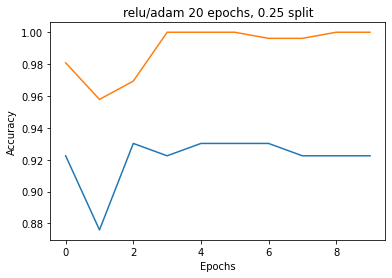

37/37 [==============================] - 0s 4ms/step - loss: 0.1715 - sparse_categorical_accuracy: 0.9718
Generation 3: 
Test Data:[0.17150086164474487, 0.971794843673706], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.1715 - sparse_categorical_accuracy: 0.9718


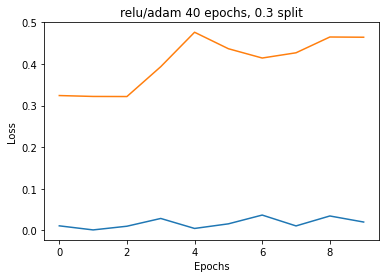

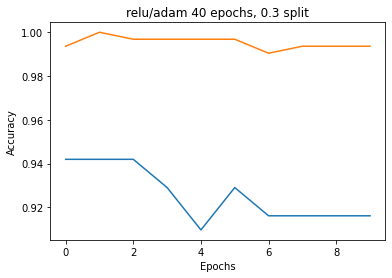

35/35 [==============================] - 0s 4ms/step - loss: 0.2853 - sparse_categorical_accuracy: 0.9652
Generation 3: 
Test Data:[0.28532788157463074, 0.9652014374732971], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.2853 - sparse_categorical_accuracy: 0.9652


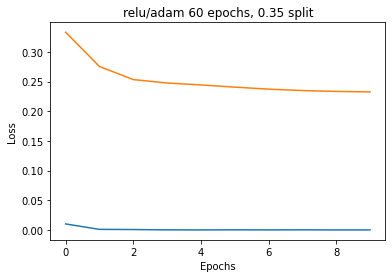

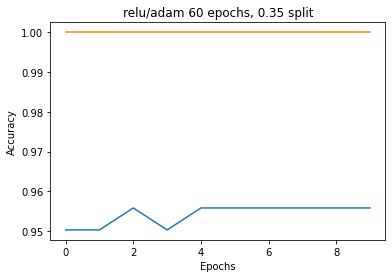

32/32 [==============================] - 0s 4ms/step - loss: 0.1390 - sparse_categorical_accuracy: 0.9684
Generation 3: 
Test Data:[0.13896992802619934, 0.9684418439865112], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1390 - sparse_categorical_accuracy: 0.9684


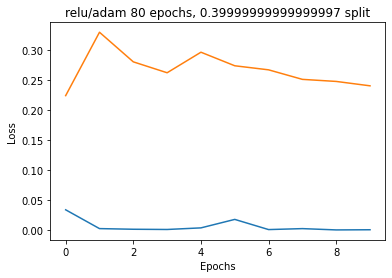

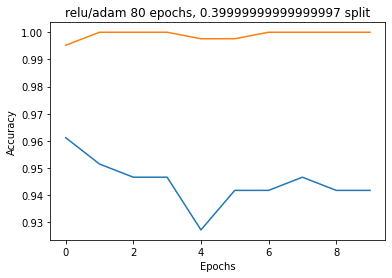

30/30 [==============================] - 0s 4ms/step - loss: 0.1440 - sparse_categorical_accuracy: 0.9690
Generation 3: 
Test Data:[0.14395777881145477, 0.9690170884132385], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.1440 - sparse_categorical_accuracy: 0.9690


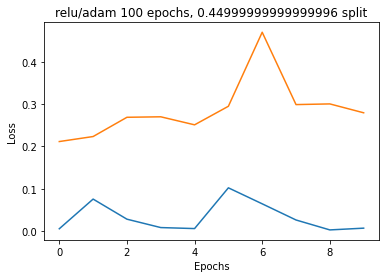

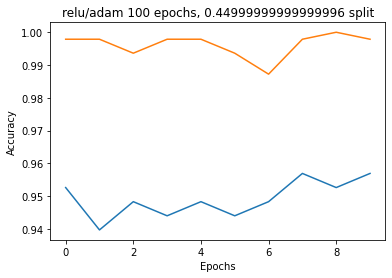

27/27 [==============================] - 0s 4ms/step - loss: 0.2127 - sparse_categorical_accuracy: 0.9639
Generation 3: 
Test Data:[0.21271798014640808, 0.9639115333557129], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.2127 - sparse_categorical_accuracy: 0.9639


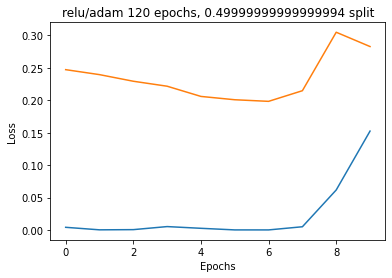

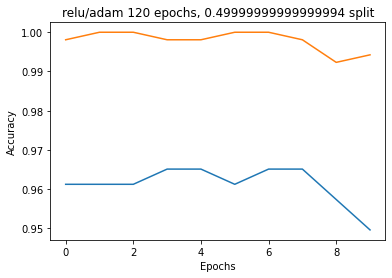

25/25 [==============================] - 0s 4ms/step - loss: 0.2464 - sparse_categorical_accuracy: 0.9488
Generation 3: 
Test Data:[0.24644017219543457, 0.9487836360931396], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.2464 - sparse_categorical_accuracy: 0.9488


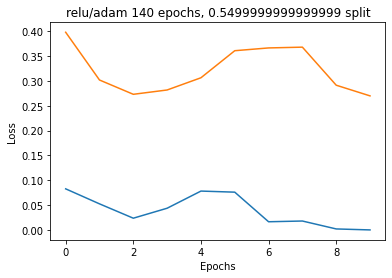

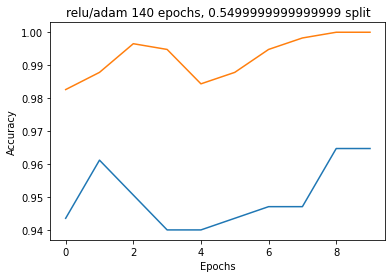

22/22 [==============================] - 0s 4ms/step - loss: 0.2657 - sparse_categorical_accuracy: 0.9630
Generation 3: 
Test Data:[0.2657127380371094, 0.9630156755447388], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.2657 - sparse_categorical_accuracy: 0.9630


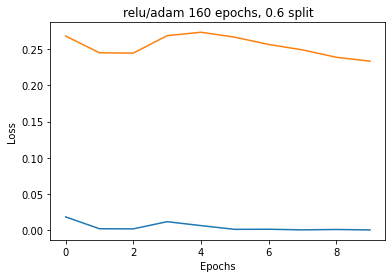

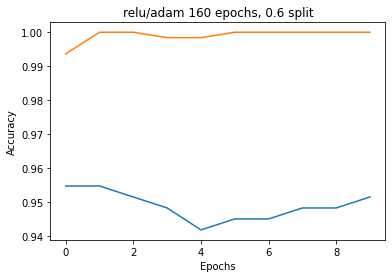

20/20 [==============================] - 0s 4ms/step - loss: 0.2254 - sparse_categorical_accuracy: 0.9631
Generation 3: 
Test Data:[0.22543542087078094, 0.9631410241127014], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.2254 - sparse_categorical_accuracy: 0.9631


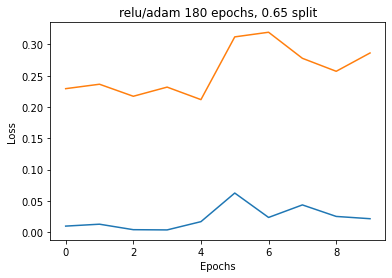

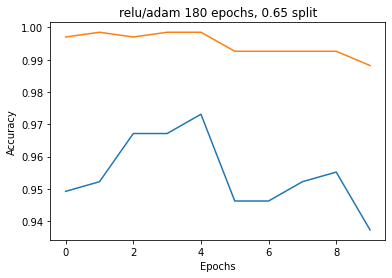

18/18 [==============================] - 0s 4ms/step - loss: 0.2785 - sparse_categorical_accuracy: 0.9359
Generation 3: 
Test Data:[0.2784993648529053, 0.9358974099159241], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.2785 - sparse_categorical_accuracy: 0.9359


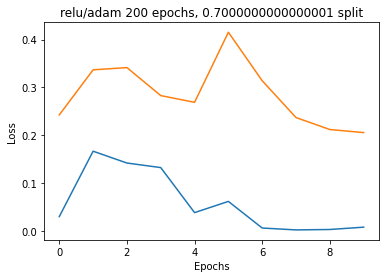

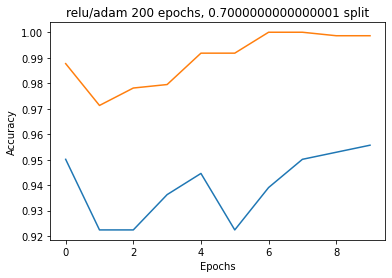

15/15 [==============================] - 0s 4ms/step - loss: 0.2470 - sparse_categorical_accuracy: 0.9466
Generation 3: 
Test Data:[0.24699309468269348, 0.9465811848640442], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.2470 - sparse_categorical_accuracy: 0.9466


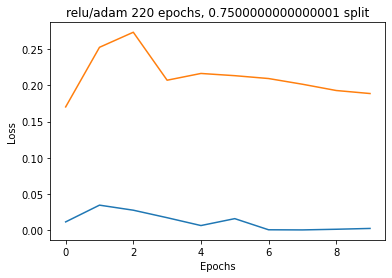

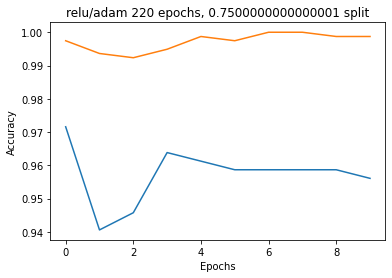

13/13 [==============================] - 0s 4ms/step - loss: 0.2537 - sparse_categorical_accuracy: 0.9410
Generation 3: 
Test Data:[0.25374478101730347, 0.9410256147384644], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.2537 - sparse_categorical_accuracy: 0.9410


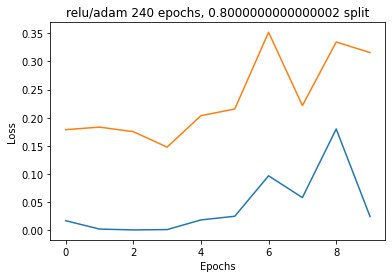

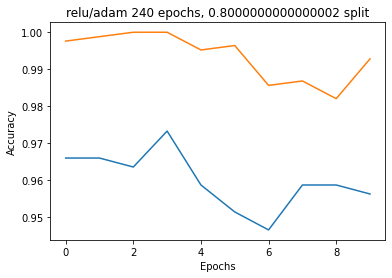

10/10 [==============================] - 0s 4ms/step - loss: 0.4041 - sparse_categorical_accuracy: 0.9199
Generation 3: 
Test Data:[0.40407148003578186, 0.9198718070983887], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.4041 - sparse_categorical_accuracy: 0.9199


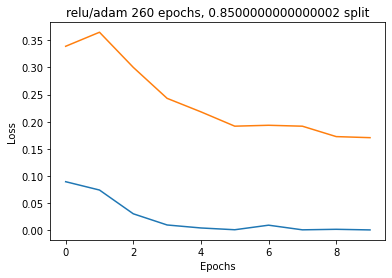

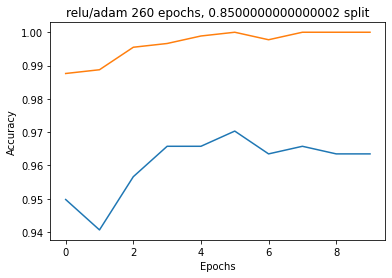

8/8 [==============================] - 0s 4ms/step - loss: 0.2378 - sparse_categorical_accuracy: 0.9444
Generation 3: 
Test Data:[0.23784931004047394, 0.9444444179534912], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2378 - sparse_categorical_accuracy: 0.9444


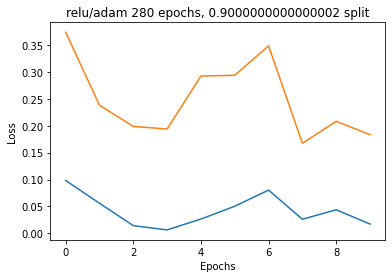

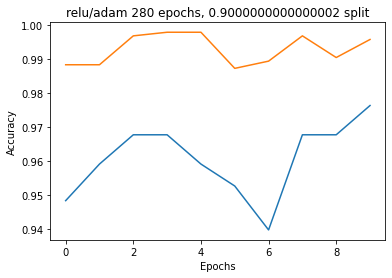

5/5 [==============================] - 0s 5ms/step - loss: 0.3738 - sparse_categorical_accuracy: 0.9167
Generation 3: 
Test Data:[0.3737856149673462, 0.9166666865348816], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.3738 - sparse_categorical_accuracy: 0.9167


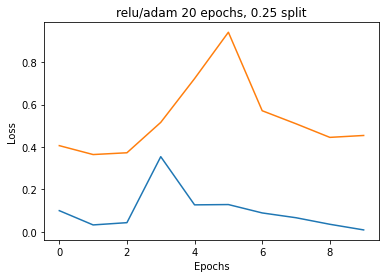

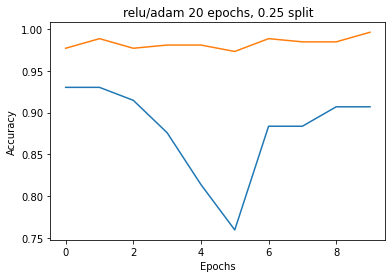

37/37 [==============================] - 0s 4ms/step - loss: 0.1699 - sparse_categorical_accuracy: 0.9658
Generation 4: 
Test Data:[0.16993051767349243, 0.9658119678497314], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.1699 - sparse_categorical_accuracy: 0.9658


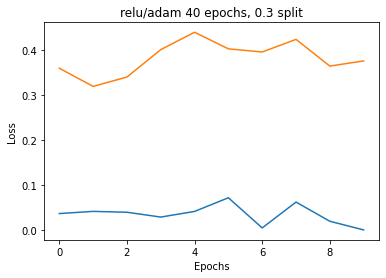

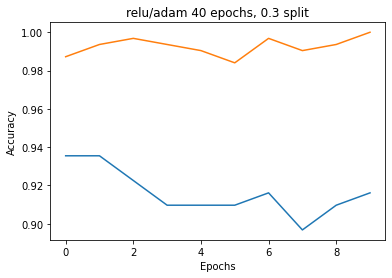

35/35 [==============================] - 0s 4ms/step - loss: 0.1451 - sparse_categorical_accuracy: 0.9716
Generation 4: 
Test Data:[0.14513520896434784, 0.971611738204956], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.1451 - sparse_categorical_accuracy: 0.9716


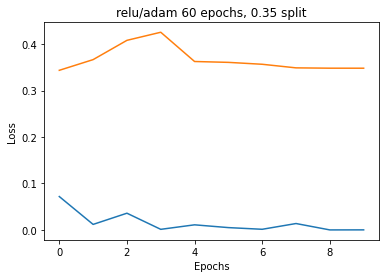

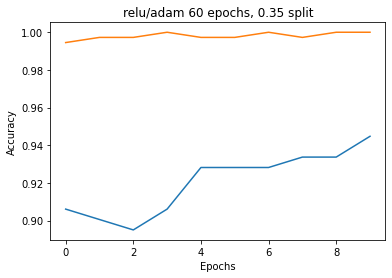

32/32 [==============================] - 0s 4ms/step - loss: 0.1545 - sparse_categorical_accuracy: 0.9665
Generation 4: 
Test Data:[0.15445299446582794, 0.966469407081604], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1545 - sparse_categorical_accuracy: 0.9665


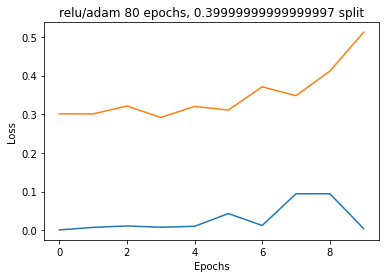

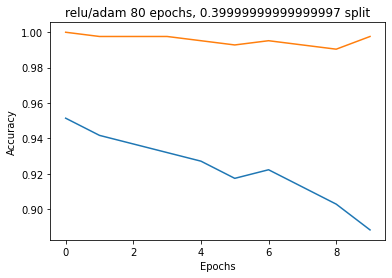

30/30 [==============================] - 0s 4ms/step - loss: 0.3799 - sparse_categorical_accuracy: 0.9466
Generation 4: 
Test Data:[0.37991344928741455, 0.9465811848640442], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.3799 - sparse_categorical_accuracy: 0.9466


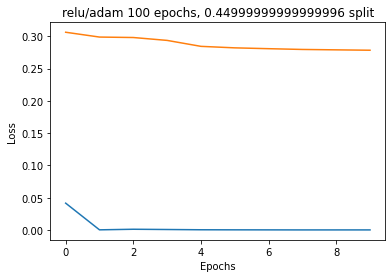

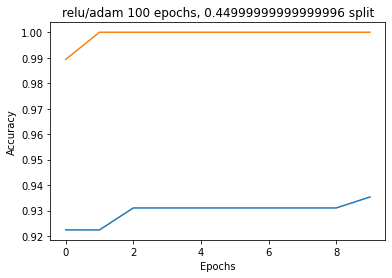

27/27 [==============================] - 0s 4ms/step - loss: 0.1893 - sparse_categorical_accuracy: 0.9604
Generation 4: 
Test Data:[0.18927766382694244, 0.9604191184043884], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.1893 - sparse_categorical_accuracy: 0.9604


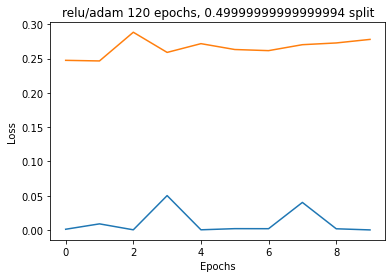

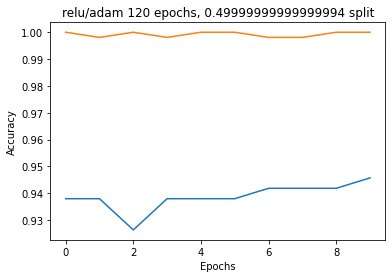

25/25 [==============================] - 0s 4ms/step - loss: 0.2306 - sparse_categorical_accuracy: 0.9552
Generation 4: 
Test Data:[0.23055057227611542, 0.9551856517791748], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.2306 - sparse_categorical_accuracy: 0.9552


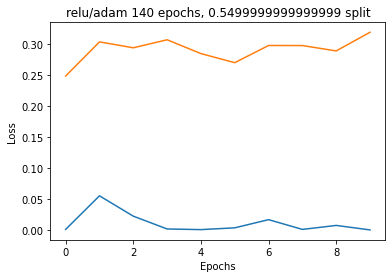

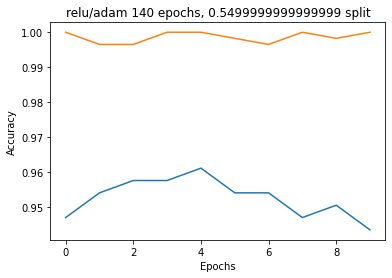

22/22 [==============================] - 0s 4ms/step - loss: 0.2873 - sparse_categorical_accuracy: 0.9459
Generation 4: 
Test Data:[0.2873454988002777, 0.9459459185600281], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.2873 - sparse_categorical_accuracy: 0.9459


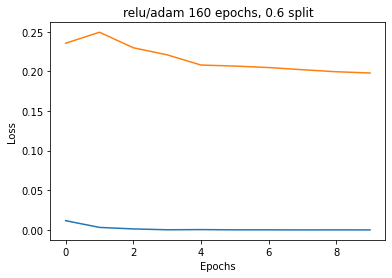

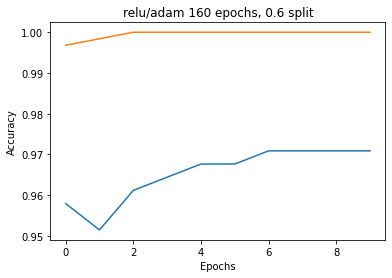

20/20 [==============================] - 0s 4ms/step - loss: 0.2093 - sparse_categorical_accuracy: 0.9583
Generation 4: 
Test Data:[0.20934469997882843, 0.9583333134651184], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.2093 - sparse_categorical_accuracy: 0.9583


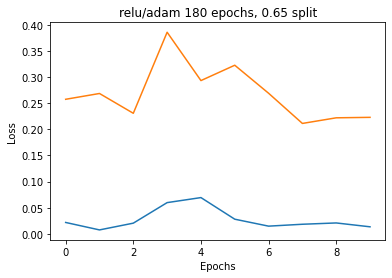

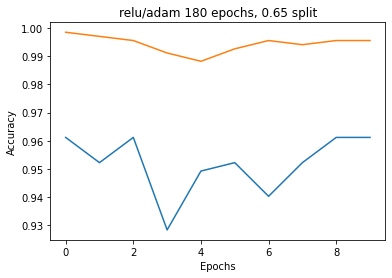

18/18 [==============================] - 0s 5ms/step - loss: 0.2174 - sparse_categorical_accuracy: 0.9597
Generation 4: 
Test Data:[0.21735046803951263, 0.9597069621086121], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 5ms/step - loss: 0.2174 - sparse_categorical_accuracy: 0.9597


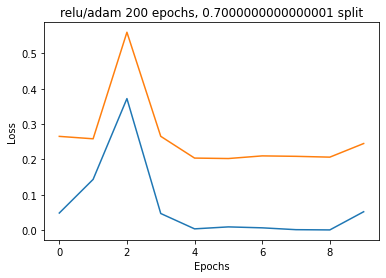

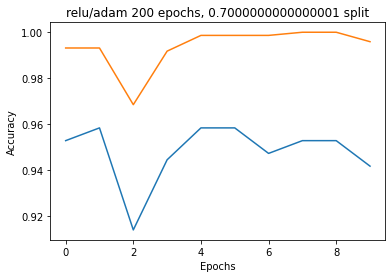

15/15 [==============================] - 0s 4ms/step - loss: 0.2521 - sparse_categorical_accuracy: 0.9380
Generation 4: 
Test Data:[0.25213754177093506, 0.938034176826477], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.2521 - sparse_categorical_accuracy: 0.9380


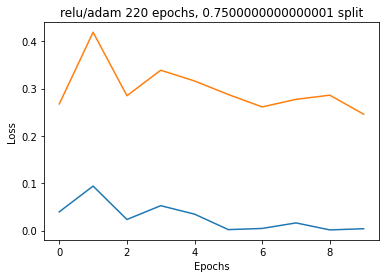

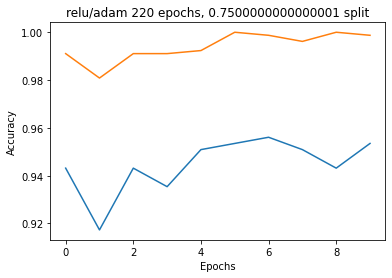

13/13 [==============================] - 0s 4ms/step - loss: 0.2232 - sparse_categorical_accuracy: 0.9538
Generation 4: 
Test Data:[0.2232489138841629, 0.9538461565971375], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.2232 - sparse_categorical_accuracy: 0.9538


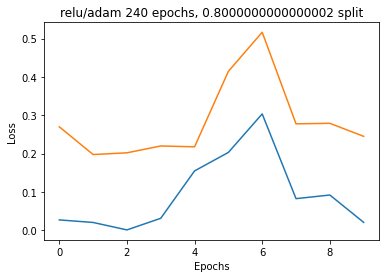

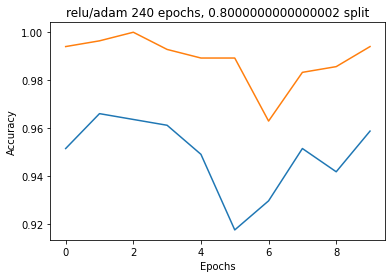

10/10 [==============================] - 0s 4ms/step - loss: 0.3162 - sparse_categorical_accuracy: 0.9295
Generation 4: 
Test Data:[0.31624144315719604, 0.9294871687889099], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.3162 - sparse_categorical_accuracy: 0.9295


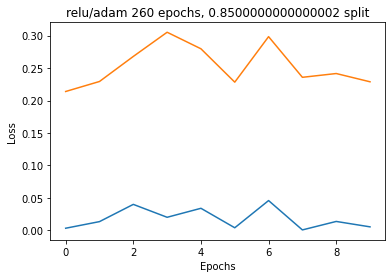

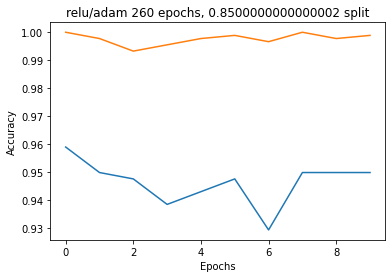

8/8 [==============================] - 0s 4ms/step - loss: 0.2953 - sparse_categorical_accuracy: 0.9103
Generation 4: 
Test Data:[0.29525381326675415, 0.9102563858032227], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 5ms/step - loss: 0.2953 - sparse_categorical_accuracy: 0.9103


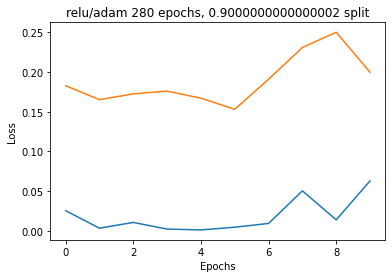

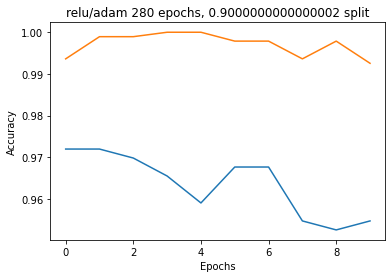

5/5 [==============================] - 0s 5ms/step - loss: 0.3542 - sparse_categorical_accuracy: 0.9038
Generation 4: 
Test Data:[0.354195237159729, 0.9038461446762085], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 5ms/step - loss: 0.3542 - sparse_categorical_accuracy: 0.9038


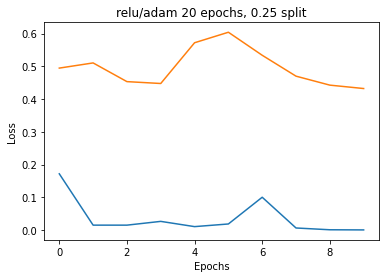

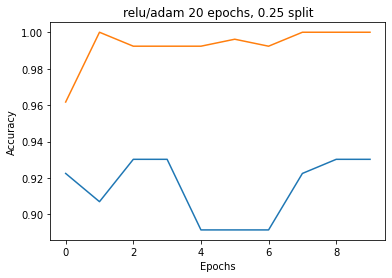

37/37 [==============================] - 0s 4ms/step - loss: 0.0994 - sparse_categorical_accuracy: 0.9795
Generation 5: 
Test Data:[0.09940322488546371, 0.9794871807098389], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.0994 - sparse_categorical_accuracy: 0.9795


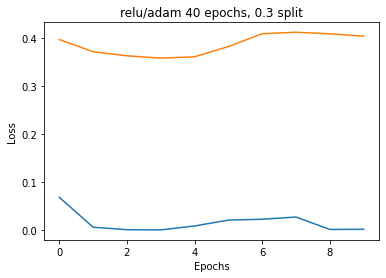

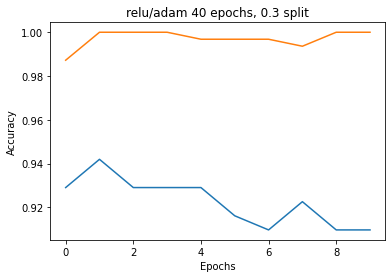

35/35 [==============================] - 0s 4ms/step - loss: 0.1247 - sparse_categorical_accuracy: 0.9734
Generation 5: 
Test Data:[0.12472275644540787, 0.9734432101249695], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.1247 - sparse_categorical_accuracy: 0.9734


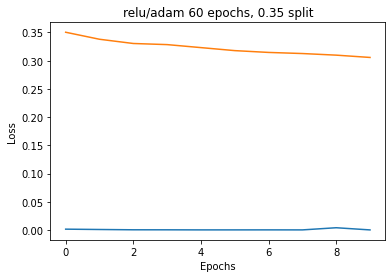

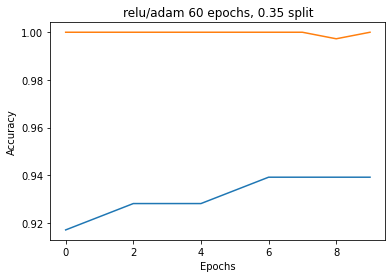

32/32 [==============================] - 0s 4ms/step - loss: 0.1084 - sparse_categorical_accuracy: 0.9734
Generation 5: 
Test Data:[0.10838767886161804, 0.973372757434845], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1084 - sparse_categorical_accuracy: 0.9734


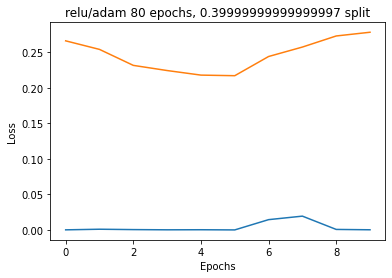

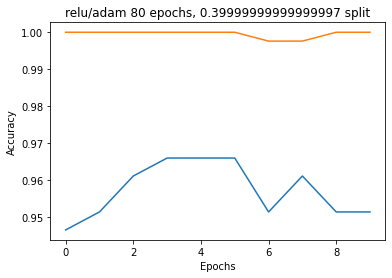

30/30 [==============================] - 0s 4ms/step - loss: 0.0954 - sparse_categorical_accuracy: 0.9818
Generation 5: 
Test Data:[0.09544691443443298, 0.9818376302719116], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.0954 - sparse_categorical_accuracy: 0.9818


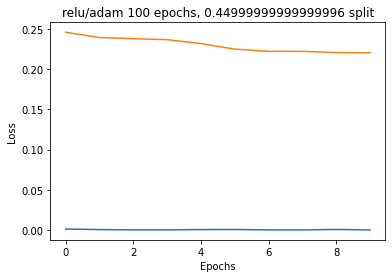

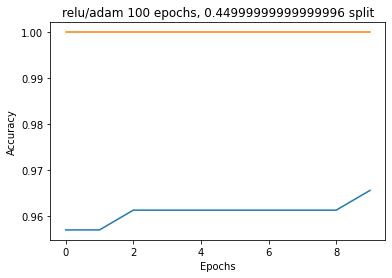

27/27 [==============================] - 0s 5ms/step - loss: 0.0881 - sparse_categorical_accuracy: 0.9790
Generation 5: 
Test Data:[0.08808881044387817, 0.9790453910827637], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.0881 - sparse_categorical_accuracy: 0.9790


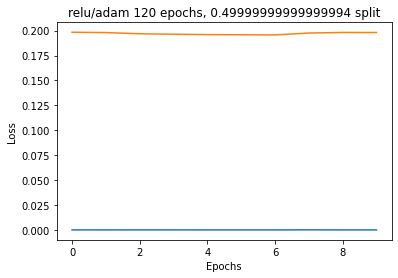

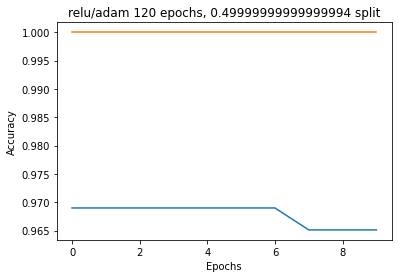

25/25 [==============================] - 0s 4ms/step - loss: 0.0944 - sparse_categorical_accuracy: 0.9770
Generation 5: 
Test Data:[0.0944039523601532, 0.9769526124000549], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.0944 - sparse_categorical_accuracy: 0.9770


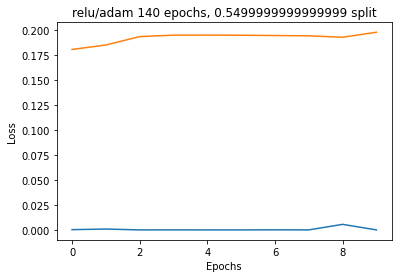

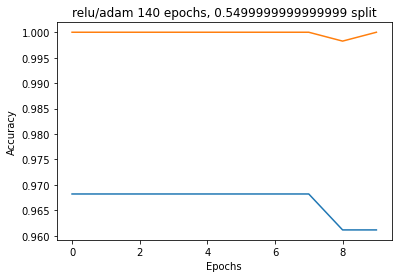

22/22 [==============================] - 0s 4ms/step - loss: 0.0950 - sparse_categorical_accuracy: 0.9758
Generation 5: 
Test Data:[0.09502141922712326, 0.9758179187774658], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.0950 - sparse_categorical_accuracy: 0.9758


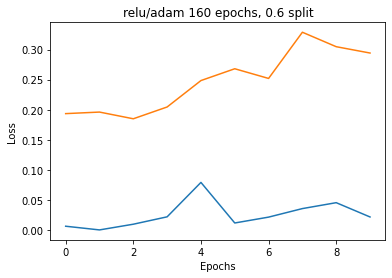

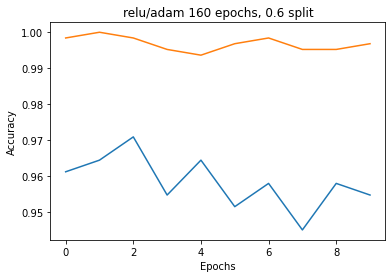

20/20 [==============================] - 0s 4ms/step - loss: 0.1934 - sparse_categorical_accuracy: 0.9712
Generation 5: 
Test Data:[0.1933695524930954, 0.9711538553237915], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.1934 - sparse_categorical_accuracy: 0.9712


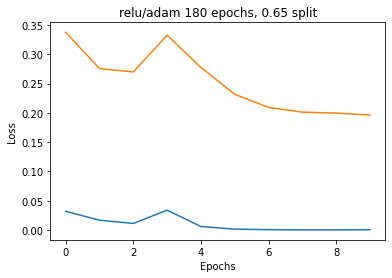

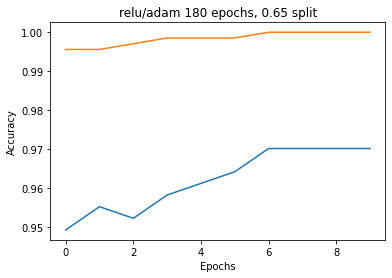

18/18 [==============================] - 0s 4ms/step - loss: 0.1647 - sparse_categorical_accuracy: 0.9725
Generation 5: 
Test Data:[0.1647012084722519, 0.9725274443626404], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.1647 - sparse_categorical_accuracy: 0.9725


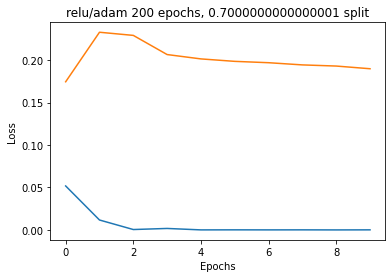

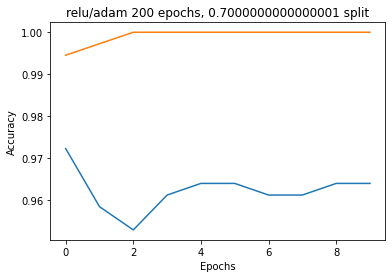

15/15 [==============================] - 0s 4ms/step - loss: 0.1874 - sparse_categorical_accuracy: 0.9679
Generation 5: 
Test Data:[0.18736228346824646, 0.9679487347602844], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.1874 - sparse_categorical_accuracy: 0.9679


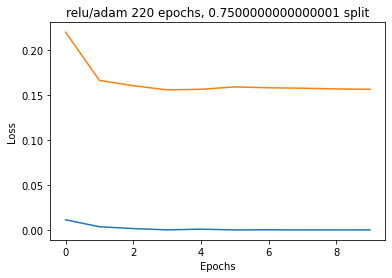

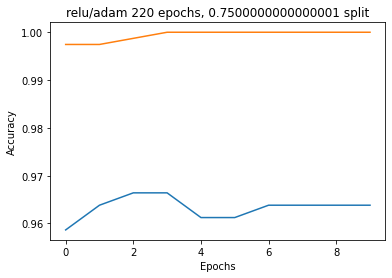

13/13 [==============================] - 0s 5ms/step - loss: 0.1844 - sparse_categorical_accuracy: 0.9615
Generation 5: 
Test Data:[0.18437114357948303, 0.9615384340286255], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.1844 - sparse_categorical_accuracy: 0.9615


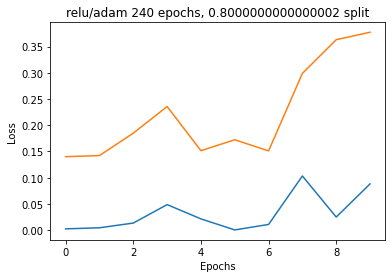

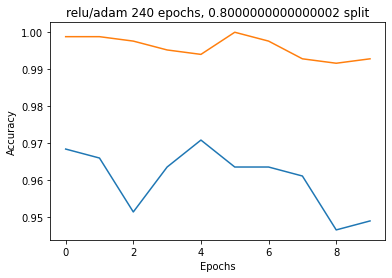

10/10 [==============================] - 0s 4ms/step - loss: 0.4305 - sparse_categorical_accuracy: 0.9327
Generation 5: 
Test Data:[0.4304640293121338, 0.932692289352417], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.4305 - sparse_categorical_accuracy: 0.9327


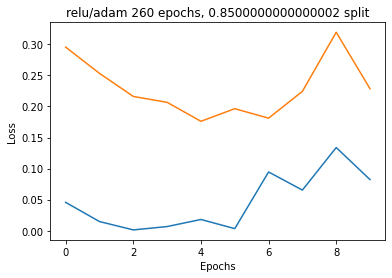

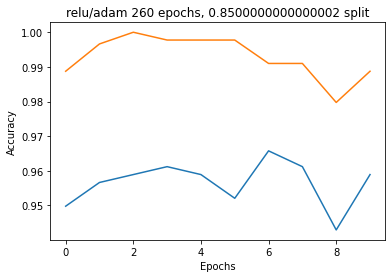

8/8 [==============================] - 0s 4ms/step - loss: 0.3711 - sparse_categorical_accuracy: 0.9145
Generation 5: 
Test Data:[0.37109339237213135, 0.9145299196243286], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.3711 - sparse_categorical_accuracy: 0.9145


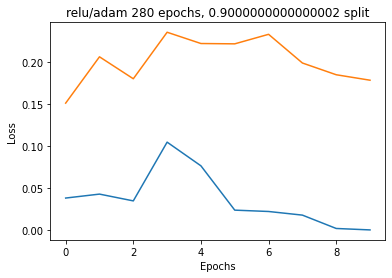

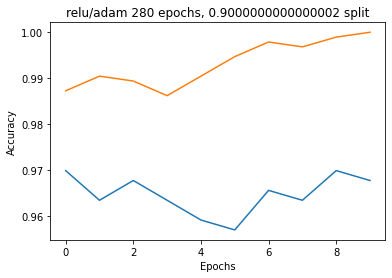

5/5 [==============================] - 0s 5ms/step - loss: 0.3762 - sparse_categorical_accuracy: 0.9231
Generation 5: 
Test Data:[0.376168429851532, 0.9230769276618958], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.3762 - sparse_categorical_accuracy: 0.9231


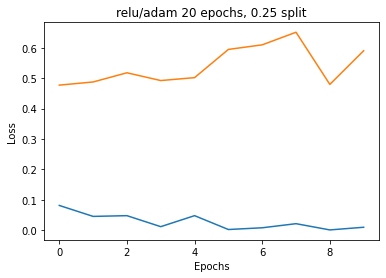

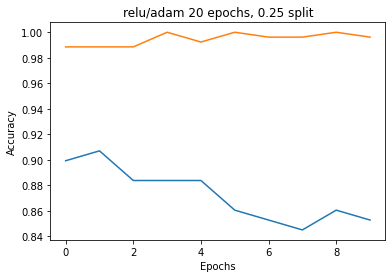

37/37 [==============================] - 0s 4ms/step - loss: 0.1703 - sparse_categorical_accuracy: 0.9650
Generation 6: 
Test Data:[0.1703277975320816, 0.9649572372436523], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.1703 - sparse_categorical_accuracy: 0.9650


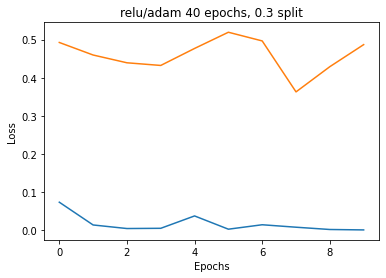

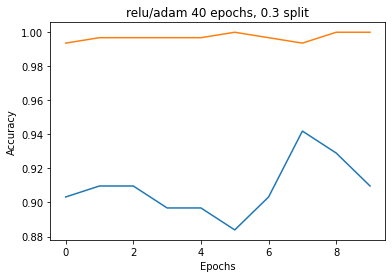

35/35 [==============================] - 0s 4ms/step - loss: 0.1451 - sparse_categorical_accuracy: 0.9753
Generation 6: 
Test Data:[0.14509563148021698, 0.9752747416496277], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.1451 - sparse_categorical_accuracy: 0.9753


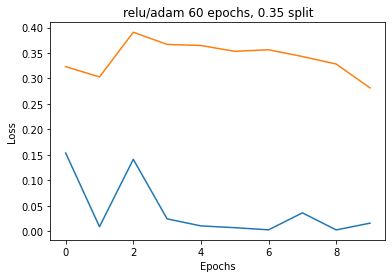

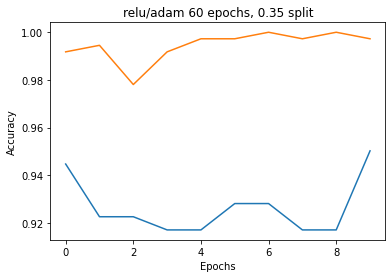

32/32 [==============================] - 0s 4ms/step - loss: 0.1248 - sparse_categorical_accuracy: 0.9773
Generation 6: 
Test Data:[0.1248449757695198, 0.9773175716400146], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1248 - sparse_categorical_accuracy: 0.9773


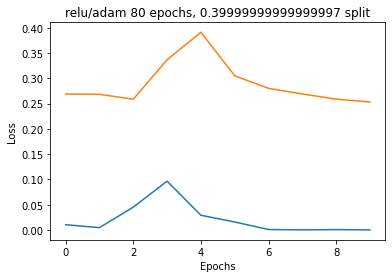

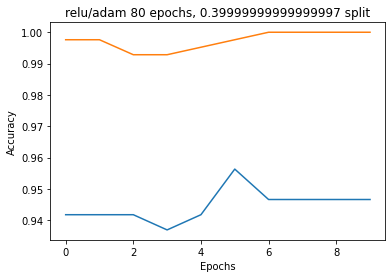

30/30 [==============================] - 0s 4ms/step - loss: 0.1325 - sparse_categorical_accuracy: 0.9712
Generation 6: 
Test Data:[0.1324545443058014, 0.9711538553237915], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.1325 - sparse_categorical_accuracy: 0.9712


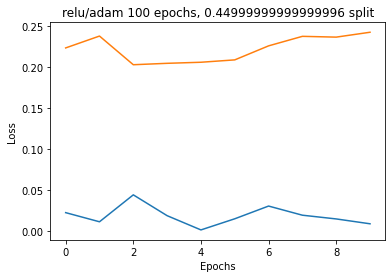

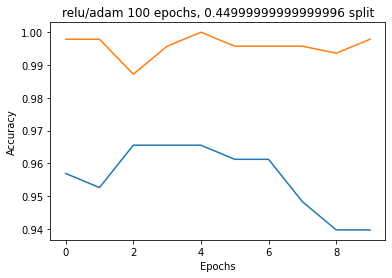

27/27 [==============================] - 0s 4ms/step - loss: 0.1428 - sparse_categorical_accuracy: 0.9662
Generation 6: 
Test Data:[0.14283651113510132, 0.9662398099899292], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.1428 - sparse_categorical_accuracy: 0.9662


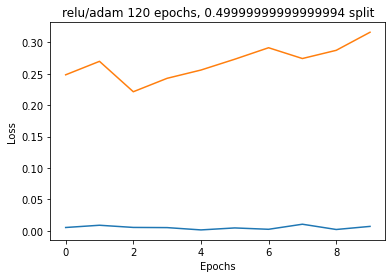

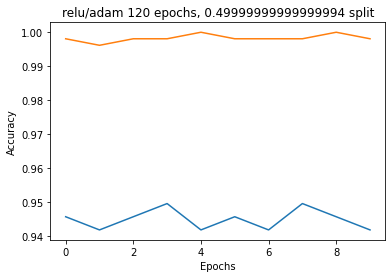

25/25 [==============================] - 0s 4ms/step - loss: 0.1540 - sparse_categorical_accuracy: 0.9654
Generation 6: 
Test Data:[0.15395665168762207, 0.9654289484024048], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.1540 - sparse_categorical_accuracy: 0.9654


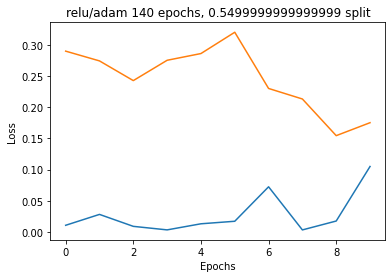

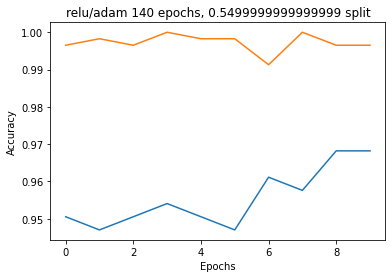

22/22 [==============================] - 0s 4ms/step - loss: 0.1464 - sparse_categorical_accuracy: 0.9701
Generation 6: 
Test Data:[0.146409809589386, 0.9701279997825623], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.1464 - sparse_categorical_accuracy: 0.9701


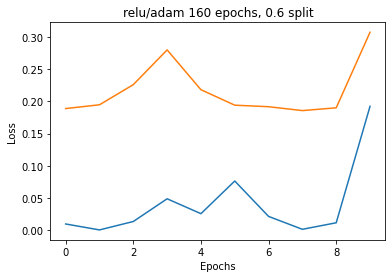

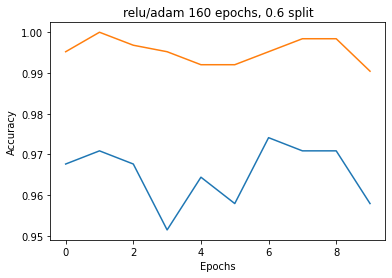

20/20 [==============================] - 0s 5ms/step - loss: 0.1942 - sparse_categorical_accuracy: 0.9663
Generation 6: 
Test Data:[0.19420978426933289, 0.9663461446762085], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.1942 - sparse_categorical_accuracy: 0.9663


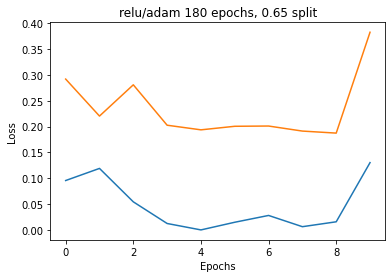

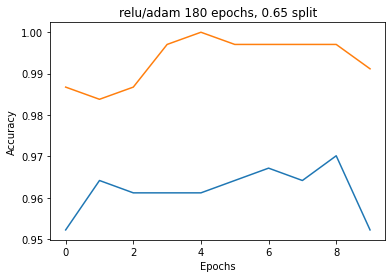

18/18 [==============================] - 0s 4ms/step - loss: 0.3195 - sparse_categorical_accuracy: 0.9432
Generation 6: 
Test Data:[0.3195001482963562, 0.9432234168052673], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 5ms/step - loss: 0.3195 - sparse_categorical_accuracy: 0.9432


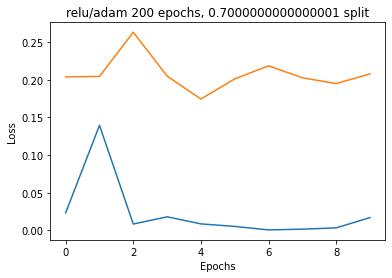

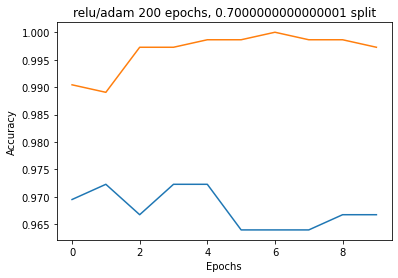

15/15 [==============================] - 0s 5ms/step - loss: 0.2570 - sparse_categorical_accuracy: 0.9423
Generation 6: 
Test Data:[0.25704947113990784, 0.942307710647583], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.2570 - sparse_categorical_accuracy: 0.9423


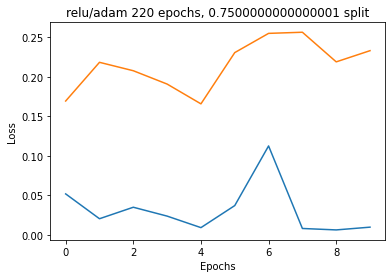

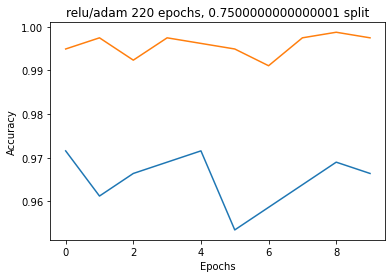

13/13 [==============================] - 0s 4ms/step - loss: 0.2584 - sparse_categorical_accuracy: 0.9462
Generation 6: 
Test Data:[0.2584381103515625, 0.9461538195610046], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.2584 - sparse_categorical_accuracy: 0.9462


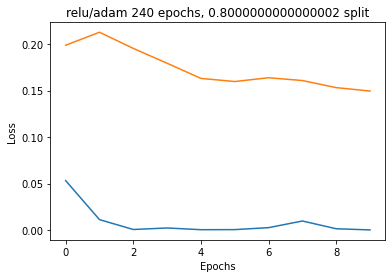

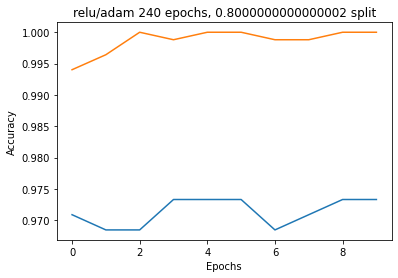

10/10 [==============================] - 0s 4ms/step - loss: 0.2467 - sparse_categorical_accuracy: 0.9423
Generation 6: 
Test Data:[0.24665218591690063, 0.942307710647583], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.2467 - sparse_categorical_accuracy: 0.9423


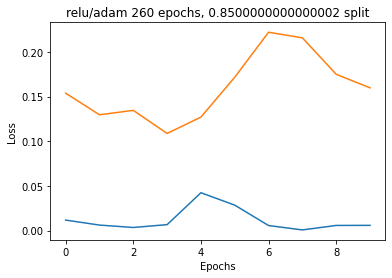

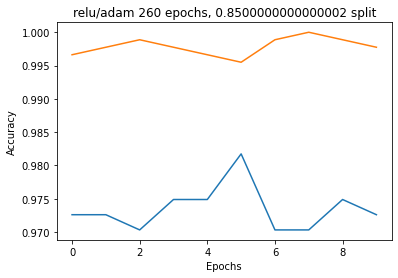

8/8 [==============================] - 0s 5ms/step - loss: 0.2875 - sparse_categorical_accuracy: 0.9487
Generation 6: 
Test Data:[0.2875049114227295, 0.9487179517745972], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2875 - sparse_categorical_accuracy: 0.9487


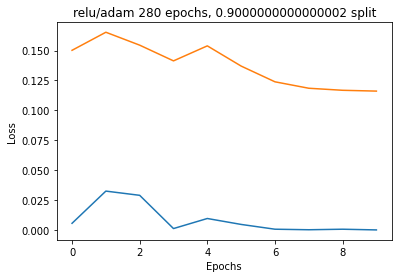

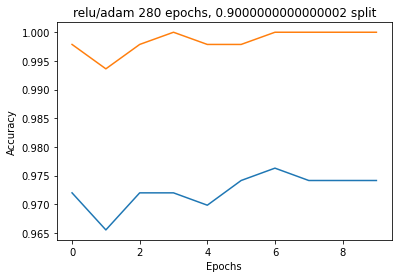

5/5 [==============================] - 0s 4ms/step - loss: 0.3646 - sparse_categorical_accuracy: 0.9295
Generation 6: 
Test Data:[0.36460423469543457, 0.9294871687889099], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 5ms/step - loss: 0.3646 - sparse_categorical_accuracy: 0.9295


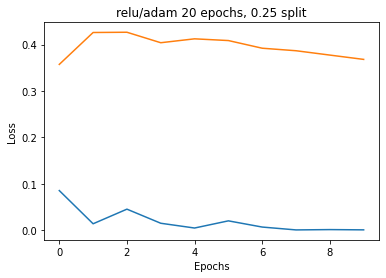

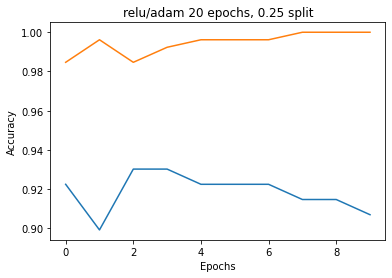

37/37 [==============================] - 0s 4ms/step - loss: 0.0950 - sparse_categorical_accuracy: 0.9829
Generation 7: 
Test Data:[0.09503594785928726, 0.9829059839248657], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.0950 - sparse_categorical_accuracy: 0.9829


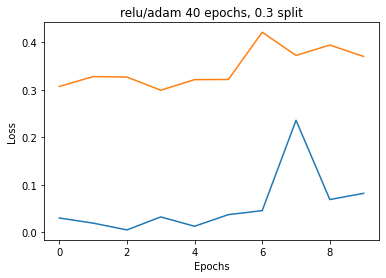

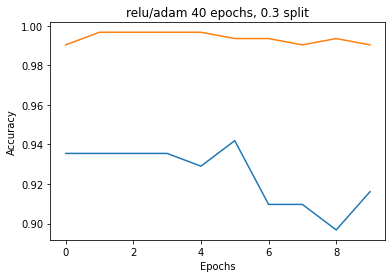

35/35 [==============================] - 0s 4ms/step - loss: 0.2056 - sparse_categorical_accuracy: 0.9689
Generation 7: 
Test Data:[0.2056049257516861, 0.9688644409179688], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.2056 - sparse_categorical_accuracy: 0.9689


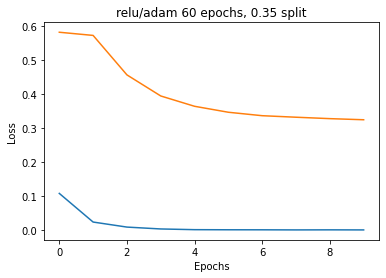

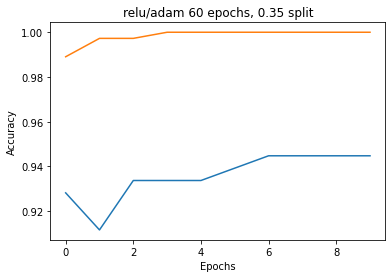

32/32 [==============================] - 0s 4ms/step - loss: 0.1481 - sparse_categorical_accuracy: 0.9783
Generation 7: 
Test Data:[0.14808398485183716, 0.9783037304878235], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1481 - sparse_categorical_accuracy: 0.9783


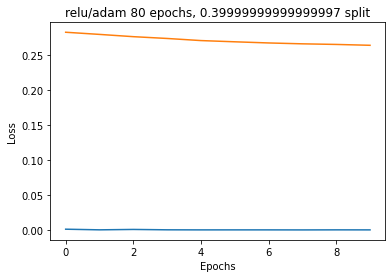

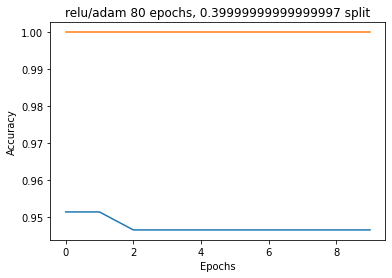

30/30 [==============================] - 0s 5ms/step - loss: 0.1318 - sparse_categorical_accuracy: 0.9840
Generation 7: 
Test Data:[0.13181447982788086, 0.9839743375778198], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.1318 - sparse_categorical_accuracy: 0.9840


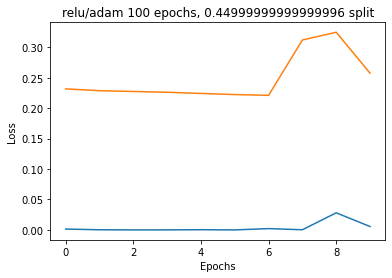

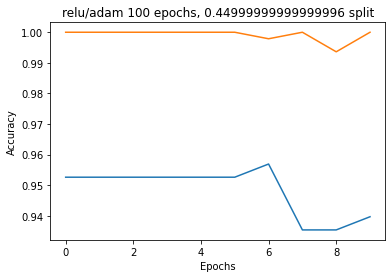

27/27 [==============================] - 0s 4ms/step - loss: 0.1351 - sparse_categorical_accuracy: 0.9779
Generation 7: 
Test Data:[0.1350521743297577, 0.9778812527656555], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.1351 - sparse_categorical_accuracy: 0.9779


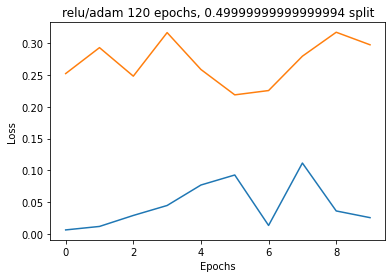

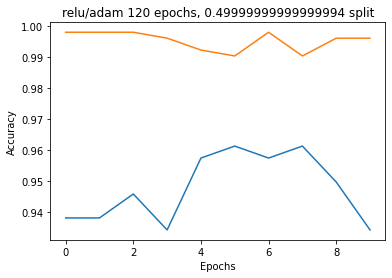

25/25 [==============================] - 0s 4ms/step - loss: 0.2369 - sparse_categorical_accuracy: 0.9616
Generation 7: 
Test Data:[0.2368936985731125, 0.9615877270698547], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 5ms/step - loss: 0.2369 - sparse_categorical_accuracy: 0.9616


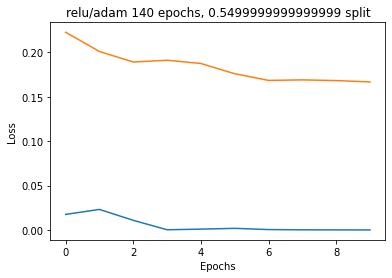

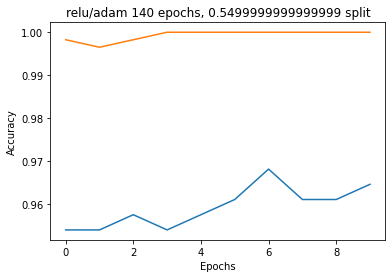

22/22 [==============================] - 0s 4ms/step - loss: 0.1191 - sparse_categorical_accuracy: 0.9758
Generation 7: 
Test Data:[0.11906811594963074, 0.9758179187774658], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 5ms/step - loss: 0.1191 - sparse_categorical_accuracy: 0.9758


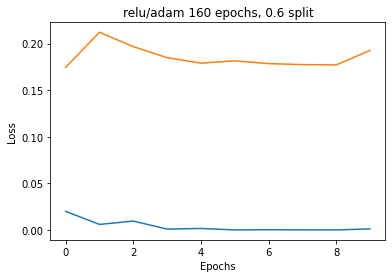

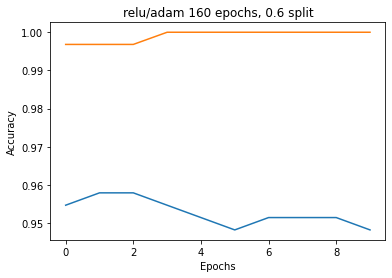

20/20 [==============================] - 0s 4ms/step - loss: 0.1544 - sparse_categorical_accuracy: 0.9696
Generation 7: 
Test Data:[0.15437136590480804, 0.9695512652397156], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.1544 - sparse_categorical_accuracy: 0.9696


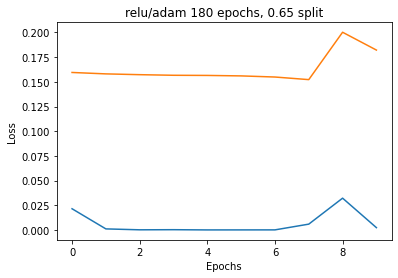

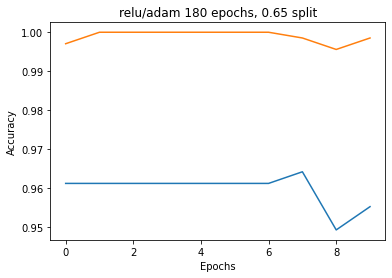

18/18 [==============================] - 0s 4ms/step - loss: 0.1701 - sparse_categorical_accuracy: 0.9707
Generation 7: 
Test Data:[0.17013192176818848, 0.970695972442627], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 5ms/step - loss: 0.1701 - sparse_categorical_accuracy: 0.9707


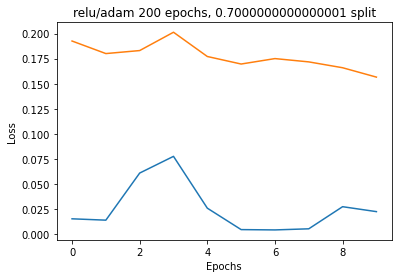

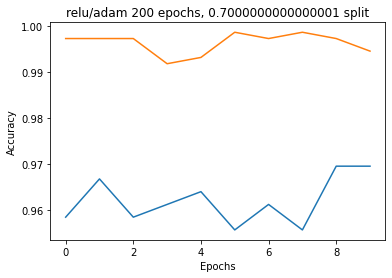

15/15 [==============================] - 0s 5ms/step - loss: 0.1542 - sparse_categorical_accuracy: 0.9658
Generation 7: 
Test Data:[0.1541866958141327, 0.9658119678497314], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.1542 - sparse_categorical_accuracy: 0.9658


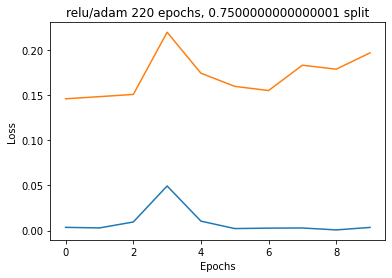

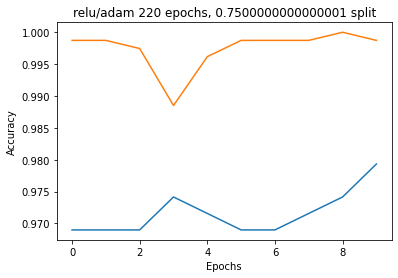

13/13 [==============================] - 0s 4ms/step - loss: 0.1564 - sparse_categorical_accuracy: 0.9692
Generation 7: 
Test Data:[0.15638259053230286, 0.9692307710647583], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.1564 - sparse_categorical_accuracy: 0.9692


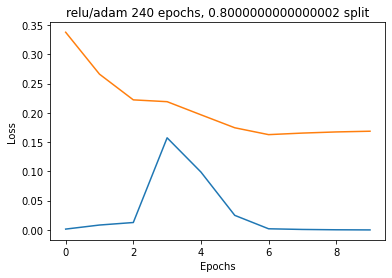

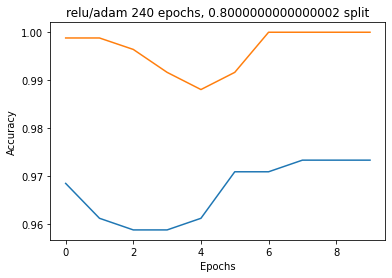

10/10 [==============================] - 0s 5ms/step - loss: 0.2437 - sparse_categorical_accuracy: 0.9519
Generation 7: 
Test Data:[0.24371646344661713, 0.9519230723381042], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.2437 - sparse_categorical_accuracy: 0.9519


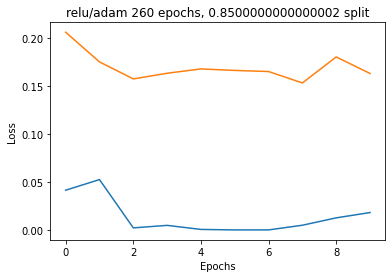

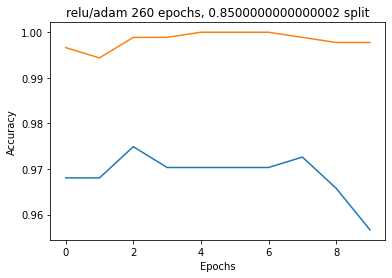

8/8 [==============================] - 0s 5ms/step - loss: 0.2659 - sparse_categorical_accuracy: 0.9402
Generation 7: 
Test Data:[0.2658960521221161, 0.94017094373703], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 5ms/step - loss: 0.2659 - sparse_categorical_accuracy: 0.9402


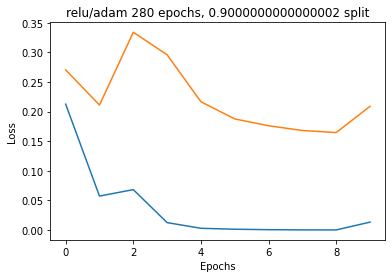

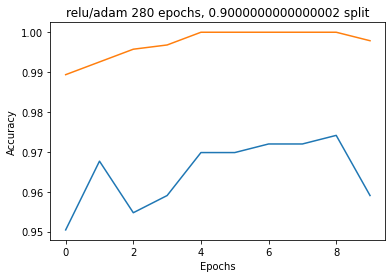

5/5 [==============================] - 0s 5ms/step - loss: 0.3623 - sparse_categorical_accuracy: 0.9231
Generation 7: 
Test Data:[0.3622701168060303, 0.9230769276618958], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 5ms/step - loss: 0.3623 - sparse_categorical_accuracy: 0.9231


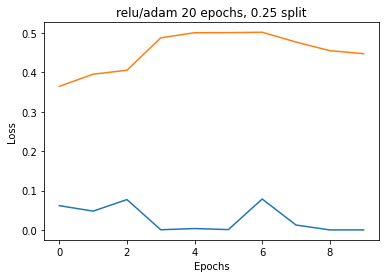

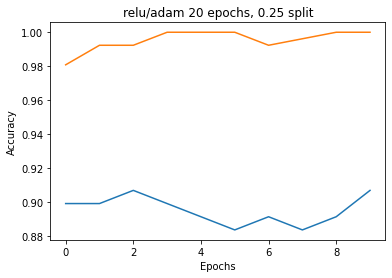

37/37 [==============================] - 0s 4ms/step - loss: 0.1275 - sparse_categorical_accuracy: 0.9803
Generation 8: 
Test Data:[0.12754885852336884, 0.9803418517112732], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.1275 - sparse_categorical_accuracy: 0.9803


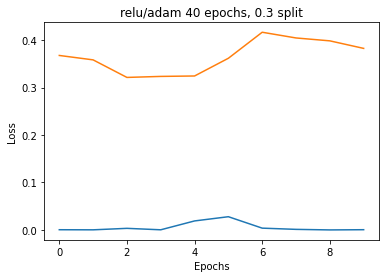

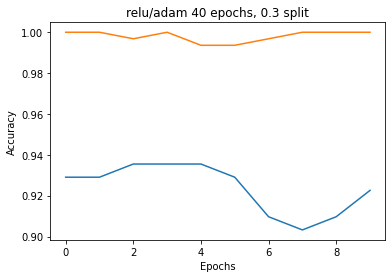

35/35 [==============================] - 0s 4ms/step - loss: 0.1271 - sparse_categorical_accuracy: 0.9707
Generation 8: 
Test Data:[0.12713897228240967, 0.970695972442627], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.1271 - sparse_categorical_accuracy: 0.9707


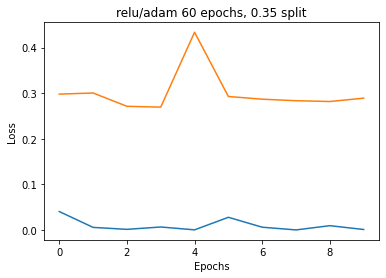

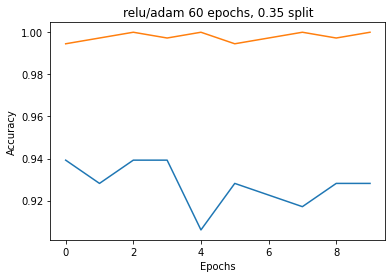

32/32 [==============================] - 0s 4ms/step - loss: 0.1411 - sparse_categorical_accuracy: 0.9665
Generation 8: 
Test Data:[0.1410960555076599, 0.966469407081604], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1411 - sparse_categorical_accuracy: 0.9665


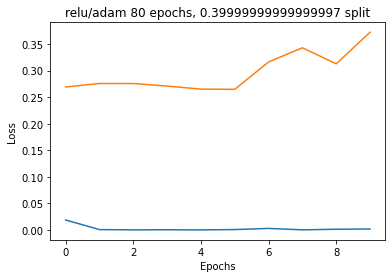

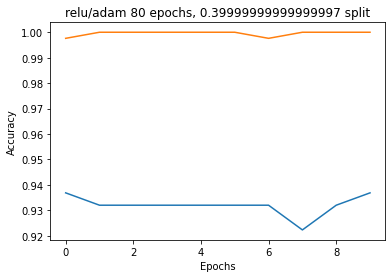

30/30 [==============================] - 0s 4ms/step - loss: 0.1343 - sparse_categorical_accuracy: 0.9744
Generation 8: 
Test Data:[0.13434457778930664, 0.9743589758872986], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.1343 - sparse_categorical_accuracy: 0.9744


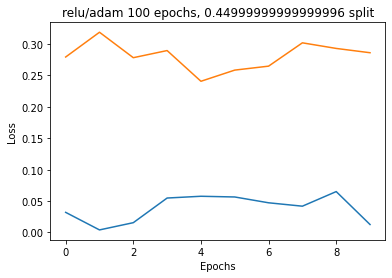

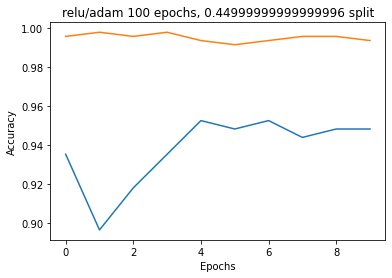

27/27 [==============================] - 0s 4ms/step - loss: 0.1926 - sparse_categorical_accuracy: 0.9674
Generation 8: 
Test Data:[0.19258132576942444, 0.9674039483070374], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.1926 - sparse_categorical_accuracy: 0.9674


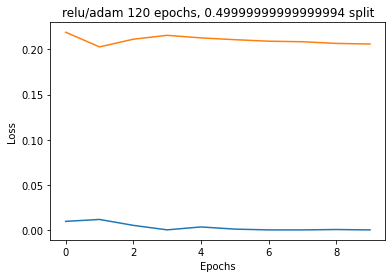

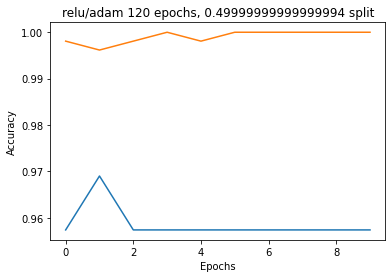

25/25 [==============================] - 0s 4ms/step - loss: 0.1449 - sparse_categorical_accuracy: 0.9693
Generation 8: 
Test Data:[0.14487680792808533, 0.9692701697349548], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.1449 - sparse_categorical_accuracy: 0.9693


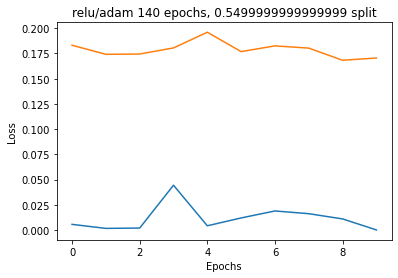

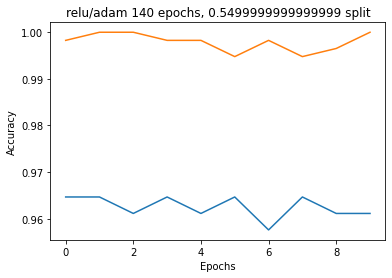

22/22 [==============================] - 0s 4ms/step - loss: 0.1563 - sparse_categorical_accuracy: 0.9602
Generation 8: 
Test Data:[0.15626583993434906, 0.9601706862449646], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.1563 - sparse_categorical_accuracy: 0.9602


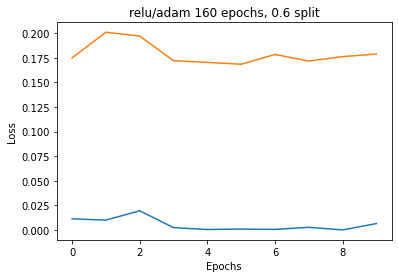

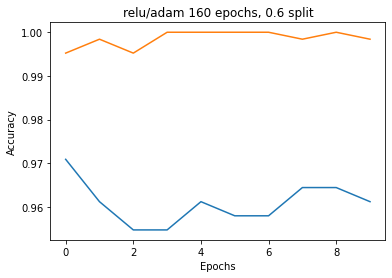

20/20 [==============================] - 0s 5ms/step - loss: 0.1276 - sparse_categorical_accuracy: 0.9728
Generation 8: 
Test Data:[0.12764877080917358, 0.9727563858032227], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 4ms/step - loss: 0.1276 - sparse_categorical_accuracy: 0.9728


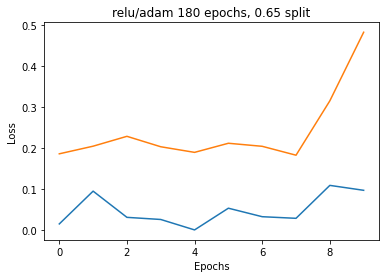

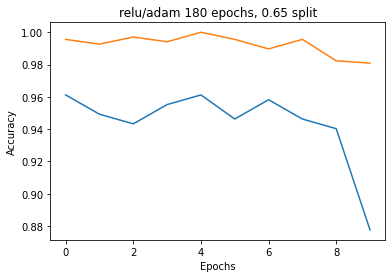

18/18 [==============================] - 0s 4ms/step - loss: 0.5338 - sparse_categorical_accuracy: 0.8883
Generation 8: 
Test Data:[0.5338043570518494, 0.8882783651351929], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.5338 - sparse_categorical_accuracy: 0.8883


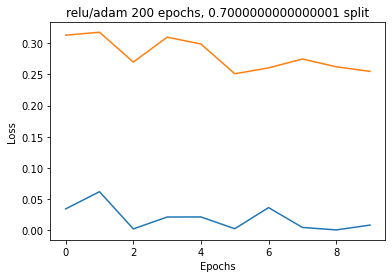

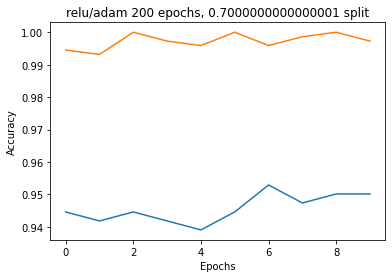

15/15 [==============================] - 0s 4ms/step - loss: 0.2804 - sparse_categorical_accuracy: 0.9509
Generation 8: 
Test Data:[0.28040841221809387, 0.9508547186851501], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.2804 - sparse_categorical_accuracy: 0.9509


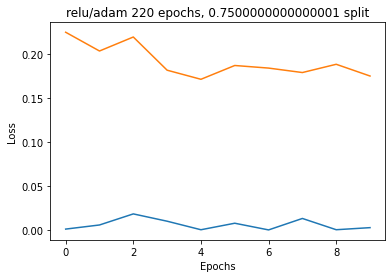

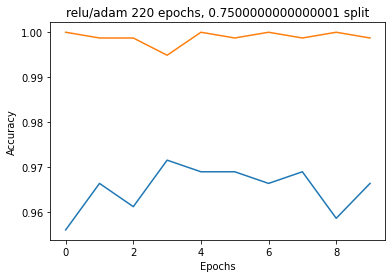

13/13 [==============================] - 0s 5ms/step - loss: 0.1750 - sparse_categorical_accuracy: 0.9564
Generation 8: 
Test Data:[0.17495372891426086, 0.9564102292060852], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.1750 - sparse_categorical_accuracy: 0.9564


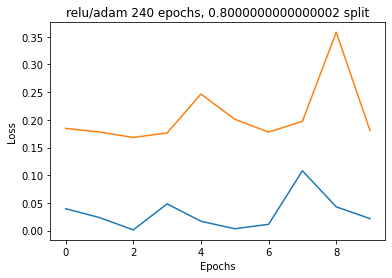

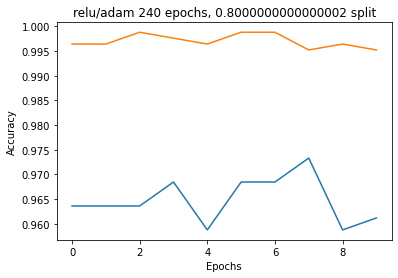

10/10 [==============================] - 0s 4ms/step - loss: 0.2368 - sparse_categorical_accuracy: 0.9519
Generation 8: 
Test Data:[0.23675072193145752, 0.9519230723381042], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.2368 - sparse_categorical_accuracy: 0.9519


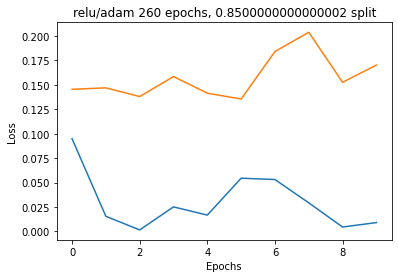

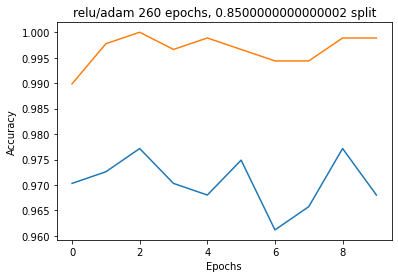

8/8 [==============================] - 0s 4ms/step - loss: 0.2605 - sparse_categorical_accuracy: 0.9402
Generation 8: 
Test Data:[0.26046815514564514, 0.94017094373703], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.2605 - sparse_categorical_accuracy: 0.9402


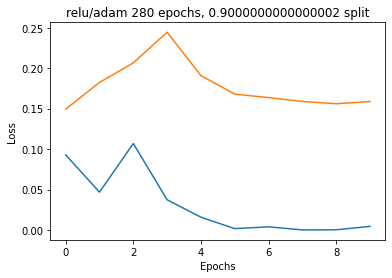

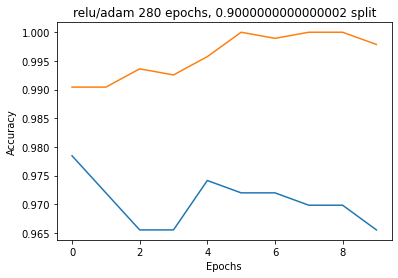

5/5 [==============================] - 0s 5ms/step - loss: 0.2761 - sparse_categorical_accuracy: 0.9231
Generation 8: 
Test Data:[0.2761383652687073, 0.9230769276618958], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.2761 - sparse_categorical_accuracy: 0.9231


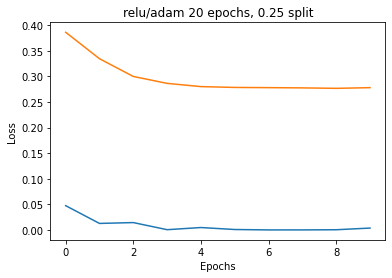

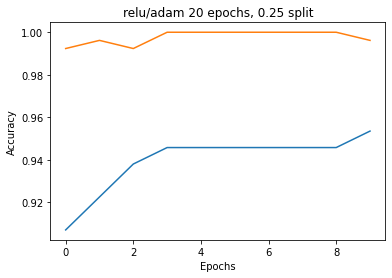

37/37 [==============================] - 0s 4ms/step - loss: 0.0446 - sparse_categorical_accuracy: 0.9897
Generation 9: 
Test Data:[0.04463770240545273, 0.9897435903549194], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.0446 - sparse_categorical_accuracy: 0.9897


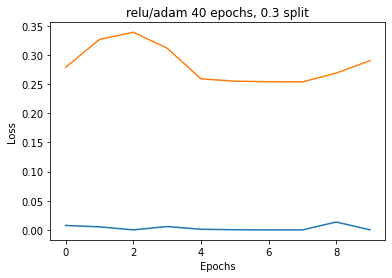

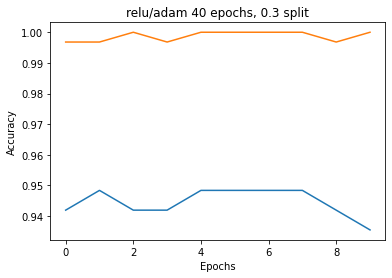

35/35 [==============================] - 0s 4ms/step - loss: 0.0543 - sparse_categorical_accuracy: 0.9863
Generation 9: 
Test Data:[0.054266054183244705, 0.9862637519836426], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.0543 - sparse_categorical_accuracy: 0.9863


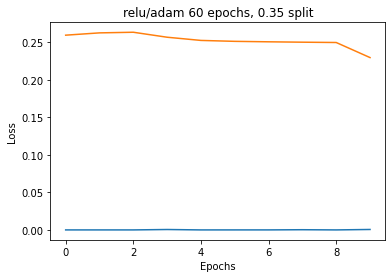

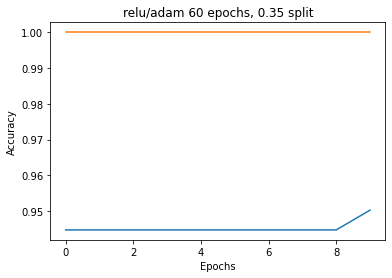

32/32 [==============================] - 0s 5ms/step - loss: 0.0614 - sparse_categorical_accuracy: 0.9852
Generation 9: 
Test Data:[0.061358194798231125, 0.9852070808410645], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.0614 - sparse_categorical_accuracy: 0.9852


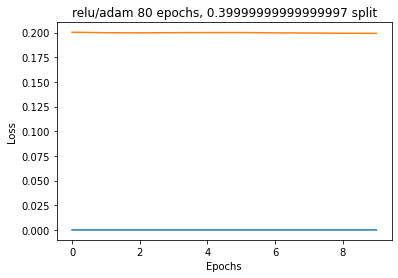

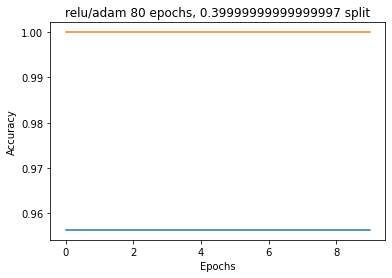

30/30 [==============================] - 0s 4ms/step - loss: 0.0716 - sparse_categorical_accuracy: 0.9850
Generation 9: 
Test Data:[0.07159311324357986, 0.9850427508354187], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.0716 - sparse_categorical_accuracy: 0.9850


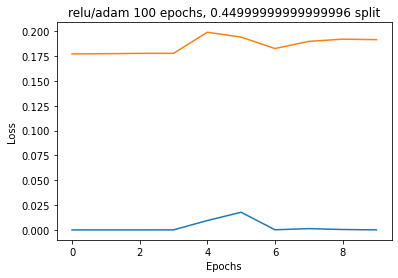

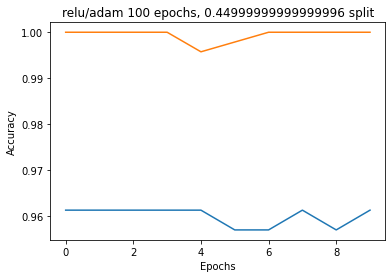

27/27 [==============================] - 0s 4ms/step - loss: 0.0860 - sparse_categorical_accuracy: 0.9825
Generation 9: 
Test Data:[0.08603727072477341, 0.9825378060340881], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 5ms/step - loss: 0.0860 - sparse_categorical_accuracy: 0.9825


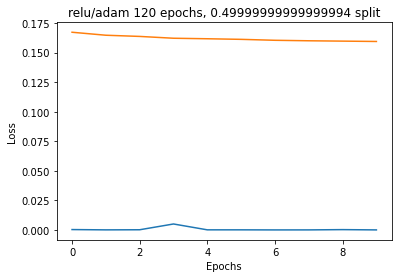

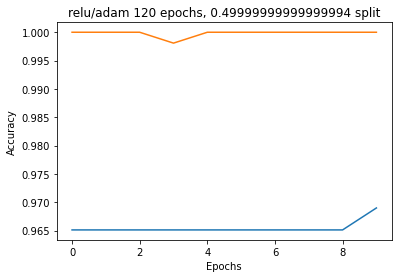

25/25 [==============================] - 0s 4ms/step - loss: 0.0843 - sparse_categorical_accuracy: 0.9782
Generation 9: 
Test Data:[0.08428110182285309, 0.9782330393791199], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 5ms/step - loss: 0.0843 - sparse_categorical_accuracy: 0.9782


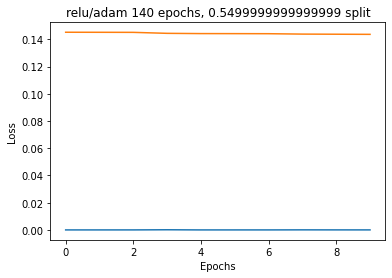

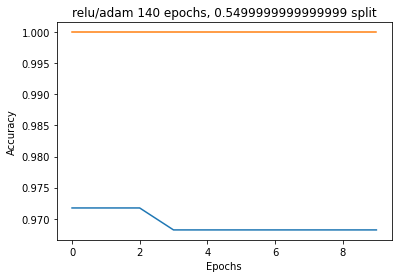

22/22 [==============================] - 0s 4ms/step - loss: 0.0917 - sparse_categorical_accuracy: 0.9758
Generation 9: 
Test Data:[0.09172022342681885, 0.9758179187774658], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.0917 - sparse_categorical_accuracy: 0.9758


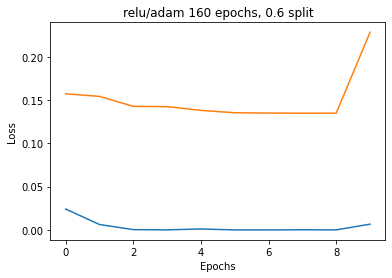

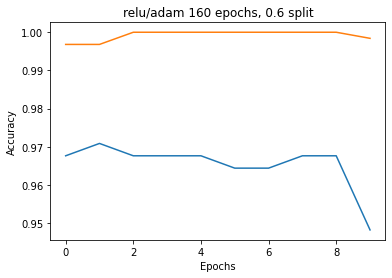

20/20 [==============================] - 0s 4ms/step - loss: 0.1689 - sparse_categorical_accuracy: 0.9583
Generation 9: 
Test Data:[0.16885483264923096, 0.9583333134651184], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 5ms/step - loss: 0.1689 - sparse_categorical_accuracy: 0.9583


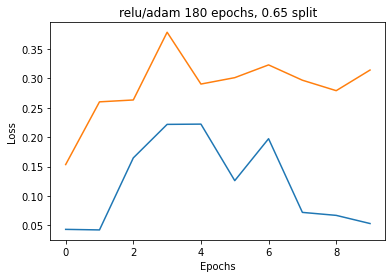

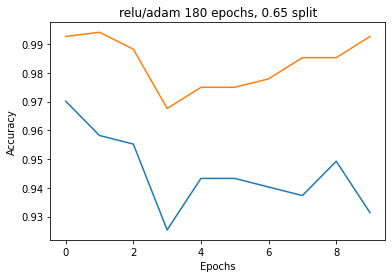

18/18 [==============================] - 0s 4ms/step - loss: 0.2446 - sparse_categorical_accuracy: 0.9396
Generation 9: 
Test Data:[0.24455992877483368, 0.9395604133605957], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.2446 - sparse_categorical_accuracy: 0.9396


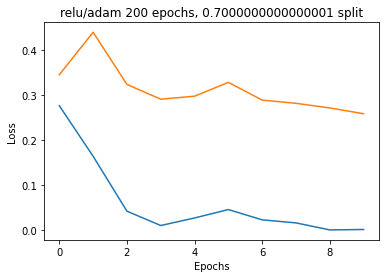

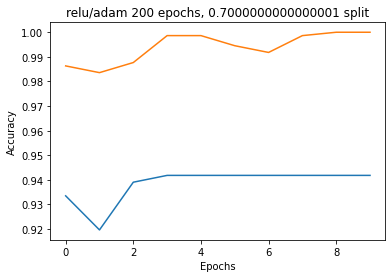

15/15 [==============================] - 0s 5ms/step - loss: 0.2196 - sparse_categorical_accuracy: 0.9637
Generation 9: 
Test Data:[0.21960489451885223, 0.9636752009391785], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.2196 - sparse_categorical_accuracy: 0.9637


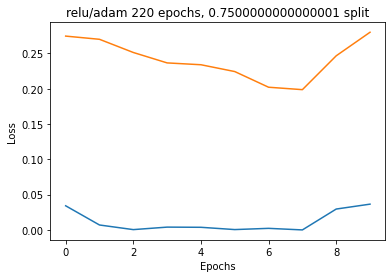

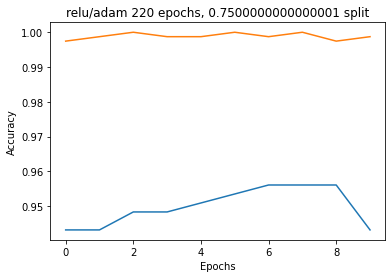

13/13 [==============================] - 0s 4ms/step - loss: 0.2116 - sparse_categorical_accuracy: 0.9692
Generation 9: 
Test Data:[0.21158939599990845, 0.9692307710647583], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.2116 - sparse_categorical_accuracy: 0.9692


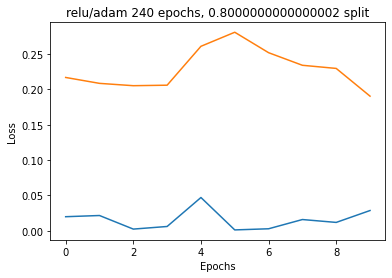

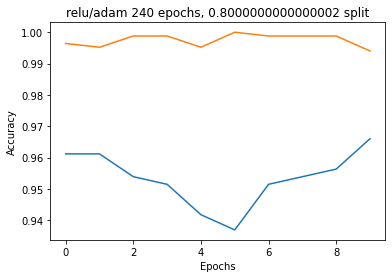

10/10 [==============================] - 0s 5ms/step - loss: 0.2110 - sparse_categorical_accuracy: 0.9615
Generation 9: 
Test Data:[0.21100474894046783, 0.9615384340286255], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 5ms/step - loss: 0.2110 - sparse_categorical_accuracy: 0.9615


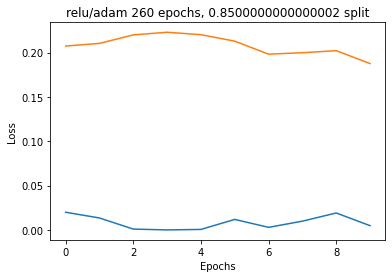

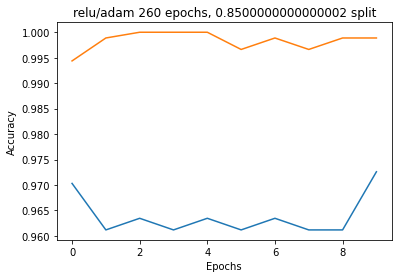

8/8 [==============================] - 0s 4ms/step - loss: 0.1979 - sparse_categorical_accuracy: 0.9573
Generation 9: 
Test Data:[0.19789902865886688, 0.9572649598121643], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 5ms/step - loss: 0.1979 - sparse_categorical_accuracy: 0.9573


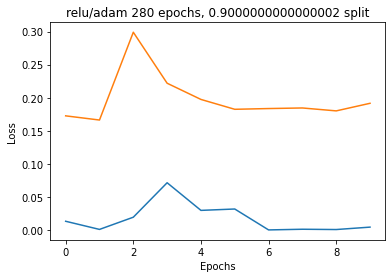

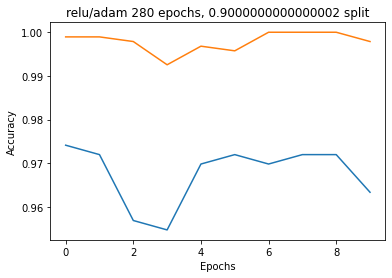

5/5 [==============================] - 0s 4ms/step - loss: 0.2572 - sparse_categorical_accuracy: 0.9231
Generation 9: 
Test Data:[0.2571726143360138, 0.9230769276618958], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.2572 - sparse_categorical_accuracy: 0.9231


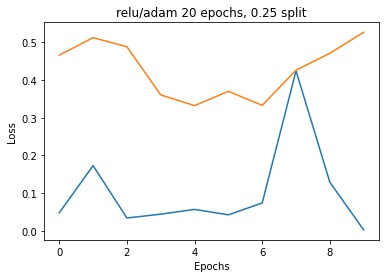

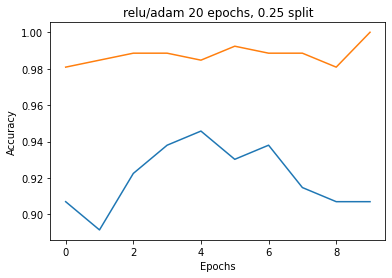

37/37 [==============================] - 0s 4ms/step - loss: 0.1336 - sparse_categorical_accuracy: 0.9769
Generation 10: 
Test Data:[0.1336488425731659, 0.9769230484962463], 
Epochs:20, 
Train/Test Split:0.25
37/37 [==============================] - 0s 4ms/step - loss: 0.1336 - sparse_categorical_accuracy: 0.9769


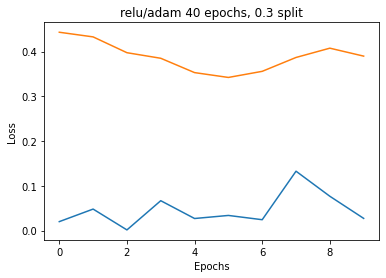

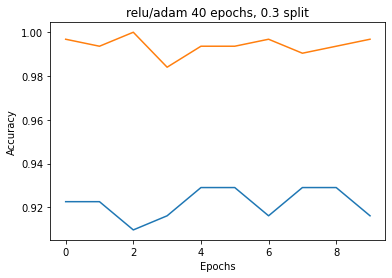

35/35 [==============================] - 0s 4ms/step - loss: 0.1363 - sparse_categorical_accuracy: 0.9679
Generation 10: 
Test Data:[0.13631795346736908, 0.9679487347602844], 
Epochs:40, 
Train/Test Split:0.3
35/35 [==============================] - 0s 4ms/step - loss: 0.1363 - sparse_categorical_accuracy: 0.9679


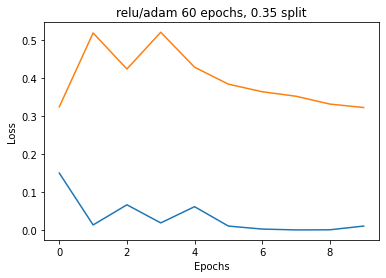

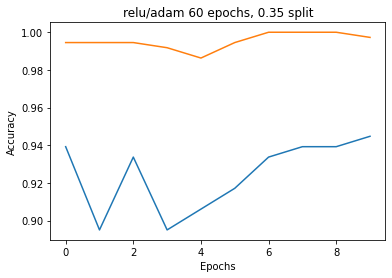

32/32 [==============================] - 0s 4ms/step - loss: 0.1001 - sparse_categorical_accuracy: 0.9783
Generation 10: 
Test Data:[0.10013709217309952, 0.9783037304878235], 
Epochs:60, 
Train/Test Split:0.35
32/32 [==============================] - 0s 4ms/step - loss: 0.1001 - sparse_categorical_accuracy: 0.9783


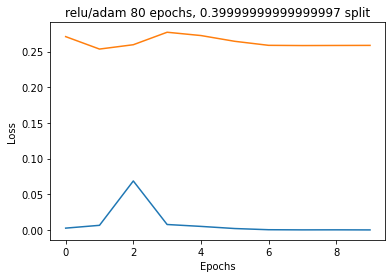

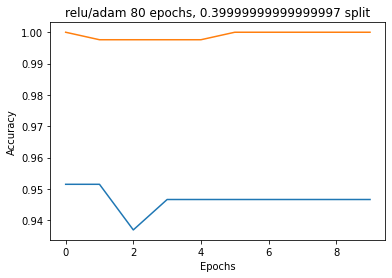

30/30 [==============================] - 0s 4ms/step - loss: 0.0838 - sparse_categorical_accuracy: 0.9872
Generation 10: 
Test Data:[0.08378313481807709, 0.9871794581413269], 
Epochs:80, 
Train/Test Split:0.39999999999999997
30/30 [==============================] - 0s 4ms/step - loss: 0.0838 - sparse_categorical_accuracy: 0.9872


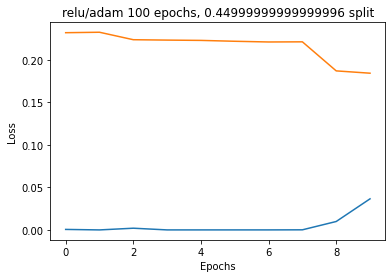

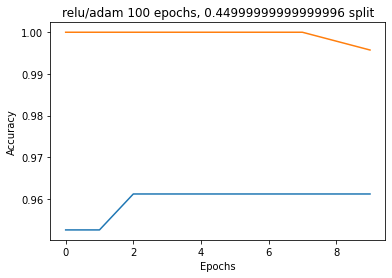

27/27 [==============================] - 0s 4ms/step - loss: 0.0855 - sparse_categorical_accuracy: 0.9814
Generation 10: 
Test Data:[0.08554088324308395, 0.98137366771698], 
Epochs:100, 
Train/Test Split:0.44999999999999996
27/27 [==============================] - 0s 4ms/step - loss: 0.0855 - sparse_categorical_accuracy: 0.9814


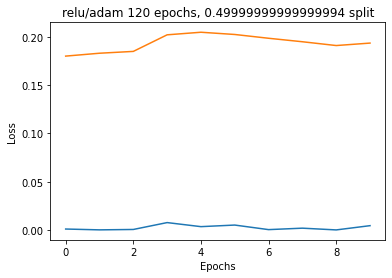

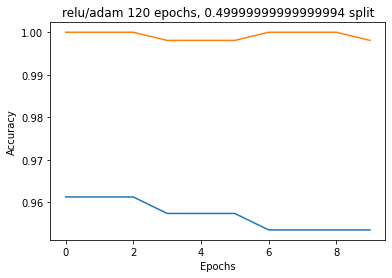

25/25 [==============================] - 0s 4ms/step - loss: 0.0909 - sparse_categorical_accuracy: 0.9821
Generation 10: 
Test Data:[0.09085582196712494, 0.9820742607116699], 
Epochs:120, 
Train/Test Split:0.49999999999999994
25/25 [==============================] - 0s 4ms/step - loss: 0.0909 - sparse_categorical_accuracy: 0.9821


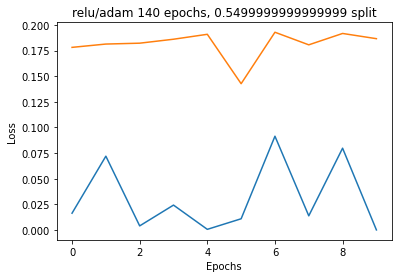

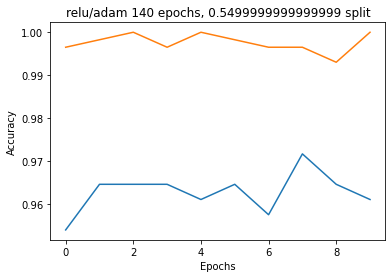

22/22 [==============================] - 0s 4ms/step - loss: 0.1152 - sparse_categorical_accuracy: 0.9844
Generation 10: 
Test Data:[0.11519797891378403, 0.9843527674674988], 
Epochs:140, 
Train/Test Split:0.5499999999999999
22/22 [==============================] - 0s 4ms/step - loss: 0.1152 - sparse_categorical_accuracy: 0.9844


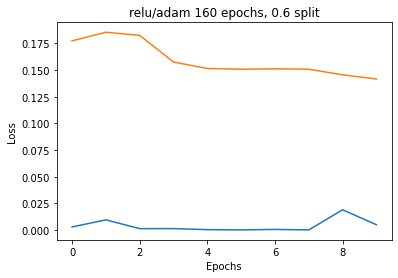

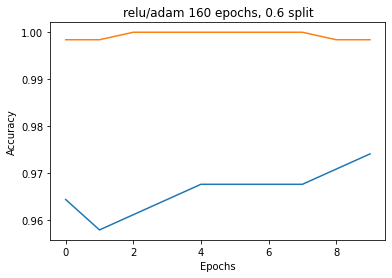

20/20 [==============================] - 0s 5ms/step - loss: 0.1195 - sparse_categorical_accuracy: 0.9776
Generation 10: 
Test Data:[0.11950025707483292, 0.9775640964508057], 
Epochs:160, 
Train/Test Split:0.6
20/20 [==============================] - 0s 5ms/step - loss: 0.1195 - sparse_categorical_accuracy: 0.9776


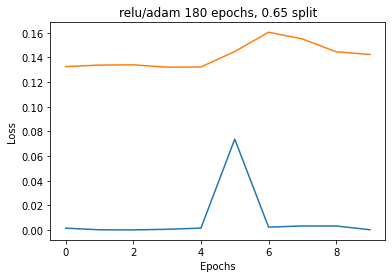

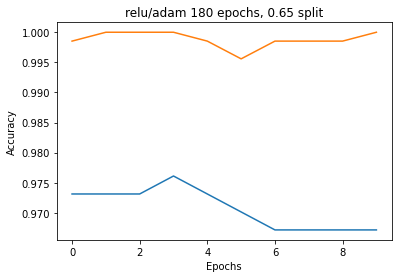

18/18 [==============================] - 0s 4ms/step - loss: 0.1342 - sparse_categorical_accuracy: 0.9762
Generation 10: 
Test Data:[0.13424240052700043, 0.976190447807312], 
Epochs:180, 
Train/Test Split:0.65
18/18 [==============================] - 0s 4ms/step - loss: 0.1342 - sparse_categorical_accuracy: 0.9762


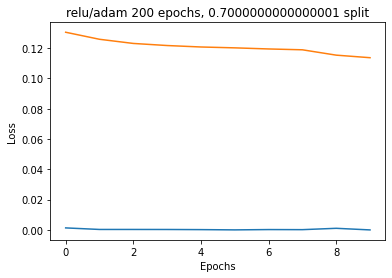

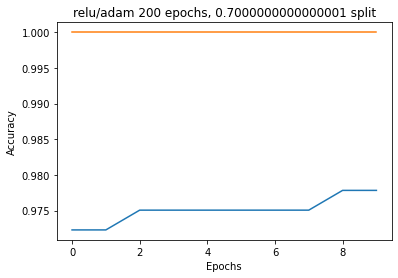

15/15 [==============================] - 0s 4ms/step - loss: 0.1279 - sparse_categorical_accuracy: 0.9744
Generation 10: 
Test Data:[0.12793707847595215, 0.9743589758872986], 
Epochs:200, 
Train/Test Split:0.7000000000000001
15/15 [==============================] - 0s 4ms/step - loss: 0.1279 - sparse_categorical_accuracy: 0.9744


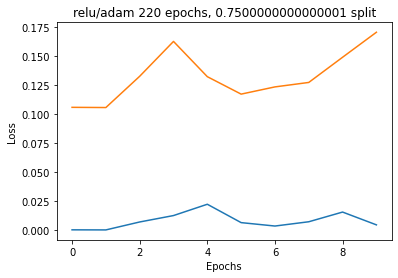

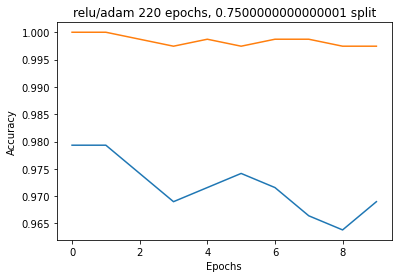

13/13 [==============================] - 0s 4ms/step - loss: 0.2173 - sparse_categorical_accuracy: 0.9667
Generation 10: 
Test Data:[0.21734164655208588, 0.9666666388511658], 
Epochs:220, 
Train/Test Split:0.7500000000000001
13/13 [==============================] - 0s 4ms/step - loss: 0.2173 - sparse_categorical_accuracy: 0.9667


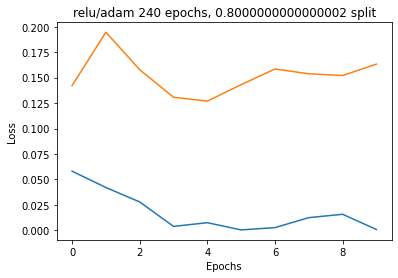

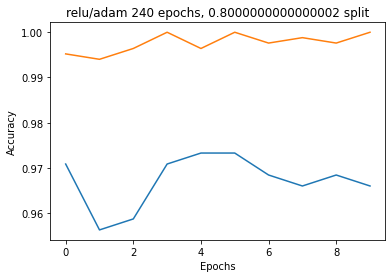

10/10 [==============================] - 0s 4ms/step - loss: 0.2408 - sparse_categorical_accuracy: 0.9551
Generation 10: 
Test Data:[0.2407623678445816, 0.9551281929016113], 
Epochs:240, 
Train/Test Split:0.8000000000000002
10/10 [==============================] - 0s 4ms/step - loss: 0.2408 - sparse_categorical_accuracy: 0.9551


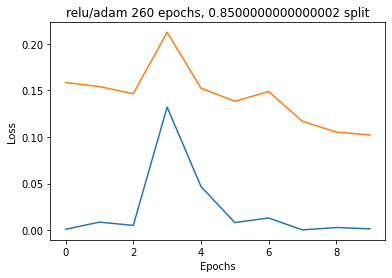

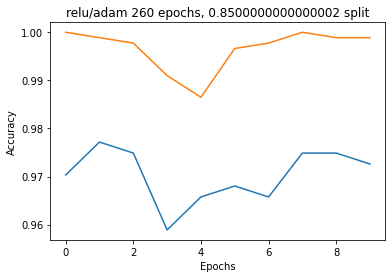

8/8 [==============================] - 0s 5ms/step - loss: 0.3033 - sparse_categorical_accuracy: 0.9530
Generation 10: 
Test Data:[0.30331164598464966, 0.9529914259910583], 
Epochs:260, 
Train/Test Split:0.8500000000000002
8/8 [==============================] - 0s 4ms/step - loss: 0.3033 - sparse_categorical_accuracy: 0.9530


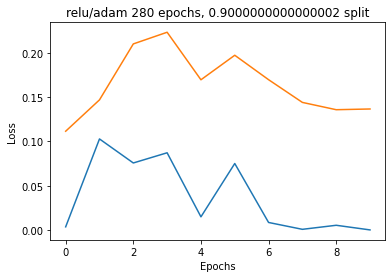

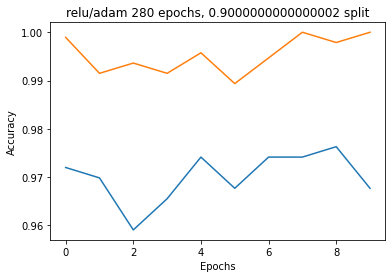

5/5 [==============================] - 0s 5ms/step - loss: 0.2705 - sparse_categorical_accuracy: 0.9487
Generation 10: 
Test Data:[0.2705162763595581, 0.9487179517745972], 
Epochs:280, 
Train/Test Split:0.9000000000000002
5/5 [==============================] - 0s 4ms/step - loss: 0.2705 - sparse_categorical_accuracy: 0.9487


In [111]:
model = buildModel('relu','adam', normalize=False)
fitModel(X,y,model,'relu/adam')

In [112]:
model.evaluate(X_Test_Final,y_Test_Final)
model.evaluate(X,y)

49/49 [==============================] - 0s 4ms/step - loss: 0.0778 - sparse_categorical_accuracy: 0.9846


[0.07776026427745819, 0.9846153855323792]